## Preamble

### imports

In [3]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import Adam, SGD
from torch.nn.modules.loss import MSELoss
from tqdm import trange, tqdm #
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from os.path import join
from core.utils.plot_utils import saveallforms
from core.gaussian_mixture_lib import GaussianMixture, GaussianMixture_torch
from sklearn.cluster import KMeans, MiniBatchKMeans
from torchvision.utils import save_image, make_grid

### Denoising loss and GMM ansatz score

In [5]:

def marginal_prob_std(t, sigma):
  """Note that this std -> 0, when t->0
  So it's not numerically stable to sample t=0 in the dataset
  Note an earlier version missed the sqrt...
  """
  return torch.sqrt( (sigma**(2*t) - 1) / 2 / torch.log(torch.tensor(sigma)) ) # sqrt fixed Jun.19


def denoise_loss_fn(model, x, marginal_prob_std_f, eps=1e-5):
  """The loss function for training score-based generative models.

  Args:
    model: A PyTorch model instance that represents a
      time-dependent score-based model.
    x: A mini-batch of training data.
    marginal_prob_std: A function that gives the standard deviation of
      the perturbation kernel.
    eps: A tolerance value for numerical stability, sample t uniformly from [eps, 1.0]
  """
  random_t = torch.rand(x.shape[0], device=x.device) * (1. - eps) + eps
  z = torch.randn_like(x)
  std = marginal_prob_std_f(random_t,)
  perturbed_x = x + z * std[:, None]
  score = model(perturbed_x, random_t)
  loss = torch.mean(torch.sum((score * std[:, None] + z)**2, dim=(1)))
  return loss


def denoise_loss_fn_fixt(model, x, marginal_prob_std_f, t):
  """The loss function for individual time t. 
  Used for evaluating the score model at a fixed time t.

  Args:
    model: A PyTorch model instance that represents a
      time-dependent score-based model.
    x: A mini-batch of training data.
    marginal_prob_std: A function that gives the standard deviation of
      the perturbation kernel.
    t: Time, scalar in [eps, 1], note that t=0 is not numerically stable.
  """
  fix_t = torch.ones(x.shape[0], device=x.device) * t
  z = torch.randn_like(x)
  std = marginal_prob_std_f(fix_t,)
  perturbed_x = x + z * std[:, None]
  score = model(perturbed_x, fix_t)
  loss = torch.mean(torch.sum((score * std[:, None] + z)**2, dim=(1)))
  return loss


def eval_score_td(X_train_tsr, score_model_td,
                   sigma=25,
                   nepochs=20,
                   eps=1E-3,
                   batch_size=None,
                   device="cpu",):
    ndim = X_train_tsr.shape[1]
    score_model_td.to(device)
    X_train_tsr = X_train_tsr.to(device)
    marginal_prob_std_f = lambda t: marginal_prob_std(t, sigma)
    pbar = trange(nepochs)
    score_model_td.eval()
    loss_traj = []
    for ep in pbar:
        if batch_size is None:
            with torch.no_grad():
                loss = denoise_loss_fn(score_model_td, X_train_tsr, marginal_prob_std_f, eps=eps)
        else:
            idx = torch.randint(0, X_train_tsr.shape[0], (batch_size,))
            with torch.no_grad():
                loss = denoise_loss_fn(score_model_td, X_train_tsr[idx], marginal_prob_std_f, eps=eps)

        pbar.set_description(f"step {ep} loss {loss.item():.3f}")
        loss_traj.append(loss.item())
    return loss_traj
  

def eval_score_td_fixt(X_train_tsr, score_model_td, time, 
                    sigma=25,
                    nepochs=20,
                    batch_size=None,
                    device="cpu",):
      assert time > 0 
      ndim = X_train_tsr.shape[1]
      score_model_td.to(device)
      X_train_tsr = X_train_tsr.to(device)
      marginal_prob_std_f = lambda t: marginal_prob_std(t, sigma)
      pbar = trange(nepochs)
      score_model_td.eval()
      loss_traj = []
      for ep in pbar:
          if batch_size is None:
              with torch.no_grad():
                  loss = denoise_loss_fn_fixt(score_model_td, X_train_tsr, marginal_prob_std_f, time)
          else:
              idx = torch.randint(0, X_train_tsr.shape[0], (batch_size,))
              with torch.no_grad():
                  loss = denoise_loss_fn_fixt(score_model_td, X_train_tsr[idx], marginal_prob_std_f, time)
  
          pbar.set_description(f"step {ep} loss {loss.item():.3f}")
          loss_traj.append(loss.item())
      return loss_traj

In [6]:
def gaussian_mixture_score_batch_sigma_torch(x, mus, Us, Lambdas, weights=None):
    """
    Evaluate log probability and score of a Gaussian mixture model in PyTorch
    :param x: [N batch,N dim]
    :param mus: [N comp, N dim]
    :param Us: [N comp, N dim, N dim]
    :param Lambdas: [N batch, N comp, N dim]
    :param weights: [N comp,] or None
    :return:
    """
    if Lambdas.ndim == 2:
        Lambdas = Lambdas[None, :, :]
    ndim = x.shape[-1]
    logdetSigmas = torch.sum(torch.log(Lambdas), dim=-1)  # [N batch, N comp,]
    residuals = (x[:, None, :] - mus[None, :, :])  # [N batch, N comp, N dim]
    rot_residuals = torch.einsum("BCD,CDE->BCE", residuals, Us)  # [N batch, N comp, N dim]
    MHdists = torch.sum(rot_residuals ** 2 / Lambdas, dim=-1)  # [N batch, N comp]
    logprobs = -0.5 * (logdetSigmas + MHdists)  # [N batch, N comp]
    if weights is not None:
        logprobs += torch.log(weights)  # - 0.5 * ndim * torch.log(2 * torch.pi)  # [N batch, N comp]
    participance = F.softmax(logprobs, dim=-1)  # [N batch, N comp]
    compo_score_vecs = torch.einsum("BCD,CED->BCE", - (rot_residuals / Lambdas),
                                    Us)  # [N batch, N comp, N dim]
    score_vecs = torch.einsum("BC,BCE->BE", participance, compo_score_vecs)  # [N batch, N dim]
    return score_vecs


def gaussian_mixture_lowrank_score_batch_sigma_torch(x,
                 mus, Us, Lambdas, sigma, weights=None):
    """
    Evaluate log probability and score of a Gaussian mixture model in PyTorch
    :param x: [N batch,N dim]
    :param mus: [N comp, N dim]
    :param Us: [N comp, N dim, N rank]
    :param Lambdas: [N comp, N rank]
    :param sigma: [N batch,] or []
    :param weights: [N comp,] or None
    :return:
    """
    if Lambdas.ndim == 2:
        Lambdas = Lambdas[None, :, :]
    ndim = x.shape[-1]
    nrank = Us.shape[-1]
    logdetSigmas = torch.sum(torch.log(Lambdas + sigma[:, None, None] ** 2), dim=-1)  # [N batch, N comp,]
    logdetSigmas += (ndim - nrank) * 2 * torch.log(sigma)[:, None]  # [N batch, N comp,]
    residuals = (x[:, None, :] - mus[None, :, :])  # [N batch, N comp, N dim]
    residual_sqnorm = torch.sum(residuals ** 2, dim=-1)  # [N batch, N comp]
    Lambda_tilde = Lambdas / (Lambdas + sigma[:, None, None] ** 2)  # [N batch, N comp, N rank]
    rot_residuals = torch.einsum("BCD,CDE->BCE", residuals, Us)  # [N batch, N comp, N dim]
    MHdists_lowrk = torch.sum(rot_residuals ** 2 * Lambda_tilde, dim=-1)  # [N batch, N comp]
    logprobs = -0.5 * (logdetSigmas +
                       (residual_sqnorm - MHdists_lowrk) / sigma[:, None] ** 2)  # [N batch, N comp]
    if weights is not None:
        logprobs += torch.log(weights)
    participance = F.softmax(logprobs, dim=-1)  # [N batch, N comp]
    compo_score_vecs = - residuals + torch.einsum("BCD,CED->BCE",
                                    (rot_residuals * Lambda_tilde),
                                    Us)  # [N batch, N comp, N dim]
    score_vecs = torch.einsum("BC,BCE->BE", participance, compo_score_vecs) / (sigma[:, None] ** 2)  # [N batch, N dim]
    return score_vecs


class GMM_ansatz_net(nn.Module):

    def __init__(self, ndim, n_components, sigma=5.0):
        super().__init__()
        self.ndim = ndim
        self.n_components = n_components
        # normalize the weights
        mus = torch.randn(n_components, ndim)
        Us = torch.randn(n_components, ndim, ndim)
        mus = mus / torch.norm(mus, dim=-1, keepdim=True)
        Us = Us / torch.norm(Us, dim=(-2), keepdim=True)
        # TODO: orthonormalize Us
        self.mus = nn.Parameter(mus)
        self.Us = nn.Parameter(Us)
        self.logLambdas = nn.Parameter(torch.randn(n_components, ndim))
        self.logweights = nn.Parameter(torch.log(torch.ones(n_components) / n_components))
        self.marginal_prob_std_f = lambda t: marginal_prob_std(t, sigma)

    def forward(self, x, t):
        """
        x: (batch, ndim)
        sigma: (batch, )
        """
        sigma = self.marginal_prob_std_f(t, )
        return gaussian_mixture_score_batch_sigma_torch(x, self.mus, self.Us,
               self.logLambdas.exp()[None, :, :] + sigma[:, None, None] ** 2, self.logweights.exp())


class GMM_ansatz_net_lowrank(nn.Module):
    def __init__(self, ndim, n_components, n_rank, sigma=5.0):
        super().__init__()
        self.ndim = ndim
        self.n_components = n_components
        # normalize the weights
        mus = torch.randn(n_components, ndim)
        Us = torch.randn(n_components, ndim, n_rank)
        mus = mus / torch.norm(mus, dim=-1, keepdim=True)
        Us = Us / torch.norm(Us, dim=(-2), keepdim=True)
        # TODO: orthonormalize Us
        self.mus = nn.Parameter(mus)
        self.Us = nn.Parameter(Us)
        self.logLambdas = nn.Parameter(torch.randn(n_components, n_rank))
        self.logweights = nn.Parameter(torch.log(torch.ones(n_components) / n_components))
        self.marginal_prob_std_f = lambda t: marginal_prob_std(t, sigma)

    def forward(self, x, t):
        """
        x: (batch, ndim)
        sigma: (batch, )
        """
        sigma = self.marginal_prob_std_f(t, )
        return gaussian_mixture_lowrank_score_batch_sigma_torch(x, self.mus, self.Us,
               self.logLambdas.exp(), sigma[:], self.logweights.exp())


class Gauss_ansatz_net(nn.Module):
    def __init__(self, ndim, n_rank=None, sigma=5.0):
        super().__init__()
        self.ndim = ndim
        # normalize the weights
        mus = torch.randn(ndim)
        if n_rank is None:
            n_rank = ndim
        Us = torch.randn(ndim, n_rank)
        mus = mus / torch.norm(mus, dim=-1, keepdim=True)
        Us = Us / torch.norm(Us, dim=(-2), keepdim=True)
        # TODO: orthonormalize Us
        self.mus = nn.Parameter(mus)
        self.Us = nn.Parameter(Us)
        self.logLambdas = nn.Parameter(torch.randn(n_rank))
        self.marginal_prob_std_f = lambda t: marginal_prob_std(t, sigma)

    def forward(self, x, t):
        """
        x: (batch, ndim)
        sigma: (batch, )
        """
        sigma = self.marginal_prob_std_f(t, )
        # ndim = x.shape[-1]
        # nrank = Us.shape[-1]
        residuals = (x[:, :] - self.mus[None, :])  # [N batch, N dim]
        # residual_sqnorm = torch.sum(residuals ** 2, dim=-1)  # [N batch, ]
        Lambdas = self.logLambdas.exp()[None, :]
        Lambda_tilde = Lambdas / (Lambdas + sigma[:, None] ** 2)  # [N batch, N rank]
        rot_residuals = torch.einsum("BD,DE->BE", residuals, self.Us)  # [N batch, N comp, N dim]
        # MHdists_lowrk = torch.sum(rot_residuals ** 2 * Lambda_tilde, dim=-1)  # [N batch, N comp]
        compo_score_vecs = - residuals + torch.einsum("BE,DE->BD",
                              (rot_residuals * Lambda_tilde), self.Us)  # [N batch, N comp, N dim]
        score_vecs = compo_score_vecs / (sigma[:, None] ** 2)  # [N batch, N dim]
        return score_vecs


### Clustering and Local PCA functions

In [7]:
from sklearn.cluster import KMeans, MiniBatchKMeans
def compute_cluster(Xtrain_norm, n_clusters,
                       kmeans_batch=2048, 
                       kmeans_random_seed=0,
                       kmeans_verbose=0,
                       lambda_EPS=1E-5, 
                       store_device="cuda"):
    kmeans = MiniBatchKMeans(n_clusters=n_clusters, 
            random_state=kmeans_random_seed, batch_size=kmeans_batch, verbose=kmeans_verbose)
    kmeans.fit(Xtrain_norm)
    print("Kmeans fitting completing, loss ", kmeans.inertia_)
    # covmats = []
    ndim = Xtrain_norm.shape[1]
    eigval_col = []
    eigvec_col = []
    freq_col = []
    for i in trange(kmeans.n_clusters):
        n_samples = np.sum(kmeans.labels_ == i)
        # print(i, "number of samples", n_samples)
        freq_col.append(n_samples)
        if n_samples == 1:
            covmat = torch.eye(ndim) * lambda_EPS
        else:
            covmat = torch.tensor(np.cov(Xtrain_norm[kmeans.labels_ == i].T))
            # PCA to reduce dimension
            covmat = covmat + lambda_EPS * torch.eye(covmat.shape[0])
        try:
            eigval, eigvec = torch.linalg.eigh(covmat.cuda())
        except:
            print(f"Singular matrix perform eigh on cpu. {n_samples} samples")
            eigval, eigvec = torch.linalg.eigh(covmat)
        
        eigval = eigval.flip(dims=(0,))  # sort from largest to smallest
        eigvec = eigvec.flip(dims=(1,))  # sort from largest to smallest
        eigval = eigval.to(store_device)
        eigvec = eigvec.to(store_device)
        eigval_col.append(eigval.cpu())
        eigvec_col.append(eigvec.cpu())
        # covmats.append(covmat)
    eigval_mat = torch.stack(eigval_col, dim=0)
    eigvec_mat = torch.stack(eigvec_col, dim=0)
    freq_vec = torch.tensor(freq_col)
    center_mat = torch.from_numpy(kmeans.cluster_centers_)
    print("cov PCA completed for each cluster.")
    return kmeans, eigval_mat, eigvec_mat, freq_vec, center_mat


def initialize_gmm_ansatz(eigval_mat, eigvec_mat, freq_vec, center_mat,
                          sigma_max=10, gmm_random_seed=42, n_rank=None, 
                          lambda_EPS=1E-5):
    ndim = center_mat.shape[1]
    n_clusters = center_mat.shape[0]
    torch.manual_seed(gmm_random_seed)
    if n_rank is None:
        gmm_km_cov = GMM_ansatz_net(ndim=ndim,
                    n_components=n_clusters, sigma=sigma_max)
        # Data PC initialization
        gmm_km_cov.logLambdas.data = torch.log(eigval_mat + lambda_EPS).float() #
        gmm_km_cov.Us.data = eigvec_mat.float()
        gmm_km_cov.logweights.data = torch.log(freq_vec / freq_vec.sum())
        gmm_km_cov.mus.data = center_mat.float()
        print("GMM ansatz model initialized.")
    else:
        print("Low rank GMM ansatz")
        assert type(n_rank) == int and n_rank > 0 and n_rank < ndim
        gmm_km_cov = GMM_ansatz_net_lowrank(ndim=ndim,
                    n_components=n_clusters, n_rank=n_rank, sigma=sigma_max)
        
        gmm_km_cov.logLambdas.data = torch.log(eigval_mat + lambda_EPS).float()[:, :n_rank]
        gmm_km_cov.Us.data = eigvec_mat.float()[:, :, :n_rank]
        gmm_km_cov.logweights.data = torch.log(freq_vec / freq_vec.sum())
        gmm_km_cov.mus.data = center_mat.float()
        print("GMM low rank ansatz model initialized.")
    return gmm_km_cov


def kmeans_initialized_gmm(Xtrain, n_clusters, 
                           n_rank=None,
                           kmeans_batch=2048, 
                           kmeans_random_seed=0,
                           kmeans_verbose=0,
                           store_device="cuda",
                           gmm_random_seed=42, 
                           lambda_EPS=1E-5, 
                           sigma_max=10):
    kmeans, eigval_mat, eigvec_mat, freq_vec, center_mat = compute_cluster(Xtrain, n_clusters,
                          kmeans_batch=kmeans_batch, 
                          kmeans_random_seed=kmeans_random_seed,
                          kmeans_verbose=kmeans_verbose,
                          lambda_EPS=lambda_EPS,
                          store_device=store_device)
    gmm_km_cov = initialize_gmm_ansatz(eigval_mat, eigvec_mat, freq_vec, center_mat,
                            sigma_max=sigma_max, gmm_random_seed=gmm_random_seed, n_rank=n_rank, 
                            lambda_EPS=lambda_EPS)
    return gmm_km_cov, kmeans


def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


def eval_score_model(Xtrain_norm, score_model, Nbatch=100, batch_size=2048, sigma_max=10, device="cuda"):
    loss_traj = eval_score_td(Xtrain_norm, 
            score_model, nepochs=Nbatch, batch_size=batch_size, 
            sigma=sigma_max, device=device) # clipnorm=1,
    # 50 full Gaussian GMM with Kmeans mean + cov initialization => 72 loss
    Nparameters = count_parameters(score_model)
    print (f"Average loss {np.mean(loss_traj):.3f}  ({batch_size}x{Nbatch} pnts)")
    print("Num of parameters", count_parameters(score_model))
    return np.mean(loss_traj), Nparameters


def eval_score_model_splittime(Xtrain_norm, score_model, time_pnts, Nbatch=100, batch_size=2048, sigma_max=10, device="cuda"):
    loss_time_arr = []
    for time in time_pnts:
        print(f"Time {time:.3f}")
        loss_traj = eval_score_td_fixt(Xtrain_norm, score_model, time, 
                nepochs=Nbatch, batch_size=batch_size, 
                sigma=sigma_max, device=device) # clipnorm=1,
        avg_loss = np.mean(loss_traj)
        loss_time_arr.append(avg_loss)
        print (f"t={time:.3f} Average loss {avg_loss:.3f}  ({batch_size}x{Nbatch} pnts)")
    # 50 full Gaussian GMM with Kmeans mean + cov initialization => 72 loss
    Nparameters = count_parameters(score_model)
    print("Num of parameters", count_parameters(score_model))
    return loss_time_arr, Nparameters

In [8]:
from sklearn.cluster import KMeans, MiniBatchKMeans
def compute_cluster_SVD(Xtrain_norm, n_clusters,
                       kmeans_batch=2048, 
                       kmeans_random_seed=0,
                       kmeans_verbose=0,
                       lambda_EPS=1E-5,
                       store_device="cuda"):
    ndim = Xtrain_norm.shape[1]
    kmeans = MiniBatchKMeans(n_clusters=n_clusters, 
            random_state=kmeans_random_seed, batch_size=kmeans_batch, verbose=kmeans_verbose)
    kmeans.fit(Xtrain_norm)
    print("Kmeans fitting completing, loss ", kmeans.inertia_)
    # covmats = []
    eigval_col = []
    eigvec_col = []
    freq_col = []
    for i in trange(kmeans.n_clusters):
        Xcluster = Xtrain_norm[kmeans.labels_ == i]
        n_samples = np.sum(kmeans.labels_ == i)
        # print(i, "number of samples", n_samples)
        freq_col.append(n_samples)
        
        if n_samples == 1:
            # covmat = torch.eye(ndim) * lambda_EPS
            eigval = torch.ones(ndim) * lambda_EPS
            eigvec = torch.eye(ndim)
        else:
            q_rank = min(n_samples, ndim)
            _, S_pc, V_pc = torch.pca_lowrank(Xcluster.cuda(), q=q_rank)
            eigval_pc = S_pc**2 / (n_samples - 1)
            eigvec_pc = V_pc
            raise ValueError("Not implemented")
            # covmat = torch.tensor(np.cov(Xtrain_norm[kmeans.labels_ == i].T))
            # # PCA to reduce dimension
            # covmat = covmat + lambda_EPS * torch.eye(covmat.shape[0])
        # try:
        #     eigval, eigvec = torch.linalg.eigh(covmat.to(torch.float64).cuda())
        # except:
        #     print(f"Singular matrix perform eigh on cpu. {n_samples} samples")
        #     eigval, eigvec = torch.linalg.eigh(covmat.to(torch.float64))

        # eigval = eigval.flip(dims=(0,))  # sort from largest to smallest
        # eigvec = eigvec.flip(dims=(1,))  # sort from largest to smallest
        # PCA output is top to bottom, no need to flip
        eigval = eigval.to(store_device) 
        eigvec = eigvec.to(store_device)
        eigval_col.append(eigval)
        eigvec_col.append(eigvec)
        # covmats.append(covmat)
    eigval_mat = torch.stack(eigval_col, dim=0)
    eigvec_mat = torch.stack(eigvec_col, dim=0)
    freq_vec = torch.tensor(freq_col)
    center_mat = torch.from_numpy(kmeans.cluster_centers_)
    print("cov PCA completed for each cluster.")
    return kmeans, eigval_mat, eigvec_mat, freq_vec, center_mat

### Scratch zone for alternative svd

In [ ]:
(X_train_tsr.cuda() - X_train_tsr.mean(0).cuda()).shape

torch.Size([50000, 3072])

In [ ]:
eigvals_cov, eigvecs_cov = torch.linalg.eigh(torch.cov(X_train_tsr.cuda().T))
eigvals_cov = eigvals_cov.flip(dims=(0,))
eigvecs_cov = eigvecs_cov.flip(dims=(1,))

In [ ]:
U_pc, S_pc, V_pc = torch.pca_lowrank(X_train_tsr.cuda(), q=3072)
eigvals = S_pc**2 / (X_train_tsr.shape[0] - 1)
eigvecs = V_pc

In [ ]:
U_svd, S_svd, V_svd = torch.svd(X_train_tsr[:100].cuda()- X_train_tsr.mean(0).cuda(), some=True)
eigvals_svd = S_svd**2 / (X_train_tsr.shape[0] - 1)
eigvecs_svd = V_svd

In [ ]:
VQ_svd, VR_svd = torch.linalg.qr(V_svd, mode="complete")

In [ ]:
VQ_svd.shape

torch.Size([3072, 3072])

In [ ]:
VR_svd[:5,:5]

tensor([[-1.0000e+00, -1.4305e-06, -5.5972e-07, -7.2084e-07, -6.3423e-07],
        [ 0.0000e+00,  9.9999e-01, -9.2108e-07,  5.5879e-07,  6.3516e-07],
        [ 0.0000e+00,  0.0000e+00,  1.0000e+00, -4.7311e-07,  4.0419e-07],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e+00, -2.8312e-06],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -9.9999e-01]],
       device='cuda:0')

In [ ]:
V_svd[:,3]

tensor([ 0.0223,  0.0185,  0.0216,  ..., -0.0176, -0.0180, -0.0200],
       device='cuda:0')

In [ ]:
VQ_svd[:,3]

tensor([-0.0223, -0.0185, -0.0216,  ...,  0.0176,  0.0180,  0.0200],
       device='cuda:0')

In [ ]:
U_one.sum()

tensor(1., device='cuda:0')

In [ ]:
eigvals

tensor([2.2144e+02, 8.5703e+01, 5.0996e+01,  ..., 6.5981e-06, 6.4477e-06,
        6.3587e-06], device='cuda:0')

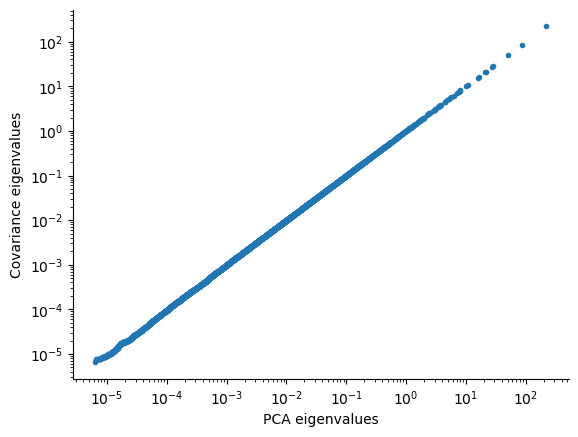

In [ ]:
plt.loglog(eigvals.cpu(), eigvals_cov.cpu(), ".")
plt.xlabel("PCA eigenvalues")
plt.ylabel("Covariance eigenvalues")
plt.show()

In [ ]:
img_shape = train_data.shape[1:]
X_train_tsr = train_data.view(-1, np.prod(img_shape))
X_test_tsr = test_data.view(-1, np.prod(img_shape))

In [ ]:
U, S, V = torch.linalg.svd(X_train_tsr)
# Normalize the singular values
S_normalized = S / torch.sqrt(torch.sum(S**2))

# Compute the principal components
PC = torch.matmul(U, torch.diag(S_normalized))


## GMM Score for CIFAR

### Load Image Dataset: CIFAR

In [8]:
import torch
import torchvision
import torchvision.transforms as transforms

# Define the transform to normalize the data
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# Load the CIFAR-10 dataset
trainset = torchvision.datasets.CIFAR10(root='~/Datasets', train=True, download=True, transform=transform)
testset = torchvision.datasets.CIFAR10(root='~/Datasets', train=False, download=True, transform=transform)

# Create a big tensor to store the data
train_data = torch.stack([data for data, _ in trainset], dim=0)
test_data = torch.stack([data for data, _ in testset], dim=0)

# Print the shape of the big tensors
print("Train data shape:", train_data.shape)
print("Test data shape:", test_data.shape)

img_shape = train_data.shape[1:]
X_train_tsr = train_data.view(-1, np.prod(img_shape))
X_test_tsr = test_data.view(-1, np.prod(img_shape))

Files already downloaded and verified
Files already downloaded and verified
Train data shape: torch.Size([50000, 3, 32, 32])
Test data shape: torch.Size([10000, 3, 32, 32])


In [7]:
kmeans = MiniBatchKMeans(n_clusters=100, random_state=0, batch_size=2048, verbose=1)
kmeans.fit(X_train_tsr.numpy())

/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Init 1/3 with method k-means++
Inertia for init 1/3: 3302652.25
Init 2/3 with method k-means++
Inertia for init 2/3: 3332946.0
Init 3/3 with method k-means++
Inertia for init 3/3: 3310792.25
[MiniBatchKMeans] Reassigning 11 cluster centers.
Minibatch step 1/2441: mean batch inertia: 533.6673583984375
[MiniBatchKMeans] Reassigning 5 cluster centers.
Minibatch step 2/2441: mean batch inertia: 433.9085693359375, ewa inertia: 433.9085693359375
[MiniBatchKMeans] Reassigning 6 cluster centers.
Minibatch step 3/2441: mean batch inertia: 421.0343322753906, ewa inertia: 432.8539329286657
Minibatch step 4/2441: mean batch inertia: 415.7366638183594, ewa inertia: 431.45171428752224
[MiniBatchKMeans] Reassigning 4 cluster centers.
Minibatch step 5/2441: mean batch inertia: 406.3227844238281, ewa inertia: 429.39319352350367
[MiniBatchKMeans] Reassigning 4 cluster centers.
Minibatch step 6/2441: mean batch inertia: 413.5907287597656, ewa inertia: 428.0986815002987
Minibatch step 7/2441: mean batch i

MiniBatchKMeans(batch_size=2048, n_clusters=100, random_state=0, verbose=1)

### Eval GMM Score Quality

In [22]:
df_col = []
for n_clusters in [1, 5, 10, 20, 50, 100, ]:#150, 200, 500, 1000]:
    kmeans, eigval_mat, eigvec_mat, freq_vec, center_mat = compute_cluster(X_train_tsr, 
                                n_clusters, lambda_EPS=1E-5, store_device="cpu")
    for n_rank in reversed([8, 16, 32, 64, 96, 128, 192, 256, 374, 512, 768, 1024, 1536, 2048, 2560, None]):
        gmm_km_cov = initialize_gmm_ansatz(eigval_mat, eigvec_mat, freq_vec, center_mat,
                        n_rank=n_rank, sigma_max=10, lambda_EPS=1E-5)
        if n_rank is None:
            n_rank = np.prod(img_shape)
        scaling = 1 if n_clusters <= 20 else n_clusters / 20
        print(f"N components {n_clusters} | N rank {n_rank}")
        eval_loss, Nparams = eval_score_model(X_train_tsr, gmm_km_cov, 
                        Nbatch=int(50 * scaling), batch_size=int(2048 / scaling), device="cuda")
        # print(f"Average loss {eval_loss:.3f} | N params {Nparams}")
        df_col.append({"n_clusters": n_clusters, "n_rank": n_rank, "eval_loss": eval_loss, "Nparams": Nparams})
    
df = pd.DataFrame(df_col)
df.to_csv("CIFAR10_gmm_ansatz_kmeans_loss.csv", index=False)

/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  38081515.66691162


100%|██████████| 1/1 [00:06<00:00,  6.66s/it]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 1 | N rank 3072


step 49 loss 155.719: 100%|██████████| 50/50 [00:00<00:00, 168.81it/s]


Average loss 153.995  (2048x50 pnts)
Num of parameters 9443329
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 2560


step 49 loss 156.301: 100%|██████████| 50/50 [00:00<00:00, 193.16it/s]


Average loss 153.926  (2048x50 pnts)
Num of parameters 7869953
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 2048


step 49 loss 155.061: 100%|██████████| 50/50 [00:00<00:00, 219.95it/s]


Average loss 153.721  (2048x50 pnts)
Num of parameters 6296577
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 1536


step 49 loss 156.498: 100%|██████████| 50/50 [00:00<00:00, 266.47it/s]


Average loss 154.115  (2048x50 pnts)
Num of parameters 4723201
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 1024


step 49 loss 161.538: 100%|██████████| 50/50 [00:00<00:00, 341.72it/s]


Average loss 157.249  (2048x50 pnts)
Num of parameters 3149825
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 768


step 49 loss 163.291: 100%|██████████| 50/50 [00:00<00:00, 393.69it/s]


Average loss 163.983  (2048x50 pnts)
Num of parameters 2363137
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 512


step 49 loss 190.961: 100%|██████████| 50/50 [00:00<00:00, 460.81it/s]


Average loss 183.774  (2048x50 pnts)
Num of parameters 1576449
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 374


step 49 loss 221.516: 100%|██████████| 50/50 [00:00<00:00, 498.07it/s]


Average loss 210.292  (2048x50 pnts)
Num of parameters 1152375
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 256


step 49 loss 280.588: 100%|██████████| 50/50 [00:00<00:00, 547.86it/s]


Average loss 255.964  (2048x50 pnts)
Num of parameters 789761
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 192


step 49 loss 358.651: 100%|██████████| 50/50 [00:00<00:00, 578.25it/s]


Average loss 304.993  (2048x50 pnts)
Num of parameters 593089
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 128


step 49 loss 407.338: 100%|██████████| 50/50 [00:00<00:00, 619.40it/s]


Average loss 391.955  (2048x50 pnts)
Num of parameters 396417
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 96


step 49 loss 512.063: 100%|██████████| 50/50 [00:00<00:00, 638.07it/s]


Average loss 466.753  (2048x50 pnts)
Num of parameters 298081
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 64


step 49 loss 677.189: 100%|██████████| 50/50 [00:00<00:00, 661.49it/s]


Average loss 584.743  (2048x50 pnts)
Num of parameters 199745
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 32


step 49 loss 1039.025: 100%|██████████| 50/50 [00:00<00:00, 677.11it/s]


Average loss 836.970  (2048x50 pnts)
Num of parameters 101409
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 16


step 49 loss 1344.274: 100%|██████████| 50/50 [00:00<00:00, 681.58it/s]


Average loss 1167.639  (2048x50 pnts)
Num of parameters 52241
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 8


step 49 loss 1664.772: 100%|██████████| 50/50 [00:00<00:00, 681.53it/s]


Average loss 1569.969  (2048x50 pnts)
Num of parameters 27657


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  26982009.983399592


100%|██████████| 5/5 [00:07<00:00,  1.50s/it]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 5 | N rank 3072


step 49 loss 152.451: 100%|██████████| 50/50 [00:01<00:00, 41.01it/s]


Average loss 150.081  (2048x50 pnts)
Num of parameters 47216645
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 2560


step 49 loss 150.918: 100%|██████████| 50/50 [00:01<00:00, 48.64it/s]


Average loss 149.967  (2048x50 pnts)
Num of parameters 39349765
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 2048


step 49 loss 151.398: 100%|██████████| 50/50 [00:00<00:00, 59.19it/s]


Average loss 149.966  (2048x50 pnts)
Num of parameters 31482885
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 1536


step 49 loss 149.487: 100%|██████████| 50/50 [00:00<00:00, 75.66it/s]


Average loss 149.945  (2048x50 pnts)
Num of parameters 23616005
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 1024


step 49 loss 154.256: 100%|██████████| 50/50 [00:00<00:00, 104.76it/s]


Average loss 152.756  (2048x50 pnts)
Num of parameters 15749125
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 768


step 49 loss 159.015: 100%|██████████| 50/50 [00:00<00:00, 125.06it/s]


Average loss 158.144  (2048x50 pnts)
Num of parameters 11815685
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 512


step 49 loss 177.724: 100%|██████████| 50/50 [00:00<00:00, 171.18it/s]


Average loss 177.313  (2048x50 pnts)
Num of parameters 7882245
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 374


step 49 loss 206.833: 100%|██████████| 50/50 [00:00<00:00, 187.27it/s]


Average loss 201.723  (2048x50 pnts)
Num of parameters 5761875
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 256


step 49 loss 269.093: 100%|██████████| 50/50 [00:00<00:00, 231.81it/s]


Average loss 248.681  (2048x50 pnts)
Num of parameters 3948805
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 192


step 49 loss 325.052: 100%|██████████| 50/50 [00:00<00:00, 245.11it/s]


Average loss 296.049  (2048x50 pnts)
Num of parameters 2965445
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 128


step 49 loss 433.768: 100%|██████████| 50/50 [00:00<00:00, 305.45it/s]


Average loss 384.299  (2048x50 pnts)
Num of parameters 1982085
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 96


step 49 loss 472.166: 100%|██████████| 50/50 [00:00<00:00, 315.53it/s]


Average loss 455.152  (2048x50 pnts)
Num of parameters 1490405
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 64


step 49 loss 614.375: 100%|██████████| 50/50 [00:00<00:00, 327.92it/s]


Average loss 582.085  (2048x50 pnts)
Num of parameters 998725
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 32


step 49 loss 798.536: 100%|██████████| 50/50 [00:00<00:00, 340.56it/s] 


Average loss 800.343  (2048x50 pnts)
Num of parameters 507045
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 16


step 49 loss 1232.884: 100%|██████████| 50/50 [00:00<00:00, 347.25it/s]


Average loss 1104.363  (2048x50 pnts)
Num of parameters 261205
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 8


step 49 loss 1512.168: 100%|██████████| 50/50 [00:00<00:00, 347.00it/s]


Average loss 1476.242  (2048x50 pnts)
Num of parameters 138285


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  24525138.34275133


100%|██████████| 10/10 [00:08<00:00,  1.14it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 10 | N rank 3072


step 49 loss 148.505: 100%|██████████| 50/50 [00:02<00:00, 21.78it/s]


Average loss 146.978  (2048x50 pnts)
Num of parameters 94433290
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 2560


step 49 loss 147.173: 100%|██████████| 50/50 [00:01<00:00, 25.09it/s]


Average loss 146.531  (2048x50 pnts)
Num of parameters 78699530
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 2048


step 49 loss 147.103: 100%|██████████| 50/50 [00:01<00:00, 30.73it/s]


Average loss 146.920  (2048x50 pnts)
Num of parameters 62965770
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 1536


step 49 loss 147.637: 100%|██████████| 50/50 [00:01<00:00, 39.68it/s]


Average loss 147.250  (2048x50 pnts)
Num of parameters 47232010
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 1024


step 49 loss 151.979: 100%|██████████| 50/50 [00:00<00:00, 55.96it/s]


Average loss 149.100  (2048x50 pnts)
Num of parameters 31498250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 768


step 49 loss 156.381: 100%|██████████| 50/50 [00:00<00:00, 70.38it/s]


Average loss 154.157  (2048x50 pnts)
Num of parameters 23631370
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 512


step 49 loss 175.824: 100%|██████████| 50/50 [00:00<00:00, 94.79it/s]


Average loss 170.534  (2048x50 pnts)
Num of parameters 15764490
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 374


step 49 loss 204.827: 100%|██████████| 50/50 [00:00<00:00, 112.01it/s]


Average loss 195.586  (2048x50 pnts)
Num of parameters 11523750
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 256


step 49 loss 257.273: 100%|██████████| 50/50 [00:00<00:00, 146.45it/s]


Average loss 239.107  (2048x50 pnts)
Num of parameters 7897610
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 192


step 49 loss 319.507: 100%|██████████| 50/50 [00:00<00:00, 157.09it/s]


Average loss 287.721  (2048x50 pnts)
Num of parameters 5930890
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 128


step 49 loss 371.069: 100%|██████████| 50/50 [00:00<00:00, 188.16it/s]


Average loss 368.332  (2048x50 pnts)
Num of parameters 3964170
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 96


step 49 loss 505.272: 100%|██████████| 50/50 [00:00<00:00, 196.57it/s]


Average loss 444.560  (2048x50 pnts)
Num of parameters 2980810
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 64


step 49 loss 623.385: 100%|██████████| 50/50 [00:00<00:00, 206.08it/s]


Average loss 551.108  (2048x50 pnts)
Num of parameters 1997450
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 32


step 49 loss 817.778: 100%|██████████| 50/50 [00:00<00:00, 216.43it/s]


Average loss 798.481  (2048x50 pnts)
Num of parameters 1014090
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 16


step 49 loss 1171.182: 100%|██████████| 50/50 [00:00<00:00, 222.05it/s]


Average loss 1069.715  (2048x50 pnts)
Num of parameters 522410
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 8


step 49 loss 1551.565: 100%|██████████| 50/50 [00:00<00:00, 222.62it/s]


Average loss 1426.082  (2048x50 pnts)
Num of parameters 276570


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  22799693.69737351


100%|██████████| 20/20 [00:11<00:00,  1.77it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 20 | N rank 3072


step 49 loss 139.930: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s]


Average loss 140.408  (2048x50 pnts)
Num of parameters 188866580
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 2560


step 49 loss 141.372: 100%|██████████| 50/50 [00:03<00:00, 12.63it/s]


Average loss 140.300  (2048x50 pnts)
Num of parameters 157399060
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 2048


step 49 loss 141.030: 100%|██████████| 50/50 [00:03<00:00, 15.67it/s]


Average loss 140.228  (2048x50 pnts)
Num of parameters 125931540
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 1536


step 49 loss 140.869: 100%|██████████| 50/50 [00:02<00:00, 20.36it/s]


Average loss 140.449  (2048x50 pnts)
Num of parameters 94464020
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 1024


step 49 loss 142.149: 100%|██████████| 50/50 [00:01<00:00, 28.95it/s]


Average loss 141.685  (2048x50 pnts)
Num of parameters 62996500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 768


step 49 loss 149.013: 100%|██████████| 50/50 [00:01<00:00, 36.79it/s]


Average loss 145.531  (2048x50 pnts)
Num of parameters 47262740
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 512


step 49 loss 164.322: 100%|██████████| 50/50 [00:00<00:00, 50.35it/s]


Average loss 160.179  (2048x50 pnts)
Num of parameters 31528980
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 374


step 49 loss 181.937: 100%|██████████| 50/50 [00:00<00:00, 62.18it/s]


Average loss 182.236  (2048x50 pnts)
Num of parameters 23047500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 256


step 49 loss 231.095: 100%|██████████| 50/50 [00:00<00:00, 79.76it/s]


Average loss 224.658  (2048x50 pnts)
Num of parameters 15795220
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 192


step 49 loss 314.961: 100%|██████████| 50/50 [00:00<00:00, 86.61it/s]


Average loss 271.403  (2048x50 pnts)
Num of parameters 11861780
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 128


step 49 loss 383.616: 100%|██████████| 50/50 [00:00<00:00, 113.21it/s]


Average loss 354.230  (2048x50 pnts)
Num of parameters 7928340
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 96


step 49 loss 443.050: 100%|██████████| 50/50 [00:00<00:00, 119.38it/s]


Average loss 432.729  (2048x50 pnts)
Num of parameters 5961620
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 64


step 49 loss 528.542: 100%|██████████| 50/50 [00:00<00:00, 126.45it/s]


Average loss 530.546  (2048x50 pnts)
Num of parameters 3994900
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 32


step 49 loss 893.973: 100%|██████████| 50/50 [00:00<00:00, 134.27it/s] 


Average loss 778.219  (2048x50 pnts)
Num of parameters 2028180
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 16


step 49 loss 1116.610: 100%|██████████| 50/50 [00:00<00:00, 138.58it/s]


Average loss 1054.932  (2048x50 pnts)
Num of parameters 1044820
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 8


step 49 loss 1514.063: 100%|██████████| 50/50 [00:00<00:00, 139.08it/s]


Average loss 1394.072  (2048x50 pnts)
Num of parameters 553140


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  21174666.09534799


100%|██████████| 50/50 [00:18<00:00,  2.68it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 50 | N rank 3072


step 124 loss 123.559: 100%|██████████| 125/125 [00:12<00:00, 10.38it/s]


Average loss 125.153  (819x125 pnts)
Num of parameters 472166450
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 2560


step 124 loss 124.919: 100%|██████████| 125/125 [00:10<00:00, 11.90it/s]


Average loss 125.131  (819x125 pnts)
Num of parameters 393497650
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 2048


step 124 loss 124.056: 100%|██████████| 125/125 [00:08<00:00, 14.64it/s]


Average loss 125.080  (819x125 pnts)
Num of parameters 314828850
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 1536


step 124 loss 123.642: 100%|██████████| 125/125 [00:06<00:00, 19.09it/s]


Average loss 125.072  (819x125 pnts)
Num of parameters 236160050
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 1024


step 124 loss 124.318: 100%|██████████| 125/125 [00:04<00:00, 27.31it/s]


Average loss 125.456  (819x125 pnts)
Num of parameters 157491250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 768


step 124 loss 127.554: 100%|██████████| 125/125 [00:03<00:00, 34.45it/s]


Average loss 126.283  (819x125 pnts)
Num of parameters 118156850
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 512


step 124 loss 140.997: 100%|██████████| 125/125 [00:02<00:00, 48.32it/s]


Average loss 134.537  (819x125 pnts)
Num of parameters 78822450
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 374


step 124 loss 161.165: 100%|██████████| 125/125 [00:02<00:00, 59.62it/s]


Average loss 151.381  (819x125 pnts)
Num of parameters 57618750
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 256


step 124 loss 213.942: 100%|██████████| 125/125 [00:01<00:00, 76.47it/s]


Average loss 189.052  (819x125 pnts)
Num of parameters 39488050
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 192


step 124 loss 299.046: 100%|██████████| 125/125 [00:01<00:00, 83.21it/s]


Average loss 232.554  (819x125 pnts)
Num of parameters 29654450
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 128


step 124 loss 400.296: 100%|██████████| 125/125 [00:01<00:00, 108.23it/s]


Average loss 316.644  (819x125 pnts)
Num of parameters 19820850
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 96


step 124 loss 499.103: 100%|██████████| 125/125 [00:01<00:00, 114.32it/s]


Average loss 397.775  (819x125 pnts)
Num of parameters 14904050
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 64


step 124 loss 704.296: 100%|██████████| 125/125 [00:01<00:00, 121.05it/s]


Average loss 505.983  (819x125 pnts)
Num of parameters 9987250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 32


step 124 loss 975.040: 100%|██████████| 125/125 [00:00<00:00, 128.97it/s] 


Average loss 753.956  (819x125 pnts)
Num of parameters 5070450
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 16


step 124 loss 1562.304: 100%|██████████| 125/125 [00:00<00:00, 133.28it/s]


Average loss 1032.328  (819x125 pnts)
Num of parameters 2612050
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 8


step 124 loss 1924.172: 100%|██████████| 125/125 [00:00<00:00, 134.21it/s]


Average loss 1354.254  (819x125 pnts)
Num of parameters 1382850


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  20025639.778728113


100%|██████████| 100/100 [00:30<00:00,  3.26it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 100 | N rank 3072


step 249 loss 105.938: 100%|██████████| 250/250 [00:27<00:00,  9.20it/s]


Average loss 108.352  (409x250 pnts)
Num of parameters 944332900
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 2560


step 249 loss 107.963: 100%|██████████| 250/250 [00:23<00:00, 10.56it/s]


Average loss 108.416  (409x250 pnts)
Num of parameters 786995300
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 2048


step 249 loss 107.957: 100%|██████████| 250/250 [00:19<00:00, 13.01it/s]


Average loss 108.251  (409x250 pnts)
Num of parameters 629657700
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 1536


step 249 loss 105.940: 100%|██████████| 250/250 [00:14<00:00, 16.98it/s]


Average loss 108.249  (409x250 pnts)
Num of parameters 472320100
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 1024


step 249 loss 107.528: 100%|██████████| 250/250 [00:10<00:00, 24.48it/s]


Average loss 108.718  (409x250 pnts)
Num of parameters 314982500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 768


step 249 loss 108.040: 100%|██████████| 250/250 [00:08<00:00, 31.07it/s]


Average loss 108.669  (409x250 pnts)
Num of parameters 236313700
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 512


step 249 loss 108.131: 100%|██████████| 250/250 [00:05<00:00, 43.43it/s]


Average loss 111.337  (409x250 pnts)
Num of parameters 157644900
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 374


step 249 loss 119.208: 100%|██████████| 250/250 [00:04<00:00, 53.18it/s]


Average loss 119.714  (409x250 pnts)
Num of parameters 115237500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 256


step 249 loss 148.646: 100%|██████████| 250/250 [00:03<00:00, 70.19it/s]


Average loss 148.318  (409x250 pnts)
Num of parameters 78976100
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 192


step 249 loss 180.720: 100%|██████████| 250/250 [00:03<00:00, 76.38it/s]


Average loss 187.434  (409x250 pnts)
Num of parameters 59308900
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 128


step 249 loss 293.987: 100%|██████████| 250/250 [00:02<00:00, 105.26it/s]


Average loss 267.215  (409x250 pnts)
Num of parameters 39641700
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 96


step 249 loss 334.197: 100%|██████████| 250/250 [00:02<00:00, 111.82it/s]


Average loss 343.364  (409x250 pnts)
Num of parameters 29808100
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 64


step 249 loss 480.027: 100%|██████████| 250/250 [00:02<00:00, 119.38it/s]


Average loss 467.094  (409x250 pnts)
Num of parameters 19974500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 32


step 249 loss 861.563: 100%|██████████| 250/250 [00:01<00:00, 127.82it/s] 


Average loss 730.903  (409x250 pnts)
Num of parameters 10140900
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 16


step 249 loss 1026.794: 100%|██████████| 250/250 [00:01<00:00, 132.76it/s]


Average loss 1022.145  (409x250 pnts)
Num of parameters 5224100
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 8


step 249 loss 1729.411: 100%|██████████| 250/250 [00:01<00:00, 134.40it/s]


Average loss 1326.707  (409x250 pnts)
Num of parameters 2765700


In [10]:
df_col = []
for n_clusters in [500, 200, 150]:#, 1000]:
    kmeans, eigval_mat, eigvec_mat, freq_vec, center_mat = compute_cluster(X_train_tsr, 
                                n_clusters, lambda_EPS=1E-5, store_device="cpu")
    for n_rank in reversed([8, 16, 32, 64, 96, 128, 192, 256, 374, 512, 768, 1024]): #1024, 1536, 2048,
        if n_clusters == 500 and n_rank > 1024:
            continue
        gmm_km_cov = initialize_gmm_ansatz(eigval_mat, eigvec_mat, freq_vec, center_mat,
                        n_rank=n_rank, sigma_max=10, lambda_EPS=1E-5)
        if n_rank is None:
            n_rank = np.prod(img_shape)
        scaling = 1 if n_clusters <= 200 else n_clusters / 200
        print(f"N components {n_clusters} | N rank {n_rank}")
        eval_loss, Nparams = eval_score_model(X_train_tsr, gmm_km_cov, 
                        Nbatch=int(500 * scaling), batch_size=int(20 / scaling), device="cuda")
        # print(f"Average loss {eval_loss:.3f} | N params {Nparams}")
        df_col.append({"n_clusters": n_clusters, "n_rank": n_rank, "eval_loss": eval_loss, "Nparams": Nparams})
    
df = pd.DataFrame(df_col)
df.to_csv("CIFAR10_gmm_ansatz_kmeans_loss_high.csv", index=False)

/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  17952537.41912062


100%|██████████| 500/500 [02:12<00:00,  3.77it/s]


cov PCA completed for each cluster.
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 1024


step 1249 loss 26.503: 100%|██████████| 1250/1250 [00:17<00:00, 70.99it/s] 


Average loss 62.755  (8x1250 pnts)
Num of parameters 1574912500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 768


step 1249 loss 34.827: 100%|██████████| 1250/1250 [00:12<00:00, 98.45it/s] 


Average loss 62.717  (8x1250 pnts)
Num of parameters 1181568500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 512


step 1249 loss 32.383: 100%|██████████| 1250/1250 [00:09<00:00, 137.57it/s] 


Average loss 62.613  (8x1250 pnts)
Num of parameters 788224500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 374


step 1249 loss 39.109: 100%|██████████| 1250/1250 [00:07<00:00, 158.54it/s] 


Average loss 62.809  (8x1250 pnts)
Num of parameters 576187500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 256


step 1249 loss 33.074: 100%|██████████| 1250/1250 [00:05<00:00, 220.34it/s] 


Average loss 64.263  (8x1250 pnts)
Num of parameters 394880500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 192


step 1249 loss 45.541: 100%|██████████| 1250/1250 [00:04<00:00, 259.20it/s] 


Average loss 68.939  (8x1250 pnts)
Num of parameters 296544500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 128


step 1249 loss 32.310: 100%|██████████| 1250/1250 [00:04<00:00, 311.56it/s]  


Average loss 100.092  (8x1250 pnts)
Num of parameters 198208500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 96


step 1249 loss 42.826: 100%|██████████| 1250/1250 [00:03<00:00, 334.38it/s]  


Average loss 142.385  (8x1250 pnts)
Num of parameters 149040500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 64


step 1249 loss 33.119: 100%|██████████| 1250/1250 [00:03<00:00, 380.26it/s]  


Average loss 230.024  (8x1250 pnts)
Num of parameters 99872500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 32


step 1249 loss 33.817: 100%|██████████| 1250/1250 [00:03<00:00, 414.49it/s]  


Average loss 489.459  (8x1250 pnts)
Num of parameters 50704500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 16


step 1249 loss 88.047: 100%|██████████| 1250/1250 [00:02<00:00, 436.82it/s]   


Average loss 819.924  (8x1250 pnts)
Num of parameters 26120500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 8


step 1249 loss 128.215: 100%|██████████| 1250/1250 [00:02<00:00, 437.45it/s]  


Average loss 1153.435  (8x1250 pnts)
Num of parameters 13828500


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  18964315.7809179


100%|██████████| 200/200 [00:55<00:00,  3.60it/s]


cov PCA completed for each cluster.
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 1024


step 499 loss 83.409: 100%|██████████| 500/500 [00:09<00:00, 53.67it/s] 


Average loss 85.534  (20x500 pnts)
Num of parameters 629965000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 768


step 499 loss 75.324: 100%|██████████| 500/500 [00:07<00:00, 67.75it/s] 


Average loss 85.463  (20x500 pnts)
Num of parameters 472627400
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 512


step 499 loss 113.554: 100%|██████████| 500/500 [00:05<00:00, 97.46it/s]


Average loss 85.914  (20x500 pnts)
Num of parameters 315289800
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 374


step 499 loss 95.435: 100%|██████████| 500/500 [00:03<00:00, 125.07it/s] 


Average loss 85.638  (20x500 pnts)
Num of parameters 230475000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 256


step 499 loss 89.728: 100%|██████████| 500/500 [00:02<00:00, 170.64it/s] 


Average loss 95.742  (20x500 pnts)
Num of parameters 157952200
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 192


step 499 loss 158.638: 100%|██████████| 500/500 [00:02<00:00, 187.67it/s]


Average loss 120.444  (20x500 pnts)
Num of parameters 118617800
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 128


step 499 loss 252.466: 100%|██████████| 500/500 [00:01<00:00, 274.37it/s] 


Average loss 182.372  (20x500 pnts)
Num of parameters 79283400
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 96


step 499 loss 245.180: 100%|██████████| 500/500 [00:01<00:00, 294.27it/s] 


Average loss 258.908  (20x500 pnts)
Num of parameters 59616200
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 64


step 499 loss 454.598: 100%|██████████| 500/500 [00:01<00:00, 321.96it/s] 


Average loss 374.969  (20x500 pnts)
Num of parameters 39949000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 32


step 499 loss 1059.941: 100%|██████████| 500/500 [00:01<00:00, 349.15it/s] 


Average loss 694.921  (20x500 pnts)
Num of parameters 20281800
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 16


step 499 loss 1205.641: 100%|██████████| 500/500 [00:01<00:00, 368.56it/s] 


Average loss 993.021  (20x500 pnts)
Num of parameters 10448200
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 8


step 499 loss 887.587: 100%|██████████| 500/500 [00:01<00:00, 378.39it/s]  


Average loss 1269.657  (20x500 pnts)
Num of parameters 5531400


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  19431122.972374268


100%|██████████| 150/150 [00:42<00:00,  3.50it/s]


cov PCA completed for each cluster.
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 150 | N rank 1024


step 499 loss 99.895: 100%|██████████| 500/500 [00:07<00:00, 68.14it/s] 


Average loss 96.826  (20x500 pnts)
Num of parameters 472473750
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 150 | N rank 768


step 499 loss 94.857: 100%|██████████| 500/500 [00:05<00:00, 88.48it/s] 


Average loss 96.917  (20x500 pnts)
Num of parameters 354470550
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 150 | N rank 512


step 499 loss 124.239: 100%|██████████| 500/500 [00:04<00:00, 124.81it/s]


Average loss 98.162  (20x500 pnts)
Num of parameters 236467350
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 150 | N rank 374


step 499 loss 101.691: 100%|██████████| 500/500 [00:03<00:00, 152.89it/s]


Average loss 101.974  (20x500 pnts)
Num of parameters 172856250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 150 | N rank 256


step 499 loss 178.873: 100%|██████████| 500/500 [00:02<00:00, 214.71it/s] 


Average loss 120.085  (20x500 pnts)
Num of parameters 118464150
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 150 | N rank 192


step 499 loss 237.445: 100%|██████████| 500/500 [00:02<00:00, 237.48it/s] 


Average loss 152.250  (20x500 pnts)
Num of parameters 88963350
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 150 | N rank 128


step 499 loss 251.547: 100%|██████████| 500/500 [00:01<00:00, 303.51it/s] 


Average loss 230.140  (20x500 pnts)
Num of parameters 59462550
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 150 | N rank 96


step 499 loss 397.404: 100%|██████████| 500/500 [00:01<00:00, 328.33it/s] 


Average loss 293.738  (20x500 pnts)
Num of parameters 44712150
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 150 | N rank 64


step 499 loss 589.599: 100%|██████████| 500/500 [00:01<00:00, 348.92it/s] 


Average loss 440.905  (20x500 pnts)
Num of parameters 29961750
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 150 | N rank 32


step 499 loss 899.815: 100%|██████████| 500/500 [00:01<00:00, 369.96it/s]  


Average loss 728.267  (20x500 pnts)
Num of parameters 15211350
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 150 | N rank 16


step 499 loss 1494.754: 100%|██████████| 500/500 [00:01<00:00, 391.82it/s] 


Average loss 996.124  (20x500 pnts)
Num of parameters 7836150
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 150 | N rank 8


step 499 loss 2282.050: 100%|██████████| 500/500 [00:01<00:00, 391.97it/s] 


Average loss 1360.653  (20x500 pnts)
Num of parameters 4148550


In [23]:
df_cat = pd.concat(
    [pd.read_csv("CIFAR10_gmm_ansatz_kmeans_loss.csv"), 
     pd.read_csv("CIFAR10_gmm_ansatz_kmeans_loss_high.csv")], ignore_index=True)

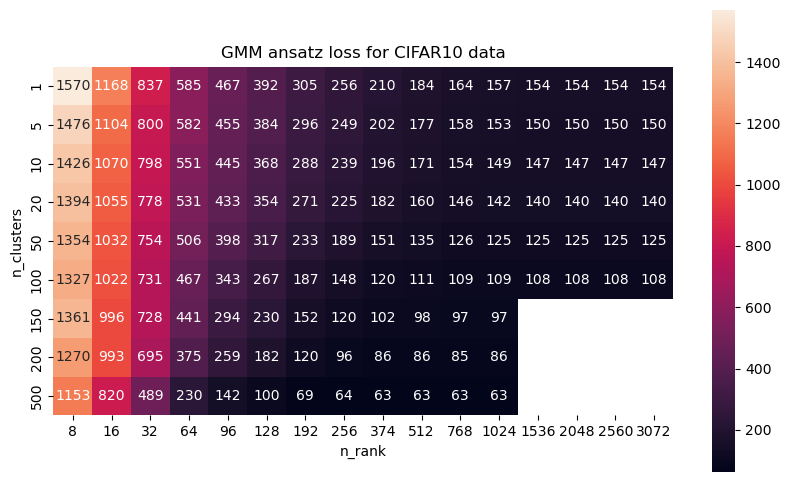

In [24]:
import seaborn as sns
plt.figure(figsize=[10,6])
sns.heatmap(df_cat.pivot_table(index="n_clusters", columns="n_rank", values="eval_loss"), 
            annot=True, fmt=".0f")
plt.axis("image")
plt.title("GMM ansatz loss for CIFAR10 data")
plt.show()

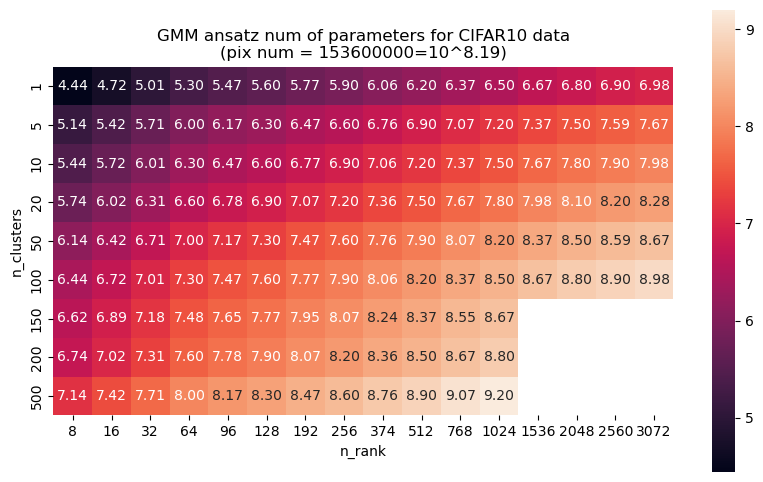

In [25]:
num_pix_pnts = np.prod(X_train_tsr.shape)
plt.figure(figsize=[10,6])
sns.heatmap(df_cat.pivot_table(index="n_clusters", columns="n_rank", values="Nparams").map(np.log10), 
            annot=True, fmt=".2f")
plt.axis("image")
plt.title(f"GMM ansatz num of parameters for CIFAR10 data\n(pix num = {num_pix_pnts}=10^{np.log10(num_pix_pnts):.2f})")
plt.show()

### Inspect GMM centroids and PCs

In [17]:
kmeans = MiniBatchKMeans(n_clusters=200, random_state=0, batch_size=2048, verbose=1)
kmeans.fit(X_train_tsr.numpy())

/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Init 1/3 with method k-means++
Inertia for init 1/3: 3074485.25
Init 2/3 with method k-means++
Inertia for init 2/3: 3100582.5
Init 3/3 with method k-means++
Inertia for init 3/3: 3060623.25
[MiniBatchKMeans] Reassigning 54 cluster centers.
Minibatch step 1/2441: mean batch inertia: 496.9498291015625
Minibatch step 2/2441: mean batch inertia: 427.580078125, ewa inertia: 427.580078125
[MiniBatchKMeans] Reassigning 32 cluster centers.
Minibatch step 3/2441: mean batch inertia: 407.3170166015625, ewa inertia: 425.92016132333606
Minibatch step 4/2441: mean batch inertia: 395.94219970703125, ewa inertia: 423.4644158226384
[MiniBatchKMeans] Reassigning 28 cluster centers.
Minibatch step 5/2441: mean batch inertia: 395.75592041015625, ewa inertia: 421.19458127513883
Minibatch step 6/2441: mean batch inertia: 403.6708679199219, ewa inertia: 419.7590673873572
Minibatch step 7/2441: mean batch inertia: 404.2408752441406, ewa inertia: 418.4878425114824
[MiniBatchKMeans] Reassigning 21 cluster cen

MiniBatchKMeans(batch_size=2048, n_clusters=200, random_state=0, verbose=1)

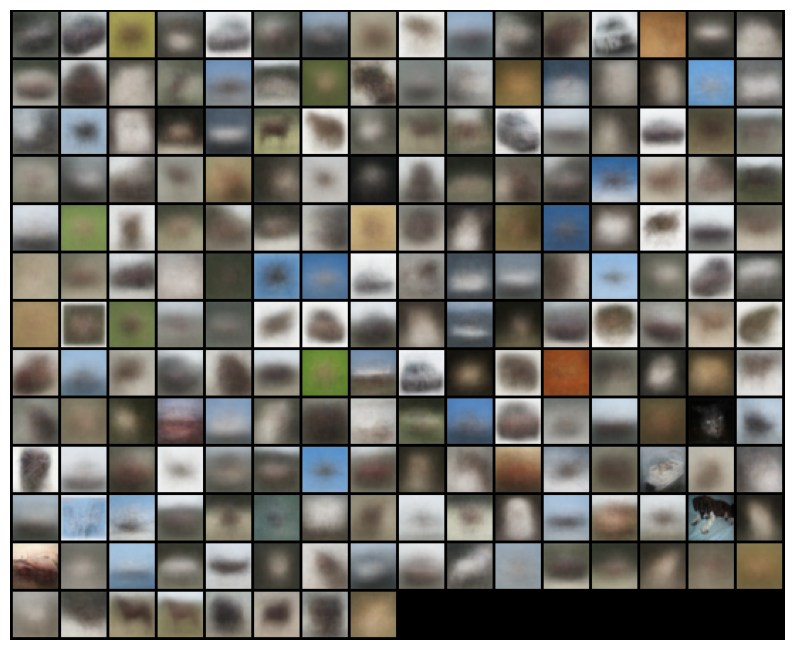

In [18]:
# visualize the cluster centers
centroids = kmeans.cluster_centers_.reshape(-1, *img_shape)
# denormalize the centroids
centroids = (centroids + 1 ) / 2
mtg = make_grid(torch.from_numpy(centroids).clamp(0,1) , nrow=16)
plt.figure(figsize=[10,10])
plt.imshow(mtg.permute(1, 2, 0) )
plt.axis("off")
plt.show()

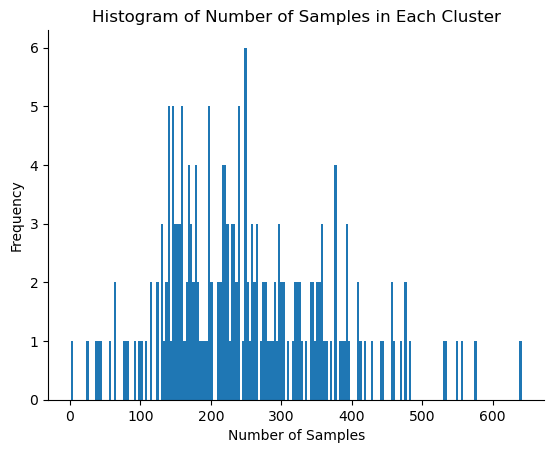

In [19]:
# Count the number of samples in each cluster
cluster_counts = np.bincount(kmeans.labels_)
# Plot the histogram
plt.hist(cluster_counts, bins=len(cluster_counts))
plt.xlabel('Number of Samples')
plt.ylabel('Frequency')
plt.title('Histogram of Number of Samples in Each Cluster')
plt.show()

In [14]:
kmeans = MiniBatchKMeans(n_clusters=500, random_state=0, batch_size=2048, verbose=0)
kmeans.fit(X_train_tsr.numpy())

/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


MiniBatchKMeans(batch_size=2048, n_clusters=500, random_state=0)

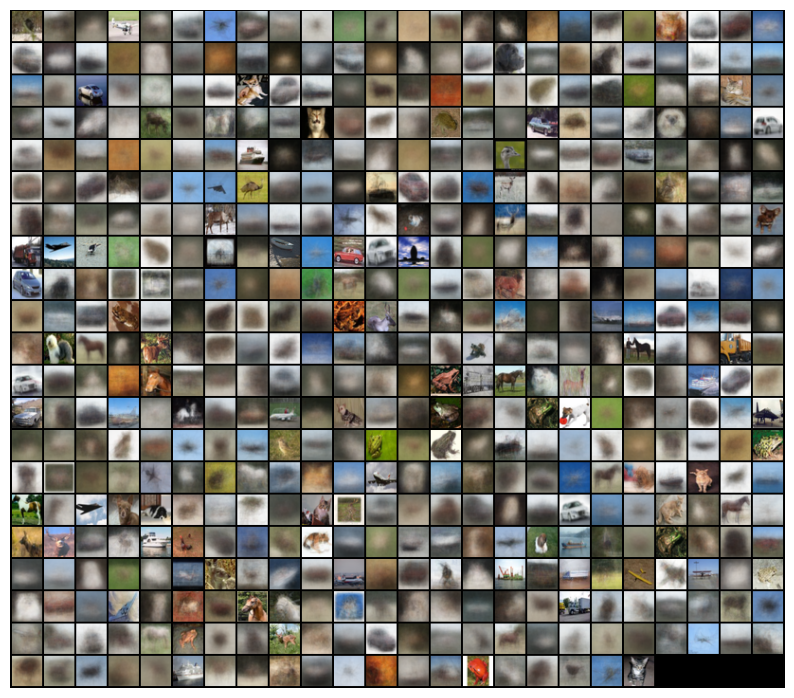

In [15]:
# visualize the cluster centers
centroids = kmeans.cluster_centers_.reshape(-1, *img_shape)
# denormalize the centroids
centroids = (centroids + 1 ) / 2
mtg = make_grid(torch.from_numpy(centroids).clamp(0,1) , nrow=24)
plt.figure(figsize=[10,10])
plt.imshow(mtg.permute(1, 2, 0) )
plt.axis("off")
plt.show()

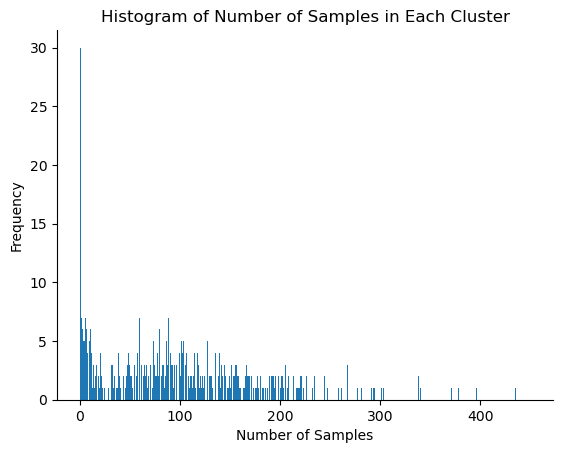

In [16]:
import matplotlib.pyplot as plt
# Count the number of samples in each cluster
cluster_counts = np.bincount(kmeans.labels_)
# Plot the histogram
plt.hist(cluster_counts, bins=len(cluster_counts))
plt.xlabel('Number of Samples')
plt.ylabel('Frequency')
plt.title('Histogram of Number of Samples in Each Cluster')
plt.show()


## GMM Score for MNIST

### Load Image Dataset: MNIST

In [9]:
from torchvision.datasets import MNIST
from torchvision import transforms
from torch.utils.data import DataLoader
from torchvision.utils import make_grid

dataset = MNIST(root="~/Datasets", train=True, download=False, transform=transforms.ToTensor())
Xtsr = dataset.data.float() / 255
Xtrain = Xtsr.reshape(Xtsr.shape[0], -1)
ytrain = dataset.targets

In [10]:
Xtrain_norm = (Xtrain - Xtrain.mean()) / Xtrain.std()
Xmean = Xtrain_norm.mean(dim=0)
covmat = torch.cov((Xtrain_norm - Xmean).T)
eigval, eigvec = torch.linalg.eigh(covmat.to(torch.float64))
eigval = eigval.flip(dims=(0,))  # sort from largest to smallest
eigvec = eigvec.flip(dims=(1,))  # sort from largest to smallest
assert torch.allclose(eigvec.T @ eigvec, torch.eye(eigvec.shape[0]).to(torch.float64))
assert torch.allclose(eigvec @ torch.diag(eigval) @ eigvec.T, covmat.to(torch.float64))

### Eval GMM Score quality

In [ ]:
import pandas as pd
df_col = []
for n_clusters in [1, 5, 10, 20, 50, 100, 200, 500, 1000, 1500, 2000]:
    kmeans, eigval_mat, eigvec_mat, freq_vec, center_mat = compute_cluster(Xtrain_norm, 
                                n_clusters, lambda_EPS=1E-5)
    for n_rank in reversed([8, 16, 32, 64, 96, 128, 192, 256, 374, 512, None]):
        gmm_km_cov = initialize_gmm_ansatz(eigval_mat, eigvec_mat, freq_vec, center_mat,
                        n_rank=n_rank, sigma_max=10, lambda_EPS=1E-5)
        if n_rank is None:
            n_rank = 784
        scaling = 1 if n_clusters < 250 else n_clusters / 250
        print(f"N components {n_clusters} | N rank {n_rank}")
        eval_loss, Nparams = eval_score_model(Xtrain_norm, gmm_km_cov, 
                        Nbatch=int(50 * scaling), batch_size=int(2048 / scaling))
        # print(f"Average loss {eval_loss:.3f} | N params {Nparams}")
        df_col.append({"n_clusters": n_clusters, "n_rank": n_rank, "eval_loss": eval_loss, "Nparams": Nparams})
    
df = pd.DataFrame(df_col)
df.to_csv("MNIST_gmm_ansatz_kmeans_loss.csv", index=False)

/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  33325348.552872088


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 1 | N rank 784


step 49 loss 111.934: 100%|██████████| 50/50 [00:00<00:00, 73.50it/s]


Average loss 109.360  (2048x50 pnts)
Num of parameters 616225
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 512


step 49 loss 111.456: 100%|██████████| 50/50 [00:00<00:00, 721.41it/s]


Average loss 109.902  (2048x50 pnts)
Num of parameters 402705
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 374


step 49 loss 118.252: 100%|██████████| 50/50 [00:00<00:00, 775.93it/s]


Average loss 118.768  (2048x50 pnts)
Num of parameters 294375
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 256


step 49 loss 146.135: 100%|██████████| 50/50 [00:00<00:00, 829.95it/s]


Average loss 150.040  (2048x50 pnts)
Num of parameters 201745
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 192


step 49 loss 171.703: 100%|██████████| 50/50 [00:00<00:00, 841.28it/s]


Average loss 187.609  (2048x50 pnts)
Num of parameters 151505
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 128


step 49 loss 279.820: 100%|██████████| 50/50 [00:00<00:00, 379.54it/s]


Average loss 255.920  (2048x50 pnts)
Num of parameters 101265
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 96


step 49 loss 304.106: 100%|██████████| 50/50 [00:00<00:00, 823.35it/s]


Average loss 325.695  (2048x50 pnts)
Num of parameters 76145
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 64


step 49 loss 437.631: 100%|██████████| 50/50 [00:00<00:00, 856.81it/s]


Average loss 462.903  (2048x50 pnts)
Num of parameters 51025
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 32


step 49 loss 763.403: 100%|██████████| 50/50 [00:00<00:00, 824.65it/s]


Average loss 812.895  (2048x50 pnts)
Num of parameters 25905
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 16


step 49 loss 1104.731: 100%|██████████| 50/50 [00:00<00:00, 853.53it/s]


Average loss 1239.598  (2048x50 pnts)
Num of parameters 13345
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 8


step 49 loss 1726.533: 100%|██████████| 50/50 [00:00<00:00, 858.99it/s]


Average loss 1720.507  (2048x50 pnts)
Num of parameters 7065


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  27909732.609924324


100%|██████████| 5/5 [00:00<00:00,  5.94it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 5 | N rank 784


step 49 loss 96.377: 100%|██████████| 50/50 [00:00<00:00, 228.51it/s]


Average loss 95.357  (2048x50 pnts)
Num of parameters 3081125
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 512


step 49 loss 96.975: 100%|██████████| 50/50 [00:00<00:00, 402.78it/s]


Average loss 95.319  (2048x50 pnts)
Num of parameters 2013525
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 374


step 49 loss 98.465: 100%|██████████| 50/50 [00:00<00:00, 449.44it/s] 


Average loss 99.092  (2048x50 pnts)
Num of parameters 1471875
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 256


step 49 loss 119.777: 100%|██████████| 50/50 [00:00<00:00, 527.41it/s]


Average loss 119.921  (2048x50 pnts)
Num of parameters 1008725
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 192


step 49 loss 139.139: 100%|██████████| 50/50 [00:00<00:00, 558.33it/s]


Average loss 148.237  (2048x50 pnts)
Num of parameters 757525
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 128


step 49 loss 201.310: 100%|██████████| 50/50 [00:00<00:00, 638.72it/s]


Average loss 203.891  (2048x50 pnts)
Num of parameters 506325
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 96


step 49 loss 239.932: 100%|██████████| 50/50 [00:00<00:00, 657.39it/s]


Average loss 256.219  (2048x50 pnts)
Num of parameters 380725
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 64


step 49 loss 342.030: 100%|██████████| 50/50 [00:00<00:00, 678.33it/s]


Average loss 360.663  (2048x50 pnts)
Num of parameters 255125
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 32


step 49 loss 576.296: 100%|██████████| 50/50 [00:00<00:00, 702.70it/s]


Average loss 624.459  (2048x50 pnts)
Num of parameters 129525
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 16


step 49 loss 885.419: 100%|██████████| 50/50 [00:00<00:00, 716.56it/s]


Average loss 950.620  (2048x50 pnts)
Num of parameters 66725
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 8


step 49 loss 1258.633: 100%|██████████| 50/50 [00:00<00:00, 725.18it/s]


Average loss 1341.777  (2048x50 pnts)
Num of parameters 35325


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  25081283.06152794


100%|██████████| 10/10 [00:00<00:00, 11.12it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 10 | N rank 784


step 49 loss 90.766: 100%|██████████| 50/50 [00:00<00:00, 179.67it/s]


Average loss 88.128  (2048x50 pnts)
Num of parameters 6162250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 512


step 49 loss 89.758: 100%|██████████| 50/50 [00:00<00:00, 255.04it/s]


Average loss 88.074  (2048x50 pnts)
Num of parameters 4027050
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 374


step 49 loss 91.190: 100%|██████████| 50/50 [00:00<00:00, 296.47it/s]


Average loss 89.997  (2048x50 pnts)
Num of parameters 2943750
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 256


step 49 loss 107.700: 100%|██████████| 50/50 [00:00<00:00, 372.95it/s]


Average loss 107.125  (2048x50 pnts)
Num of parameters 2017450
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 192


step 49 loss 119.656: 100%|██████████| 50/50 [00:00<00:00, 403.59it/s]


Average loss 128.537  (2048x50 pnts)
Num of parameters 1515050
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 128


step 49 loss 181.070: 100%|██████████| 50/50 [00:00<00:00, 467.22it/s]


Average loss 177.355  (2048x50 pnts)
Num of parameters 1012650
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 96


step 49 loss 207.363: 100%|██████████| 50/50 [00:00<00:00, 488.05it/s]


Average loss 223.423  (2048x50 pnts)
Num of parameters 761450
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 64


step 49 loss 291.584: 100%|██████████| 50/50 [00:00<00:00, 510.51it/s]


Average loss 311.484  (2048x50 pnts)
Num of parameters 510250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 32


step 49 loss 506.055: 100%|██████████| 50/50 [00:00<00:00, 536.27it/s]


Average loss 537.558  (2048x50 pnts)
Num of parameters 259050
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 16


step 49 loss 773.244: 100%|██████████| 50/50 [00:00<00:00, 546.36it/s]


Average loss 837.456  (2048x50 pnts)
Num of parameters 133450
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 8


step 49 loss 1085.773: 100%|██████████| 50/50 [00:00<00:00, 554.71it/s]


Average loss 1185.845  (2048x50 pnts)
Num of parameters 70650


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  22583100.361630782


100%|██████████| 20/20 [00:01<00:00, 19.55it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 20 | N rank 784


step 49 loss 81.160: 100%|██████████| 50/50 [00:00<00:00, 107.33it/s]


Average loss 80.449  (2048x50 pnts)
Num of parameters 12324500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 512


step 49 loss 82.385: 100%|██████████| 50/50 [00:00<00:00, 148.66it/s]


Average loss 80.514  (2048x50 pnts)
Num of parameters 8054100
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 374


step 49 loss 83.186: 100%|██████████| 50/50 [00:00<00:00, 180.39it/s]


Average loss 81.460  (2048x50 pnts)
Num of parameters 5887500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 256


step 49 loss 91.485: 100%|██████████| 50/50 [00:00<00:00, 229.43it/s] 


Average loss 92.937  (2048x50 pnts)
Num of parameters 4034900
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 192


step 49 loss 108.489: 100%|██████████| 50/50 [00:00<00:00, 251.82it/s]


Average loss 111.375  (2048x50 pnts)
Num of parameters 3030100
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 128


step 49 loss 159.511: 100%|██████████| 50/50 [00:00<00:00, 319.76it/s]


Average loss 153.701  (2048x50 pnts)
Num of parameters 2025300
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 96


step 49 loss 198.200: 100%|██████████| 50/50 [00:00<00:00, 337.48it/s]


Average loss 191.900  (2048x50 pnts)
Num of parameters 1522900
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 64


step 49 loss 253.951: 100%|██████████| 50/50 [00:00<00:00, 358.00it/s]


Average loss 271.038  (2048x50 pnts)
Num of parameters 1020500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 32


step 49 loss 400.629: 100%|██████████| 50/50 [00:00<00:00, 380.72it/s]


Average loss 469.147  (2048x50 pnts)
Num of parameters 518100
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 16


step 49 loss 635.002: 100%|██████████| 50/50 [00:00<00:00, 392.56it/s]


Average loss 733.104  (2048x50 pnts)
Num of parameters 266900
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 8


step 49 loss 958.272: 100%|██████████| 50/50 [00:00<00:00, 399.12it/s] 


Average loss 1043.708  (2048x50 pnts)
Num of parameters 141300


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  19701055.39941834


100%|██████████| 50/50 [00:01<00:00, 32.97it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 50 | N rank 784


step 49 loss 73.591: 100%|██████████| 50/50 [00:01<00:00, 49.14it/s]


Average loss 72.266  (2048x50 pnts)
Num of parameters 30811250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 512


step 49 loss 75.214: 100%|██████████| 50/50 [00:00<00:00, 64.82it/s]


Average loss 72.205  (2048x50 pnts)
Num of parameters 20135250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 374


step 49 loss 73.638: 100%|██████████| 50/50 [00:00<00:00, 80.73it/s]


Average loss 72.523  (2048x50 pnts)
Num of parameters 14718750
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 256


step 49 loss 76.719: 100%|██████████| 50/50 [00:00<00:00, 106.01it/s]


Average loss 79.155  (2048x50 pnts)
Num of parameters 10087250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 192


step 49 loss 89.305: 100%|██████████| 50/50 [00:00<00:00, 117.72it/s] 


Average loss 93.193  (2048x50 pnts)
Num of parameters 7575250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 128


step 49 loss 116.698: 100%|██████████| 50/50 [00:00<00:00, 152.32it/s]


Average loss 127.542  (2048x50 pnts)
Num of parameters 5063250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 96


step 49 loss 146.467: 100%|██████████| 50/50 [00:00<00:00, 163.55it/s]


Average loss 160.605  (2048x50 pnts)
Num of parameters 3807250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 64


step 49 loss 227.404: 100%|██████████| 50/50 [00:00<00:00, 177.39it/s]


Average loss 230.528  (2048x50 pnts)
Num of parameters 2551250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 32


step 49 loss 347.293: 100%|██████████| 50/50 [00:00<00:00, 193.81it/s]


Average loss 391.307  (2048x50 pnts)
Num of parameters 1295250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 16


step 49 loss 613.782: 100%|██████████| 50/50 [00:00<00:00, 201.44it/s]


Average loss 616.194  (2048x50 pnts)
Num of parameters 667250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 8


step 49 loss 798.050: 100%|██████████| 50/50 [00:00<00:00, 203.78it/s] 
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Average loss 881.590  (2048x50 pnts)
Num of parameters 353250
Kmeans fitting completing, loss  17885428.769533526


100%|██████████| 100/100 [00:02<00:00, 42.90it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 100 | N rank 784


step 49 loss 66.499: 100%|██████████| 50/50 [00:01<00:00, 25.15it/s]


Average loss 65.194  (2048x50 pnts)
Num of parameters 61622500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 512


step 49 loss 66.081: 100%|██████████| 50/50 [00:01<00:00, 33.48it/s]


Average loss 65.176  (2048x50 pnts)
Num of parameters 40270500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 374


step 49 loss 66.066: 100%|██████████| 50/50 [00:01<00:00, 42.22it/s]


Average loss 65.397  (2048x50 pnts)
Num of parameters 29437500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 256


step 49 loss 68.470: 100%|██████████| 50/50 [00:00<00:00, 55.61it/s]


Average loss 67.953  (2048x50 pnts)
Num of parameters 20174500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 192


step 49 loss 77.019: 100%|██████████| 50/50 [00:00<00:00, 61.91it/s]


Average loss 77.051  (2048x50 pnts)
Num of parameters 15150500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 128


step 49 loss 97.470: 100%|██████████| 50/50 [00:00<00:00, 82.64it/s] 


Average loss 103.103  (2048x50 pnts)
Num of parameters 10126500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 96


step 49 loss 131.712: 100%|██████████| 50/50 [00:00<00:00, 89.04it/s]


Average loss 134.167  (2048x50 pnts)
Num of parameters 7614500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 64


step 49 loss 185.054: 100%|██████████| 50/50 [00:00<00:00, 96.95it/s]


Average loss 194.039  (2048x50 pnts)
Num of parameters 5102500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 32


step 49 loss 313.413: 100%|██████████| 50/50 [00:00<00:00, 106.49it/s]


Average loss 346.541  (2048x50 pnts)
Num of parameters 2590500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 16


step 49 loss 535.964: 100%|██████████| 50/50 [00:00<00:00, 112.05it/s]


Average loss 552.918  (2048x50 pnts)
Num of parameters 1334500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 8


step 49 loss 802.501: 100%|██████████| 50/50 [00:00<00:00, 113.15it/s] 
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Average loss 799.155  (2048x50 pnts)
Num of parameters 706500
Kmeans fitting completing, loss  16363993.194524601


100%|██████████| 200/200 [00:04<00:00, 49.68it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 200 | N rank 784


step 49 loss 56.580: 100%|██████████| 50/50 [00:03<00:00, 12.76it/s]


Average loss 56.169  (2048x50 pnts)
Num of parameters 123245000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 512


step 49 loss 57.151: 100%|██████████| 50/50 [00:02<00:00, 17.19it/s]


Average loss 56.173  (2048x50 pnts)
Num of parameters 80541000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 374


step 49 loss 56.164: 100%|██████████| 50/50 [00:02<00:00, 21.78it/s]


Average loss 56.166  (2048x50 pnts)
Num of parameters 58875000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 256


step 49 loss 56.852: 100%|██████████| 50/50 [00:01<00:00, 28.85it/s]


Average loss 56.478  (2048x50 pnts)
Num of parameters 40349000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 192


step 49 loss 58.427: 100%|██████████| 50/50 [00:01<00:00, 32.22it/s]


Average loss 59.108  (2048x50 pnts)
Num of parameters 30301000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 128


step 49 loss 75.595: 100%|██████████| 50/50 [00:01<00:00, 43.73it/s]


Average loss 75.762  (2048x50 pnts)
Num of parameters 20253000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 96


step 49 loss 94.909: 100%|██████████| 50/50 [00:01<00:00, 47.22it/s] 


Average loss 98.252  (2048x50 pnts)
Num of parameters 15229000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 64


step 49 loss 157.992: 100%|██████████| 50/50 [00:00<00:00, 51.81it/s]


Average loss 153.337  (2048x50 pnts)
Num of parameters 10205000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 32


step 49 loss 300.696: 100%|██████████| 50/50 [00:00<00:00, 57.02it/s]


Average loss 294.495  (2048x50 pnts)
Num of parameters 5181000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 16


step 49 loss 473.191: 100%|██████████| 50/50 [00:00<00:00, 60.39it/s]


Average loss 489.562  (2048x50 pnts)
Num of parameters 2669000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 8


step 49 loss 687.353: 100%|██████████| 50/50 [00:00<00:00, 61.65it/s]
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Average loss 712.701  (2048x50 pnts)
Num of parameters 1413000
Kmeans fitting completing, loss  14467647.127953997


100%|██████████| 500/500 [00:08<00:00, 57.16it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 500 | N rank 784


step 99 loss 40.788: 100%|██████████| 100/100 [00:09<00:00, 10.20it/s]


Average loss 40.992  (1024x100 pnts)
Num of parameters 308112500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 512


step 99 loss 40.419: 100%|██████████| 100/100 [00:07<00:00, 13.79it/s]


Average loss 41.028  (1024x100 pnts)
Num of parameters 201352500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 374


step 99 loss 39.955: 100%|██████████| 100/100 [00:05<00:00, 17.52it/s]


Average loss 41.001  (1024x100 pnts)
Num of parameters 147187500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 256


step 99 loss 40.256: 100%|██████████| 100/100 [00:04<00:00, 23.30it/s]


Average loss 40.976  (1024x100 pnts)
Num of parameters 100872500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 192


step 99 loss 40.250: 100%|██████████| 100/100 [00:03<00:00, 26.06it/s]


Average loss 40.972  (1024x100 pnts)
Num of parameters 75752500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 128


step 99 loss 43.508: 100%|██████████| 100/100 [00:02<00:00, 35.32it/s]


Average loss 42.192  (1024x100 pnts)
Num of parameters 50632500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 96


step 99 loss 50.027: 100%|██████████| 100/100 [00:02<00:00, 38.29it/s]


Average loss 48.964  (1024x100 pnts)
Num of parameters 38072500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 64


step 99 loss 75.614: 100%|██████████| 100/100 [00:02<00:00, 41.95it/s]


Average loss 76.861  (1024x100 pnts)
Num of parameters 25512500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 32


step 99 loss 208.449: 100%|██████████| 100/100 [00:02<00:00, 46.27it/s]


Average loss 187.821  (1024x100 pnts)
Num of parameters 12952500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 16


step 99 loss 435.200: 100%|██████████| 100/100 [00:02<00:00, 48.92it/s]


Average loss 368.215  (1024x100 pnts)
Num of parameters 6672500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 8


step 99 loss 744.766: 100%|██████████| 100/100 [00:02<00:00, 49.75it/s]
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Average loss 569.260  (1024x100 pnts)
Num of parameters 3532500
Kmeans fitting completing, loss  13146337.223708345


100%|██████████| 1000/1000 [00:16<00:00, 59.95it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 1000 | N rank 784


step 199 loss 29.440: 100%|██████████| 200/200 [00:19<00:00, 10.24it/s]


Average loss 30.508  (512x200 pnts)
Num of parameters 616225000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1000 | N rank 512


step 199 loss 30.331: 100%|██████████| 200/200 [00:14<00:00, 13.85it/s]


Average loss 30.487  (512x200 pnts)
Num of parameters 402705000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1000 | N rank 374


step 199 loss 30.141: 100%|██████████| 200/200 [00:11<00:00, 17.55it/s]


Average loss 30.418  (512x200 pnts)
Num of parameters 294375000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1000 | N rank 256


step 199 loss 29.968: 100%|██████████| 200/200 [00:08<00:00, 23.39it/s]


Average loss 30.486  (512x200 pnts)
Num of parameters 201745000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1000 | N rank 192


step 199 loss 29.589: 100%|██████████| 200/200 [00:07<00:00, 26.16it/s]


Average loss 30.501  (512x200 pnts)
Num of parameters 151505000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1000 | N rank 128


step 199 loss 30.254: 100%|██████████| 200/200 [00:05<00:00, 35.50it/s]


Average loss 30.465  (512x200 pnts)
Num of parameters 101265000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1000 | N rank 96


step 199 loss 30.657: 100%|██████████| 200/200 [00:05<00:00, 38.55it/s]


Average loss 30.978  (512x200 pnts)
Num of parameters 76145000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1000 | N rank 64


step 199 loss 41.737: 100%|██████████| 200/200 [00:04<00:00, 42.22it/s]


Average loss 38.724  (512x200 pnts)
Num of parameters 51025000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1000 | N rank 32


step 199 loss 121.628: 100%|██████████| 200/200 [00:04<00:00, 46.53it/s]


Average loss 109.355  (512x200 pnts)
Num of parameters 25905000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1000 | N rank 16


step 199 loss 219.008: 100%|██████████| 200/200 [00:04<00:00, 49.08it/s]


Average loss 271.073  (512x200 pnts)
Num of parameters 13345000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1000 | N rank 8


step 199 loss 404.584: 100%|██████████| 200/200 [00:04<00:00, 49.71it/s]
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Average loss 480.259  (512x200 pnts)
Num of parameters 7065000
Kmeans fitting completing, loss  12519172.849212836


100%|██████████| 1500/1500 [00:24<00:00, 62.32it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 1500 | N rank 784


step 299 loss 24.592: 100%|██████████| 300/300 [00:32<00:00,  9.33it/s]


Average loss 26.200  (341x300 pnts)
Num of parameters 924337500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1500 | N rank 512


step 299 loss 26.076: 100%|██████████| 300/300 [00:23<00:00, 12.84it/s]


Average loss 26.109  (341x300 pnts)
Num of parameters 604057500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1500 | N rank 374


step 299 loss 25.755: 100%|██████████| 300/300 [00:18<00:00, 16.35it/s]


Average loss 26.071  (341x300 pnts)
Num of parameters 441562500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1500 | N rank 256


step 299 loss 26.968: 100%|██████████| 300/300 [00:13<00:00, 21.87it/s]


Average loss 26.216  (341x300 pnts)
Num of parameters 302617500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1500 | N rank 192


step 299 loss 25.719: 100%|██████████| 300/300 [00:12<00:00, 24.52it/s]


Average loss 26.085  (341x300 pnts)
Num of parameters 227257500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1500 | N rank 128


step 299 loss 26.203: 100%|██████████| 300/300 [00:08<00:00, 33.80it/s]


Average loss 26.207  (341x300 pnts)
Num of parameters 151897500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1500 | N rank 96


step 299 loss 24.695: 100%|██████████| 300/300 [00:08<00:00, 36.81it/s]


Average loss 26.162  (341x300 pnts)
Num of parameters 114217500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1500 | N rank 64


step 299 loss 27.234: 100%|██████████| 300/300 [00:07<00:00, 40.39it/s]


Average loss 28.868  (341x300 pnts)
Num of parameters 76537500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1500 | N rank 32


step 299 loss 50.099: 100%|██████████| 300/300 [00:06<00:00, 44.75it/s] 


Average loss 76.015  (341x300 pnts)
Num of parameters 38857500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1500 | N rank 16


step 299 loss 131.301: 100%|██████████| 300/300 [00:06<00:00, 47.31it/s]


Average loss 213.312  (341x300 pnts)
Num of parameters 20017500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1500 | N rank 8


step 299 loss 277.149: 100%|██████████| 300/300 [00:06<00:00, 48.07it/s] 
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Average loss 428.589  (341x300 pnts)
Num of parameters 10597500
Kmeans fitting completing, loss  12038831.828654226


100%|██████████| 2000/2000 [00:32<00:00, 62.33it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 2000 | N rank 784


step 399 loss 25.017: 100%|██████████| 400/400 [00:39<00:00, 10.22it/s]


Average loss 23.317  (256x400 pnts)
Num of parameters 1232450000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 2000 | N rank 512


step 399 loss 23.284: 100%|██████████| 400/400 [00:28<00:00, 13.80it/s]


Average loss 23.359  (256x400 pnts)
Num of parameters 805410000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 2000 | N rank 374


step 399 loss 24.299: 100%|██████████| 400/400 [00:22<00:00, 17.49it/s]


Average loss 23.279  (256x400 pnts)
Num of parameters 588750000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 2000 | N rank 256


step 399 loss 25.939: 100%|██████████| 400/400 [00:17<00:00, 23.26it/s]


Average loss 23.304  (256x400 pnts)
Num of parameters 403490000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 2000 | N rank 192


step 399 loss 23.923: 100%|██████████| 400/400 [00:15<00:00, 26.05it/s]


Average loss 23.434  (256x400 pnts)
Num of parameters 303010000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 2000 | N rank 128


step 399 loss 28.140: 100%|██████████| 400/400 [00:11<00:00, 35.40it/s]


Average loss 23.447  (256x400 pnts)
Num of parameters 202530000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 2000 | N rank 96


step 399 loss 23.182: 100%|██████████| 400/400 [00:10<00:00, 38.35it/s]


Average loss 23.335  (256x400 pnts)
Num of parameters 152290000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 2000 | N rank 64


step 399 loss 31.306: 100%|██████████| 400/400 [00:09<00:00, 42.00it/s]


Average loss 23.980  (256x400 pnts)
Num of parameters 102050000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 2000 | N rank 32


step 399 loss 50.433: 100%|██████████| 400/400 [00:08<00:00, 46.24it/s] 


Average loss 55.396  (256x400 pnts)
Num of parameters 51810000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 2000 | N rank 16


step 399 loss 182.325: 100%|██████████| 400/400 [00:08<00:00, 48.36it/s]


Average loss 177.639  (256x400 pnts)
Num of parameters 26690000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 2000 | N rank 8


step 399 loss 397.892: 100%|██████████| 400/400 [00:08<00:00, 49.03it/s] 


Average loss 375.769  (256x400 pnts)
Num of parameters 14130000


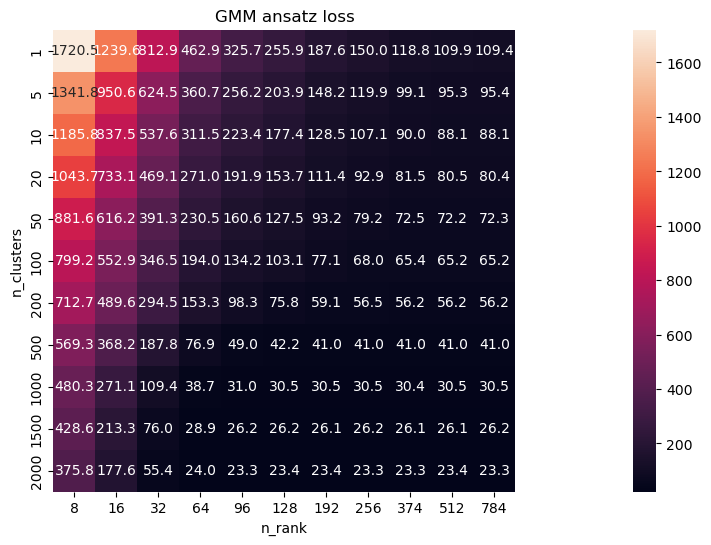

In [ ]:
import seaborn as sns
plt.figure(figsize=[10,6])
sns.heatmap(df.pivot_table(index="n_clusters", columns="n_rank", values="eval_loss"), annot=True, fmt=".1f")
plt.axis("image")
plt.title("GMM ansatz loss")
plt.show()

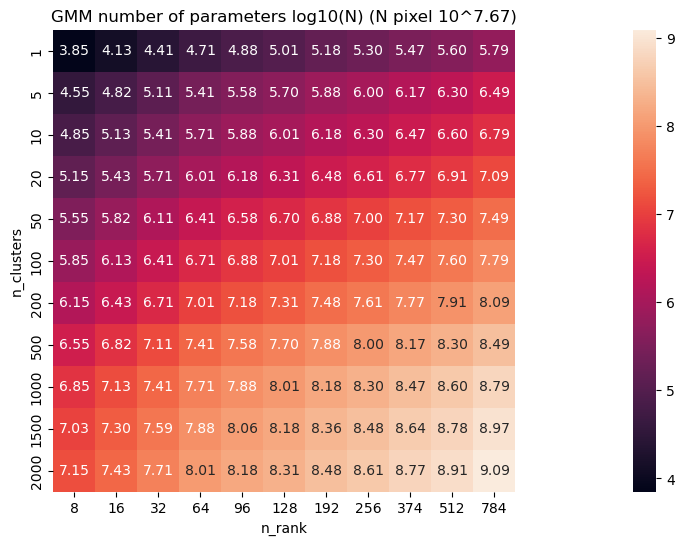

In [ ]:
import seaborn as sns
plt.figure(figsize=[10,6])
sns.heatmap(df.pivot_table(index="n_clusters", columns="n_rank", values="Nparams").apply(np.log10), annot=True, fmt=".2f")
plt.axis("image")
Npixel = 28 * 28 * 60000
plt.title(f"GMM number of parameters log10(N) (N pixel 10^{np.log10(Npixel):.2f})")
plt.show()

### Eval GMM score at individual time bins 

In [34]:
np.linspace(0.001, 1, 26)

array([0.001  , 0.04096, 0.08092, 0.12088, 0.16084, 0.2008 , 0.24076,
       0.28072, 0.32068, 0.36064, 0.4006 , 0.44056, 0.48052, 0.52048,
       0.56044, 0.6004 , 0.64036, 0.68032, 0.72028, 0.76024, 0.8002 ,
       0.84016, 0.88012, 0.92008, 0.96004, 1.     ])

In [41]:
import pandas as pd
time_pnts = np.linspace(0.001, 1, 26)
df_col = []
for n_clusters in [1, 5, 10, 20, 50, 100, 200, 500, 1000, 1500, 2000]:
    kmeans, eigval_mat, eigvec_mat, freq_vec, center_mat = compute_cluster(Xtrain_norm, 
                                n_clusters, lambda_EPS=1E-5)
    for n_rank in reversed([8, 16, 32, 64, 96, 128, 192, 256, 374, 512, None]):
        gmm_km_cov = initialize_gmm_ansatz(eigval_mat, eigvec_mat, freq_vec, center_mat,
                        n_rank=n_rank, sigma_max=10, lambda_EPS=1E-5)
        if n_rank is None:
            n_rank = 784
        scaling = 1 if n_clusters < 250 else n_clusters / 250
        print(f"N components {n_clusters} | N rank {n_rank}")
        eval_loss_arr, Nparams = eval_score_model_splittime(Xtrain_norm, gmm_km_cov, 
                        time_pnts=time_pnts, sigma_max=10, 
                        Nbatch=int(5 * scaling), batch_size=int(2048 / scaling))
        # print(f"Average loss {eval_loss:.3f} | N params {Nparams}")
        df_col.append({"n_clusters": n_clusters, "n_rank": n_rank, "eval_loss_arr": eval_loss_arr, "Nparams": Nparams})
        # raise ValueError("Stop")
df = pd.DataFrame(df_col)
df.to_csv("MNIST_gmm_ansatz_kmeans_loss_timesplit.csv", index=False)

/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  33325348.552872088


100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 1 | N rank 784
Time 0.001


step 4 loss 584.761: 100%|██████████| 5/5 [00:00<00:00, 673.50it/s]


t=0.001 Average loss 582.286  (2048x5 pnts)
Time 0.041


step 4 loss 342.510: 100%|██████████| 5/5 [00:00<00:00, 687.88it/s]


t=0.041 Average loss 343.559  (2048x5 pnts)
Time 0.081


step 4 loss 273.336: 100%|██████████| 5/5 [00:00<00:00, 683.07it/s]


t=0.081 Average loss 273.134  (2048x5 pnts)
Time 0.121


step 4 loss 231.123: 100%|██████████| 5/5 [00:00<00:00, 688.56it/s]


t=0.121 Average loss 230.090  (2048x5 pnts)
Time 0.161


step 4 loss 199.348: 100%|██████████| 5/5 [00:00<00:00, 696.20it/s]


t=0.161 Average loss 198.519  (2048x5 pnts)
Time 0.201


step 4 loss 175.096: 100%|██████████| 5/5 [00:00<00:00, 667.71it/s]


t=0.201 Average loss 173.163  (2048x5 pnts)
Time 0.241


step 4 loss 152.811: 100%|██████████| 5/5 [00:00<00:00, 696.31it/s]


t=0.241 Average loss 152.421  (2048x5 pnts)
Time 0.281


step 4 loss 135.954: 100%|██████████| 5/5 [00:00<00:00, 687.95it/s]


t=0.281 Average loss 136.018  (2048x5 pnts)
Time 0.321


step 4 loss 121.664: 100%|██████████| 5/5 [00:00<00:00, 723.43it/s]


t=0.321 Average loss 120.972  (2048x5 pnts)
Time 0.361


step 4 loss 109.259: 100%|██████████| 5/5 [00:00<00:00, 713.51it/s]


t=0.361 Average loss 108.538  (2048x5 pnts)
Time 0.401


step 4 loss 97.325: 100%|██████████| 5/5 [00:00<00:00, 718.47it/s]


t=0.401 Average loss 97.368  (2048x5 pnts)
Time 0.441


step 4 loss 87.326: 100%|██████████| 5/5 [00:00<00:00, 720.30it/s]


t=0.441 Average loss 87.227  (2048x5 pnts)
Time 0.481


step 4 loss 77.877: 100%|██████████| 5/5 [00:00<00:00, 715.97it/s]


t=0.481 Average loss 78.134  (2048x5 pnts)
Time 0.520


step 4 loss 69.667: 100%|██████████| 5/5 [00:00<00:00, 718.82it/s]


t=0.520 Average loss 69.801  (2048x5 pnts)
Time 0.560


step 4 loss 62.193: 100%|██████████| 5/5 [00:00<00:00, 718.79it/s]


t=0.560 Average loss 62.671  (2048x5 pnts)
Time 0.600


step 4 loss 56.471: 100%|██████████| 5/5 [00:00<00:00, 718.82it/s]


t=0.600 Average loss 56.175  (2048x5 pnts)
Time 0.640


step 4 loss 50.126: 100%|██████████| 5/5 [00:00<00:00, 731.91it/s]


t=0.640 Average loss 50.275  (2048x5 pnts)
Time 0.680


step 4 loss 44.579: 100%|██████████| 5/5 [00:00<00:00, 737.37it/s]


t=0.680 Average loss 44.733  (2048x5 pnts)
Time 0.720


step 4 loss 39.383: 100%|██████████| 5/5 [00:00<00:00, 703.48it/s]


t=0.720 Average loss 39.786  (2048x5 pnts)
Time 0.760


step 4 loss 35.653: 100%|██████████| 5/5 [00:00<00:00, 749.14it/s]


t=0.760 Average loss 35.600  (2048x5 pnts)
Time 0.800


step 4 loss 31.149: 100%|██████████| 5/5 [00:00<00:00, 747.22it/s]


t=0.800 Average loss 31.274  (2048x5 pnts)
Time 0.840


step 4 loss 27.721: 100%|██████████| 5/5 [00:00<00:00, 753.37it/s]


t=0.840 Average loss 27.701  (2048x5 pnts)
Time 0.880


step 4 loss 24.642: 100%|██████████| 5/5 [00:00<00:00, 747.65it/s]


t=0.880 Average loss 24.583  (2048x5 pnts)
Time 0.920


step 4 loss 21.396: 100%|██████████| 5/5 [00:00<00:00, 760.28it/s]


t=0.920 Average loss 21.523  (2048x5 pnts)
Time 0.960


step 4 loss 18.842: 100%|██████████| 5/5 [00:00<00:00, 746.80it/s]


t=0.960 Average loss 18.925  (2048x5 pnts)
Time 1.000


step 4 loss 16.600: 100%|██████████| 5/5 [00:00<00:00, 766.64it/s]


t=1.000 Average loss 16.515  (2048x5 pnts)
Num of parameters 616225
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 512
Time 0.001


step 4 loss 835.485: 100%|██████████| 5/5 [00:00<00:00, 740.55it/s]


t=0.001 Average loss 821.901  (2048x5 pnts)
Time 0.041


step 4 loss 346.195: 100%|██████████| 5/5 [00:00<00:00, 772.29it/s]


t=0.041 Average loss 345.201  (2048x5 pnts)
Time 0.081


step 4 loss 273.963: 100%|██████████| 5/5 [00:00<00:00, 773.54it/s]


t=0.081 Average loss 273.930  (2048x5 pnts)
Time 0.121


step 4 loss 229.934: 100%|██████████| 5/5 [00:00<00:00, 767.99it/s]


t=0.121 Average loss 229.747  (2048x5 pnts)
Time 0.161


step 4 loss 198.278: 100%|██████████| 5/5 [00:00<00:00, 761.44it/s]


t=0.161 Average loss 199.045  (2048x5 pnts)
Time 0.201


step 4 loss 175.210: 100%|██████████| 5/5 [00:00<00:00, 763.10it/s]


t=0.201 Average loss 174.144  (2048x5 pnts)
Time 0.241


step 4 loss 152.690: 100%|██████████| 5/5 [00:00<00:00, 778.94it/s]


t=0.241 Average loss 152.688  (2048x5 pnts)
Time 0.281


step 4 loss 137.004: 100%|██████████| 5/5 [00:00<00:00, 771.01it/s]


t=0.281 Average loss 136.169  (2048x5 pnts)
Time 0.321


step 4 loss 120.845: 100%|██████████| 5/5 [00:00<00:00, 777.04it/s]


t=0.321 Average loss 121.190  (2048x5 pnts)
Time 0.361


step 4 loss 108.819: 100%|██████████| 5/5 [00:00<00:00, 762.66it/s]


t=0.361 Average loss 108.532  (2048x5 pnts)
Time 0.401


step 4 loss 97.575: 100%|██████████| 5/5 [00:00<00:00, 782.69it/s]


t=0.401 Average loss 97.364  (2048x5 pnts)
Time 0.441


step 4 loss 87.614: 100%|██████████| 5/5 [00:00<00:00, 774.06it/s]


t=0.441 Average loss 87.086  (2048x5 pnts)
Time 0.481


step 4 loss 77.442: 100%|██████████| 5/5 [00:00<00:00, 783.51it/s]


t=0.481 Average loss 77.870  (2048x5 pnts)
Time 0.520


step 4 loss 70.129: 100%|██████████| 5/5 [00:00<00:00, 784.04it/s]


t=0.520 Average loss 70.116  (2048x5 pnts)
Time 0.560


step 4 loss 62.616: 100%|██████████| 5/5 [00:00<00:00, 776.78it/s]


t=0.560 Average loss 62.665  (2048x5 pnts)
Time 0.600


step 4 loss 56.600: 100%|██████████| 5/5 [00:00<00:00, 784.63it/s]


t=0.600 Average loss 56.121  (2048x5 pnts)
Time 0.640


step 4 loss 50.604: 100%|██████████| 5/5 [00:00<00:00, 776.15it/s]


t=0.640 Average loss 50.374  (2048x5 pnts)
Time 0.680


step 4 loss 44.841: 100%|██████████| 5/5 [00:00<00:00, 778.63it/s]


t=0.680 Average loss 44.679  (2048x5 pnts)
Time 0.720


step 4 loss 39.795: 100%|██████████| 5/5 [00:00<00:00, 784.19it/s]


t=0.720 Average loss 39.740  (2048x5 pnts)
Time 0.760


step 4 loss 35.180: 100%|██████████| 5/5 [00:00<00:00, 790.27it/s]


t=0.760 Average loss 35.492  (2048x5 pnts)
Time 0.800


step 4 loss 31.492: 100%|██████████| 5/5 [00:00<00:00, 790.01it/s]


t=0.800 Average loss 31.377  (2048x5 pnts)
Time 0.840


step 4 loss 28.020: 100%|██████████| 5/5 [00:00<00:00, 775.00it/s]


t=0.840 Average loss 27.738  (2048x5 pnts)
Time 0.880


step 4 loss 24.677: 100%|██████████| 5/5 [00:00<00:00, 780.22it/s]


t=0.880 Average loss 24.605  (2048x5 pnts)
Time 0.920


step 4 loss 21.639: 100%|██████████| 5/5 [00:00<00:00, 782.52it/s]


t=0.920 Average loss 21.516  (2048x5 pnts)
Time 0.960


step 4 loss 18.975: 100%|██████████| 5/5 [00:00<00:00, 775.09it/s]


t=0.960 Average loss 18.876  (2048x5 pnts)
Time 1.000


step 4 loss 16.459: 100%|██████████| 5/5 [00:00<00:00, 770.36it/s]


t=1.000 Average loss 16.554  (2048x5 pnts)
Num of parameters 402705
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 374
Time 0.001


step 4 loss 3668.638: 100%|██████████| 5/5 [00:00<00:00, 792.78it/s]


t=0.001 Average loss 3673.502  (2048x5 pnts)
Time 0.041


step 4 loss 369.451: 100%|██████████| 5/5 [00:00<00:00, 814.97it/s]


t=0.041 Average loss 368.105  (2048x5 pnts)
Time 0.081


step 4 loss 284.419: 100%|██████████| 5/5 [00:00<00:00, 811.65it/s]


t=0.081 Average loss 280.722  (2048x5 pnts)
Time 0.121


step 4 loss 232.128: 100%|██████████| 5/5 [00:00<00:00, 822.09it/s]


t=0.121 Average loss 231.716  (2048x5 pnts)
Time 0.161


step 4 loss 200.174: 100%|██████████| 5/5 [00:00<00:00, 807.40it/s]


t=0.161 Average loss 199.839  (2048x5 pnts)
Time 0.201


step 4 loss 174.254: 100%|██████████| 5/5 [00:00<00:00, 803.72it/s]


t=0.201 Average loss 173.522  (2048x5 pnts)
Time 0.241


step 4 loss 152.370: 100%|██████████| 5/5 [00:00<00:00, 819.74it/s]


t=0.241 Average loss 152.898  (2048x5 pnts)
Time 0.281


step 4 loss 136.177: 100%|██████████| 5/5 [00:00<00:00, 820.61it/s]


t=0.281 Average loss 136.228  (2048x5 pnts)
Time 0.321


step 4 loss 121.925: 100%|██████████| 5/5 [00:00<00:00, 804.25it/s]


t=0.321 Average loss 121.719  (2048x5 pnts)
Time 0.361


step 4 loss 108.611: 100%|██████████| 5/5 [00:00<00:00, 799.89it/s]


t=0.361 Average loss 108.620  (2048x5 pnts)
Time 0.401


step 4 loss 96.855: 100%|██████████| 5/5 [00:00<00:00, 814.68it/s]


t=0.401 Average loss 97.339  (2048x5 pnts)
Time 0.441


step 4 loss 87.936: 100%|██████████| 5/5 [00:00<00:00, 798.09it/s]


t=0.441 Average loss 87.482  (2048x5 pnts)
Time 0.481


step 4 loss 77.966: 100%|██████████| 5/5 [00:00<00:00, 811.12it/s]


t=0.481 Average loss 78.208  (2048x5 pnts)
Time 0.520


step 4 loss 69.320: 100%|██████████| 5/5 [00:00<00:00, 807.12it/s]


t=0.520 Average loss 69.881  (2048x5 pnts)
Time 0.560


step 4 loss 63.059: 100%|██████████| 5/5 [00:00<00:00, 790.66it/s]


t=0.560 Average loss 62.695  (2048x5 pnts)
Time 0.600


step 4 loss 55.938: 100%|██████████| 5/5 [00:00<00:00, 809.96it/s]


t=0.600 Average loss 56.126  (2048x5 pnts)
Time 0.640


step 4 loss 49.932: 100%|██████████| 5/5 [00:00<00:00, 794.95it/s]


t=0.640 Average loss 50.409  (2048x5 pnts)
Time 0.680


step 4 loss 45.052: 100%|██████████| 5/5 [00:00<00:00, 825.62it/s]


t=0.680 Average loss 44.661  (2048x5 pnts)
Time 0.720


step 4 loss 39.752: 100%|██████████| 5/5 [00:00<00:00, 809.90it/s]


t=0.720 Average loss 39.857  (2048x5 pnts)
Time 0.760


step 4 loss 35.462: 100%|██████████| 5/5 [00:00<00:00, 807.22it/s]


t=0.760 Average loss 35.472  (2048x5 pnts)
Time 0.800


step 4 loss 31.559: 100%|██████████| 5/5 [00:00<00:00, 799.40it/s]


t=0.800 Average loss 31.470  (2048x5 pnts)
Time 0.840


step 4 loss 28.223: 100%|██████████| 5/5 [00:00<00:00, 815.73it/s]


t=0.840 Average loss 27.816  (2048x5 pnts)
Time 0.880


step 4 loss 24.675: 100%|██████████| 5/5 [00:00<00:00, 808.93it/s]


t=0.880 Average loss 24.558  (2048x5 pnts)
Time 0.920


step 4 loss 21.384: 100%|██████████| 5/5 [00:00<00:00, 814.62it/s]


t=0.920 Average loss 21.449  (2048x5 pnts)
Time 0.960


step 4 loss 18.982: 100%|██████████| 5/5 [00:00<00:00, 797.00it/s]


t=0.960 Average loss 18.932  (2048x5 pnts)
Time 1.000


step 4 loss 16.616: 100%|██████████| 5/5 [00:00<00:00, 809.15it/s]


t=1.000 Average loss 16.580  (2048x5 pnts)
Num of parameters 294375
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 256
Time 0.001


step 4 loss 11732.988: 100%|██████████| 5/5 [00:00<00:00, 812.76it/s]


t=0.001 Average loss 11712.363  (2048x5 pnts)
Time 0.041


step 4 loss 473.180: 100%|██████████| 5/5 [00:00<00:00, 826.01it/s]


t=0.041 Average loss 476.299  (2048x5 pnts)
Time 0.081


step 4 loss 314.481: 100%|██████████| 5/5 [00:00<00:00, 826.14it/s]


t=0.081 Average loss 315.930  (2048x5 pnts)
Time 0.121


step 4 loss 246.701: 100%|██████████| 5/5 [00:00<00:00, 835.12it/s]


t=0.121 Average loss 247.975  (2048x5 pnts)
Time 0.161


step 4 loss 206.075: 100%|██████████| 5/5 [00:00<00:00, 832.73it/s]


t=0.161 Average loss 207.604  (2048x5 pnts)
Time 0.201


step 4 loss 179.853: 100%|██████████| 5/5 [00:00<00:00, 837.99it/s]


t=0.201 Average loss 178.699  (2048x5 pnts)
Time 0.241


step 4 loss 155.462: 100%|██████████| 5/5 [00:00<00:00, 827.51it/s]


t=0.241 Average loss 156.019  (2048x5 pnts)
Time 0.281


step 4 loss 138.158: 100%|██████████| 5/5 [00:00<00:00, 835.52it/s]


t=0.281 Average loss 138.056  (2048x5 pnts)
Time 0.321


step 4 loss 122.329: 100%|██████████| 5/5 [00:00<00:00, 809.68it/s]


t=0.321 Average loss 121.913  (2048x5 pnts)
Time 0.361


step 4 loss 108.707: 100%|██████████| 5/5 [00:00<00:00, 815.41it/s]


t=0.361 Average loss 109.066  (2048x5 pnts)
Time 0.401


step 4 loss 97.818: 100%|██████████| 5/5 [00:00<00:00, 825.07it/s]


t=0.401 Average loss 97.718  (2048x5 pnts)
Time 0.441


step 4 loss 88.612: 100%|██████████| 5/5 [00:00<00:00, 821.77it/s]


t=0.441 Average loss 87.449  (2048x5 pnts)
Time 0.481


step 4 loss 77.995: 100%|██████████| 5/5 [00:00<00:00, 841.15it/s]


t=0.481 Average loss 77.979  (2048x5 pnts)
Time 0.520


step 4 loss 70.605: 100%|██████████| 5/5 [00:00<00:00, 818.53it/s]


t=0.520 Average loss 70.102  (2048x5 pnts)
Time 0.560


step 4 loss 62.701: 100%|██████████| 5/5 [00:00<00:00, 822.86it/s]


t=0.560 Average loss 62.495  (2048x5 pnts)
Time 0.600


step 4 loss 56.024: 100%|██████████| 5/5 [00:00<00:00, 812.13it/s]


t=0.600 Average loss 56.035  (2048x5 pnts)
Time 0.640


step 4 loss 50.298: 100%|██████████| 5/5 [00:00<00:00, 827.28it/s]


t=0.640 Average loss 50.194  (2048x5 pnts)
Time 0.680


step 4 loss 45.113: 100%|██████████| 5/5 [00:00<00:00, 821.61it/s]


t=0.680 Average loss 44.908  (2048x5 pnts)
Time 0.720


step 4 loss 39.774: 100%|██████████| 5/5 [00:00<00:00, 825.49it/s]


t=0.720 Average loss 39.957  (2048x5 pnts)
Time 0.760


step 4 loss 35.337: 100%|██████████| 5/5 [00:00<00:00, 825.72it/s]


t=0.760 Average loss 35.524  (2048x5 pnts)
Time 0.800


step 4 loss 31.538: 100%|██████████| 5/5 [00:00<00:00, 822.32it/s]


t=0.800 Average loss 31.454  (2048x5 pnts)
Time 0.840


step 4 loss 27.877: 100%|██████████| 5/5 [00:00<00:00, 817.63it/s]


t=0.840 Average loss 27.858  (2048x5 pnts)
Time 0.880


step 4 loss 24.353: 100%|██████████| 5/5 [00:00<00:00, 826.79it/s]


t=0.880 Average loss 24.496  (2048x5 pnts)
Time 0.920


step 4 loss 21.431: 100%|██████████| 5/5 [00:00<00:00, 806.81it/s]


t=0.920 Average loss 21.512  (2048x5 pnts)
Time 0.960


step 4 loss 18.815: 100%|██████████| 5/5 [00:00<00:00, 827.51it/s]


t=0.960 Average loss 18.884  (2048x5 pnts)
Time 1.000


step 4 loss 16.544: 100%|██████████| 5/5 [00:00<00:00, 811.59it/s]


t=1.000 Average loss 16.659  (2048x5 pnts)
Num of parameters 201745
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 192
Time 0.001


step 4 loss 19844.162: 100%|██████████| 5/5 [00:00<00:00, 808.43it/s]


t=0.001 Average loss 20114.709  (2048x5 pnts)
Time 0.041


step 4 loss 623.318: 100%|██████████| 5/5 [00:00<00:00, 821.03it/s]


t=0.041 Average loss 615.262  (2048x5 pnts)
Time 0.081


step 4 loss 370.547: 100%|██████████| 5/5 [00:00<00:00, 850.08it/s]


t=0.081 Average loss 365.603  (2048x5 pnts)
Time 0.121


step 4 loss 271.039: 100%|██████████| 5/5 [00:00<00:00, 836.85it/s]


t=0.121 Average loss 270.527  (2048x5 pnts)
Time 0.161


step 4 loss 222.283: 100%|██████████| 5/5 [00:00<00:00, 834.29it/s]


t=0.161 Average loss 221.052  (2048x5 pnts)
Time 0.201


step 4 loss 187.186: 100%|██████████| 5/5 [00:00<00:00, 851.12it/s]


t=0.201 Average loss 185.811  (2048x5 pnts)
Time 0.241


step 4 loss 158.932: 100%|██████████| 5/5 [00:00<00:00, 820.10it/s]


t=0.241 Average loss 159.854  (2048x5 pnts)
Time 0.281


step 4 loss 140.891: 100%|██████████| 5/5 [00:00<00:00, 855.98it/s]


t=0.281 Average loss 140.832  (2048x5 pnts)
Time 0.321


step 4 loss 124.775: 100%|██████████| 5/5 [00:00<00:00, 841.89it/s]


t=0.321 Average loss 124.111  (2048x5 pnts)
Time 0.361


step 4 loss 108.903: 100%|██████████| 5/5 [00:00<00:00, 847.06it/s]


t=0.361 Average loss 109.954  (2048x5 pnts)
Time 0.401


step 4 loss 98.557: 100%|██████████| 5/5 [00:00<00:00, 828.78it/s]


t=0.401 Average loss 98.457  (2048x5 pnts)
Time 0.441


step 4 loss 87.466: 100%|██████████| 5/5 [00:00<00:00, 848.33it/s]


t=0.441 Average loss 87.766  (2048x5 pnts)
Time 0.481


step 4 loss 78.953: 100%|██████████| 5/5 [00:00<00:00, 820.39it/s]


t=0.481 Average loss 78.798  (2048x5 pnts)
Time 0.520


step 4 loss 70.166: 100%|██████████| 5/5 [00:00<00:00, 852.36it/s]


t=0.520 Average loss 70.207  (2048x5 pnts)
Time 0.560


step 4 loss 62.788: 100%|██████████| 5/5 [00:00<00:00, 816.30it/s]


t=0.560 Average loss 62.783  (2048x5 pnts)
Time 0.600


step 4 loss 55.906: 100%|██████████| 5/5 [00:00<00:00, 855.28it/s]


t=0.600 Average loss 56.294  (2048x5 pnts)
Time 0.640


step 4 loss 50.192: 100%|██████████| 5/5 [00:00<00:00, 837.72it/s]


t=0.640 Average loss 50.242  (2048x5 pnts)
Time 0.680


step 4 loss 44.513: 100%|██████████| 5/5 [00:00<00:00, 828.32it/s]


t=0.680 Average loss 44.644  (2048x5 pnts)
Time 0.720


step 4 loss 40.147: 100%|██████████| 5/5 [00:00<00:00, 828.42it/s]


t=0.720 Average loss 39.943  (2048x5 pnts)
Time 0.760


step 4 loss 35.288: 100%|██████████| 5/5 [00:00<00:00, 852.57it/s]


t=0.760 Average loss 35.327  (2048x5 pnts)
Time 0.800


step 4 loss 31.346: 100%|██████████| 5/5 [00:00<00:00, 844.60it/s]


t=0.800 Average loss 31.335  (2048x5 pnts)
Time 0.840


step 4 loss 27.734: 100%|██████████| 5/5 [00:00<00:00, 837.89it/s]


t=0.840 Average loss 27.705  (2048x5 pnts)
Time 0.880


step 4 loss 24.536: 100%|██████████| 5/5 [00:00<00:00, 831.77it/s]


t=0.880 Average loss 24.643  (2048x5 pnts)
Time 0.920


step 4 loss 21.522: 100%|██████████| 5/5 [00:00<00:00, 843.55it/s]


t=0.920 Average loss 21.595  (2048x5 pnts)
Time 0.960


step 4 loss 19.020: 100%|██████████| 5/5 [00:00<00:00, 830.82it/s]


t=0.960 Average loss 18.962  (2048x5 pnts)
Time 1.000


step 4 loss 16.609: 100%|██████████| 5/5 [00:00<00:00, 831.71it/s]


t=1.000 Average loss 16.592  (2048x5 pnts)
Num of parameters 151505
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 128
Time 0.001


step 4 loss 35266.016: 100%|██████████| 5/5 [00:00<00:00, 408.15it/s]


t=0.001 Average loss 35317.077  (2048x5 pnts)
Time 0.041


step 4 loss 900.767: 100%|██████████| 5/5 [00:00<00:00, 839.63it/s]


t=0.041 Average loss 905.779  (2048x5 pnts)
Time 0.081


step 4 loss 475.001: 100%|██████████| 5/5 [00:00<00:00, 834.52it/s]


t=0.081 Average loss 475.246  (2048x5 pnts)
Time 0.121


step 4 loss 332.856: 100%|██████████| 5/5 [00:00<00:00, 834.26it/s]


t=0.121 Average loss 329.282  (2048x5 pnts)
Time 0.161


step 4 loss 254.008: 100%|██████████| 5/5 [00:00<00:00, 827.15it/s]


t=0.161 Average loss 253.521  (2048x5 pnts)
Time 0.201


step 4 loss 205.062: 100%|██████████| 5/5 [00:00<00:00, 843.79it/s]


t=0.201 Average loss 205.671  (2048x5 pnts)
Time 0.241


step 4 loss 174.607: 100%|██████████| 5/5 [00:00<00:00, 847.61it/s]


t=0.241 Average loss 172.952  (2048x5 pnts)
Time 0.281


step 4 loss 149.568: 100%|██████████| 5/5 [00:00<00:00, 819.23it/s]


t=0.281 Average loss 148.683  (2048x5 pnts)
Time 0.321


step 4 loss 130.244: 100%|██████████| 5/5 [00:00<00:00, 833.79it/s]


t=0.321 Average loss 129.020  (2048x5 pnts)
Time 0.361


step 4 loss 113.712: 100%|██████████| 5/5 [00:00<00:00, 840.88it/s]


t=0.361 Average loss 113.929  (2048x5 pnts)
Time 0.401


step 4 loss 100.688: 100%|██████████| 5/5 [00:00<00:00, 838.26it/s]


t=0.401 Average loss 100.638  (2048x5 pnts)
Time 0.441


step 4 loss 89.691: 100%|██████████| 5/5 [00:00<00:00, 821.99it/s]


t=0.441 Average loss 89.317  (2048x5 pnts)
Time 0.481


step 4 loss 79.374: 100%|██████████| 5/5 [00:00<00:00, 836.65it/s]


t=0.481 Average loss 79.680  (2048x5 pnts)
Time 0.520


step 4 loss 71.019: 100%|██████████| 5/5 [00:00<00:00, 822.28it/s]


t=0.520 Average loss 71.095  (2048x5 pnts)
Time 0.560


step 4 loss 63.231: 100%|██████████| 5/5 [00:00<00:00, 822.86it/s]


t=0.560 Average loss 63.328  (2048x5 pnts)
Time 0.600


step 4 loss 56.508: 100%|██████████| 5/5 [00:00<00:00, 829.60it/s]


t=0.600 Average loss 56.577  (2048x5 pnts)
Time 0.640


step 4 loss 50.525: 100%|██████████| 5/5 [00:00<00:00, 821.12it/s]


t=0.640 Average loss 50.597  (2048x5 pnts)
Time 0.680


step 4 loss 44.951: 100%|██████████| 5/5 [00:00<00:00, 836.19it/s]


t=0.680 Average loss 45.106  (2048x5 pnts)
Time 0.720


step 4 loss 40.135: 100%|██████████| 5/5 [00:00<00:00, 829.47it/s]


t=0.720 Average loss 40.019  (2048x5 pnts)
Time 0.760


step 4 loss 35.317: 100%|██████████| 5/5 [00:00<00:00, 840.54it/s]


t=0.760 Average loss 35.475  (2048x5 pnts)
Time 0.800


step 4 loss 31.424: 100%|██████████| 5/5 [00:00<00:00, 823.32it/s]


t=0.800 Average loss 31.523  (2048x5 pnts)
Time 0.840


step 4 loss 27.638: 100%|██████████| 5/5 [00:00<00:00, 826.66it/s]


t=0.840 Average loss 27.753  (2048x5 pnts)
Time 0.880


step 4 loss 24.364: 100%|██████████| 5/5 [00:00<00:00, 827.77it/s]


t=0.880 Average loss 24.444  (2048x5 pnts)
Time 0.920


step 4 loss 21.359: 100%|██████████| 5/5 [00:00<00:00, 839.47it/s]


t=0.920 Average loss 21.547  (2048x5 pnts)
Time 0.960


step 4 loss 18.841: 100%|██████████| 5/5 [00:00<00:00, 809.99it/s]


t=0.960 Average loss 18.809  (2048x5 pnts)
Time 1.000


step 4 loss 16.531: 100%|██████████| 5/5 [00:00<00:00, 827.93it/s]


t=1.000 Average loss 16.511  (2048x5 pnts)
Num of parameters 101265
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 96
Time 0.001


step 4 loss 49450.875: 100%|██████████| 5/5 [00:00<00:00, 780.77it/s]


t=0.001 Average loss 49748.568  (2048x5 pnts)
Time 0.041


step 4 loss 1200.829: 100%|██████████| 5/5 [00:00<00:00, 826.72it/s]


t=0.041 Average loss 1204.535  (2048x5 pnts)
Time 0.081


step 4 loss 603.393: 100%|██████████| 5/5 [00:00<00:00, 821.48it/s]


t=0.081 Average loss 597.835  (2048x5 pnts)
Time 0.121


step 4 loss 391.990: 100%|██████████| 5/5 [00:00<00:00, 840.61it/s]


t=0.121 Average loss 393.769  (2048x5 pnts)
Time 0.161


step 4 loss 289.660: 100%|██████████| 5/5 [00:00<00:00, 832.34it/s]


t=0.161 Average loss 292.168  (2048x5 pnts)
Time 0.201


step 4 loss 231.706: 100%|██████████| 5/5 [00:00<00:00, 838.56it/s]


t=0.201 Average loss 231.317  (2048x5 pnts)
Time 0.241


step 4 loss 188.450: 100%|██████████| 5/5 [00:00<00:00, 839.94it/s]


t=0.241 Average loss 189.533  (2048x5 pnts)
Time 0.281


step 4 loss 160.429: 100%|██████████| 5/5 [00:00<00:00, 838.36it/s]


t=0.281 Average loss 160.548  (2048x5 pnts)
Time 0.321


step 4 loss 136.094: 100%|██████████| 5/5 [00:00<00:00, 834.06it/s]


t=0.321 Average loss 136.390  (2048x5 pnts)
Time 0.361


step 4 loss 119.459: 100%|██████████| 5/5 [00:00<00:00, 817.28it/s]


t=0.361 Average loss 119.123  (2048x5 pnts)
Time 0.401


step 4 loss 104.255: 100%|██████████| 5/5 [00:00<00:00, 825.81it/s]


t=0.401 Average loss 104.147  (2048x5 pnts)
Time 0.441


step 4 loss 92.081: 100%|██████████| 5/5 [00:00<00:00, 840.07it/s]


t=0.441 Average loss 91.863  (2048x5 pnts)
Time 0.481


step 4 loss 81.382: 100%|██████████| 5/5 [00:00<00:00, 824.90it/s]


t=0.481 Average loss 81.445  (2048x5 pnts)
Time 0.520


step 4 loss 72.094: 100%|██████████| 5/5 [00:00<00:00, 832.90it/s]


t=0.520 Average loss 72.006  (2048x5 pnts)
Time 0.560


step 4 loss 64.422: 100%|██████████| 5/5 [00:00<00:00, 815.57it/s]


t=0.560 Average loss 64.281  (2048x5 pnts)
Time 0.600


step 4 loss 57.350: 100%|██████████| 5/5 [00:00<00:00, 831.05it/s]


t=0.600 Average loss 57.275  (2048x5 pnts)
Time 0.640


step 4 loss 50.934: 100%|██████████| 5/5 [00:00<00:00, 825.72it/s]


t=0.640 Average loss 50.997  (2048x5 pnts)
Time 0.680


step 4 loss 45.301: 100%|██████████| 5/5 [00:00<00:00, 824.64it/s]


t=0.680 Average loss 45.173  (2048x5 pnts)
Time 0.720


step 4 loss 40.357: 100%|██████████| 5/5 [00:00<00:00, 815.41it/s]


t=0.720 Average loss 40.254  (2048x5 pnts)
Time 0.760


step 4 loss 35.461: 100%|██████████| 5/5 [00:00<00:00, 829.96it/s]


t=0.760 Average loss 35.686  (2048x5 pnts)
Time 0.800


step 4 loss 31.497: 100%|██████████| 5/5 [00:00<00:00, 837.69it/s]


t=0.800 Average loss 31.571  (2048x5 pnts)
Time 0.840


step 4 loss 27.801: 100%|██████████| 5/5 [00:00<00:00, 831.31it/s]


t=0.840 Average loss 27.833  (2048x5 pnts)
Time 0.880


step 4 loss 24.557: 100%|██████████| 5/5 [00:00<00:00, 834.09it/s]


t=0.880 Average loss 24.541  (2048x5 pnts)
Time 0.920


step 4 loss 21.456: 100%|██████████| 5/5 [00:00<00:00, 816.87it/s]


t=0.920 Average loss 21.527  (2048x5 pnts)
Time 0.960


step 4 loss 18.817: 100%|██████████| 5/5 [00:00<00:00, 834.99it/s]


t=0.960 Average loss 18.892  (2048x5 pnts)
Time 1.000


step 4 loss 16.608: 100%|██████████| 5/5 [00:00<00:00, 837.35it/s]


t=1.000 Average loss 16.543  (2048x5 pnts)
Num of parameters 76145
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 64
Time 0.001


step 4 loss 76147.156: 100%|██████████| 5/5 [00:00<00:00, 800.90it/s]


t=0.001 Average loss 76311.631  (2048x5 pnts)
Time 0.041


step 4 loss 1758.529: 100%|██████████| 5/5 [00:00<00:00, 839.77it/s]


t=0.041 Average loss 1759.788  (2048x5 pnts)
Time 0.081


step 4 loss 831.747: 100%|██████████| 5/5 [00:00<00:00, 847.09it/s]


t=0.081 Average loss 841.936  (2048x5 pnts)
Time 0.121


step 4 loss 537.278: 100%|██████████| 5/5 [00:00<00:00, 835.35it/s]


t=0.121 Average loss 536.045  (2048x5 pnts)
Time 0.161


step 4 loss 381.586: 100%|██████████| 5/5 [00:00<00:00, 834.36it/s]


t=0.161 Average loss 382.146  (2048x5 pnts)
Time 0.201


step 4 loss 294.029: 100%|██████████| 5/5 [00:00<00:00, 823.54it/s]


t=0.201 Average loss 290.577  (2048x5 pnts)
Time 0.241


step 4 loss 227.691: 100%|██████████| 5/5 [00:00<00:00, 836.39it/s]


t=0.241 Average loss 229.465  (2048x5 pnts)
Time 0.281


step 4 loss 187.144: 100%|██████████| 5/5 [00:00<00:00, 845.28it/s]


t=0.281 Average loss 187.479  (2048x5 pnts)
Time 0.321


step 4 loss 157.255: 100%|██████████| 5/5 [00:00<00:00, 847.51it/s]


t=0.321 Average loss 157.053  (2048x5 pnts)
Time 0.361


step 4 loss 134.795: 100%|██████████| 5/5 [00:00<00:00, 817.89it/s]


t=0.361 Average loss 133.611  (2048x5 pnts)
Time 0.401


step 4 loss 113.716: 100%|██████████| 5/5 [00:00<00:00, 820.55it/s]


t=0.401 Average loss 113.913  (2048x5 pnts)
Time 0.441


step 4 loss 99.812: 100%|██████████| 5/5 [00:00<00:00, 825.36it/s]


t=0.441 Average loss 98.995  (2048x5 pnts)
Time 0.481


step 4 loss 85.938: 100%|██████████| 5/5 [00:00<00:00, 840.10it/s]


t=0.481 Average loss 86.482  (2048x5 pnts)
Time 0.520


step 4 loss 76.359: 100%|██████████| 5/5 [00:00<00:00, 825.98it/s]


t=0.520 Average loss 75.718  (2048x5 pnts)
Time 0.560


step 4 loss 66.335: 100%|██████████| 5/5 [00:00<00:00, 840.41it/s]


t=0.560 Average loss 66.695  (2048x5 pnts)
Time 0.600


step 4 loss 58.656: 100%|██████████| 5/5 [00:00<00:00, 821.61it/s]


t=0.600 Average loss 58.879  (2048x5 pnts)
Time 0.640


step 4 loss 52.471: 100%|██████████| 5/5 [00:00<00:00, 831.94it/s]


t=0.640 Average loss 52.113  (2048x5 pnts)
Time 0.680


step 4 loss 46.088: 100%|██████████| 5/5 [00:00<00:00, 825.16it/s]


t=0.680 Average loss 46.080  (2048x5 pnts)
Time 0.720


step 4 loss 40.647: 100%|██████████| 5/5 [00:00<00:00, 833.86it/s]


t=0.720 Average loss 40.861  (2048x5 pnts)
Time 0.760


step 4 loss 36.202: 100%|██████████| 5/5 [00:00<00:00, 842.33it/s]


t=0.760 Average loss 36.053  (2048x5 pnts)
Time 0.800


step 4 loss 31.811: 100%|██████████| 5/5 [00:00<00:00, 817.51it/s]


t=0.800 Average loss 31.892  (2048x5 pnts)
Time 0.840


step 4 loss 28.500: 100%|██████████| 5/5 [00:00<00:00, 841.99it/s]


t=0.840 Average loss 28.133  (2048x5 pnts)
Time 0.880


step 4 loss 24.615: 100%|██████████| 5/5 [00:00<00:00, 840.95it/s]


t=0.880 Average loss 24.800  (2048x5 pnts)
Time 0.920


step 4 loss 21.739: 100%|██████████| 5/5 [00:00<00:00, 817.83it/s]


t=0.920 Average loss 21.720  (2048x5 pnts)
Time 0.960


step 4 loss 19.131: 100%|██████████| 5/5 [00:00<00:00, 826.17it/s]


t=0.960 Average loss 18.966  (2048x5 pnts)
Time 1.000


step 4 loss 16.650: 100%|██████████| 5/5 [00:00<00:00, 824.55it/s]


t=1.000 Average loss 16.649  (2048x5 pnts)
Num of parameters 51025
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 32
Time 0.001


step 4 loss 142720.562: 100%|██████████| 5/5 [00:00<00:00, 814.93it/s]


t=0.001 Average loss 142652.212  (2048x5 pnts)
Time 0.041


step 4 loss 3176.874: 100%|██████████| 5/5 [00:00<00:00, 844.20it/s]


t=0.041 Average loss 3174.016  (2048x5 pnts)
Time 0.081


step 4 loss 1476.012: 100%|██████████| 5/5 [00:00<00:00, 831.25it/s]


t=0.081 Average loss 1482.342  (2048x5 pnts)
Time 0.121


step 4 loss 900.133: 100%|██████████| 5/5 [00:00<00:00, 847.40it/s]


t=0.121 Average loss 909.192  (2048x5 pnts)
Time 0.161


step 4 loss 624.662: 100%|██████████| 5/5 [00:00<00:00, 830.52it/s]


t=0.161 Average loss 627.399  (2048x5 pnts)
Time 0.201


step 4 loss 465.701: 100%|██████████| 5/5 [00:00<00:00, 844.16it/s]


t=0.201 Average loss 462.620  (2048x5 pnts)
Time 0.241


step 4 loss 354.814: 100%|██████████| 5/5 [00:00<00:00, 830.29it/s]


t=0.241 Average loss 354.685  (2048x5 pnts)
Time 0.281


step 4 loss 280.707: 100%|██████████| 5/5 [00:00<00:00, 839.00it/s]


t=0.281 Average loss 278.004  (2048x5 pnts)
Time 0.321


step 4 loss 224.067: 100%|██████████| 5/5 [00:00<00:00, 829.04it/s]


t=0.321 Average loss 222.991  (2048x5 pnts)
Time 0.361


step 4 loss 182.153: 100%|██████████| 5/5 [00:00<00:00, 825.88it/s]


t=0.361 Average loss 181.914  (2048x5 pnts)
Time 0.401


step 4 loss 150.503: 100%|██████████| 5/5 [00:00<00:00, 829.11it/s]


t=0.401 Average loss 151.364  (2048x5 pnts)
Time 0.441


step 4 loss 126.719: 100%|██████████| 5/5 [00:00<00:00, 820.26it/s]


t=0.441 Average loss 126.695  (2048x5 pnts)
Time 0.481


step 4 loss 107.251: 100%|██████████| 5/5 [00:00<00:00, 835.72it/s]


t=0.481 Average loss 107.258  (2048x5 pnts)
Time 0.520


step 4 loss 90.131: 100%|██████████| 5/5 [00:00<00:00, 824.58it/s]


t=0.520 Average loss 90.263  (2048x5 pnts)
Time 0.560


step 4 loss 78.308: 100%|██████████| 5/5 [00:00<00:00, 836.25it/s]


t=0.560 Average loss 78.040  (2048x5 pnts)
Time 0.600


step 4 loss 67.404: 100%|██████████| 5/5 [00:00<00:00, 833.53it/s]


t=0.600 Average loss 67.139  (2048x5 pnts)
Time 0.640


step 4 loss 58.537: 100%|██████████| 5/5 [00:00<00:00, 829.67it/s]


t=0.640 Average loss 58.184  (2048x5 pnts)
Time 0.680


step 4 loss 50.235: 100%|██████████| 5/5 [00:00<00:00, 826.50it/s]


t=0.680 Average loss 50.464  (2048x5 pnts)
Time 0.720


step 4 loss 43.503: 100%|██████████| 5/5 [00:00<00:00, 827.61it/s]


t=0.720 Average loss 43.850  (2048x5 pnts)
Time 0.760


step 4 loss 38.095: 100%|██████████| 5/5 [00:00<00:00, 824.84it/s]


t=0.760 Average loss 38.400  (2048x5 pnts)
Time 0.800


step 4 loss 33.220: 100%|██████████| 5/5 [00:00<00:00, 825.29it/s]


t=0.800 Average loss 33.539  (2048x5 pnts)
Time 0.840


step 4 loss 29.301: 100%|██████████| 5/5 [00:00<00:00, 835.19it/s]


t=0.840 Average loss 29.248  (2048x5 pnts)
Time 0.880


step 4 loss 25.468: 100%|██████████| 5/5 [00:00<00:00, 832.76it/s]


t=0.880 Average loss 25.456  (2048x5 pnts)
Time 0.920


step 4 loss 22.256: 100%|██████████| 5/5 [00:00<00:00, 833.56it/s]


t=0.920 Average loss 22.320  (2048x5 pnts)
Time 0.960


step 4 loss 19.399: 100%|██████████| 5/5 [00:00<00:00, 838.86it/s]


t=0.960 Average loss 19.448  (2048x5 pnts)
Time 1.000


step 4 loss 16.901: 100%|██████████| 5/5 [00:00<00:00, 823.80it/s]


t=1.000 Average loss 16.930  (2048x5 pnts)
Num of parameters 25905
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 16
Time 0.001


step 4 loss 226046.969: 100%|██████████| 5/5 [00:00<00:00, 810.56it/s]


t=0.001 Average loss 225951.878  (2048x5 pnts)
Time 0.041


step 4 loss 4973.723: 100%|██████████| 5/5 [00:00<00:00, 839.73it/s]


t=0.041 Average loss 5020.994  (2048x5 pnts)
Time 0.081


step 4 loss 2294.762: 100%|██████████| 5/5 [00:00<00:00, 845.56it/s]


t=0.081 Average loss 2306.961  (2048x5 pnts)
Time 0.121


step 4 loss 1402.010: 100%|██████████| 5/5 [00:00<00:00, 841.55it/s]


t=0.121 Average loss 1404.658  (2048x5 pnts)
Time 0.161


step 4 loss 975.632: 100%|██████████| 5/5 [00:00<00:00, 825.00it/s]


t=0.161 Average loss 959.711  (2048x5 pnts)
Time 0.201


step 4 loss 688.032: 100%|██████████| 5/5 [00:00<00:00, 847.78it/s]


t=0.201 Average loss 697.183  (2048x5 pnts)
Time 0.241


step 4 loss 527.267: 100%|██████████| 5/5 [00:00<00:00, 834.92it/s]


t=0.241 Average loss 526.763  (2048x5 pnts)
Time 0.281


step 4 loss 413.185: 100%|██████████| 5/5 [00:00<00:00, 834.72it/s]


t=0.281 Average loss 410.065  (2048x5 pnts)
Time 0.321


step 4 loss 323.925: 100%|██████████| 5/5 [00:00<00:00, 812.35it/s]


t=0.321 Average loss 321.364  (2048x5 pnts)
Time 0.361


step 4 loss 257.815: 100%|██████████| 5/5 [00:00<00:00, 835.45it/s]


t=0.361 Average loss 257.970  (2048x5 pnts)
Time 0.401


step 4 loss 207.691: 100%|██████████| 5/5 [00:00<00:00, 824.32it/s]


t=0.401 Average loss 209.088  (2048x5 pnts)
Time 0.441


step 4 loss 174.395: 100%|██████████| 5/5 [00:00<00:00, 853.61it/s]


t=0.441 Average loss 172.214  (2048x5 pnts)
Time 0.481


step 4 loss 142.026: 100%|██████████| 5/5 [00:00<00:00, 830.42it/s]


t=0.481 Average loss 142.241  (2048x5 pnts)
Time 0.520


step 4 loss 118.376: 100%|██████████| 5/5 [00:00<00:00, 838.66it/s]


t=0.520 Average loss 118.822  (2048x5 pnts)
Time 0.560


step 4 loss 98.285: 100%|██████████| 5/5 [00:00<00:00, 822.93it/s]


t=0.560 Average loss 98.236  (2048x5 pnts)
Time 0.600


step 4 loss 83.233: 100%|██████████| 5/5 [00:00<00:00, 830.52it/s]


t=0.600 Average loss 82.955  (2048x5 pnts)
Time 0.640


step 4 loss 70.528: 100%|██████████| 5/5 [00:00<00:00, 831.48it/s]


t=0.640 Average loss 70.359  (2048x5 pnts)
Time 0.680


step 4 loss 59.560: 100%|██████████| 5/5 [00:00<00:00, 833.53it/s]


t=0.680 Average loss 59.629  (2048x5 pnts)
Time 0.720


step 4 loss 51.036: 100%|██████████| 5/5 [00:00<00:00, 820.45it/s]


t=0.720 Average loss 50.796  (2048x5 pnts)
Time 0.760


step 4 loss 43.268: 100%|██████████| 5/5 [00:00<00:00, 830.98it/s]


t=0.760 Average loss 43.350  (2048x5 pnts)
Time 0.800


step 4 loss 37.311: 100%|██████████| 5/5 [00:00<00:00, 826.82it/s]


t=0.800 Average loss 37.311  (2048x5 pnts)
Time 0.840


step 4 loss 32.396: 100%|██████████| 5/5 [00:00<00:00, 843.48it/s]


t=0.840 Average loss 32.175  (2048x5 pnts)
Time 0.880


step 4 loss 27.872: 100%|██████████| 5/5 [00:00<00:00, 854.38it/s]


t=0.880 Average loss 27.588  (2048x5 pnts)
Time 0.920


step 4 loss 23.787: 100%|██████████| 5/5 [00:00<00:00, 828.55it/s]


t=0.920 Average loss 23.756  (2048x5 pnts)
Time 0.960


step 4 loss 20.551: 100%|██████████| 5/5 [00:00<00:00, 816.74it/s]


t=0.960 Average loss 20.500  (2048x5 pnts)
Time 1.000


step 4 loss 17.810: 100%|██████████| 5/5 [00:00<00:00, 830.85it/s]


t=1.000 Average loss 17.753  (2048x5 pnts)
Num of parameters 13345
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1 | N rank 8
Time 0.001


step 4 loss 314486.938: 100%|██████████| 5/5 [00:00<00:00, 801.72it/s]


t=0.001 Average loss 311554.050  (2048x5 pnts)
Time 0.041


step 4 loss 6962.277: 100%|██████████| 5/5 [00:00<00:00, 818.72it/s]


t=0.041 Average loss 6954.911  (2048x5 pnts)
Time 0.081


step 4 loss 3180.219: 100%|██████████| 5/5 [00:00<00:00, 832.14it/s]


t=0.081 Average loss 3198.324  (2048x5 pnts)
Time 0.121


step 4 loss 1933.759: 100%|██████████| 5/5 [00:00<00:00, 826.40it/s]


t=0.121 Average loss 1928.070  (2048x5 pnts)
Time 0.161


step 4 loss 1301.320: 100%|██████████| 5/5 [00:00<00:00, 826.99it/s]


t=0.161 Average loss 1317.987  (2048x5 pnts)
Time 0.201


step 4 loss 956.357: 100%|██████████| 5/5 [00:00<00:00, 841.79it/s]


t=0.201 Average loss 954.312  (2048x5 pnts)
Time 0.241


step 4 loss 721.073: 100%|██████████| 5/5 [00:00<00:00, 839.00it/s]


t=0.241 Average loss 717.119  (2048x5 pnts)
Time 0.281


step 4 loss 552.183: 100%|██████████| 5/5 [00:00<00:00, 840.95it/s]


t=0.281 Average loss 551.504  (2048x5 pnts)
Time 0.321


step 4 loss 430.977: 100%|██████████| 5/5 [00:00<00:00, 821.12it/s]


t=0.321 Average loss 433.940  (2048x5 pnts)
Time 0.361


step 4 loss 342.885: 100%|██████████| 5/5 [00:00<00:00, 831.58it/s]


t=0.361 Average loss 344.779  (2048x5 pnts)
Time 0.401


step 4 loss 278.716: 100%|██████████| 5/5 [00:00<00:00, 842.87it/s]


t=0.401 Average loss 277.984  (2048x5 pnts)
Time 0.441


step 4 loss 227.761: 100%|██████████| 5/5 [00:00<00:00, 813.32it/s]


t=0.441 Average loss 224.897  (2048x5 pnts)
Time 0.481


step 4 loss 183.916: 100%|██████████| 5/5 [00:00<00:00, 832.24it/s]


t=0.481 Average loss 185.018  (2048x5 pnts)
Time 0.520


step 4 loss 153.574: 100%|██████████| 5/5 [00:00<00:00, 857.59it/s]


t=0.520 Average loss 152.165  (2048x5 pnts)
Time 0.560


step 4 loss 124.877: 100%|██████████| 5/5 [00:00<00:00, 845.59it/s]


t=0.560 Average loss 125.535  (2048x5 pnts)
Time 0.600


step 4 loss 103.167: 100%|██████████| 5/5 [00:00<00:00, 825.07it/s]


t=0.600 Average loss 103.213  (2048x5 pnts)
Time 0.640


step 4 loss 87.096: 100%|██████████| 5/5 [00:00<00:00, 847.78it/s]


t=0.640 Average loss 86.920  (2048x5 pnts)
Time 0.680


step 4 loss 71.862: 100%|██████████| 5/5 [00:00<00:00, 835.82it/s]


t=0.680 Average loss 72.336  (2048x5 pnts)
Time 0.720


step 4 loss 61.037: 100%|██████████| 5/5 [00:00<00:00, 837.09it/s]


t=0.720 Average loss 61.009  (2048x5 pnts)
Time 0.760


step 4 loss 51.227: 100%|██████████| 5/5 [00:00<00:00, 825.52it/s]


t=0.760 Average loss 51.142  (2048x5 pnts)
Time 0.800


step 4 loss 42.815: 100%|██████████| 5/5 [00:00<00:00, 834.72it/s]


t=0.800 Average loss 43.003  (2048x5 pnts)
Time 0.840


step 4 loss 36.489: 100%|██████████| 5/5 [00:00<00:00, 834.36it/s]


t=0.840 Average loss 36.518  (2048x5 pnts)
Time 0.880


step 4 loss 30.846: 100%|██████████| 5/5 [00:00<00:00, 833.00it/s]


t=0.880 Average loss 31.032  (2048x5 pnts)
Time 0.920


step 4 loss 26.058: 100%|██████████| 5/5 [00:00<00:00, 829.80it/s]


t=0.920 Average loss 26.240  (2048x5 pnts)
Time 0.960


step 4 loss 22.492: 100%|██████████| 5/5 [00:00<00:00, 830.75it/s]


t=0.960 Average loss 22.398  (2048x5 pnts)
Time 1.000


step 4 loss 18.985: 100%|██████████| 5/5 [00:00<00:00, 846.10it/s]


t=1.000 Average loss 19.117  (2048x5 pnts)
Num of parameters 7065


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  27909732.609924324


100%|██████████| 5/5 [00:00<00:00,  6.50it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 5 | N rank 784
Time 0.001


step 4 loss 521.694: 100%|██████████| 5/5 [00:00<00:00, 51.19it/s]


t=0.001 Average loss 523.211  (2048x5 pnts)
Time 0.041


step 4 loss 302.480: 100%|██████████| 5/5 [00:00<00:00, 277.64it/s]


t=0.041 Average loss 303.000  (2048x5 pnts)
Time 0.081


step 4 loss 238.969: 100%|██████████| 5/5 [00:00<00:00, 278.95it/s]


t=0.081 Average loss 240.382  (2048x5 pnts)
Time 0.121


step 4 loss 201.680: 100%|██████████| 5/5 [00:00<00:00, 279.18it/s]


t=0.121 Average loss 201.529  (2048x5 pnts)
Time 0.161


step 4 loss 173.389: 100%|██████████| 5/5 [00:00<00:00, 278.64it/s]


t=0.161 Average loss 173.985  (2048x5 pnts)
Time 0.201


step 4 loss 151.817: 100%|██████████| 5/5 [00:00<00:00, 275.88it/s]


t=0.201 Average loss 151.506  (2048x5 pnts)
Time 0.241


step 4 loss 133.896: 100%|██████████| 5/5 [00:00<00:00, 277.88it/s]


t=0.241 Average loss 133.775  (2048x5 pnts)
Time 0.281


step 4 loss 119.709: 100%|██████████| 5/5 [00:00<00:00, 276.54it/s]


t=0.281 Average loss 118.251  (2048x5 pnts)
Time 0.321


step 4 loss 105.061: 100%|██████████| 5/5 [00:00<00:00, 277.84it/s]


t=0.321 Average loss 104.837  (2048x5 pnts)
Time 0.361


step 4 loss 93.615: 100%|██████████| 5/5 [00:00<00:00, 327.97it/s]


t=0.361 Average loss 93.993  (2048x5 pnts)
Time 0.401


step 4 loss 84.392: 100%|██████████| 5/5 [00:00<00:00, 328.67it/s]


t=0.401 Average loss 84.381  (2048x5 pnts)
Time 0.441


step 4 loss 74.386: 100%|██████████| 5/5 [00:00<00:00, 330.49it/s]


t=0.441 Average loss 75.007  (2048x5 pnts)
Time 0.481


step 4 loss 67.102: 100%|██████████| 5/5 [00:00<00:00, 328.68it/s]


t=0.481 Average loss 67.178  (2048x5 pnts)
Time 0.520


step 4 loss 60.239: 100%|██████████| 5/5 [00:00<00:00, 327.82it/s]


t=0.520 Average loss 60.385  (2048x5 pnts)
Time 0.560


step 4 loss 54.106: 100%|██████████| 5/5 [00:00<00:00, 327.45it/s]


t=0.560 Average loss 53.711  (2048x5 pnts)
Time 0.600


step 4 loss 48.622: 100%|██████████| 5/5 [00:00<00:00, 328.48it/s]


t=0.600 Average loss 48.230  (2048x5 pnts)
Time 0.640


step 4 loss 42.913: 100%|██████████| 5/5 [00:00<00:00, 327.43it/s]


t=0.640 Average loss 43.031  (2048x5 pnts)
Time 0.680


step 4 loss 38.345: 100%|██████████| 5/5 [00:00<00:00, 326.20it/s]


t=0.680 Average loss 38.284  (2048x5 pnts)
Time 0.720


step 4 loss 34.334: 100%|██████████| 5/5 [00:00<00:00, 328.21it/s]


t=0.720 Average loss 33.992  (2048x5 pnts)
Time 0.760


step 4 loss 30.321: 100%|██████████| 5/5 [00:00<00:00, 327.68it/s]


t=0.760 Average loss 30.336  (2048x5 pnts)
Time 0.800


step 4 loss 27.063: 100%|██████████| 5/5 [00:00<00:00, 328.78it/s]


t=0.800 Average loss 26.925  (2048x5 pnts)
Time 0.840


step 4 loss 23.828: 100%|██████████| 5/5 [00:00<00:00, 328.23it/s]


t=0.840 Average loss 23.795  (2048x5 pnts)
Time 0.880


step 4 loss 21.101: 100%|██████████| 5/5 [00:00<00:00, 327.79it/s]


t=0.880 Average loss 21.104  (2048x5 pnts)
Time 0.920


step 4 loss 18.781: 100%|██████████| 5/5 [00:00<00:00, 328.55it/s]


t=0.920 Average loss 18.751  (2048x5 pnts)
Time 0.960


step 4 loss 16.585: 100%|██████████| 5/5 [00:00<00:00, 328.29it/s]


t=0.960 Average loss 16.358  (2048x5 pnts)
Time 1.000


step 4 loss 14.553: 100%|██████████| 5/5 [00:00<00:00, 327.26it/s]


t=1.000 Average loss 14.621  (2048x5 pnts)
Num of parameters 3081125
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 512
Time 0.001


step 4 loss 546.085: 100%|██████████| 5/5 [00:00<00:00, 407.95it/s]


t=0.001 Average loss 545.513  (2048x5 pnts)
Time 0.041


step 4 loss 304.166: 100%|██████████| 5/5 [00:00<00:00, 414.80it/s]


t=0.041 Average loss 303.592  (2048x5 pnts)
Time 0.081


step 4 loss 240.085: 100%|██████████| 5/5 [00:00<00:00, 408.87it/s]


t=0.081 Average loss 240.171  (2048x5 pnts)
Time 0.121


step 4 loss 203.157: 100%|██████████| 5/5 [00:00<00:00, 411.76it/s]


t=0.121 Average loss 201.410  (2048x5 pnts)
Time 0.161


step 4 loss 172.690: 100%|██████████| 5/5 [00:00<00:00, 413.06it/s]


t=0.161 Average loss 173.941  (2048x5 pnts)
Time 0.201


step 4 loss 152.176: 100%|██████████| 5/5 [00:00<00:00, 413.81it/s]


t=0.201 Average loss 151.825  (2048x5 pnts)
Time 0.241


step 4 loss 134.173: 100%|██████████| 5/5 [00:00<00:00, 405.99it/s]


t=0.241 Average loss 133.664  (2048x5 pnts)
Time 0.281


step 4 loss 119.286: 100%|██████████| 5/5 [00:00<00:00, 413.53it/s]


t=0.281 Average loss 118.583  (2048x5 pnts)
Time 0.321


step 4 loss 104.759: 100%|██████████| 5/5 [00:00<00:00, 410.83it/s]


t=0.321 Average loss 105.234  (2048x5 pnts)
Time 0.361


step 4 loss 94.318: 100%|██████████| 5/5 [00:00<00:00, 411.29it/s]


t=0.361 Average loss 93.899  (2048x5 pnts)
Time 0.401


step 4 loss 84.102: 100%|██████████| 5/5 [00:00<00:00, 409.54it/s]


t=0.401 Average loss 84.284  (2048x5 pnts)
Time 0.441


step 4 loss 74.737: 100%|██████████| 5/5 [00:00<00:00, 411.12it/s]


t=0.441 Average loss 75.079  (2048x5 pnts)
Time 0.481


step 4 loss 66.752: 100%|██████████| 5/5 [00:00<00:00, 406.27it/s]


t=0.481 Average loss 66.727  (2048x5 pnts)
Time 0.520


step 4 loss 59.514: 100%|██████████| 5/5 [00:00<00:00, 409.47it/s]


t=0.520 Average loss 59.851  (2048x5 pnts)
Time 0.560


step 4 loss 53.994: 100%|██████████| 5/5 [00:00<00:00, 410.17it/s]


t=0.560 Average loss 53.711  (2048x5 pnts)
Time 0.600


step 4 loss 48.491: 100%|██████████| 5/5 [00:00<00:00, 409.31it/s]


t=0.600 Average loss 47.928  (2048x5 pnts)
Time 0.640


step 4 loss 42.635: 100%|██████████| 5/5 [00:00<00:00, 410.24it/s]


t=0.640 Average loss 43.024  (2048x5 pnts)
Time 0.680


step 4 loss 38.182: 100%|██████████| 5/5 [00:00<00:00, 408.99it/s]


t=0.680 Average loss 38.198  (2048x5 pnts)
Time 0.720


step 4 loss 34.039: 100%|██████████| 5/5 [00:00<00:00, 412.81it/s]


t=0.720 Average loss 33.981  (2048x5 pnts)
Time 0.760


step 4 loss 30.136: 100%|██████████| 5/5 [00:00<00:00, 405.71it/s]


t=0.760 Average loss 30.233  (2048x5 pnts)
Time 0.800


step 4 loss 26.796: 100%|██████████| 5/5 [00:00<00:00, 409.10it/s]


t=0.800 Average loss 26.900  (2048x5 pnts)
Time 0.840


step 4 loss 24.257: 100%|██████████| 5/5 [00:00<00:00, 410.19it/s]


t=0.840 Average loss 23.883  (2048x5 pnts)
Time 0.880


step 4 loss 20.977: 100%|██████████| 5/5 [00:00<00:00, 409.08it/s]


t=0.880 Average loss 20.982  (2048x5 pnts)
Time 0.920


step 4 loss 18.396: 100%|██████████| 5/5 [00:00<00:00, 411.04it/s]


t=0.920 Average loss 18.637  (2048x5 pnts)
Time 0.960


step 4 loss 16.296: 100%|██████████| 5/5 [00:00<00:00, 408.40it/s]


t=0.960 Average loss 16.424  (2048x5 pnts)
Time 1.000


step 4 loss 14.592: 100%|██████████| 5/5 [00:00<00:00, 409.61it/s]


t=1.000 Average loss 14.578  (2048x5 pnts)
Num of parameters 2013525
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 374
Time 0.001


step 4 loss 1836.592: 100%|██████████| 5/5 [00:00<00:00, 443.87it/s]


t=0.001 Average loss 1849.753  (2048x5 pnts)
Time 0.041


step 4 loss 310.668: 100%|██████████| 5/5 [00:00<00:00, 450.03it/s]


t=0.041 Average loss 309.626  (2048x5 pnts)
Time 0.081


step 4 loss 242.441: 100%|██████████| 5/5 [00:00<00:00, 451.50it/s]


t=0.081 Average loss 243.453  (2048x5 pnts)
Time 0.121


step 4 loss 204.262: 100%|██████████| 5/5 [00:00<00:00, 448.71it/s]


t=0.121 Average loss 202.686  (2048x5 pnts)
Time 0.161


step 4 loss 174.339: 100%|██████████| 5/5 [00:00<00:00, 446.98it/s]


t=0.161 Average loss 173.590  (2048x5 pnts)
Time 0.201


step 4 loss 153.675: 100%|██████████| 5/5 [00:00<00:00, 444.80it/s]

t=0.201 Average loss 152.390  (2048x5 pnts)
Time 0.241



step 4 loss 133.354: 100%|██████████| 5/5 [00:00<00:00, 448.47it/s]


t=0.241 Average loss 133.185  (2048x5 pnts)
Time 0.281


step 4 loss 119.689: 100%|██████████| 5/5 [00:00<00:00, 455.07it/s]


t=0.281 Average loss 118.134  (2048x5 pnts)
Time 0.321


step 4 loss 105.297: 100%|██████████| 5/5 [00:00<00:00, 446.06it/s]


t=0.321 Average loss 105.242  (2048x5 pnts)
Time 0.361


step 4 loss 93.327: 100%|██████████| 5/5 [00:00<00:00, 455.81it/s]


t=0.361 Average loss 93.651  (2048x5 pnts)
Time 0.401


step 4 loss 83.708: 100%|██████████| 5/5 [00:00<00:00, 450.07it/s]


t=0.401 Average loss 83.893  (2048x5 pnts)
Time 0.441


step 4 loss 75.014: 100%|██████████| 5/5 [00:00<00:00, 452.32it/s]


t=0.441 Average loss 75.047  (2048x5 pnts)
Time 0.481


step 4 loss 66.710: 100%|██████████| 5/5 [00:00<00:00, 450.05it/s]


t=0.481 Average loss 67.138  (2048x5 pnts)
Time 0.520


step 4 loss 60.548: 100%|██████████| 5/5 [00:00<00:00, 450.90it/s]


t=0.520 Average loss 60.268  (2048x5 pnts)
Time 0.560


step 4 loss 53.425: 100%|██████████| 5/5 [00:00<00:00, 453.61it/s]


t=0.560 Average loss 53.668  (2048x5 pnts)
Time 0.600


step 4 loss 48.029: 100%|██████████| 5/5 [00:00<00:00, 449.17it/s]


t=0.600 Average loss 47.956  (2048x5 pnts)
Time 0.640


step 4 loss 42.932: 100%|██████████| 5/5 [00:00<00:00, 453.69it/s]


t=0.640 Average loss 43.004  (2048x5 pnts)
Time 0.680


step 4 loss 38.548: 100%|██████████| 5/5 [00:00<00:00, 452.16it/s]


t=0.680 Average loss 38.428  (2048x5 pnts)
Time 0.720


step 4 loss 34.051: 100%|██████████| 5/5 [00:00<00:00, 454.05it/s]


t=0.720 Average loss 33.937  (2048x5 pnts)
Time 0.760


step 4 loss 30.675: 100%|██████████| 5/5 [00:00<00:00, 453.97it/s]


t=0.760 Average loss 30.389  (2048x5 pnts)
Time 0.800


step 4 loss 26.935: 100%|██████████| 5/5 [00:00<00:00, 450.31it/s]


t=0.800 Average loss 26.883  (2048x5 pnts)
Time 0.840


step 4 loss 23.718: 100%|██████████| 5/5 [00:00<00:00, 456.17it/s]


t=0.840 Average loss 23.644  (2048x5 pnts)
Time 0.880


step 4 loss 21.265: 100%|██████████| 5/5 [00:00<00:00, 451.51it/s]


t=0.880 Average loss 21.157  (2048x5 pnts)
Time 0.920


step 4 loss 18.393: 100%|██████████| 5/5 [00:00<00:00, 449.08it/s]


t=0.920 Average loss 18.617  (2048x5 pnts)
Time 0.960


step 4 loss 16.392: 100%|██████████| 5/5 [00:00<00:00, 451.40it/s]


t=0.960 Average loss 16.448  (2048x5 pnts)
Time 1.000


step 4 loss 14.598: 100%|██████████| 5/5 [00:00<00:00, 456.34it/s]


t=1.000 Average loss 14.553  (2048x5 pnts)
Num of parameters 1471875
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 256
Time 0.001


step 4 loss 7579.066: 100%|██████████| 5/5 [00:00<00:00, 519.97it/s]


t=0.001 Average loss 7613.434  (2048x5 pnts)
Time 0.041


step 4 loss 379.663: 100%|██████████| 5/5 [00:00<00:00, 524.20it/s]


t=0.041 Average loss 380.819  (2048x5 pnts)
Time 0.081


step 4 loss 261.922: 100%|██████████| 5/5 [00:00<00:00, 527.60it/s]


t=0.081 Average loss 263.770  (2048x5 pnts)
Time 0.121


step 4 loss 212.385: 100%|██████████| 5/5 [00:00<00:00, 527.11it/s]


t=0.121 Average loss 211.769  (2048x5 pnts)
Time 0.161


step 4 loss 179.382: 100%|██████████| 5/5 [00:00<00:00, 529.53it/s]


t=0.161 Average loss 179.467  (2048x5 pnts)
Time 0.201


step 4 loss 155.883: 100%|██████████| 5/5 [00:00<00:00, 527.59it/s]


t=0.201 Average loss 154.802  (2048x5 pnts)
Time 0.241


step 4 loss 133.900: 100%|██████████| 5/5 [00:00<00:00, 531.48it/s]


t=0.241 Average loss 134.774  (2048x5 pnts)
Time 0.281


step 4 loss 120.706: 100%|██████████| 5/5 [00:00<00:00, 531.93it/s]


t=0.281 Average loss 119.552  (2048x5 pnts)
Time 0.321


step 4 loss 106.775: 100%|██████████| 5/5 [00:00<00:00, 525.43it/s]


t=0.321 Average loss 106.196  (2048x5 pnts)
Time 0.361


step 4 loss 95.609: 100%|██████████| 5/5 [00:00<00:00, 533.49it/s]


t=0.361 Average loss 94.270  (2048x5 pnts)
Time 0.401


step 4 loss 84.223: 100%|██████████| 5/5 [00:00<00:00, 520.73it/s]


t=0.401 Average loss 84.447  (2048x5 pnts)
Time 0.441


step 4 loss 75.095: 100%|██████████| 5/5 [00:00<00:00, 527.70it/s]


t=0.441 Average loss 75.386  (2048x5 pnts)
Time 0.481


step 4 loss 67.888: 100%|██████████| 5/5 [00:00<00:00, 523.99it/s]


t=0.481 Average loss 67.254  (2048x5 pnts)
Time 0.520


step 4 loss 60.360: 100%|██████████| 5/5 [00:00<00:00, 525.05it/s]


t=0.520 Average loss 60.259  (2048x5 pnts)
Time 0.560


step 4 loss 54.211: 100%|██████████| 5/5 [00:00<00:00, 520.00it/s]


t=0.560 Average loss 53.900  (2048x5 pnts)
Time 0.600


step 4 loss 48.077: 100%|██████████| 5/5 [00:00<00:00, 528.17it/s]


t=0.600 Average loss 48.033  (2048x5 pnts)
Time 0.640


step 4 loss 42.382: 100%|██████████| 5/5 [00:00<00:00, 523.36it/s]


t=0.640 Average loss 42.955  (2048x5 pnts)
Time 0.680


step 4 loss 38.756: 100%|██████████| 5/5 [00:00<00:00, 526.62it/s]


t=0.680 Average loss 38.307  (2048x5 pnts)
Time 0.720


step 4 loss 34.077: 100%|██████████| 5/5 [00:00<00:00, 521.36it/s]


t=0.720 Average loss 34.000  (2048x5 pnts)
Time 0.760


step 4 loss 30.338: 100%|██████████| 5/5 [00:00<00:00, 520.23it/s]


t=0.760 Average loss 30.210  (2048x5 pnts)
Time 0.800


step 4 loss 27.025: 100%|██████████| 5/5 [00:00<00:00, 518.98it/s]


t=0.800 Average loss 26.839  (2048x5 pnts)
Time 0.840


step 4 loss 23.949: 100%|██████████| 5/5 [00:00<00:00, 524.76it/s]


t=0.840 Average loss 23.739  (2048x5 pnts)
Time 0.880


step 4 loss 21.077: 100%|██████████| 5/5 [00:00<00:00, 526.35it/s]


t=0.880 Average loss 21.003  (2048x5 pnts)
Time 0.920


step 4 loss 18.683: 100%|██████████| 5/5 [00:00<00:00, 520.79it/s]


t=0.920 Average loss 18.685  (2048x5 pnts)
Time 0.960


step 4 loss 16.516: 100%|██████████| 5/5 [00:00<00:00, 526.62it/s]


t=0.960 Average loss 16.519  (2048x5 pnts)
Time 1.000


step 4 loss 14.547: 100%|██████████| 5/5 [00:00<00:00, 523.96it/s]


t=1.000 Average loss 14.586  (2048x5 pnts)
Num of parameters 1008725
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 192
Time 0.001


step 4 loss 14066.459: 100%|██████████| 5/5 [00:00<00:00, 551.40it/s]


t=0.001 Average loss 14153.551  (2048x5 pnts)
Time 0.041


step 4 loss 486.502: 100%|██████████| 5/5 [00:00<00:00, 551.98it/s]


t=0.041 Average loss 481.156  (2048x5 pnts)
Time 0.081


step 4 loss 302.437: 100%|██████████| 5/5 [00:00<00:00, 553.53it/s]


t=0.081 Average loss 299.939  (2048x5 pnts)
Time 0.121


step 4 loss 229.493: 100%|██████████| 5/5 [00:00<00:00, 549.09it/s]


t=0.121 Average loss 227.826  (2048x5 pnts)
Time 0.161


step 4 loss 188.330: 100%|██████████| 5/5 [00:00<00:00, 555.52it/s]


t=0.161 Average loss 187.398  (2048x5 pnts)
Time 0.201


step 4 loss 159.545: 100%|██████████| 5/5 [00:00<00:00, 547.43it/s]


t=0.201 Average loss 158.772  (2048x5 pnts)
Time 0.241


step 4 loss 138.032: 100%|██████████| 5/5 [00:00<00:00, 560.18it/s]


t=0.241 Average loss 138.342  (2048x5 pnts)
Time 0.281


step 4 loss 122.645: 100%|██████████| 5/5 [00:00<00:00, 545.78it/s]


t=0.281 Average loss 120.765  (2048x5 pnts)
Time 0.321


step 4 loss 108.463: 100%|██████████| 5/5 [00:00<00:00, 542.10it/s]


t=0.321 Average loss 107.484  (2048x5 pnts)
Time 0.361


step 4 loss 95.055: 100%|██████████| 5/5 [00:00<00:00, 541.77it/s]


t=0.361 Average loss 95.396  (2048x5 pnts)
Time 0.401


step 4 loss 84.668: 100%|██████████| 5/5 [00:00<00:00, 541.49it/s]


t=0.401 Average loss 84.820  (2048x5 pnts)
Time 0.441


step 4 loss 75.426: 100%|██████████| 5/5 [00:00<00:00, 548.50it/s]


t=0.441 Average loss 75.184  (2048x5 pnts)
Time 0.481


step 4 loss 67.417: 100%|██████████| 5/5 [00:00<00:00, 548.05it/s]


t=0.481 Average loss 67.611  (2048x5 pnts)
Time 0.520


step 4 loss 60.402: 100%|██████████| 5/5 [00:00<00:00, 548.23it/s]


t=0.520 Average loss 59.934  (2048x5 pnts)
Time 0.560


step 4 loss 53.497: 100%|██████████| 5/5 [00:00<00:00, 549.44it/s]


t=0.560 Average loss 53.854  (2048x5 pnts)
Time 0.600


step 4 loss 48.170: 100%|██████████| 5/5 [00:00<00:00, 543.82it/s]


t=0.600 Average loss 48.457  (2048x5 pnts)
Time 0.640


step 4 loss 43.106: 100%|██████████| 5/5 [00:00<00:00, 551.61it/s]


t=0.640 Average loss 43.101  (2048x5 pnts)
Time 0.680


step 4 loss 38.208: 100%|██████████| 5/5 [00:00<00:00, 552.52it/s]


t=0.680 Average loss 38.107  (2048x5 pnts)
Time 0.720


step 4 loss 33.826: 100%|██████████| 5/5 [00:00<00:00, 545.89it/s]


t=0.720 Average loss 34.028  (2048x5 pnts)
Time 0.760


step 4 loss 30.412: 100%|██████████| 5/5 [00:00<00:00, 557.41it/s]


t=0.760 Average loss 30.321  (2048x5 pnts)
Time 0.800


step 4 loss 26.703: 100%|██████████| 5/5 [00:00<00:00, 548.29it/s]


t=0.800 Average loss 26.798  (2048x5 pnts)
Time 0.840


step 4 loss 23.911: 100%|██████████| 5/5 [00:00<00:00, 545.24it/s]


t=0.840 Average loss 23.771  (2048x5 pnts)
Time 0.880


step 4 loss 21.098: 100%|██████████| 5/5 [00:00<00:00, 541.59it/s]


t=0.880 Average loss 21.091  (2048x5 pnts)
Time 0.920


step 4 loss 18.501: 100%|██████████| 5/5 [00:00<00:00, 551.00it/s]


t=0.920 Average loss 18.663  (2048x5 pnts)
Time 0.960


step 4 loss 16.484: 100%|██████████| 5/5 [00:00<00:00, 542.18it/s]


t=0.960 Average loss 16.456  (2048x5 pnts)
Time 1.000


step 4 loss 14.424: 100%|██████████| 5/5 [00:00<00:00, 547.19it/s]


t=1.000 Average loss 14.561  (2048x5 pnts)
Num of parameters 757525
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 128
Time 0.001


step 4 loss 26234.965: 100%|██████████| 5/5 [00:00<00:00, 636.08it/s]


t=0.001 Average loss 26504.555  (2048x5 pnts)
Time 0.041


step 4 loss 713.314: 100%|██████████| 5/5 [00:00<00:00, 638.36it/s]


t=0.041 Average loss 707.799  (2048x5 pnts)
Time 0.081


step 4 loss 382.840: 100%|██████████| 5/5 [00:00<00:00, 630.87it/s]


t=0.081 Average loss 380.638  (2048x5 pnts)
Time 0.121


step 4 loss 274.862: 100%|██████████| 5/5 [00:00<00:00, 627.36it/s]


t=0.121 Average loss 270.426  (2048x5 pnts)
Time 0.161


step 4 loss 208.181: 100%|██████████| 5/5 [00:00<00:00, 636.06it/s]


t=0.161 Average loss 209.990  (2048x5 pnts)
Time 0.201


step 4 loss 174.311: 100%|██████████| 5/5 [00:00<00:00, 637.43it/s]


t=0.201 Average loss 173.528  (2048x5 pnts)
Time 0.241


step 4 loss 146.273: 100%|██████████| 5/5 [00:00<00:00, 626.69it/s]


t=0.241 Average loss 146.886  (2048x5 pnts)
Time 0.281


step 4 loss 126.945: 100%|██████████| 5/5 [00:00<00:00, 629.96it/s]


t=0.281 Average loss 126.683  (2048x5 pnts)
Time 0.321


step 4 loss 110.127: 100%|██████████| 5/5 [00:00<00:00, 631.90it/s]


t=0.321 Average loss 110.423  (2048x5 pnts)
Time 0.361


step 4 loss 97.402: 100%|██████████| 5/5 [00:00<00:00, 636.33it/s]


t=0.361 Average loss 97.934  (2048x5 pnts)
Time 0.401


step 4 loss 86.390: 100%|██████████| 5/5 [00:00<00:00, 639.96it/s]


t=0.401 Average loss 86.264  (2048x5 pnts)
Time 0.441


step 4 loss 76.945: 100%|██████████| 5/5 [00:00<00:00, 633.05it/s]


t=0.441 Average loss 76.510  (2048x5 pnts)
Time 0.481


step 4 loss 67.808: 100%|██████████| 5/5 [00:00<00:00, 641.33it/s]


t=0.481 Average loss 68.434  (2048x5 pnts)
Time 0.520


step 4 loss 60.728: 100%|██████████| 5/5 [00:00<00:00, 631.23it/s]


t=0.520 Average loss 60.631  (2048x5 pnts)
Time 0.560


step 4 loss 54.313: 100%|██████████| 5/5 [00:00<00:00, 633.91it/s]


t=0.560 Average loss 54.243  (2048x5 pnts)
Time 0.600


step 4 loss 47.900: 100%|██████████| 5/5 [00:00<00:00, 635.12it/s]


t=0.600 Average loss 48.241  (2048x5 pnts)
Time 0.640


step 4 loss 42.616: 100%|██████████| 5/5 [00:00<00:00, 639.10it/s]


t=0.640 Average loss 43.026  (2048x5 pnts)
Time 0.680


step 4 loss 37.918: 100%|██████████| 5/5 [00:00<00:00, 629.34it/s]


t=0.680 Average loss 38.095  (2048x5 pnts)
Time 0.720


step 4 loss 33.865: 100%|██████████| 5/5 [00:00<00:00, 640.18it/s]


t=0.720 Average loss 34.016  (2048x5 pnts)
Time 0.760


step 4 loss 30.267: 100%|██████████| 5/5 [00:00<00:00, 630.67it/s]


t=0.760 Average loss 30.341  (2048x5 pnts)
Time 0.800


step 4 loss 27.384: 100%|██████████| 5/5 [00:00<00:00, 632.95it/s]


t=0.800 Average loss 27.041  (2048x5 pnts)
Time 0.840


step 4 loss 23.993: 100%|██████████| 5/5 [00:00<00:00, 631.31it/s]


t=0.840 Average loss 23.714  (2048x5 pnts)
Time 0.880


step 4 loss 21.437: 100%|██████████| 5/5 [00:00<00:00, 629.62it/s]


t=0.880 Average loss 21.163  (2048x5 pnts)
Time 0.920


step 4 loss 18.619: 100%|██████████| 5/5 [00:00<00:00, 634.87it/s]


t=0.920 Average loss 18.654  (2048x5 pnts)
Time 0.960


step 4 loss 16.595: 100%|██████████| 5/5 [00:00<00:00, 630.99it/s]


t=0.960 Average loss 16.470  (2048x5 pnts)
Time 1.000


step 4 loss 14.545: 100%|██████████| 5/5 [00:00<00:00, 625.27it/s]


t=1.000 Average loss 14.537  (2048x5 pnts)
Num of parameters 506325
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 96
Time 0.001


step 4 loss 37393.547: 100%|██████████| 5/5 [00:00<00:00, 639.86it/s]


t=0.001 Average loss 37985.479  (2048x5 pnts)
Time 0.041


step 4 loss 924.380: 100%|██████████| 5/5 [00:00<00:00, 648.17it/s]


t=0.041 Average loss 931.245  (2048x5 pnts)
Time 0.081


step 4 loss 471.589: 100%|██████████| 5/5 [00:00<00:00, 643.04it/s]


t=0.081 Average loss 474.340  (2048x5 pnts)
Time 0.121


step 4 loss 319.117: 100%|██████████| 5/5 [00:00<00:00, 644.86it/s]


t=0.121 Average loss 319.495  (2048x5 pnts)
Time 0.161


step 4 loss 239.257: 100%|██████████| 5/5 [00:00<00:00, 654.85it/s]


t=0.161 Average loss 239.803  (2048x5 pnts)
Time 0.201


step 4 loss 191.916: 100%|██████████| 5/5 [00:00<00:00, 657.21it/s]


t=0.201 Average loss 191.395  (2048x5 pnts)
Time 0.241


step 4 loss 159.458: 100%|██████████| 5/5 [00:00<00:00, 647.35it/s]


t=0.241 Average loss 158.982  (2048x5 pnts)
Time 0.281


step 4 loss 136.674: 100%|██████████| 5/5 [00:00<00:00, 651.41it/s]


t=0.281 Average loss 135.012  (2048x5 pnts)
Time 0.321


step 4 loss 115.740: 100%|██████████| 5/5 [00:00<00:00, 659.15it/s]


t=0.321 Average loss 115.766  (2048x5 pnts)
Time 0.361


step 4 loss 100.411: 100%|██████████| 5/5 [00:00<00:00, 657.68it/s]


t=0.361 Average loss 100.872  (2048x5 pnts)
Time 0.401


step 4 loss 88.254: 100%|██████████| 5/5 [00:00<00:00, 666.65it/s]


t=0.401 Average loss 88.811  (2048x5 pnts)
Time 0.441


step 4 loss 78.908: 100%|██████████| 5/5 [00:00<00:00, 652.42it/s]


t=0.441 Average loss 78.619  (2048x5 pnts)
Time 0.481


step 4 loss 69.621: 100%|██████████| 5/5 [00:00<00:00, 658.51it/s]


t=0.481 Average loss 69.588  (2048x5 pnts)
Time 0.520


step 4 loss 61.042: 100%|██████████| 5/5 [00:00<00:00, 659.48it/s]


t=0.520 Average loss 61.595  (2048x5 pnts)
Time 0.560


step 4 loss 53.516: 100%|██████████| 5/5 [00:00<00:00, 655.42it/s]


t=0.560 Average loss 54.586  (2048x5 pnts)
Time 0.600


step 4 loss 48.678: 100%|██████████| 5/5 [00:00<00:00, 656.94it/s]


t=0.600 Average loss 48.610  (2048x5 pnts)
Time 0.640


step 4 loss 43.285: 100%|██████████| 5/5 [00:00<00:00, 658.16it/s]


t=0.640 Average loss 43.467  (2048x5 pnts)
Time 0.680


step 4 loss 38.377: 100%|██████████| 5/5 [00:00<00:00, 655.26it/s]


t=0.680 Average loss 38.502  (2048x5 pnts)
Time 0.720


step 4 loss 34.421: 100%|██████████| 5/5 [00:00<00:00, 660.69it/s]


t=0.720 Average loss 34.301  (2048x5 pnts)
Time 0.760


step 4 loss 30.281: 100%|██████████| 5/5 [00:00<00:00, 657.62it/s]


t=0.760 Average loss 30.443  (2048x5 pnts)
Time 0.800


step 4 loss 26.806: 100%|██████████| 5/5 [00:00<00:00, 662.13it/s]


t=0.800 Average loss 26.863  (2048x5 pnts)
Time 0.840


step 4 loss 23.999: 100%|██████████| 5/5 [00:00<00:00, 655.87it/s]


t=0.840 Average loss 23.959  (2048x5 pnts)
Time 0.880


step 4 loss 20.981: 100%|██████████| 5/5 [00:00<00:00, 659.54it/s]


t=0.880 Average loss 21.031  (2048x5 pnts)
Time 0.920


step 4 loss 18.586: 100%|██████████| 5/5 [00:00<00:00, 660.71it/s]


t=0.920 Average loss 18.604  (2048x5 pnts)
Time 0.960


step 4 loss 16.727: 100%|██████████| 5/5 [00:00<00:00, 658.94it/s]


t=0.960 Average loss 16.497  (2048x5 pnts)
Time 1.000


step 4 loss 14.493: 100%|██████████| 5/5 [00:00<00:00, 658.49it/s]


t=1.000 Average loss 14.479  (2048x5 pnts)
Num of parameters 380725
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 64
Time 0.001


step 4 loss 58046.766: 100%|██████████| 5/5 [00:00<00:00, 664.69it/s]


t=0.001 Average loss 58343.170  (2048x5 pnts)
Time 0.041


step 4 loss 1361.826: 100%|██████████| 5/5 [00:00<00:00, 668.91it/s]


t=0.041 Average loss 1358.450  (2048x5 pnts)
Time 0.081


step 4 loss 649.182: 100%|██████████| 5/5 [00:00<00:00, 667.90it/s]


t=0.081 Average loss 656.338  (2048x5 pnts)
Time 0.121


step 4 loss 425.998: 100%|██████████| 5/5 [00:00<00:00, 668.33it/s]


t=0.121 Average loss 419.122  (2048x5 pnts)
Time 0.161


step 4 loss 301.718: 100%|██████████| 5/5 [00:00<00:00, 667.03it/s]


t=0.161 Average loss 302.333  (2048x5 pnts)
Time 0.201


step 4 loss 233.166: 100%|██████████| 5/5 [00:00<00:00, 669.63it/s]


t=0.201 Average loss 233.522  (2048x5 pnts)
Time 0.241


step 4 loss 181.643: 100%|██████████| 5/5 [00:00<00:00, 667.33it/s]


t=0.241 Average loss 185.511  (2048x5 pnts)
Time 0.281


step 4 loss 152.758: 100%|██████████| 5/5 [00:00<00:00, 677.88it/s]


t=0.281 Average loss 153.228  (2048x5 pnts)
Time 0.321


step 4 loss 127.907: 100%|██████████| 5/5 [00:00<00:00, 684.47it/s]


t=0.321 Average loss 129.241  (2048x5 pnts)
Time 0.361


step 4 loss 110.216: 100%|██████████| 5/5 [00:00<00:00, 683.36it/s]


t=0.361 Average loss 109.709  (2048x5 pnts)
Time 0.401


step 4 loss 94.085: 100%|██████████| 5/5 [00:00<00:00, 680.98it/s]


t=0.401 Average loss 94.731  (2048x5 pnts)
Time 0.441


step 4 loss 83.098: 100%|██████████| 5/5 [00:00<00:00, 681.38it/s]


t=0.441 Average loss 83.091  (2048x5 pnts)
Time 0.481


step 4 loss 73.190: 100%|██████████| 5/5 [00:00<00:00, 682.53it/s]


t=0.481 Average loss 72.984  (2048x5 pnts)
Time 0.520


step 4 loss 64.463: 100%|██████████| 5/5 [00:00<00:00, 678.29it/s]


t=0.520 Average loss 64.019  (2048x5 pnts)
Time 0.560


step 4 loss 56.565: 100%|██████████| 5/5 [00:00<00:00, 679.39it/s]


t=0.560 Average loss 56.358  (2048x5 pnts)
Time 0.600


step 4 loss 49.905: 100%|██████████| 5/5 [00:00<00:00, 680.21it/s]


t=0.600 Average loss 49.910  (2048x5 pnts)
Time 0.640


step 4 loss 43.921: 100%|██████████| 5/5 [00:00<00:00, 672.23it/s]


t=0.640 Average loss 44.190  (2048x5 pnts)
Time 0.680


step 4 loss 39.317: 100%|██████████| 5/5 [00:00<00:00, 683.04it/s]


t=0.680 Average loss 39.215  (2048x5 pnts)
Time 0.720


step 4 loss 34.782: 100%|██████████| 5/5 [00:00<00:00, 684.74it/s]


t=0.720 Average loss 34.638  (2048x5 pnts)
Time 0.760


step 4 loss 30.605: 100%|██████████| 5/5 [00:00<00:00, 676.65it/s]


t=0.760 Average loss 30.732  (2048x5 pnts)
Time 0.800


step 4 loss 26.950: 100%|██████████| 5/5 [00:00<00:00, 678.62it/s]


t=0.800 Average loss 27.207  (2048x5 pnts)
Time 0.840


step 4 loss 24.198: 100%|██████████| 5/5 [00:00<00:00, 676.00it/s]


t=0.840 Average loss 23.981  (2048x5 pnts)
Time 0.880


step 4 loss 21.290: 100%|██████████| 5/5 [00:00<00:00, 683.20it/s]


t=0.880 Average loss 21.193  (2048x5 pnts)
Time 0.920


step 4 loss 18.630: 100%|██████████| 5/5 [00:00<00:00, 674.76it/s]


t=0.920 Average loss 18.724  (2048x5 pnts)
Time 0.960


step 4 loss 16.542: 100%|██████████| 5/5 [00:00<00:00, 675.45it/s]


t=0.960 Average loss 16.584  (2048x5 pnts)
Time 1.000


step 4 loss 14.554: 100%|██████████| 5/5 [00:00<00:00, 672.83it/s]


t=1.000 Average loss 14.644  (2048x5 pnts)
Num of parameters 255125
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 32
Time 0.001


step 4 loss 107023.617: 100%|██████████| 5/5 [00:00<00:00, 694.63it/s]


t=0.001 Average loss 108054.664  (2048x5 pnts)
Time 0.041


step 4 loss 2455.394: 100%|██████████| 5/5 [00:00<00:00, 701.32it/s]


t=0.041 Average loss 2448.271  (2048x5 pnts)
Time 0.081


step 4 loss 1124.010: 100%|██████████| 5/5 [00:00<00:00, 694.86it/s]


t=0.081 Average loss 1139.527  (2048x5 pnts)
Time 0.121


step 4 loss 695.363: 100%|██████████| 5/5 [00:00<00:00, 697.86it/s]


t=0.121 Average loss 694.319  (2048x5 pnts)
Time 0.161


step 4 loss 487.547: 100%|██████████| 5/5 [00:00<00:00, 705.21it/s]


t=0.161 Average loss 487.874  (2048x5 pnts)
Time 0.201


step 4 loss 355.054: 100%|██████████| 5/5 [00:00<00:00, 703.81it/s]


t=0.201 Average loss 356.333  (2048x5 pnts)
Time 0.241


step 4 loss 276.724: 100%|██████████| 5/5 [00:00<00:00, 701.95it/s]


t=0.241 Average loss 275.629  (2048x5 pnts)
Time 0.281


step 4 loss 214.860: 100%|██████████| 5/5 [00:00<00:00, 701.08it/s]


t=0.281 Average loss 217.444  (2048x5 pnts)
Time 0.321


step 4 loss 176.035: 100%|██████████| 5/5 [00:00<00:00, 695.92it/s]


t=0.321 Average loss 175.545  (2048x5 pnts)
Time 0.361


step 4 loss 145.578: 100%|██████████| 5/5 [00:00<00:00, 703.65it/s]


t=0.361 Average loss 144.893  (2048x5 pnts)
Time 0.401


step 4 loss 120.695: 100%|██████████| 5/5 [00:00<00:00, 714.68it/s]


t=0.401 Average loss 120.884  (2048x5 pnts)
Time 0.441


step 4 loss 101.028: 100%|██████████| 5/5 [00:00<00:00, 699.17it/s]


t=0.441 Average loss 101.390  (2048x5 pnts)
Time 0.481


step 4 loss 85.740: 100%|██████████| 5/5 [00:00<00:00, 693.64it/s]


t=0.481 Average loss 85.940  (2048x5 pnts)
Time 0.520


step 4 loss 72.816: 100%|██████████| 5/5 [00:00<00:00, 704.57it/s]


t=0.520 Average loss 73.722  (2048x5 pnts)
Time 0.560


step 4 loss 63.173: 100%|██████████| 5/5 [00:00<00:00, 702.82it/s]


t=0.560 Average loss 63.683  (2048x5 pnts)
Time 0.600


step 4 loss 55.203: 100%|██████████| 5/5 [00:00<00:00, 697.26it/s]


t=0.600 Average loss 54.961  (2048x5 pnts)
Time 0.640


step 4 loss 47.410: 100%|██████████| 5/5 [00:00<00:00, 703.22it/s]


t=0.640 Average loss 47.874  (2048x5 pnts)
Time 0.680


step 4 loss 41.916: 100%|██████████| 5/5 [00:00<00:00, 696.64it/s]


t=0.680 Average loss 41.746  (2048x5 pnts)
Time 0.720


step 4 loss 36.925: 100%|██████████| 5/5 [00:00<00:00, 696.68it/s]


t=0.720 Average loss 36.384  (2048x5 pnts)
Time 0.760


step 4 loss 32.011: 100%|██████████| 5/5 [00:00<00:00, 706.56it/s]


t=0.760 Average loss 31.867  (2048x5 pnts)
Time 0.800


step 4 loss 28.118: 100%|██████████| 5/5 [00:00<00:00, 698.26it/s]


t=0.800 Average loss 28.087  (2048x5 pnts)
Time 0.840


step 4 loss 24.608: 100%|██████████| 5/5 [00:00<00:00, 701.53it/s]


t=0.840 Average loss 24.495  (2048x5 pnts)
Time 0.880


step 4 loss 21.527: 100%|██████████| 5/5 [00:00<00:00, 700.99it/s]


t=0.880 Average loss 21.549  (2048x5 pnts)
Time 0.920


step 4 loss 19.167: 100%|██████████| 5/5 [00:00<00:00, 706.40it/s]


t=0.920 Average loss 19.073  (2048x5 pnts)
Time 0.960


step 4 loss 16.745: 100%|██████████| 5/5 [00:00<00:00, 691.56it/s]


t=0.960 Average loss 16.732  (2048x5 pnts)
Time 1.000


step 4 loss 14.647: 100%|██████████| 5/5 [00:00<00:00, 694.33it/s]


t=1.000 Average loss 14.771  (2048x5 pnts)
Num of parameters 129525
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 16
Time 0.001


step 4 loss 171342.844: 100%|██████████| 5/5 [00:00<00:00, 703.60it/s]


t=0.001 Average loss 171076.544  (2048x5 pnts)
Time 0.041


step 4 loss 3849.940: 100%|██████████| 5/5 [00:00<00:00, 706.61it/s]


t=0.041 Average loss 3816.410  (2048x5 pnts)
Time 0.081


step 4 loss 1762.509: 100%|██████████| 5/5 [00:00<00:00, 714.87it/s]


t=0.081 Average loss 1773.163  (2048x5 pnts)
Time 0.121


step 4 loss 1085.626: 100%|██████████| 5/5 [00:00<00:00, 725.01it/s]


t=0.121 Average loss 1074.784  (2048x5 pnts)
Time 0.161


step 4 loss 741.216: 100%|██████████| 5/5 [00:00<00:00, 721.36it/s]


t=0.161 Average loss 735.132  (2048x5 pnts)
Time 0.201


step 4 loss 533.585: 100%|██████████| 5/5 [00:00<00:00, 716.26it/s]


t=0.201 Average loss 532.639  (2048x5 pnts)
Time 0.241


step 4 loss 404.166: 100%|██████████| 5/5 [00:00<00:00, 711.79it/s]


t=0.241 Average loss 406.547  (2048x5 pnts)
Time 0.281


step 4 loss 317.736: 100%|██████████| 5/5 [00:00<00:00, 706.61it/s]


t=0.281 Average loss 316.744  (2048x5 pnts)
Time 0.321


step 4 loss 247.753: 100%|██████████| 5/5 [00:00<00:00, 709.07it/s]


t=0.321 Average loss 250.543  (2048x5 pnts)
Time 0.361


step 4 loss 199.915: 100%|██████████| 5/5 [00:00<00:00, 718.89it/s]


t=0.361 Average loss 198.919  (2048x5 pnts)
Time 0.401


step 4 loss 165.577: 100%|██████████| 5/5 [00:00<00:00, 718.35it/s]


t=0.401 Average loss 163.689  (2048x5 pnts)
Time 0.441


step 4 loss 135.045: 100%|██████████| 5/5 [00:00<00:00, 702.61it/s]


t=0.441 Average loss 134.336  (2048x5 pnts)
Time 0.481


step 4 loss 111.438: 100%|██████████| 5/5 [00:00<00:00, 711.53it/s]


t=0.481 Average loss 110.979  (2048x5 pnts)
Time 0.520


step 4 loss 92.182: 100%|██████████| 5/5 [00:00<00:00, 725.01it/s]


t=0.520 Average loss 92.784  (2048x5 pnts)
Time 0.560


step 4 loss 77.478: 100%|██████████| 5/5 [00:00<00:00, 711.26it/s]


t=0.560 Average loss 77.841  (2048x5 pnts)
Time 0.600


step 4 loss 66.086: 100%|██████████| 5/5 [00:00<00:00, 709.34it/s]


t=0.600 Average loss 66.086  (2048x5 pnts)
Time 0.640


step 4 loss 55.886: 100%|██████████| 5/5 [00:00<00:00, 710.66it/s]


t=0.640 Average loss 56.499  (2048x5 pnts)
Time 0.680


step 4 loss 48.470: 100%|██████████| 5/5 [00:00<00:00, 716.46it/s]


t=0.680 Average loss 48.094  (2048x5 pnts)
Time 0.720


step 4 loss 41.227: 100%|██████████| 5/5 [00:00<00:00, 708.19it/s]


t=0.720 Average loss 41.098  (2048x5 pnts)
Time 0.760


step 4 loss 35.469: 100%|██████████| 5/5 [00:00<00:00, 714.36it/s]


t=0.760 Average loss 35.480  (2048x5 pnts)
Time 0.800


step 4 loss 30.509: 100%|██████████| 5/5 [00:00<00:00, 716.68it/s]


t=0.800 Average loss 30.716  (2048x5 pnts)
Time 0.840


step 4 loss 26.520: 100%|██████████| 5/5 [00:00<00:00, 712.20it/s]


t=0.840 Average loss 26.382  (2048x5 pnts)
Time 0.880


step 4 loss 22.832: 100%|██████████| 5/5 [00:00<00:00, 715.90it/s]


t=0.880 Average loss 22.952  (2048x5 pnts)
Time 0.920


step 4 loss 20.048: 100%|██████████| 5/5 [00:00<00:00, 726.24it/s]


t=0.920 Average loss 19.959  (2048x5 pnts)
Time 0.960


step 4 loss 17.249: 100%|██████████| 5/5 [00:00<00:00, 708.62it/s]


t=0.960 Average loss 17.277  (2048x5 pnts)
Time 1.000


step 4 loss 15.179: 100%|██████████| 5/5 [00:00<00:00, 725.16it/s]


t=1.000 Average loss 15.168  (2048x5 pnts)
Num of parameters 66725
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 5 | N rank 8
Time 0.001


step 4 loss 236765.500: 100%|██████████| 5/5 [00:00<00:00, 704.48it/s]


t=0.001 Average loss 239498.203  (2048x5 pnts)
Time 0.041


step 4 loss 5352.908: 100%|██████████| 5/5 [00:00<00:00, 720.15it/s]


t=0.041 Average loss 5378.341  (2048x5 pnts)
Time 0.081


step 4 loss 2461.660: 100%|██████████| 5/5 [00:00<00:00, 718.69it/s]


t=0.081 Average loss 2467.084  (2048x5 pnts)
Time 0.121


step 4 loss 1489.390: 100%|██████████| 5/5 [00:00<00:00, 722.66it/s]


t=0.121 Average loss 1505.588  (2048x5 pnts)
Time 0.161


step 4 loss 1018.314: 100%|██████████| 5/5 [00:00<00:00, 708.09it/s]


t=0.161 Average loss 1021.379  (2048x5 pnts)
Time 0.201


step 4 loss 742.157: 100%|██████████| 5/5 [00:00<00:00, 722.31it/s]


t=0.201 Average loss 743.939  (2048x5 pnts)
Time 0.241


step 4 loss 560.986: 100%|██████████| 5/5 [00:00<00:00, 711.55it/s]


t=0.241 Average loss 554.980  (2048x5 pnts)
Time 0.281


step 4 loss 425.836: 100%|██████████| 5/5 [00:00<00:00, 716.61it/s]


t=0.281 Average loss 427.905  (2048x5 pnts)
Time 0.321


step 4 loss 332.499: 100%|██████████| 5/5 [00:00<00:00, 727.98it/s]


t=0.321 Average loss 336.774  (2048x5 pnts)
Time 0.361


step 4 loss 272.233: 100%|██████████| 5/5 [00:00<00:00, 720.27it/s]


t=0.361 Average loss 271.086  (2048x5 pnts)
Time 0.401


step 4 loss 217.238: 100%|██████████| 5/5 [00:00<00:00, 716.78it/s]


t=0.401 Average loss 217.628  (2048x5 pnts)
Time 0.441


step 4 loss 176.541: 100%|██████████| 5/5 [00:00<00:00, 711.31it/s]


t=0.441 Average loss 177.922  (2048x5 pnts)
Time 0.481


step 4 loss 143.170: 100%|██████████| 5/5 [00:00<00:00, 719.81it/s]


t=0.481 Average loss 142.552  (2048x5 pnts)
Time 0.520


step 4 loss 119.948: 100%|██████████| 5/5 [00:00<00:00, 730.26it/s]


t=0.520 Average loss 119.257  (2048x5 pnts)
Time 0.560


step 4 loss 99.154: 100%|██████████| 5/5 [00:00<00:00, 712.59it/s]


t=0.560 Average loss 98.702  (2048x5 pnts)
Time 0.600


step 4 loss 82.092: 100%|██████████| 5/5 [00:00<00:00, 714.51it/s]


t=0.600 Average loss 81.954  (2048x5 pnts)
Time 0.640


step 4 loss 68.739: 100%|██████████| 5/5 [00:00<00:00, 722.66it/s]


t=0.640 Average loss 68.781  (2048x5 pnts)
Time 0.680


step 4 loss 57.270: 100%|██████████| 5/5 [00:00<00:00, 719.73it/s]


t=0.680 Average loss 57.389  (2048x5 pnts)
Time 0.720


step 4 loss 48.350: 100%|██████████| 5/5 [00:00<00:00, 710.22it/s]


t=0.720 Average loss 48.530  (2048x5 pnts)
Time 0.760


step 4 loss 40.962: 100%|██████████| 5/5 [00:00<00:00, 725.71it/s]


t=0.760 Average loss 41.374  (2048x5 pnts)
Time 0.800


step 4 loss 34.799: 100%|██████████| 5/5 [00:00<00:00, 721.27it/s]


t=0.800 Average loss 34.887  (2048x5 pnts)
Time 0.840


step 4 loss 29.606: 100%|██████████| 5/5 [00:00<00:00, 725.31it/s]


t=0.840 Average loss 29.634  (2048x5 pnts)
Time 0.880


step 4 loss 25.621: 100%|██████████| 5/5 [00:00<00:00, 713.88it/s]


t=0.880 Average loss 25.431  (2048x5 pnts)
Time 0.920


step 4 loss 21.761: 100%|██████████| 5/5 [00:00<00:00, 730.33it/s]


t=0.920 Average loss 21.860  (2048x5 pnts)
Time 0.960


step 4 loss 18.839: 100%|██████████| 5/5 [00:00<00:00, 714.87it/s]


t=0.960 Average loss 18.705  (2048x5 pnts)
Time 1.000


step 4 loss 16.165: 100%|██████████| 5/5 [00:00<00:00, 728.79it/s]


t=1.000 Average loss 16.116  (2048x5 pnts)
Num of parameters 35325


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  25081283.06152794


100%|██████████| 10/10 [00:00<00:00, 12.15it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 10 | N rank 784
Time 0.001


step 4 loss 481.756: 100%|██████████| 5/5 [00:00<00:00, 165.09it/s]


t=0.001 Average loss 482.193  (2048x5 pnts)
Time 0.041


step 4 loss 280.166: 100%|██████████| 5/5 [00:00<00:00, 169.34it/s]


t=0.041 Average loss 280.326  (2048x5 pnts)
Time 0.081


step 4 loss 222.108: 100%|██████████| 5/5 [00:00<00:00, 168.81it/s]

t=0.081 Average loss 222.812  (2048x5 pnts)
Time 0.121



step 4 loss 186.868: 100%|██████████| 5/5 [00:00<00:00, 168.89it/s]


t=0.121 Average loss 186.293  (2048x5 pnts)
Time 0.161


step 4 loss 160.967: 100%|██████████| 5/5 [00:00<00:00, 197.92it/s]


t=0.161 Average loss 161.025  (2048x5 pnts)
Time 0.201


step 4 loss 140.856: 100%|██████████| 5/5 [00:00<00:00, 201.65it/s]


t=0.201 Average loss 139.901  (2048x5 pnts)
Time 0.241


step 4 loss 123.573: 100%|██████████| 5/5 [00:00<00:00, 202.20it/s]


t=0.241 Average loss 123.455  (2048x5 pnts)
Time 0.281


step 4 loss 110.188: 100%|██████████| 5/5 [00:00<00:00, 202.13it/s]


t=0.281 Average loss 109.674  (2048x5 pnts)
Time 0.321


step 4 loss 96.662: 100%|██████████| 5/5 [00:00<00:00, 202.13it/s]


t=0.321 Average loss 96.997  (2048x5 pnts)
Time 0.361


step 4 loss 87.646: 100%|██████████| 5/5 [00:00<00:00, 201.59it/s]


t=0.361 Average loss 87.072  (2048x5 pnts)
Time 0.401


step 4 loss 77.455: 100%|██████████| 5/5 [00:00<00:00, 202.12it/s]


t=0.401 Average loss 77.282  (2048x5 pnts)
Time 0.441


step 4 loss 70.159: 100%|██████████| 5/5 [00:00<00:00, 202.21it/s]


t=0.441 Average loss 69.679  (2048x5 pnts)
Time 0.481


step 4 loss 62.124: 100%|██████████| 5/5 [00:00<00:00, 201.89it/s]


t=0.481 Average loss 62.082  (2048x5 pnts)
Time 0.520


step 4 loss 55.729: 100%|██████████| 5/5 [00:00<00:00, 201.70it/s]


t=0.520 Average loss 55.650  (2048x5 pnts)
Time 0.560


step 4 loss 49.797: 100%|██████████| 5/5 [00:00<00:00, 201.37it/s]


t=0.560 Average loss 49.601  (2048x5 pnts)
Time 0.600


step 4 loss 44.586: 100%|██████████| 5/5 [00:00<00:00, 202.53it/s]


t=0.600 Average loss 44.344  (2048x5 pnts)
Time 0.640


step 4 loss 39.684: 100%|██████████| 5/5 [00:00<00:00, 202.04it/s]


t=0.640 Average loss 39.611  (2048x5 pnts)
Time 0.680


step 4 loss 35.412: 100%|██████████| 5/5 [00:00<00:00, 202.25it/s]


t=0.680 Average loss 35.247  (2048x5 pnts)
Time 0.720


step 4 loss 31.022: 100%|██████████| 5/5 [00:00<00:00, 201.42it/s]


t=0.720 Average loss 31.458  (2048x5 pnts)
Time 0.760


step 4 loss 27.472: 100%|██████████| 5/5 [00:00<00:00, 201.78it/s]


t=0.760 Average loss 27.856  (2048x5 pnts)
Time 0.800


step 4 loss 24.640: 100%|██████████| 5/5 [00:00<00:00, 201.92it/s]


t=0.800 Average loss 24.830  (2048x5 pnts)
Time 0.840


step 4 loss 22.083: 100%|██████████| 5/5 [00:00<00:00, 202.41it/s]


t=0.840 Average loss 22.009  (2048x5 pnts)
Time 0.880


step 4 loss 19.753: 100%|██████████| 5/5 [00:00<00:00, 202.88it/s]


t=0.880 Average loss 19.484  (2048x5 pnts)
Time 0.920


step 4 loss 17.267: 100%|██████████| 5/5 [00:00<00:00, 202.52it/s]


t=0.920 Average loss 17.274  (2048x5 pnts)
Time 0.960


step 4 loss 15.612: 100%|██████████| 5/5 [00:00<00:00, 201.92it/s]


t=0.960 Average loss 15.445  (2048x5 pnts)
Time 1.000


step 4 loss 13.627: 100%|██████████| 5/5 [00:00<00:00, 202.11it/s]


t=1.000 Average loss 13.638  (2048x5 pnts)
Num of parameters 6162250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 512
Time 0.001


step 4 loss 484.113: 100%|██████████| 5/5 [00:00<00:00, 253.85it/s]


t=0.001 Average loss 483.050  (2048x5 pnts)
Time 0.041


step 4 loss 278.349: 100%|██████████| 5/5 [00:00<00:00, 256.64it/s]


t=0.041 Average loss 279.500  (2048x5 pnts)
Time 0.081


step 4 loss 221.461: 100%|██████████| 5/5 [00:00<00:00, 256.44it/s]


t=0.081 Average loss 221.941  (2048x5 pnts)
Time 0.121


step 4 loss 187.883: 100%|██████████| 5/5 [00:00<00:00, 256.42it/s]


t=0.121 Average loss 186.957  (2048x5 pnts)
Time 0.161


step 4 loss 160.611: 100%|██████████| 5/5 [00:00<00:00, 256.11it/s]


t=0.161 Average loss 159.961  (2048x5 pnts)
Time 0.201


step 4 loss 142.374: 100%|██████████| 5/5 [00:00<00:00, 255.17it/s]


t=0.201 Average loss 141.028  (2048x5 pnts)
Time 0.241


step 4 loss 123.350: 100%|██████████| 5/5 [00:00<00:00, 255.52it/s]


t=0.241 Average loss 123.846  (2048x5 pnts)
Time 0.281


step 4 loss 109.754: 100%|██████████| 5/5 [00:00<00:00, 255.54it/s]


t=0.281 Average loss 109.671  (2048x5 pnts)
Time 0.321


step 4 loss 96.612: 100%|██████████| 5/5 [00:00<00:00, 257.33it/s]


t=0.321 Average loss 97.290  (2048x5 pnts)
Time 0.361


step 4 loss 87.016: 100%|██████████| 5/5 [00:00<00:00, 255.55it/s]


t=0.361 Average loss 86.603  (2048x5 pnts)
Time 0.401


step 4 loss 78.050: 100%|██████████| 5/5 [00:00<00:00, 256.90it/s]


t=0.401 Average loss 77.450  (2048x5 pnts)
Time 0.441


step 4 loss 69.868: 100%|██████████| 5/5 [00:00<00:00, 256.92it/s]


t=0.441 Average loss 69.754  (2048x5 pnts)
Time 0.481


step 4 loss 61.794: 100%|██████████| 5/5 [00:00<00:00, 256.04it/s]


t=0.481 Average loss 61.947  (2048x5 pnts)
Time 0.520


step 4 loss 55.821: 100%|██████████| 5/5 [00:00<00:00, 257.72it/s]


t=0.520 Average loss 55.445  (2048x5 pnts)
Time 0.560


step 4 loss 50.335: 100%|██████████| 5/5 [00:00<00:00, 255.19it/s]


t=0.560 Average loss 49.725  (2048x5 pnts)
Time 0.600


step 4 loss 43.898: 100%|██████████| 5/5 [00:00<00:00, 256.00it/s]


t=0.600 Average loss 44.131  (2048x5 pnts)
Time 0.640


step 4 loss 39.802: 100%|██████████| 5/5 [00:00<00:00, 257.67it/s]


t=0.640 Average loss 39.541  (2048x5 pnts)
Time 0.680


step 4 loss 35.101: 100%|██████████| 5/5 [00:00<00:00, 256.48it/s]


t=0.680 Average loss 35.006  (2048x5 pnts)
Time 0.720


step 4 loss 31.054: 100%|██████████| 5/5 [00:00<00:00, 255.17it/s]


t=0.720 Average loss 31.184  (2048x5 pnts)
Time 0.760


step 4 loss 27.722: 100%|██████████| 5/5 [00:00<00:00, 255.73it/s]


t=0.760 Average loss 27.907  (2048x5 pnts)
Time 0.800


step 4 loss 24.729: 100%|██████████| 5/5 [00:00<00:00, 255.77it/s]


t=0.800 Average loss 24.877  (2048x5 pnts)
Time 0.840


step 4 loss 22.274: 100%|██████████| 5/5 [00:00<00:00, 255.30it/s]


t=0.840 Average loss 22.018  (2048x5 pnts)
Time 0.880


step 4 loss 19.616: 100%|██████████| 5/5 [00:00<00:00, 255.41it/s]


t=0.880 Average loss 19.595  (2048x5 pnts)
Time 0.920


step 4 loss 17.573: 100%|██████████| 5/5 [00:00<00:00, 255.73it/s]


t=0.920 Average loss 17.357  (2048x5 pnts)
Time 0.960


step 4 loss 15.432: 100%|██████████| 5/5 [00:00<00:00, 255.09it/s]


t=0.960 Average loss 15.477  (2048x5 pnts)
Time 1.000


step 4 loss 13.868: 100%|██████████| 5/5 [00:00<00:00, 255.55it/s]


t=1.000 Average loss 13.723  (2048x5 pnts)
Num of parameters 4027050
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 374
Time 0.001


step 4 loss 1189.297: 100%|██████████| 5/5 [00:00<00:00, 295.80it/s]


t=0.001 Average loss 1192.254  (2048x5 pnts)
Time 0.041


step 4 loss 282.930: 100%|██████████| 5/5 [00:00<00:00, 299.31it/s]


t=0.041 Average loss 283.894  (2048x5 pnts)
Time 0.081


step 4 loss 223.041: 100%|██████████| 5/5 [00:00<00:00, 299.07it/s]


t=0.081 Average loss 223.457  (2048x5 pnts)
Time 0.121


step 4 loss 184.962: 100%|██████████| 5/5 [00:00<00:00, 300.39it/s]


t=0.121 Average loss 186.713  (2048x5 pnts)
Time 0.161


step 4 loss 163.347: 100%|██████████| 5/5 [00:00<00:00, 298.79it/s]

t=0.161 Average loss 160.928  (2048x5 pnts)
Time 0.201



step 4 loss 140.489: 100%|██████████| 5/5 [00:00<00:00, 299.16it/s]


t=0.201 Average loss 140.297  (2048x5 pnts)
Time 0.241


step 4 loss 122.743: 100%|██████████| 5/5 [00:00<00:00, 299.35it/s]


t=0.241 Average loss 123.612  (2048x5 pnts)
Time 0.281


step 4 loss 109.870: 100%|██████████| 5/5 [00:00<00:00, 298.91it/s]


t=0.281 Average loss 109.415  (2048x5 pnts)
Time 0.321


step 4 loss 97.290: 100%|██████████| 5/5 [00:00<00:00, 299.85it/s]


t=0.321 Average loss 97.596  (2048x5 pnts)
Time 0.361


step 4 loss 86.211: 100%|██████████| 5/5 [00:00<00:00, 299.76it/s]


t=0.361 Average loss 86.756  (2048x5 pnts)
Time 0.401


step 4 loss 77.225: 100%|██████████| 5/5 [00:00<00:00, 301.03it/s]


t=0.401 Average loss 77.324  (2048x5 pnts)
Time 0.441


step 4 loss 68.395: 100%|██████████| 5/5 [00:00<00:00, 298.71it/s]


t=0.441 Average loss 69.466  (2048x5 pnts)
Time 0.481


step 4 loss 62.397: 100%|██████████| 5/5 [00:00<00:00, 302.15it/s]


t=0.481 Average loss 61.883  (2048x5 pnts)
Time 0.520


step 4 loss 55.364: 100%|██████████| 5/5 [00:00<00:00, 299.86it/s]


t=0.520 Average loss 55.194  (2048x5 pnts)
Time 0.560


step 4 loss 49.498: 100%|██████████| 5/5 [00:00<00:00, 300.49it/s]


t=0.560 Average loss 49.592  (2048x5 pnts)
Time 0.600


step 4 loss 44.633: 100%|██████████| 5/5 [00:00<00:00, 298.79it/s]


t=0.600 Average loss 44.276  (2048x5 pnts)
Time 0.640


step 4 loss 38.952: 100%|██████████| 5/5 [00:00<00:00, 301.34it/s]


t=0.640 Average loss 39.559  (2048x5 pnts)
Time 0.680


step 4 loss 34.958: 100%|██████████| 5/5 [00:00<00:00, 300.61it/s]


t=0.680 Average loss 35.204  (2048x5 pnts)
Time 0.720


step 4 loss 31.270: 100%|██████████| 5/5 [00:00<00:00, 302.70it/s]


t=0.720 Average loss 31.343  (2048x5 pnts)
Time 0.760


step 4 loss 27.793: 100%|██████████| 5/5 [00:00<00:00, 302.14it/s]


t=0.760 Average loss 27.862  (2048x5 pnts)
Time 0.800


step 4 loss 24.657: 100%|██████████| 5/5 [00:00<00:00, 300.20it/s]


t=0.800 Average loss 24.599  (2048x5 pnts)
Time 0.840


step 4 loss 21.824: 100%|██████████| 5/5 [00:00<00:00, 300.28it/s]


t=0.840 Average loss 21.907  (2048x5 pnts)
Time 0.880


step 4 loss 19.720: 100%|██████████| 5/5 [00:00<00:00, 298.33it/s]


t=0.880 Average loss 19.504  (2048x5 pnts)
Time 0.920


step 4 loss 17.688: 100%|██████████| 5/5 [00:00<00:00, 299.58it/s]


t=0.920 Average loss 17.345  (2048x5 pnts)
Time 0.960


step 4 loss 15.435: 100%|██████████| 5/5 [00:00<00:00, 300.75it/s]


t=0.960 Average loss 15.422  (2048x5 pnts)
Time 1.000


step 4 loss 13.491: 100%|██████████| 5/5 [00:00<00:00, 298.34it/s]


t=1.000 Average loss 13.646  (2048x5 pnts)
Num of parameters 2943750
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 256
Time 0.001


step 4 loss 5689.977: 100%|██████████| 5/5 [00:00<00:00, 375.09it/s]


t=0.001 Average loss 5855.624  (2048x5 pnts)
Time 0.041


step 4 loss 335.293: 100%|██████████| 5/5 [00:00<00:00, 376.22it/s]


t=0.041 Average loss 337.485  (2048x5 pnts)
Time 0.081


step 4 loss 235.486: 100%|██████████| 5/5 [00:00<00:00, 375.09it/s]


t=0.081 Average loss 237.859  (2048x5 pnts)
Time 0.121


step 4 loss 195.774: 100%|██████████| 5/5 [00:00<00:00, 374.40it/s]


t=0.121 Average loss 194.428  (2048x5 pnts)
Time 0.161


step 4 loss 164.498: 100%|██████████| 5/5 [00:00<00:00, 378.08it/s]


t=0.161 Average loss 164.339  (2048x5 pnts)
Time 0.201


step 4 loss 141.817: 100%|██████████| 5/5 [00:00<00:00, 376.70it/s]


t=0.201 Average loss 141.983  (2048x5 pnts)
Time 0.241


step 4 loss 124.671: 100%|██████████| 5/5 [00:00<00:00, 376.15it/s]


t=0.241 Average loss 124.891  (2048x5 pnts)
Time 0.281


step 4 loss 110.709: 100%|██████████| 5/5 [00:00<00:00, 376.38it/s]


t=0.281 Average loss 110.438  (2048x5 pnts)
Time 0.321


step 4 loss 97.261: 100%|██████████| 5/5 [00:00<00:00, 376.24it/s]


t=0.321 Average loss 97.740  (2048x5 pnts)
Time 0.361


step 4 loss 86.867: 100%|██████████| 5/5 [00:00<00:00, 377.14it/s]


t=0.361 Average loss 86.764  (2048x5 pnts)
Time 0.401


step 4 loss 77.211: 100%|██████████| 5/5 [00:00<00:00, 373.54it/s]


t=0.401 Average loss 77.824  (2048x5 pnts)
Time 0.441


step 4 loss 69.369: 100%|██████████| 5/5 [00:00<00:00, 374.87it/s]


t=0.441 Average loss 69.363  (2048x5 pnts)
Time 0.481


step 4 loss 61.972: 100%|██████████| 5/5 [00:00<00:00, 374.64it/s]


t=0.481 Average loss 61.682  (2048x5 pnts)
Time 0.520


step 4 loss 55.990: 100%|██████████| 5/5 [00:00<00:00, 374.87it/s]


t=0.520 Average loss 55.256  (2048x5 pnts)
Time 0.560


step 4 loss 49.235: 100%|██████████| 5/5 [00:00<00:00, 374.27it/s]


t=0.560 Average loss 49.471  (2048x5 pnts)
Time 0.600


step 4 loss 44.632: 100%|██████████| 5/5 [00:00<00:00, 378.47it/s]


t=0.600 Average loss 44.332  (2048x5 pnts)
Time 0.640


step 4 loss 38.927: 100%|██████████| 5/5 [00:00<00:00, 377.23it/s]


t=0.640 Average loss 39.375  (2048x5 pnts)
Time 0.680


step 4 loss 35.548: 100%|██████████| 5/5 [00:00<00:00, 376.00it/s]


t=0.680 Average loss 35.331  (2048x5 pnts)
Time 0.720


step 4 loss 31.647: 100%|██████████| 5/5 [00:00<00:00, 374.73it/s]


t=0.720 Average loss 31.355  (2048x5 pnts)
Time 0.760


step 4 loss 27.856: 100%|██████████| 5/5 [00:00<00:00, 375.21it/s]


t=0.760 Average loss 27.948  (2048x5 pnts)
Time 0.800


step 4 loss 25.217: 100%|██████████| 5/5 [00:00<00:00, 375.30it/s]


t=0.800 Average loss 24.889  (2048x5 pnts)
Time 0.840


step 4 loss 22.149: 100%|██████████| 5/5 [00:00<00:00, 375.02it/s]


t=0.840 Average loss 21.946  (2048x5 pnts)
Time 0.880


step 4 loss 19.663: 100%|██████████| 5/5 [00:00<00:00, 374.77it/s]


t=0.880 Average loss 19.476  (2048x5 pnts)
Time 0.920


step 4 loss 17.310: 100%|██████████| 5/5 [00:00<00:00, 374.63it/s]


t=0.920 Average loss 17.348  (2048x5 pnts)
Time 0.960


step 4 loss 15.301: 100%|██████████| 5/5 [00:00<00:00, 378.71it/s]


t=0.960 Average loss 15.304  (2048x5 pnts)
Time 1.000


step 4 loss 13.625: 100%|██████████| 5/5 [00:00<00:00, 376.30it/s]


t=1.000 Average loss 13.706  (2048x5 pnts)
Num of parameters 2017450
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 192
Time 0.001


step 4 loss 11212.934: 100%|██████████| 5/5 [00:00<00:00, 404.15it/s]


t=0.001 Average loss 11247.478  (2048x5 pnts)
Time 0.041


step 4 loss 416.147: 100%|██████████| 5/5 [00:00<00:00, 404.50it/s]


t=0.041 Average loss 420.403  (2048x5 pnts)
Time 0.081


step 4 loss 268.531: 100%|██████████| 5/5 [00:00<00:00, 410.90it/s]


t=0.081 Average loss 267.276  (2048x5 pnts)
Time 0.121


step 4 loss 205.932: 100%|██████████| 5/5 [00:00<00:00, 402.97it/s]


t=0.121 Average loss 205.796  (2048x5 pnts)
Time 0.161


step 4 loss 170.612: 100%|██████████| 5/5 [00:00<00:00, 403.26it/s]


t=0.161 Average loss 170.860  (2048x5 pnts)
Time 0.201


step 4 loss 145.772: 100%|██████████| 5/5 [00:00<00:00, 406.67it/s]

t=0.201 Average loss 145.409  (2048x5 pnts)
Time 0.241



step 4 loss 126.279: 100%|██████████| 5/5 [00:00<00:00, 405.48it/s]


t=0.241 Average loss 126.597  (2048x5 pnts)
Time 0.281


step 4 loss 112.168: 100%|██████████| 5/5 [00:00<00:00, 404.14it/s]


t=0.281 Average loss 111.600  (2048x5 pnts)
Time 0.321


step 4 loss 99.166: 100%|██████████| 5/5 [00:00<00:00, 401.91it/s]


t=0.321 Average loss 98.502  (2048x5 pnts)
Time 0.361


step 4 loss 87.571: 100%|██████████| 5/5 [00:00<00:00, 404.13it/s]


t=0.361 Average loss 87.877  (2048x5 pnts)
Time 0.401


step 4 loss 78.596: 100%|██████████| 5/5 [00:00<00:00, 404.34it/s]


t=0.401 Average loss 78.177  (2048x5 pnts)
Time 0.441


step 4 loss 70.259: 100%|██████████| 5/5 [00:00<00:00, 403.49it/s]


t=0.441 Average loss 69.788  (2048x5 pnts)
Time 0.481


step 4 loss 62.245: 100%|██████████| 5/5 [00:00<00:00, 403.75it/s]


t=0.481 Average loss 62.290  (2048x5 pnts)
Time 0.520


step 4 loss 55.419: 100%|██████████| 5/5 [00:00<00:00, 405.18it/s]


t=0.520 Average loss 55.774  (2048x5 pnts)
Time 0.560


step 4 loss 49.779: 100%|██████████| 5/5 [00:00<00:00, 402.59it/s]


t=0.560 Average loss 49.528  (2048x5 pnts)
Time 0.600


step 4 loss 44.787: 100%|██████████| 5/5 [00:00<00:00, 402.82it/s]


t=0.600 Average loss 44.420  (2048x5 pnts)
Time 0.640


step 4 loss 39.374: 100%|██████████| 5/5 [00:00<00:00, 403.10it/s]


t=0.640 Average loss 39.564  (2048x5 pnts)
Time 0.680


step 4 loss 35.490: 100%|██████████| 5/5 [00:00<00:00, 403.02it/s]


t=0.680 Average loss 35.002  (2048x5 pnts)
Time 0.720


step 4 loss 30.960: 100%|██████████| 5/5 [00:00<00:00, 403.89it/s]


t=0.720 Average loss 31.277  (2048x5 pnts)
Time 0.760


step 4 loss 27.785: 100%|██████████| 5/5 [00:00<00:00, 401.36it/s]


t=0.760 Average loss 27.938  (2048x5 pnts)
Time 0.800


step 4 loss 24.709: 100%|██████████| 5/5 [00:00<00:00, 404.65it/s]


t=0.800 Average loss 24.745  (2048x5 pnts)
Time 0.840


step 4 loss 22.229: 100%|██████████| 5/5 [00:00<00:00, 402.70it/s]


t=0.840 Average loss 22.040  (2048x5 pnts)
Time 0.880


step 4 loss 19.358: 100%|██████████| 5/5 [00:00<00:00, 405.11it/s]


t=0.880 Average loss 19.532  (2048x5 pnts)
Time 0.920


step 4 loss 17.400: 100%|██████████| 5/5 [00:00<00:00, 402.94it/s]


t=0.920 Average loss 17.348  (2048x5 pnts)
Time 0.960


step 4 loss 15.499: 100%|██████████| 5/5 [00:00<00:00, 403.24it/s]


t=0.960 Average loss 15.475  (2048x5 pnts)
Time 1.000


step 4 loss 13.562: 100%|██████████| 5/5 [00:00<00:00, 405.14it/s]


t=1.000 Average loss 13.726  (2048x5 pnts)
Num of parameters 1515050
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 128
Time 0.001


step 4 loss 21974.734: 100%|██████████| 5/5 [00:00<00:00, 457.61it/s]


t=0.001 Average loss 21933.722  (2048x5 pnts)
Time 0.041


step 4 loss 610.041: 100%|██████████| 5/5 [00:00<00:00, 466.91it/s]


t=0.041 Average loss 603.619  (2048x5 pnts)
Time 0.081


step 4 loss 336.769: 100%|██████████| 5/5 [00:00<00:00, 463.87it/s]


t=0.081 Average loss 334.143  (2048x5 pnts)
Time 0.121


step 4 loss 245.065: 100%|██████████| 5/5 [00:00<00:00, 463.24it/s]


t=0.121 Average loss 241.950  (2048x5 pnts)
Time 0.161


step 4 loss 189.550: 100%|██████████| 5/5 [00:00<00:00, 463.28it/s]


t=0.161 Average loss 189.207  (2048x5 pnts)
Time 0.201


step 4 loss 157.443: 100%|██████████| 5/5 [00:00<00:00, 463.45it/s]


t=0.201 Average loss 157.495  (2048x5 pnts)
Time 0.241


step 4 loss 135.112: 100%|██████████| 5/5 [00:00<00:00, 467.14it/s]


t=0.241 Average loss 133.755  (2048x5 pnts)
Time 0.281


step 4 loss 116.309: 100%|██████████| 5/5 [00:00<00:00, 467.55it/s]


t=0.281 Average loss 116.174  (2048x5 pnts)
Time 0.321


step 4 loss 101.308: 100%|██████████| 5/5 [00:00<00:00, 472.12it/s]


t=0.321 Average loss 101.783  (2048x5 pnts)
Time 0.361


step 4 loss 90.399: 100%|██████████| 5/5 [00:00<00:00, 464.91it/s]


t=0.361 Average loss 89.809  (2048x5 pnts)
Time 0.401


step 4 loss 79.023: 100%|██████████| 5/5 [00:00<00:00, 467.62it/s]


t=0.401 Average loss 79.497  (2048x5 pnts)
Time 0.441


step 4 loss 70.659: 100%|██████████| 5/5 [00:00<00:00, 463.53it/s]


t=0.441 Average loss 70.410  (2048x5 pnts)
Time 0.481


step 4 loss 62.531: 100%|██████████| 5/5 [00:00<00:00, 468.21it/s]


t=0.481 Average loss 62.775  (2048x5 pnts)
Time 0.520


step 4 loss 56.295: 100%|██████████| 5/5 [00:00<00:00, 468.57it/s]


t=0.520 Average loss 56.256  (2048x5 pnts)
Time 0.560


step 4 loss 50.064: 100%|██████████| 5/5 [00:00<00:00, 463.06it/s]


t=0.560 Average loss 49.911  (2048x5 pnts)
Time 0.600


step 4 loss 44.833: 100%|██████████| 5/5 [00:00<00:00, 467.55it/s]


t=0.600 Average loss 44.607  (2048x5 pnts)
Time 0.640


step 4 loss 39.479: 100%|██████████| 5/5 [00:00<00:00, 468.77it/s]


t=0.640 Average loss 39.529  (2048x5 pnts)
Time 0.680


step 4 loss 35.409: 100%|██████████| 5/5 [00:00<00:00, 467.82it/s]


t=0.680 Average loss 35.494  (2048x5 pnts)
Time 0.720


step 4 loss 31.360: 100%|██████████| 5/5 [00:00<00:00, 465.04it/s]


t=0.720 Average loss 31.298  (2048x5 pnts)
Time 0.760


step 4 loss 28.207: 100%|██████████| 5/5 [00:00<00:00, 467.31it/s]


t=0.760 Average loss 27.986  (2048x5 pnts)
Time 0.800


step 4 loss 24.772: 100%|██████████| 5/5 [00:00<00:00, 466.47it/s]


t=0.800 Average loss 24.775  (2048x5 pnts)
Time 0.840


step 4 loss 22.284: 100%|██████████| 5/5 [00:00<00:00, 466.28it/s]


t=0.840 Average loss 21.968  (2048x5 pnts)
Time 0.880


step 4 loss 19.764: 100%|██████████| 5/5 [00:00<00:00, 468.68it/s]


t=0.880 Average loss 19.516  (2048x5 pnts)
Time 0.920


step 4 loss 17.616: 100%|██████████| 5/5 [00:00<00:00, 470.60it/s]


t=0.920 Average loss 17.395  (2048x5 pnts)
Time 0.960


step 4 loss 15.394: 100%|██████████| 5/5 [00:00<00:00, 464.83it/s]


t=0.960 Average loss 15.403  (2048x5 pnts)
Time 1.000


step 4 loss 13.776: 100%|██████████| 5/5 [00:00<00:00, 466.27it/s]


t=1.000 Average loss 13.750  (2048x5 pnts)
Num of parameters 1012650
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 96
Time 0.001


step 4 loss 31527.562: 100%|██████████| 5/5 [00:00<00:00, 484.51it/s]


t=0.001 Average loss 31924.954  (2048x5 pnts)
Time 0.041


step 4 loss 803.900: 100%|██████████| 5/5 [00:00<00:00, 487.02it/s]


t=0.041 Average loss 806.604  (2048x5 pnts)
Time 0.081


step 4 loss 411.812: 100%|██████████| 5/5 [00:00<00:00, 480.36it/s]


t=0.081 Average loss 413.872  (2048x5 pnts)
Time 0.121


step 4 loss 285.123: 100%|██████████| 5/5 [00:00<00:00, 483.25it/s]


t=0.121 Average loss 281.276  (2048x5 pnts)
Time 0.161


step 4 loss 214.953: 100%|██████████| 5/5 [00:00<00:00, 481.33it/s]


t=0.161 Average loss 213.608  (2048x5 pnts)
Time 0.201


step 4 loss 173.939: 100%|██████████| 5/5 [00:00<00:00, 488.00it/s]


t=0.201 Average loss 172.624  (2048x5 pnts)
Time 0.241


step 4 loss 141.773: 100%|██████████| 5/5 [00:00<00:00, 481.27it/s]


t=0.241 Average loss 142.956  (2048x5 pnts)
Time 0.281


step 4 loss 122.430: 100%|██████████| 5/5 [00:00<00:00, 484.35it/s]


t=0.281 Average loss 122.080  (2048x5 pnts)
Time 0.321


step 4 loss 106.518: 100%|██████████| 5/5 [00:00<00:00, 483.07it/s]


t=0.321 Average loss 106.328  (2048x5 pnts)
Time 0.361


step 4 loss 92.600: 100%|██████████| 5/5 [00:00<00:00, 485.15it/s]


t=0.361 Average loss 92.355  (2048x5 pnts)
Time 0.401


step 4 loss 81.298: 100%|██████████| 5/5 [00:00<00:00, 483.50it/s]


t=0.401 Average loss 80.963  (2048x5 pnts)
Time 0.441


step 4 loss 72.619: 100%|██████████| 5/5 [00:00<00:00, 485.43it/s]


t=0.441 Average loss 71.694  (2048x5 pnts)
Time 0.481


step 4 loss 63.031: 100%|██████████| 5/5 [00:00<00:00, 482.46it/s]


t=0.481 Average loss 63.469  (2048x5 pnts)
Time 0.520


step 4 loss 56.402: 100%|██████████| 5/5 [00:00<00:00, 484.70it/s]


t=0.520 Average loss 56.578  (2048x5 pnts)
Time 0.560


step 4 loss 50.851: 100%|██████████| 5/5 [00:00<00:00, 479.68it/s]


t=0.560 Average loss 50.463  (2048x5 pnts)
Time 0.600


step 4 loss 44.924: 100%|██████████| 5/5 [00:00<00:00, 485.45it/s]


t=0.600 Average loss 45.099  (2048x5 pnts)
Time 0.640


step 4 loss 39.765: 100%|██████████| 5/5 [00:00<00:00, 481.14it/s]


t=0.640 Average loss 39.849  (2048x5 pnts)
Time 0.680


step 4 loss 35.649: 100%|██████████| 5/5 [00:00<00:00, 483.79it/s]


t=0.680 Average loss 35.350  (2048x5 pnts)
Time 0.720


step 4 loss 31.798: 100%|██████████| 5/5 [00:00<00:00, 485.01it/s]


t=0.720 Average loss 31.503  (2048x5 pnts)
Time 0.760


step 4 loss 27.992: 100%|██████████| 5/5 [00:00<00:00, 485.59it/s]


t=0.760 Average loss 27.917  (2048x5 pnts)
Time 0.800


step 4 loss 25.149: 100%|██████████| 5/5 [00:00<00:00, 485.61it/s]


t=0.800 Average loss 24.885  (2048x5 pnts)
Time 0.840


step 4 loss 22.329: 100%|██████████| 5/5 [00:00<00:00, 485.72it/s]


t=0.840 Average loss 22.024  (2048x5 pnts)
Time 0.880


step 4 loss 19.419: 100%|██████████| 5/5 [00:00<00:00, 487.36it/s]


t=0.880 Average loss 19.508  (2048x5 pnts)
Time 0.920


step 4 loss 17.554: 100%|██████████| 5/5 [00:00<00:00, 483.67it/s]


t=0.920 Average loss 17.326  (2048x5 pnts)
Time 0.960


step 4 loss 15.425: 100%|██████████| 5/5 [00:00<00:00, 484.78it/s]


t=0.960 Average loss 15.342  (2048x5 pnts)
Time 1.000


step 4 loss 13.687: 100%|██████████| 5/5 [00:00<00:00, 485.10it/s]


t=1.000 Average loss 13.693  (2048x5 pnts)
Num of parameters 761450
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 64
Time 0.001


step 4 loss 49888.508: 100%|██████████| 5/5 [00:00<00:00, 501.28it/s]


t=0.001 Average loss 50156.648  (2048x5 pnts)
Time 0.041


step 4 loss 1160.197: 100%|██████████| 5/5 [00:00<00:00, 509.20it/s]


t=0.041 Average loss 1179.292  (2048x5 pnts)
Time 0.081


step 4 loss 568.147: 100%|██████████| 5/5 [00:00<00:00, 503.35it/s]


t=0.081 Average loss 567.992  (2048x5 pnts)
Time 0.121


step 4 loss 369.793: 100%|██████████| 5/5 [00:00<00:00, 509.50it/s]


t=0.121 Average loss 370.096  (2048x5 pnts)
Time 0.161


step 4 loss 271.436: 100%|██████████| 5/5 [00:00<00:00, 507.70it/s]


t=0.161 Average loss 268.715  (2048x5 pnts)
Time 0.201


step 4 loss 210.387: 100%|██████████| 5/5 [00:00<00:00, 507.32it/s]


t=0.201 Average loss 207.423  (2048x5 pnts)
Time 0.241


step 4 loss 166.384: 100%|██████████| 5/5 [00:00<00:00, 507.76it/s]


t=0.241 Average loss 167.485  (2048x5 pnts)
Time 0.281


step 4 loss 138.721: 100%|██████████| 5/5 [00:00<00:00, 507.26it/s]


t=0.281 Average loss 137.770  (2048x5 pnts)
Time 0.321


step 4 loss 117.935: 100%|██████████| 5/5 [00:00<00:00, 504.35it/s]


t=0.321 Average loss 117.442  (2048x5 pnts)
Time 0.361


step 4 loss 98.888: 100%|██████████| 5/5 [00:00<00:00, 505.94it/s]


t=0.361 Average loss 99.903  (2048x5 pnts)
Time 0.401


step 4 loss 85.705: 100%|██████████| 5/5 [00:00<00:00, 503.83it/s]


t=0.401 Average loss 86.341  (2048x5 pnts)
Time 0.441


step 4 loss 76.158: 100%|██████████| 5/5 [00:00<00:00, 508.49it/s]


t=0.441 Average loss 75.862  (2048x5 pnts)
Time 0.481


step 4 loss 65.833: 100%|██████████| 5/5 [00:00<00:00, 503.66it/s]


t=0.481 Average loss 66.316  (2048x5 pnts)
Time 0.520


step 4 loss 58.112: 100%|██████████| 5/5 [00:00<00:00, 509.88it/s]


t=0.520 Average loss 58.206  (2048x5 pnts)
Time 0.560


step 4 loss 51.602: 100%|██████████| 5/5 [00:00<00:00, 501.98it/s]


t=0.560 Average loss 51.691  (2048x5 pnts)
Time 0.600


step 4 loss 45.747: 100%|██████████| 5/5 [00:00<00:00, 506.15it/s]


t=0.600 Average loss 45.687  (2048x5 pnts)
Time 0.640


step 4 loss 40.384: 100%|██████████| 5/5 [00:00<00:00, 498.76it/s]


t=0.640 Average loss 40.411  (2048x5 pnts)
Time 0.680


step 4 loss 35.866: 100%|██████████| 5/5 [00:00<00:00, 501.83it/s]


t=0.680 Average loss 35.771  (2048x5 pnts)
Time 0.720


step 4 loss 31.327: 100%|██████████| 5/5 [00:00<00:00, 503.53it/s]


t=0.720 Average loss 31.701  (2048x5 pnts)
Time 0.760


step 4 loss 28.249: 100%|██████████| 5/5 [00:00<00:00, 499.23it/s]


t=0.760 Average loss 28.198  (2048x5 pnts)
Time 0.800


step 4 loss 24.914: 100%|██████████| 5/5 [00:00<00:00, 503.60it/s]


t=0.800 Average loss 25.050  (2048x5 pnts)
Time 0.840


step 4 loss 22.120: 100%|██████████| 5/5 [00:00<00:00, 499.91it/s]


t=0.840 Average loss 22.162  (2048x5 pnts)
Time 0.880


step 4 loss 19.711: 100%|██████████| 5/5 [00:00<00:00, 500.76it/s]


t=0.880 Average loss 19.779  (2048x5 pnts)
Time 0.920


step 4 loss 17.532: 100%|██████████| 5/5 [00:00<00:00, 509.09it/s]


t=0.920 Average loss 17.496  (2048x5 pnts)
Time 0.960


step 4 loss 15.517: 100%|██████████| 5/5 [00:00<00:00, 500.44it/s]


t=0.960 Average loss 15.418  (2048x5 pnts)
Time 1.000


step 4 loss 13.697: 100%|██████████| 5/5 [00:00<00:00, 500.01it/s]


t=1.000 Average loss 13.713  (2048x5 pnts)
Num of parameters 510250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 32
Time 0.001


step 4 loss 92877.891: 100%|██████████| 5/5 [00:00<00:00, 529.21it/s]


t=0.001 Average loss 93412.078  (2048x5 pnts)
Time 0.041


step 4 loss 2115.156: 100%|██████████| 5/5 [00:00<00:00, 534.58it/s]


t=0.041 Average loss 2111.798  (2048x5 pnts)
Time 0.081


step 4 loss 984.224: 100%|██████████| 5/5 [00:00<00:00, 531.37it/s]


t=0.081 Average loss 981.511  (2048x5 pnts)
Time 0.121


step 4 loss 610.045: 100%|██████████| 5/5 [00:00<00:00, 533.82it/s]


t=0.121 Average loss 611.079  (2048x5 pnts)
Time 0.161


step 4 loss 425.958: 100%|██████████| 5/5 [00:00<00:00, 525.93it/s]


t=0.161 Average loss 421.837  (2048x5 pnts)
Time 0.201


step 4 loss 309.352: 100%|██████████| 5/5 [00:00<00:00, 537.02it/s]


t=0.201 Average loss 312.922  (2048x5 pnts)
Time 0.241


step 4 loss 237.372: 100%|██████████| 5/5 [00:00<00:00, 526.99it/s]


t=0.241 Average loss 239.201  (2048x5 pnts)
Time 0.281


step 4 loss 194.667: 100%|██████████| 5/5 [00:00<00:00, 527.21it/s]


t=0.281 Average loss 191.947  (2048x5 pnts)
Time 0.321


step 4 loss 155.822: 100%|██████████| 5/5 [00:00<00:00, 530.12it/s]


t=0.321 Average loss 155.522  (2048x5 pnts)
Time 0.361


step 4 loss 127.251: 100%|██████████| 5/5 [00:00<00:00, 521.99it/s]


t=0.361 Average loss 127.490  (2048x5 pnts)
Time 0.401


step 4 loss 106.675: 100%|██████████| 5/5 [00:00<00:00, 526.21it/s]


t=0.401 Average loss 106.959  (2048x5 pnts)
Time 0.441


step 4 loss 91.615: 100%|██████████| 5/5 [00:00<00:00, 526.92it/s]


t=0.441 Average loss 91.130  (2048x5 pnts)
Time 0.481


step 4 loss 77.538: 100%|██████████| 5/5 [00:00<00:00, 535.99it/s]


t=0.481 Average loss 77.624  (2048x5 pnts)
Time 0.520


step 4 loss 66.321: 100%|██████████| 5/5 [00:00<00:00, 529.05it/s]


t=0.520 Average loss 66.487  (2048x5 pnts)
Time 0.560


step 4 loss 57.298: 100%|██████████| 5/5 [00:00<00:00, 531.53it/s]


t=0.560 Average loss 57.516  (2048x5 pnts)
Time 0.600


step 4 loss 50.403: 100%|██████████| 5/5 [00:00<00:00, 521.69it/s]


t=0.600 Average loss 50.154  (2048x5 pnts)
Time 0.640


step 4 loss 43.150: 100%|██████████| 5/5 [00:00<00:00, 528.58it/s]


t=0.640 Average loss 43.493  (2048x5 pnts)
Time 0.680


step 4 loss 38.381: 100%|██████████| 5/5 [00:00<00:00, 529.26it/s]


t=0.680 Average loss 38.053  (2048x5 pnts)
Time 0.720


step 4 loss 33.324: 100%|██████████| 5/5 [00:00<00:00, 529.52it/s]


t=0.720 Average loss 33.397  (2048x5 pnts)
Time 0.760


step 4 loss 29.558: 100%|██████████| 5/5 [00:00<00:00, 528.20it/s]


t=0.760 Average loss 29.469  (2048x5 pnts)
Time 0.800


step 4 loss 25.791: 100%|██████████| 5/5 [00:00<00:00, 528.68it/s]


t=0.800 Average loss 25.756  (2048x5 pnts)
Time 0.840


step 4 loss 22.613: 100%|██████████| 5/5 [00:00<00:00, 528.02it/s]


t=0.840 Average loss 22.615  (2048x5 pnts)
Time 0.880


step 4 loss 20.175: 100%|██████████| 5/5 [00:00<00:00, 527.82it/s]


t=0.880 Average loss 19.997  (2048x5 pnts)
Time 0.920


step 4 loss 17.681: 100%|██████████| 5/5 [00:00<00:00, 528.56it/s]


t=0.920 Average loss 17.728  (2048x5 pnts)
Time 0.960


step 4 loss 15.827: 100%|██████████| 5/5 [00:00<00:00, 528.33it/s]


t=0.960 Average loss 15.648  (2048x5 pnts)
Time 1.000


step 4 loss 13.825: 100%|██████████| 5/5 [00:00<00:00, 528.36it/s]


t=1.000 Average loss 13.854  (2048x5 pnts)
Num of parameters 259050
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 16
Time 0.001


step 4 loss 149968.516: 100%|██████████| 5/5 [00:00<00:00, 541.38it/s]


t=0.001 Average loss 149831.616  (2048x5 pnts)
Time 0.041


step 4 loss 3396.246: 100%|██████████| 5/5 [00:00<00:00, 546.99it/s]


t=0.041 Average loss 3376.072  (2048x5 pnts)
Time 0.081


step 4 loss 1519.963: 100%|██████████| 5/5 [00:00<00:00, 541.72it/s]


t=0.081 Average loss 1532.509  (2048x5 pnts)
Time 0.121


step 4 loss 952.150: 100%|██████████| 5/5 [00:00<00:00, 545.18it/s]


t=0.121 Average loss 938.324  (2048x5 pnts)
Time 0.161


step 4 loss 636.440: 100%|██████████| 5/5 [00:00<00:00, 537.02it/s]


t=0.161 Average loss 643.203  (2048x5 pnts)
Time 0.201


step 4 loss 475.170: 100%|██████████| 5/5 [00:00<00:00, 541.97it/s]


t=0.201 Average loss 470.498  (2048x5 pnts)
Time 0.241


step 4 loss 349.687: 100%|██████████| 5/5 [00:00<00:00, 540.00it/s]


t=0.241 Average loss 354.698  (2048x5 pnts)
Time 0.281


step 4 loss 275.403: 100%|██████████| 5/5 [00:00<00:00, 535.75it/s]


t=0.281 Average loss 275.477  (2048x5 pnts)
Time 0.321


step 4 loss 221.764: 100%|██████████| 5/5 [00:00<00:00, 534.10it/s]


t=0.321 Average loss 218.702  (2048x5 pnts)
Time 0.361


step 4 loss 177.749: 100%|██████████| 5/5 [00:00<00:00, 541.58it/s]


t=0.361 Average loss 176.425  (2048x5 pnts)
Time 0.401


step 4 loss 143.209: 100%|██████████| 5/5 [00:00<00:00, 544.74it/s]


t=0.401 Average loss 144.292  (2048x5 pnts)
Time 0.441


step 4 loss 119.578: 100%|██████████| 5/5 [00:00<00:00, 540.77it/s]


t=0.441 Average loss 118.578  (2048x5 pnts)
Time 0.481


step 4 loss 98.695: 100%|██████████| 5/5 [00:00<00:00, 541.34it/s]


t=0.481 Average loss 98.203  (2048x5 pnts)
Time 0.520


step 4 loss 83.816: 100%|██████████| 5/5 [00:00<00:00, 543.01it/s]


t=0.520 Average loss 82.669  (2048x5 pnts)
Time 0.560


step 4 loss 68.788: 100%|██████████| 5/5 [00:00<00:00, 536.18it/s]


t=0.560 Average loss 69.581  (2048x5 pnts)
Time 0.600


step 4 loss 59.563: 100%|██████████| 5/5 [00:00<00:00, 541.49it/s]


t=0.600 Average loss 59.059  (2048x5 pnts)
Time 0.640


step 4 loss 50.216: 100%|██████████| 5/5 [00:00<00:00, 537.81it/s]


t=0.640 Average loss 50.045  (2048x5 pnts)
Time 0.680


step 4 loss 42.880: 100%|██████████| 5/5 [00:00<00:00, 535.84it/s]


t=0.680 Average loss 43.134  (2048x5 pnts)
Time 0.720


step 4 loss 36.479: 100%|██████████| 5/5 [00:00<00:00, 538.52it/s]


t=0.720 Average loss 36.758  (2048x5 pnts)
Time 0.760


step 4 loss 31.714: 100%|██████████| 5/5 [00:00<00:00, 539.13it/s]


t=0.760 Average loss 31.995  (2048x5 pnts)
Time 0.800


step 4 loss 27.519: 100%|██████████| 5/5 [00:00<00:00, 540.91it/s]


t=0.800 Average loss 27.701  (2048x5 pnts)
Time 0.840


step 4 loss 24.143: 100%|██████████| 5/5 [00:00<00:00, 542.45it/s]


t=0.840 Average loss 23.972  (2048x5 pnts)
Time 0.880


step 4 loss 20.940: 100%|██████████| 5/5 [00:00<00:00, 541.38it/s]


t=0.880 Average loss 20.890  (2048x5 pnts)
Time 0.920


step 4 loss 18.599: 100%|██████████| 5/5 [00:00<00:00, 541.83it/s]


t=0.920 Average loss 18.413  (2048x5 pnts)
Time 0.960


step 4 loss 16.252: 100%|██████████| 5/5 [00:00<00:00, 542.36it/s]


t=0.960 Average loss 16.162  (2048x5 pnts)
Time 1.000


step 4 loss 14.162: 100%|██████████| 5/5 [00:00<00:00, 540.45it/s]


t=1.000 Average loss 14.238  (2048x5 pnts)
Num of parameters 133450
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 10 | N rank 8
Time 0.001


step 4 loss 210188.875: 100%|██████████| 5/5 [00:00<00:00, 540.27it/s]


t=0.001 Average loss 211606.016  (2048x5 pnts)
Time 0.041


step 4 loss 4715.633: 100%|██████████| 5/5 [00:00<00:00, 543.90it/s]


t=0.041 Average loss 4698.590  (2048x5 pnts)
Time 0.081


step 4 loss 2148.637: 100%|██████████| 5/5 [00:00<00:00, 548.98it/s]


t=0.081 Average loss 2164.740  (2048x5 pnts)
Time 0.121


step 4 loss 1326.488: 100%|██████████| 5/5 [00:00<00:00, 543.66it/s]


t=0.121 Average loss 1317.657  (2048x5 pnts)
Time 0.161


step 4 loss 890.179: 100%|██████████| 5/5 [00:00<00:00, 545.99it/s]


t=0.161 Average loss 896.914  (2048x5 pnts)
Time 0.201


step 4 loss 654.811: 100%|██████████| 5/5 [00:00<00:00, 552.94it/s]


t=0.201 Average loss 649.405  (2048x5 pnts)
Time 0.241


step 4 loss 493.208: 100%|██████████| 5/5 [00:00<00:00, 547.70it/s]


t=0.241 Average loss 490.168  (2048x5 pnts)
Time 0.281


step 4 loss 381.041: 100%|██████████| 5/5 [00:00<00:00, 540.43it/s]


t=0.281 Average loss 381.386  (2048x5 pnts)
Time 0.321


step 4 loss 295.090: 100%|██████████| 5/5 [00:00<00:00, 547.34it/s]


t=0.321 Average loss 296.689  (2048x5 pnts)
Time 0.361


step 4 loss 240.901: 100%|██████████| 5/5 [00:00<00:00, 545.64it/s]


t=0.361 Average loss 235.928  (2048x5 pnts)
Time 0.401


step 4 loss 190.924: 100%|██████████| 5/5 [00:00<00:00, 546.49it/s]


t=0.401 Average loss 191.486  (2048x5 pnts)
Time 0.441


step 4 loss 157.757: 100%|██████████| 5/5 [00:00<00:00, 542.08it/s]


t=0.441 Average loss 155.797  (2048x5 pnts)
Time 0.481


step 4 loss 128.034: 100%|██████████| 5/5 [00:00<00:00, 545.74it/s]


t=0.481 Average loss 127.805  (2048x5 pnts)
Time 0.520


step 4 loss 104.648: 100%|██████████| 5/5 [00:00<00:00, 543.23it/s]


t=0.520 Average loss 104.917  (2048x5 pnts)
Time 0.560


step 4 loss 86.629: 100%|██████████| 5/5 [00:00<00:00, 542.14it/s]


t=0.560 Average loss 86.684  (2048x5 pnts)
Time 0.600


step 4 loss 72.734: 100%|██████████| 5/5 [00:00<00:00, 548.13it/s]


t=0.600 Average loss 72.892  (2048x5 pnts)
Time 0.640


step 4 loss 60.551: 100%|██████████| 5/5 [00:00<00:00, 540.81it/s]


t=0.640 Average loss 61.267  (2048x5 pnts)
Time 0.680


step 4 loss 51.117: 100%|██████████| 5/5 [00:00<00:00, 543.02it/s]


t=0.680 Average loss 51.203  (2048x5 pnts)
Time 0.720


step 4 loss 42.852: 100%|██████████| 5/5 [00:00<00:00, 541.70it/s]


t=0.720 Average loss 43.233  (2048x5 pnts)
Time 0.760


step 4 loss 36.784: 100%|██████████| 5/5 [00:00<00:00, 539.71it/s]


t=0.760 Average loss 36.783  (2048x5 pnts)
Time 0.800


step 4 loss 31.240: 100%|██████████| 5/5 [00:00<00:00, 544.50it/s]


t=0.800 Average loss 31.522  (2048x5 pnts)
Time 0.840


step 4 loss 26.806: 100%|██████████| 5/5 [00:00<00:00, 542.67it/s]


t=0.840 Average loss 26.722  (2048x5 pnts)
Time 0.880


step 4 loss 22.828: 100%|██████████| 5/5 [00:00<00:00, 538.67it/s]


t=0.880 Average loss 22.883  (2048x5 pnts)
Time 0.920


step 4 loss 19.815: 100%|██████████| 5/5 [00:00<00:00, 543.12it/s]


t=0.920 Average loss 19.906  (2048x5 pnts)
Time 0.960


step 4 loss 16.841: 100%|██████████| 5/5 [00:00<00:00, 541.86it/s]


t=0.960 Average loss 17.022  (2048x5 pnts)
Time 1.000


step 4 loss 14.901: 100%|██████████| 5/5 [00:00<00:00, 541.10it/s]


t=1.000 Average loss 14.931  (2048x5 pnts)
Num of parameters 70650


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  22583100.361630782


100%|██████████| 20/20 [00:00<00:00, 20.47it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 20 | N rank 784
Time 0.001


step 4 loss 439.184: 100%|██████████| 5/5 [00:00<00:00, 93.69it/s]


t=0.001 Average loss 438.997  (2048x5 pnts)
Time 0.041


step 4 loss 254.886: 100%|██████████| 5/5 [00:00<00:00, 96.69it/s]


t=0.041 Average loss 254.606  (2048x5 pnts)
Time 0.081


step 4 loss 202.635: 100%|██████████| 5/5 [00:00<00:00, 115.34it/s]


t=0.081 Average loss 202.655  (2048x5 pnts)
Time 0.121


step 4 loss 170.370: 100%|██████████| 5/5 [00:00<00:00, 114.91it/s]


t=0.121 Average loss 170.032  (2048x5 pnts)
Time 0.161


step 4 loss 144.995: 100%|██████████| 5/5 [00:00<00:00, 115.22it/s]


t=0.161 Average loss 146.403  (2048x5 pnts)
Time 0.201


step 4 loss 127.346: 100%|██████████| 5/5 [00:00<00:00, 115.28it/s]


t=0.201 Average loss 127.947  (2048x5 pnts)
Time 0.241


step 4 loss 111.526: 100%|██████████| 5/5 [00:00<00:00, 115.12it/s]


t=0.241 Average loss 112.479  (2048x5 pnts)
Time 0.281


step 4 loss 101.417: 100%|██████████| 5/5 [00:00<00:00, 115.21it/s]


t=0.281 Average loss 100.112  (2048x5 pnts)
Time 0.321


step 4 loss 89.297: 100%|██████████| 5/5 [00:00<00:00, 115.14it/s]


t=0.321 Average loss 88.912  (2048x5 pnts)
Time 0.361


step 4 loss 79.097: 100%|██████████| 5/5 [00:00<00:00, 115.20it/s]


t=0.361 Average loss 78.847  (2048x5 pnts)
Time 0.401


step 4 loss 70.601: 100%|██████████| 5/5 [00:00<00:00, 115.35it/s]


t=0.401 Average loss 70.776  (2048x5 pnts)
Time 0.441


step 4 loss 63.960: 100%|██████████| 5/5 [00:00<00:00, 114.88it/s]


t=0.441 Average loss 63.207  (2048x5 pnts)
Time 0.481


step 4 loss 56.073: 100%|██████████| 5/5 [00:00<00:00, 115.18it/s]


t=0.481 Average loss 56.357  (2048x5 pnts)
Time 0.520


step 4 loss 50.597: 100%|██████████| 5/5 [00:00<00:00, 115.18it/s]


t=0.520 Average loss 50.484  (2048x5 pnts)
Time 0.560


step 4 loss 45.012: 100%|██████████| 5/5 [00:00<00:00, 115.15it/s]


t=0.560 Average loss 44.963  (2048x5 pnts)
Time 0.600


step 4 loss 40.312: 100%|██████████| 5/5 [00:00<00:00, 115.10it/s]


t=0.600 Average loss 40.268  (2048x5 pnts)
Time 0.640


step 4 loss 36.033: 100%|██████████| 5/5 [00:00<00:00, 115.26it/s]


t=0.640 Average loss 35.897  (2048x5 pnts)
Time 0.680


step 4 loss 32.341: 100%|██████████| 5/5 [00:00<00:00, 115.43it/s]


t=0.680 Average loss 32.115  (2048x5 pnts)
Time 0.720


step 4 loss 28.774: 100%|██████████| 5/5 [00:00<00:00, 115.53it/s]


t=0.720 Average loss 28.578  (2048x5 pnts)
Time 0.760


step 4 loss 25.403: 100%|██████████| 5/5 [00:00<00:00, 115.25it/s]


t=0.760 Average loss 25.580  (2048x5 pnts)
Time 0.800


step 4 loss 22.613: 100%|██████████| 5/5 [00:00<00:00, 115.10it/s]


t=0.800 Average loss 22.760  (2048x5 pnts)
Time 0.840


step 4 loss 20.354: 100%|██████████| 5/5 [00:00<00:00, 115.27it/s]


t=0.840 Average loss 20.160  (2048x5 pnts)
Time 0.880


step 4 loss 18.250: 100%|██████████| 5/5 [00:00<00:00, 115.36it/s]


t=0.880 Average loss 18.118  (2048x5 pnts)
Time 0.920


step 4 loss 16.136: 100%|██████████| 5/5 [00:00<00:00, 115.27it/s]


t=0.920 Average loss 16.219  (2048x5 pnts)
Time 0.960


step 4 loss 14.410: 100%|██████████| 5/5 [00:00<00:00, 115.28it/s]


t=0.960 Average loss 14.404  (2048x5 pnts)
Time 1.000


step 4 loss 12.819: 100%|██████████| 5/5 [00:00<00:00, 115.24it/s]


t=1.000 Average loss 12.987  (2048x5 pnts)
Num of parameters 12324500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 512
Time 0.001


step 4 loss 439.236: 100%|██████████| 5/5 [00:00<00:00, 147.23it/s]


t=0.001 Average loss 440.532  (2048x5 pnts)
Time 0.041


step 4 loss 254.862: 100%|██████████| 5/5 [00:00<00:00, 148.19it/s]


t=0.041 Average loss 256.430  (2048x5 pnts)
Time 0.081


step 4 loss 202.653: 100%|██████████| 5/5 [00:00<00:00, 148.96it/s]


t=0.081 Average loss 203.370  (2048x5 pnts)
Time 0.121


step 4 loss 168.951: 100%|██████████| 5/5 [00:00<00:00, 148.71it/s]


t=0.121 Average loss 170.365  (2048x5 pnts)
Time 0.161


step 4 loss 146.966: 100%|██████████| 5/5 [00:00<00:00, 148.56it/s]


t=0.161 Average loss 146.126  (2048x5 pnts)
Time 0.201


step 4 loss 128.572: 100%|██████████| 5/5 [00:00<00:00, 148.44it/s]


t=0.201 Average loss 129.080  (2048x5 pnts)
Time 0.241


step 4 loss 112.779: 100%|██████████| 5/5 [00:00<00:00, 148.27it/s]


t=0.241 Average loss 112.331  (2048x5 pnts)
Time 0.281


step 4 loss 99.513: 100%|██████████| 5/5 [00:00<00:00, 149.05it/s]


t=0.281 Average loss 99.858  (2048x5 pnts)
Time 0.321


step 4 loss 88.941: 100%|██████████| 5/5 [00:00<00:00, 148.62it/s]


t=0.321 Average loss 89.004  (2048x5 pnts)
Time 0.361


step 4 loss 78.896: 100%|██████████| 5/5 [00:00<00:00, 148.75it/s]


t=0.361 Average loss 79.077  (2048x5 pnts)
Time 0.401


step 4 loss 70.793: 100%|██████████| 5/5 [00:00<00:00, 148.68it/s]


t=0.401 Average loss 70.933  (2048x5 pnts)
Time 0.441


step 4 loss 63.769: 100%|██████████| 5/5 [00:00<00:00, 148.34it/s]


t=0.441 Average loss 63.392  (2048x5 pnts)
Time 0.481


step 4 loss 56.483: 100%|██████████| 5/5 [00:00<00:00, 148.58it/s]


t=0.481 Average loss 56.737  (2048x5 pnts)
Time 0.520


step 4 loss 50.200: 100%|██████████| 5/5 [00:00<00:00, 148.66it/s]


t=0.520 Average loss 50.245  (2048x5 pnts)
Time 0.560


step 4 loss 44.838: 100%|██████████| 5/5 [00:00<00:00, 148.10it/s]


t=0.560 Average loss 45.186  (2048x5 pnts)
Time 0.600


step 4 loss 40.278: 100%|██████████| 5/5 [00:00<00:00, 148.76it/s]


t=0.600 Average loss 40.283  (2048x5 pnts)
Time 0.640


step 4 loss 35.928: 100%|██████████| 5/5 [00:00<00:00, 148.73it/s]


t=0.640 Average loss 36.132  (2048x5 pnts)
Time 0.680


step 4 loss 32.118: 100%|██████████| 5/5 [00:00<00:00, 148.32it/s]


t=0.680 Average loss 32.214  (2048x5 pnts)
Time 0.720


step 4 loss 28.450: 100%|██████████| 5/5 [00:00<00:00, 148.43it/s]


t=0.720 Average loss 28.497  (2048x5 pnts)
Time 0.760


step 4 loss 25.601: 100%|██████████| 5/5 [00:00<00:00, 148.16it/s]


t=0.760 Average loss 25.477  (2048x5 pnts)
Time 0.800


step 4 loss 22.350: 100%|██████████| 5/5 [00:00<00:00, 148.51it/s]


t=0.800 Average loss 22.694  (2048x5 pnts)
Time 0.840


step 4 loss 20.263: 100%|██████████| 5/5 [00:00<00:00, 148.38it/s]


t=0.840 Average loss 20.201  (2048x5 pnts)
Time 0.880


step 4 loss 18.078: 100%|██████████| 5/5 [00:00<00:00, 148.69it/s]


t=0.880 Average loss 17.997  (2048x5 pnts)
Time 0.920


step 4 loss 15.958: 100%|██████████| 5/5 [00:00<00:00, 148.53it/s]


t=0.920 Average loss 16.227  (2048x5 pnts)
Time 0.960


step 4 loss 14.620: 100%|██████████| 5/5 [00:00<00:00, 148.53it/s]


t=0.960 Average loss 14.474  (2048x5 pnts)
Time 1.000


step 4 loss 12.911: 100%|██████████| 5/5 [00:00<00:00, 148.63it/s]


t=1.000 Average loss 12.945  (2048x5 pnts)
Num of parameters 8054100
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 374
Time 0.001


step 4 loss 807.444: 100%|██████████| 5/5 [00:00<00:00, 180.65it/s]


t=0.001 Average loss 810.667  (2048x5 pnts)
Time 0.041


step 4 loss 256.186: 100%|██████████| 5/5 [00:00<00:00, 182.34it/s]


t=0.041 Average loss 256.592  (2048x5 pnts)
Time 0.081


step 4 loss 203.161: 100%|██████████| 5/5 [00:00<00:00, 181.48it/s]


t=0.081 Average loss 203.901  (2048x5 pnts)
Time 0.121


step 4 loss 172.763: 100%|██████████| 5/5 [00:00<00:00, 181.96it/s]

t=0.121 Average loss 171.616  (2048x5 pnts)
Time 0.161



step 4 loss 146.051: 100%|██████████| 5/5 [00:00<00:00, 181.75it/s]


t=0.161 Average loss 146.654  (2048x5 pnts)
Time 0.201


step 4 loss 129.514: 100%|██████████| 5/5 [00:00<00:00, 181.84it/s]


t=0.201 Average loss 128.115  (2048x5 pnts)
Time 0.241


step 4 loss 112.068: 100%|██████████| 5/5 [00:00<00:00, 182.42it/s]


t=0.241 Average loss 112.989  (2048x5 pnts)
Time 0.281


step 4 loss 99.965: 100%|██████████| 5/5 [00:00<00:00, 182.28it/s]


t=0.281 Average loss 99.778  (2048x5 pnts)
Time 0.321


step 4 loss 89.050: 100%|██████████| 5/5 [00:00<00:00, 182.26it/s]


t=0.321 Average loss 88.671  (2048x5 pnts)
Time 0.361


step 4 loss 78.647: 100%|██████████| 5/5 [00:00<00:00, 182.14it/s]


t=0.361 Average loss 78.930  (2048x5 pnts)
Time 0.401


step 4 loss 70.672: 100%|██████████| 5/5 [00:00<00:00, 181.84it/s]


t=0.401 Average loss 70.560  (2048x5 pnts)
Time 0.441


step 4 loss 63.305: 100%|██████████| 5/5 [00:00<00:00, 182.08it/s]


t=0.441 Average loss 63.472  (2048x5 pnts)
Time 0.481


step 4 loss 56.256: 100%|██████████| 5/5 [00:00<00:00, 181.80it/s]


t=0.481 Average loss 56.430  (2048x5 pnts)
Time 0.520


step 4 loss 50.670: 100%|██████████| 5/5 [00:00<00:00, 182.30it/s]


t=0.520 Average loss 50.502  (2048x5 pnts)
Time 0.560


step 4 loss 45.845: 100%|██████████| 5/5 [00:00<00:00, 182.00it/s]


t=0.560 Average loss 45.025  (2048x5 pnts)
Time 0.600


step 4 loss 40.396: 100%|██████████| 5/5 [00:00<00:00, 182.22it/s]


t=0.600 Average loss 40.384  (2048x5 pnts)
Time 0.640


step 4 loss 35.935: 100%|██████████| 5/5 [00:00<00:00, 181.87it/s]


t=0.640 Average loss 35.889  (2048x5 pnts)
Time 0.680


step 4 loss 31.987: 100%|██████████| 5/5 [00:00<00:00, 182.12it/s]


t=0.680 Average loss 32.135  (2048x5 pnts)
Time 0.720


step 4 loss 28.684: 100%|██████████| 5/5 [00:00<00:00, 182.37it/s]


t=0.720 Average loss 28.468  (2048x5 pnts)
Time 0.760


step 4 loss 25.542: 100%|██████████| 5/5 [00:00<00:00, 181.89it/s]


t=0.760 Average loss 25.752  (2048x5 pnts)
Time 0.800


step 4 loss 22.811: 100%|██████████| 5/5 [00:00<00:00, 181.65it/s]


t=0.800 Average loss 22.837  (2048x5 pnts)
Time 0.840


step 4 loss 20.248: 100%|██████████| 5/5 [00:00<00:00, 182.13it/s]


t=0.840 Average loss 20.168  (2048x5 pnts)
Time 0.880


step 4 loss 17.875: 100%|██████████| 5/5 [00:00<00:00, 181.85it/s]


t=0.880 Average loss 18.056  (2048x5 pnts)
Time 0.920


step 4 loss 16.011: 100%|██████████| 5/5 [00:00<00:00, 182.16it/s]


t=0.920 Average loss 16.103  (2048x5 pnts)
Time 0.960


step 4 loss 14.535: 100%|██████████| 5/5 [00:00<00:00, 181.73it/s]


t=0.960 Average loss 14.330  (2048x5 pnts)
Time 1.000


step 4 loss 13.021: 100%|██████████| 5/5 [00:00<00:00, 182.13it/s]


t=1.000 Average loss 12.921  (2048x5 pnts)
Num of parameters 5887500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 256
Time 0.001


step 4 loss 4083.225: 100%|██████████| 5/5 [00:00<00:00, 229.23it/s]


t=0.001 Average loss 4215.341  (2048x5 pnts)
Time 0.041


step 4 loss 290.560: 100%|██████████| 5/5 [00:00<00:00, 229.51it/s]


t=0.041 Average loss 292.001  (2048x5 pnts)
Time 0.081


step 4 loss 212.710: 100%|██████████| 5/5 [00:00<00:00, 229.58it/s]


t=0.081 Average loss 213.811  (2048x5 pnts)
Time 0.121


step 4 loss 174.012: 100%|██████████| 5/5 [00:00<00:00, 229.08it/s]


t=0.121 Average loss 174.263  (2048x5 pnts)
Time 0.161


step 4 loss 148.654: 100%|██████████| 5/5 [00:00<00:00, 230.30it/s]


t=0.161 Average loss 148.915  (2048x5 pnts)
Time 0.201


step 4 loss 130.986: 100%|██████████| 5/5 [00:00<00:00, 228.97it/s]


t=0.201 Average loss 130.293  (2048x5 pnts)
Time 0.241


step 4 loss 114.117: 100%|██████████| 5/5 [00:00<00:00, 230.04it/s]


t=0.241 Average loss 113.585  (2048x5 pnts)
Time 0.281


step 4 loss 100.945: 100%|██████████| 5/5 [00:00<00:00, 230.57it/s]


t=0.281 Average loss 100.407  (2048x5 pnts)
Time 0.321


step 4 loss 88.504: 100%|██████████| 5/5 [00:00<00:00, 229.30it/s]


t=0.321 Average loss 88.642  (2048x5 pnts)
Time 0.361


step 4 loss 79.110: 100%|██████████| 5/5 [00:00<00:00, 229.88it/s]


t=0.361 Average loss 79.359  (2048x5 pnts)
Time 0.401


step 4 loss 71.647: 100%|██████████| 5/5 [00:00<00:00, 229.97it/s]


t=0.401 Average loss 70.924  (2048x5 pnts)
Time 0.441


step 4 loss 64.172: 100%|██████████| 5/5 [00:00<00:00, 229.56it/s]


t=0.441 Average loss 63.343  (2048x5 pnts)
Time 0.481


step 4 loss 56.666: 100%|██████████| 5/5 [00:00<00:00, 228.91it/s]


t=0.481 Average loss 56.564  (2048x5 pnts)
Time 0.520


step 4 loss 50.389: 100%|██████████| 5/5 [00:00<00:00, 229.89it/s]


t=0.520 Average loss 50.513  (2048x5 pnts)
Time 0.560


step 4 loss 45.201: 100%|██████████| 5/5 [00:00<00:00, 229.54it/s]


t=0.560 Average loss 45.203  (2048x5 pnts)
Time 0.600


step 4 loss 39.851: 100%|██████████| 5/5 [00:00<00:00, 230.43it/s]


t=0.600 Average loss 40.310  (2048x5 pnts)
Time 0.640


step 4 loss 35.867: 100%|██████████| 5/5 [00:00<00:00, 229.63it/s]


t=0.640 Average loss 36.123  (2048x5 pnts)
Time 0.680


step 4 loss 32.139: 100%|██████████| 5/5 [00:00<00:00, 229.95it/s]


t=0.680 Average loss 32.077  (2048x5 pnts)
Time 0.720


step 4 loss 28.711: 100%|██████████| 5/5 [00:00<00:00, 229.87it/s]


t=0.720 Average loss 28.655  (2048x5 pnts)
Time 0.760


step 4 loss 25.658: 100%|██████████| 5/5 [00:00<00:00, 230.67it/s]


t=0.760 Average loss 25.632  (2048x5 pnts)
Time 0.800


step 4 loss 22.778: 100%|██████████| 5/5 [00:00<00:00, 229.60it/s]


t=0.800 Average loss 22.698  (2048x5 pnts)
Time 0.840


step 4 loss 20.415: 100%|██████████| 5/5 [00:00<00:00, 230.06it/s]


t=0.840 Average loss 20.262  (2048x5 pnts)
Time 0.880


step 4 loss 18.028: 100%|██████████| 5/5 [00:00<00:00, 230.04it/s]


t=0.880 Average loss 18.009  (2048x5 pnts)
Time 0.920


step 4 loss 16.193: 100%|██████████| 5/5 [00:00<00:00, 229.27it/s]


t=0.920 Average loss 16.265  (2048x5 pnts)
Time 0.960


step 4 loss 14.507: 100%|██████████| 5/5 [00:00<00:00, 230.36it/s]


t=0.960 Average loss 14.441  (2048x5 pnts)
Time 1.000


step 4 loss 12.961: 100%|██████████| 5/5 [00:00<00:00, 229.31it/s]


t=1.000 Average loss 13.000  (2048x5 pnts)
Num of parameters 4034900
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 192
Time 0.001


step 4 loss 8844.604: 100%|██████████| 5/5 [00:00<00:00, 250.22it/s]


t=0.001 Average loss 8988.930  (2048x5 pnts)
Time 0.041


step 4 loss 363.238: 100%|██████████| 5/5 [00:00<00:00, 251.35it/s]


t=0.041 Average loss 359.351  (2048x5 pnts)
Time 0.081


step 4 loss 239.225: 100%|██████████| 5/5 [00:00<00:00, 251.09it/s]


t=0.081 Average loss 236.297  (2048x5 pnts)
Time 0.121


step 4 loss 183.890: 100%|██████████| 5/5 [00:00<00:00, 251.75it/s]


t=0.121 Average loss 183.924  (2048x5 pnts)
Time 0.161


step 4 loss 152.936: 100%|██████████| 5/5 [00:00<00:00, 251.56it/s]


t=0.161 Average loss 153.881  (2048x5 pnts)
Time 0.201


step 4 loss 131.441: 100%|██████████| 5/5 [00:00<00:00, 251.15it/s]


t=0.201 Average loss 131.473  (2048x5 pnts)
Time 0.241


step 4 loss 115.411: 100%|██████████| 5/5 [00:00<00:00, 251.33it/s]


t=0.241 Average loss 115.614  (2048x5 pnts)
Time 0.281


step 4 loss 101.100: 100%|██████████| 5/5 [00:00<00:00, 250.49it/s]


t=0.281 Average loss 101.400  (2048x5 pnts)
Time 0.321


step 4 loss 89.959: 100%|██████████| 5/5 [00:00<00:00, 251.00it/s]


t=0.321 Average loss 89.694  (2048x5 pnts)
Time 0.361


step 4 loss 79.644: 100%|██████████| 5/5 [00:00<00:00, 251.13it/s]


t=0.361 Average loss 80.029  (2048x5 pnts)
Time 0.401


step 4 loss 70.230: 100%|██████████| 5/5 [00:00<00:00, 250.70it/s]


t=0.401 Average loss 70.859  (2048x5 pnts)
Time 0.441


step 4 loss 63.231: 100%|██████████| 5/5 [00:00<00:00, 250.90it/s]


t=0.441 Average loss 63.564  (2048x5 pnts)
Time 0.481


step 4 loss 56.784: 100%|██████████| 5/5 [00:00<00:00, 250.79it/s]


t=0.481 Average loss 56.806  (2048x5 pnts)
Time 0.520


step 4 loss 50.422: 100%|██████████| 5/5 [00:00<00:00, 251.13it/s]


t=0.520 Average loss 50.252  (2048x5 pnts)
Time 0.560


step 4 loss 45.135: 100%|██████████| 5/5 [00:00<00:00, 251.00it/s]


t=0.560 Average loss 45.160  (2048x5 pnts)
Time 0.600


step 4 loss 40.696: 100%|██████████| 5/5 [00:00<00:00, 250.62it/s]


t=0.600 Average loss 40.555  (2048x5 pnts)
Time 0.640


step 4 loss 35.443: 100%|██████████| 5/5 [00:00<00:00, 250.61it/s]


t=0.640 Average loss 35.947  (2048x5 pnts)
Time 0.680


step 4 loss 32.232: 100%|██████████| 5/5 [00:00<00:00, 250.78it/s]


t=0.680 Average loss 32.015  (2048x5 pnts)
Time 0.720


step 4 loss 28.416: 100%|██████████| 5/5 [00:00<00:00, 250.96it/s]


t=0.720 Average loss 28.668  (2048x5 pnts)
Time 0.760


step 4 loss 25.559: 100%|██████████| 5/5 [00:00<00:00, 250.87it/s]


t=0.760 Average loss 25.491  (2048x5 pnts)
Time 0.800


step 4 loss 22.704: 100%|██████████| 5/5 [00:00<00:00, 251.60it/s]


t=0.800 Average loss 22.771  (2048x5 pnts)
Time 0.840


step 4 loss 20.388: 100%|██████████| 5/5 [00:00<00:00, 250.53it/s]


t=0.840 Average loss 20.237  (2048x5 pnts)
Time 0.880


step 4 loss 18.159: 100%|██████████| 5/5 [00:00<00:00, 250.83it/s]


t=0.880 Average loss 18.071  (2048x5 pnts)
Time 0.920


step 4 loss 16.239: 100%|██████████| 5/5 [00:00<00:00, 250.30it/s]


t=0.920 Average loss 16.053  (2048x5 pnts)
Time 0.960


step 4 loss 14.461: 100%|██████████| 5/5 [00:00<00:00, 251.08it/s]


t=0.960 Average loss 14.474  (2048x5 pnts)
Time 1.000


step 4 loss 13.073: 100%|██████████| 5/5 [00:00<00:00, 250.47it/s]


t=1.000 Average loss 12.971  (2048x5 pnts)
Num of parameters 3030100
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 128
Time 0.001


step 4 loss 18264.393: 100%|██████████| 5/5 [00:00<00:00, 317.84it/s]


t=0.001 Average loss 18192.688  (2048x5 pnts)
Time 0.041


step 4 loss 519.045: 100%|██████████| 5/5 [00:00<00:00, 319.61it/s]


t=0.041 Average loss 516.593  (2048x5 pnts)
Time 0.081


step 4 loss 296.355: 100%|██████████| 5/5 [00:00<00:00, 320.27it/s]


t=0.081 Average loss 292.624  (2048x5 pnts)
Time 0.121


step 4 loss 214.216: 100%|██████████| 5/5 [00:00<00:00, 319.41it/s]


t=0.121 Average loss 213.488  (2048x5 pnts)
Time 0.161


step 4 loss 172.185: 100%|██████████| 5/5 [00:00<00:00, 319.44it/s]


t=0.161 Average loss 170.049  (2048x5 pnts)
Time 0.201


step 4 loss 142.129: 100%|██████████| 5/5 [00:00<00:00, 318.84it/s]


t=0.201 Average loss 141.854  (2048x5 pnts)
Time 0.241


step 4 loss 119.794: 100%|██████████| 5/5 [00:00<00:00, 318.19it/s]


t=0.241 Average loss 121.023  (2048x5 pnts)
Time 0.281


step 4 loss 105.300: 100%|██████████| 5/5 [00:00<00:00, 320.40it/s]


t=0.281 Average loss 104.961  (2048x5 pnts)
Time 0.321


step 4 loss 92.073: 100%|██████████| 5/5 [00:00<00:00, 319.82it/s]


t=0.321 Average loss 91.707  (2048x5 pnts)
Time 0.361


step 4 loss 82.185: 100%|██████████| 5/5 [00:00<00:00, 318.63it/s]


t=0.361 Average loss 81.585  (2048x5 pnts)
Time 0.401


step 4 loss 71.395: 100%|██████████| 5/5 [00:00<00:00, 317.95it/s]


t=0.401 Average loss 71.918  (2048x5 pnts)
Time 0.441


step 4 loss 64.069: 100%|██████████| 5/5 [00:00<00:00, 318.79it/s]


t=0.441 Average loss 63.600  (2048x5 pnts)
Time 0.481


step 4 loss 56.756: 100%|██████████| 5/5 [00:00<00:00, 319.62it/s]


t=0.481 Average loss 56.683  (2048x5 pnts)
Time 0.520


step 4 loss 51.452: 100%|██████████| 5/5 [00:00<00:00, 318.11it/s]


t=0.520 Average loss 51.031  (2048x5 pnts)
Time 0.560


step 4 loss 45.763: 100%|██████████| 5/5 [00:00<00:00, 318.22it/s]


t=0.560 Average loss 45.463  (2048x5 pnts)
Time 0.600


step 4 loss 40.821: 100%|██████████| 5/5 [00:00<00:00, 320.43it/s]


t=0.600 Average loss 40.545  (2048x5 pnts)
Time 0.640


step 4 loss 35.932: 100%|██████████| 5/5 [00:00<00:00, 317.66it/s]


t=0.640 Average loss 36.133  (2048x5 pnts)
Time 0.680


step 4 loss 32.045: 100%|██████████| 5/5 [00:00<00:00, 320.00it/s]


t=0.680 Average loss 32.247  (2048x5 pnts)
Time 0.720


step 4 loss 28.696: 100%|██████████| 5/5 [00:00<00:00, 318.15it/s]


t=0.720 Average loss 28.642  (2048x5 pnts)
Time 0.760


step 4 loss 25.445: 100%|██████████| 5/5 [00:00<00:00, 321.67it/s]


t=0.760 Average loss 25.568  (2048x5 pnts)
Time 0.800


step 4 loss 22.586: 100%|██████████| 5/5 [00:00<00:00, 320.82it/s]


t=0.800 Average loss 22.798  (2048x5 pnts)
Time 0.840


step 4 loss 20.321: 100%|██████████| 5/5 [00:00<00:00, 319.60it/s]


t=0.840 Average loss 20.184  (2048x5 pnts)
Time 0.880


step 4 loss 18.023: 100%|██████████| 5/5 [00:00<00:00, 317.97it/s]


t=0.880 Average loss 18.150  (2048x5 pnts)
Time 0.920


step 4 loss 15.758: 100%|██████████| 5/5 [00:00<00:00, 319.09it/s]


t=0.920 Average loss 16.014  (2048x5 pnts)
Time 0.960


step 4 loss 14.328: 100%|██████████| 5/5 [00:00<00:00, 320.26it/s]


t=0.960 Average loss 14.453  (2048x5 pnts)
Time 1.000


step 4 loss 12.960: 100%|██████████| 5/5 [00:00<00:00, 318.17it/s]


t=1.000 Average loss 12.970  (2048x5 pnts)
Num of parameters 2025300
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 96
Time 0.001


step 4 loss 27261.059: 100%|██████████| 5/5 [00:00<00:00, 334.49it/s]


t=0.001 Average loss 27072.717  (2048x5 pnts)
Time 0.041


step 4 loss 685.781: 100%|██████████| 5/5 [00:00<00:00, 337.46it/s]


t=0.041 Average loss 684.750  (2048x5 pnts)
Time 0.081


step 4 loss 365.658: 100%|██████████| 5/5 [00:00<00:00, 336.70it/s]


t=0.081 Average loss 361.220  (2048x5 pnts)
Time 0.121


step 4 loss 250.963: 100%|██████████| 5/5 [00:00<00:00, 336.16it/s]


t=0.121 Average loss 248.156  (2048x5 pnts)
Time 0.161


step 4 loss 189.213: 100%|██████████| 5/5 [00:00<00:00, 336.35it/s]


t=0.161 Average loss 189.154  (2048x5 pnts)
Time 0.201


step 4 loss 154.056: 100%|██████████| 5/5 [00:00<00:00, 339.24it/s]


t=0.201 Average loss 153.441  (2048x5 pnts)
Time 0.241


step 4 loss 127.526: 100%|██████████| 5/5 [00:00<00:00, 335.54it/s]


t=0.241 Average loss 128.425  (2048x5 pnts)
Time 0.281


step 4 loss 109.637: 100%|██████████| 5/5 [00:00<00:00, 336.61it/s]


t=0.281 Average loss 109.966  (2048x5 pnts)
Time 0.321


step 4 loss 95.345: 100%|██████████| 5/5 [00:00<00:00, 335.40it/s]


t=0.321 Average loss 95.749  (2048x5 pnts)
Time 0.361


step 4 loss 83.769: 100%|██████████| 5/5 [00:00<00:00, 337.51it/s]


t=0.361 Average loss 83.599  (2048x5 pnts)
Time 0.401


step 4 loss 73.483: 100%|██████████| 5/5 [00:00<00:00, 337.01it/s]


t=0.401 Average loss 73.666  (2048x5 pnts)
Time 0.441


step 4 loss 65.867: 100%|██████████| 5/5 [00:00<00:00, 336.77it/s]


t=0.441 Average loss 65.358  (2048x5 pnts)
Time 0.481


step 4 loss 58.131: 100%|██████████| 5/5 [00:00<00:00, 334.21it/s]


t=0.481 Average loss 58.110  (2048x5 pnts)
Time 0.520


step 4 loss 50.863: 100%|██████████| 5/5 [00:00<00:00, 335.46it/s]


t=0.520 Average loss 51.166  (2048x5 pnts)
Time 0.560


step 4 loss 46.355: 100%|██████████| 5/5 [00:00<00:00, 335.78it/s]


t=0.560 Average loss 45.915  (2048x5 pnts)
Time 0.600


step 4 loss 41.493: 100%|██████████| 5/5 [00:00<00:00, 334.99it/s]


t=0.600 Average loss 40.872  (2048x5 pnts)
Time 0.640


step 4 loss 36.149: 100%|██████████| 5/5 [00:00<00:00, 336.67it/s]


t=0.640 Average loss 36.032  (2048x5 pnts)
Time 0.680


step 4 loss 32.582: 100%|██████████| 5/5 [00:00<00:00, 336.44it/s]


t=0.680 Average loss 32.401  (2048x5 pnts)
Time 0.720


step 4 loss 28.214: 100%|██████████| 5/5 [00:00<00:00, 335.63it/s]


t=0.720 Average loss 28.708  (2048x5 pnts)
Time 0.760


step 4 loss 25.373: 100%|██████████| 5/5 [00:00<00:00, 337.65it/s]


t=0.760 Average loss 25.643  (2048x5 pnts)
Time 0.800


step 4 loss 22.826: 100%|██████████| 5/5 [00:00<00:00, 337.04it/s]


t=0.800 Average loss 22.690  (2048x5 pnts)
Time 0.840


step 4 loss 20.500: 100%|██████████| 5/5 [00:00<00:00, 336.77it/s]


t=0.840 Average loss 20.332  (2048x5 pnts)
Time 0.880


step 4 loss 18.018: 100%|██████████| 5/5 [00:00<00:00, 338.11it/s]


t=0.880 Average loss 18.031  (2048x5 pnts)
Time 0.920


step 4 loss 16.373: 100%|██████████| 5/5 [00:00<00:00, 338.03it/s]


t=0.920 Average loss 16.217  (2048x5 pnts)
Time 0.960


step 4 loss 14.726: 100%|██████████| 5/5 [00:00<00:00, 336.79it/s]


t=0.960 Average loss 14.518  (2048x5 pnts)
Time 1.000


step 4 loss 13.097: 100%|██████████| 5/5 [00:00<00:00, 337.14it/s]


t=1.000 Average loss 12.966  (2048x5 pnts)
Num of parameters 1522900
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 64
Time 0.001


step 4 loss 42311.133: 100%|██████████| 5/5 [00:00<00:00, 357.79it/s]


t=0.001 Average loss 42366.409  (2048x5 pnts)
Time 0.041


step 4 loss 1003.061: 100%|██████████| 5/5 [00:00<00:00, 356.34it/s]


t=0.041 Average loss 1005.344  (2048x5 pnts)
Time 0.081


step 4 loss 494.080: 100%|██████████| 5/5 [00:00<00:00, 359.10it/s]


t=0.081 Average loss 494.389  (2048x5 pnts)
Time 0.121


step 4 loss 322.803: 100%|██████████| 5/5 [00:00<00:00, 360.89it/s]


t=0.121 Average loss 323.239  (2048x5 pnts)
Time 0.161


step 4 loss 235.338: 100%|██████████| 5/5 [00:00<00:00, 358.84it/s]


t=0.161 Average loss 235.362  (2048x5 pnts)
Time 0.201


step 4 loss 180.561: 100%|██████████| 5/5 [00:00<00:00, 358.12it/s]


t=0.201 Average loss 182.455  (2048x5 pnts)
Time 0.241


step 4 loss 147.702: 100%|██████████| 5/5 [00:00<00:00, 354.28it/s]


t=0.241 Average loss 148.560  (2048x5 pnts)
Time 0.281


step 4 loss 124.603: 100%|██████████| 5/5 [00:00<00:00, 354.46it/s]


t=0.281 Average loss 124.001  (2048x5 pnts)
Time 0.321


step 4 loss 105.068: 100%|██████████| 5/5 [00:00<00:00, 353.29it/s]


t=0.321 Average loss 104.343  (2048x5 pnts)
Time 0.361


step 4 loss 89.989: 100%|██████████| 5/5 [00:00<00:00, 354.70it/s]


t=0.361 Average loss 90.506  (2048x5 pnts)
Time 0.401


step 4 loss 78.039: 100%|██████████| 5/5 [00:00<00:00, 354.92it/s]


t=0.401 Average loss 77.858  (2048x5 pnts)
Time 0.441


step 4 loss 67.939: 100%|██████████| 5/5 [00:00<00:00, 355.59it/s]


t=0.441 Average loss 68.200  (2048x5 pnts)
Time 0.481


step 4 loss 59.856: 100%|██████████| 5/5 [00:00<00:00, 355.60it/s]


t=0.481 Average loss 60.073  (2048x5 pnts)
Time 0.520


step 4 loss 53.840: 100%|██████████| 5/5 [00:00<00:00, 356.57it/s]


t=0.520 Average loss 53.279  (2048x5 pnts)
Time 0.560


step 4 loss 47.888: 100%|██████████| 5/5 [00:00<00:00, 354.96it/s]


t=0.560 Average loss 46.772  (2048x5 pnts)
Time 0.600


step 4 loss 41.803: 100%|██████████| 5/5 [00:00<00:00, 355.71it/s]


t=0.600 Average loss 41.468  (2048x5 pnts)
Time 0.640


step 4 loss 37.192: 100%|██████████| 5/5 [00:00<00:00, 355.02it/s]


t=0.640 Average loss 36.897  (2048x5 pnts)
Time 0.680


step 4 loss 32.428: 100%|██████████| 5/5 [00:00<00:00, 354.52it/s]


t=0.680 Average loss 32.560  (2048x5 pnts)
Time 0.720


step 4 loss 28.687: 100%|██████████| 5/5 [00:00<00:00, 355.96it/s]


t=0.720 Average loss 28.977  (2048x5 pnts)
Time 0.760


step 4 loss 25.647: 100%|██████████| 5/5 [00:00<00:00, 355.94it/s]


t=0.760 Average loss 25.746  (2048x5 pnts)
Time 0.800


step 4 loss 22.861: 100%|██████████| 5/5 [00:00<00:00, 354.70it/s]


t=0.800 Average loss 22.858  (2048x5 pnts)
Time 0.840


step 4 loss 20.426: 100%|██████████| 5/5 [00:00<00:00, 356.67it/s]


t=0.840 Average loss 20.253  (2048x5 pnts)
Time 0.880


step 4 loss 17.989: 100%|██████████| 5/5 [00:00<00:00, 354.39it/s]


t=0.880 Average loss 18.115  (2048x5 pnts)
Time 0.920


step 4 loss 16.221: 100%|██████████| 5/5 [00:00<00:00, 355.23it/s]


t=0.920 Average loss 16.239  (2048x5 pnts)
Time 0.960


step 4 loss 14.637: 100%|██████████| 5/5 [00:00<00:00, 355.76it/s]


t=0.960 Average loss 14.404  (2048x5 pnts)
Time 1.000


step 4 loss 13.015: 100%|██████████| 5/5 [00:00<00:00, 354.57it/s]


t=1.000 Average loss 12.969  (2048x5 pnts)
Num of parameters 1020500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 32
Time 0.001


step 4 loss 80929.367: 100%|██████████| 5/5 [00:00<00:00, 380.11it/s]


t=0.001 Average loss 80580.500  (2048x5 pnts)
Time 0.041


step 4 loss 1798.769: 100%|██████████| 5/5 [00:00<00:00, 382.70it/s]


t=0.041 Average loss 1791.383  (2048x5 pnts)
Time 0.081


step 4 loss 846.281: 100%|██████████| 5/5 [00:00<00:00, 379.52it/s]


t=0.081 Average loss 849.656  (2048x5 pnts)
Time 0.121


step 4 loss 528.070: 100%|██████████| 5/5 [00:00<00:00, 384.64it/s]


t=0.121 Average loss 527.158  (2048x5 pnts)
Time 0.161


step 4 loss 370.337: 100%|██████████| 5/5 [00:00<00:00, 380.82it/s]


t=0.161 Average loss 367.857  (2048x5 pnts)
Time 0.201


step 4 loss 275.513: 100%|██████████| 5/5 [00:00<00:00, 380.71it/s]


t=0.201 Average loss 274.576  (2048x5 pnts)
Time 0.241


step 4 loss 207.991: 100%|██████████| 5/5 [00:00<00:00, 378.21it/s]


t=0.241 Average loss 210.717  (2048x5 pnts)
Time 0.281


step 4 loss 172.876: 100%|██████████| 5/5 [00:00<00:00, 378.46it/s]


t=0.281 Average loss 168.730  (2048x5 pnts)
Time 0.321


step 4 loss 137.957: 100%|██████████| 5/5 [00:00<00:00, 377.78it/s]


t=0.321 Average loss 137.584  (2048x5 pnts)
Time 0.361


step 4 loss 111.608: 100%|██████████| 5/5 [00:00<00:00, 379.44it/s]


t=0.361 Average loss 112.877  (2048x5 pnts)
Time 0.401


step 4 loss 95.185: 100%|██████████| 5/5 [00:00<00:00, 377.73it/s]


t=0.401 Average loss 95.148  (2048x5 pnts)
Time 0.441


step 4 loss 80.176: 100%|██████████| 5/5 [00:00<00:00, 378.41it/s]


t=0.441 Average loss 81.107  (2048x5 pnts)
Time 0.481


step 4 loss 68.823: 100%|██████████| 5/5 [00:00<00:00, 377.93it/s]


t=0.481 Average loss 68.776  (2048x5 pnts)
Time 0.520


step 4 loss 59.377: 100%|██████████| 5/5 [00:00<00:00, 378.90it/s]


t=0.520 Average loss 59.387  (2048x5 pnts)
Time 0.560


step 4 loss 50.768: 100%|██████████| 5/5 [00:00<00:00, 378.14it/s]


t=0.560 Average loss 51.322  (2048x5 pnts)
Time 0.600


step 4 loss 44.394: 100%|██████████| 5/5 [00:00<00:00, 377.73it/s]


t=0.600 Average loss 44.643  (2048x5 pnts)
Time 0.640


step 4 loss 39.168: 100%|██████████| 5/5 [00:00<00:00, 377.75it/s]


t=0.640 Average loss 38.950  (2048x5 pnts)
Time 0.680


step 4 loss 34.646: 100%|██████████| 5/5 [00:00<00:00, 378.59it/s]


t=0.680 Average loss 34.176  (2048x5 pnts)
Time 0.720


step 4 loss 30.036: 100%|██████████| 5/5 [00:00<00:00, 378.19it/s]


t=0.720 Average loss 30.135  (2048x5 pnts)
Time 0.760


step 4 loss 26.703: 100%|██████████| 5/5 [00:00<00:00, 377.96it/s]


t=0.760 Average loss 26.758  (2048x5 pnts)
Time 0.800


step 4 loss 23.784: 100%|██████████| 5/5 [00:00<00:00, 379.70it/s]


t=0.800 Average loss 23.556  (2048x5 pnts)
Time 0.840


step 4 loss 20.996: 100%|██████████| 5/5 [00:00<00:00, 377.79it/s]


t=0.840 Average loss 20.921  (2048x5 pnts)
Time 0.880


step 4 loss 18.162: 100%|██████████| 5/5 [00:00<00:00, 378.70it/s]


t=0.880 Average loss 18.432  (2048x5 pnts)
Time 0.920


step 4 loss 16.422: 100%|██████████| 5/5 [00:00<00:00, 378.04it/s]


t=0.920 Average loss 16.452  (2048x5 pnts)
Time 0.960


step 4 loss 14.745: 100%|██████████| 5/5 [00:00<00:00, 377.63it/s]


t=0.960 Average loss 14.548  (2048x5 pnts)
Time 1.000


step 4 loss 13.015: 100%|██████████| 5/5 [00:00<00:00, 379.16it/s]


t=1.000 Average loss 13.072  (2048x5 pnts)
Num of parameters 518100
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 16
Time 0.001


step 4 loss 131269.453: 100%|██████████| 5/5 [00:00<00:00, 388.67it/s]


t=0.001 Average loss 129823.886  (2048x5 pnts)
Time 0.041


step 4 loss 2884.511: 100%|██████████| 5/5 [00:00<00:00, 389.23it/s]


t=0.041 Average loss 2899.944  (2048x5 pnts)
Time 0.081


step 4 loss 1338.986: 100%|██████████| 5/5 [00:00<00:00, 389.45it/s]


t=0.081 Average loss 1336.867  (2048x5 pnts)
Time 0.121


step 4 loss 817.228: 100%|██████████| 5/5 [00:00<00:00, 392.17it/s]


t=0.121 Average loss 811.016  (2048x5 pnts)
Time 0.161


step 4 loss 554.920: 100%|██████████| 5/5 [00:00<00:00, 391.92it/s]


t=0.161 Average loss 557.838  (2048x5 pnts)
Time 0.201


step 4 loss 405.035: 100%|██████████| 5/5 [00:00<00:00, 394.17it/s]

t=0.201 Average loss 404.260  (2048x5 pnts)
Time 0.241



step 4 loss 303.486: 100%|██████████| 5/5 [00:00<00:00, 393.67it/s]


t=0.241 Average loss 306.587  (2048x5 pnts)
Time 0.281


step 4 loss 239.147: 100%|██████████| 5/5 [00:00<00:00, 393.85it/s]


t=0.281 Average loss 240.764  (2048x5 pnts)
Time 0.321


step 4 loss 191.311: 100%|██████████| 5/5 [00:00<00:00, 390.35it/s]


t=0.321 Average loss 190.884  (2048x5 pnts)
Time 0.361


step 4 loss 155.662: 100%|██████████| 5/5 [00:00<00:00, 391.70it/s]


t=0.361 Average loss 154.055  (2048x5 pnts)
Time 0.401


step 4 loss 126.982: 100%|██████████| 5/5 [00:00<00:00, 389.86it/s]


t=0.401 Average loss 126.207  (2048x5 pnts)
Time 0.441


step 4 loss 105.427: 100%|██████████| 5/5 [00:00<00:00, 391.54it/s]


t=0.441 Average loss 104.968  (2048x5 pnts)
Time 0.481


step 4 loss 87.047: 100%|██████████| 5/5 [00:00<00:00, 391.00it/s]


t=0.481 Average loss 87.151  (2048x5 pnts)
Time 0.520


step 4 loss 73.222: 100%|██████████| 5/5 [00:00<00:00, 391.31it/s]


t=0.520 Average loss 73.286  (2048x5 pnts)
Time 0.560


step 4 loss 62.766: 100%|██████████| 5/5 [00:00<00:00, 390.38it/s]


t=0.560 Average loss 62.028  (2048x5 pnts)
Time 0.600


step 4 loss 53.828: 100%|██████████| 5/5 [00:00<00:00, 390.72it/s]


t=0.600 Average loss 52.806  (2048x5 pnts)
Time 0.640


step 4 loss 44.532: 100%|██████████| 5/5 [00:00<00:00, 391.45it/s]


t=0.640 Average loss 44.916  (2048x5 pnts)
Time 0.680


step 4 loss 38.842: 100%|██████████| 5/5 [00:00<00:00, 391.87it/s]


t=0.680 Average loss 38.732  (2048x5 pnts)
Time 0.720


step 4 loss 33.589: 100%|██████████| 5/5 [00:00<00:00, 390.73it/s]


t=0.720 Average loss 33.467  (2048x5 pnts)
Time 0.760


step 4 loss 28.918: 100%|██████████| 5/5 [00:00<00:00, 391.76it/s]


t=0.760 Average loss 29.094  (2048x5 pnts)
Time 0.800


step 4 loss 25.178: 100%|██████████| 5/5 [00:00<00:00, 390.43it/s]


t=0.800 Average loss 25.103  (2048x5 pnts)
Time 0.840


step 4 loss 22.491: 100%|██████████| 5/5 [00:00<00:00, 391.40it/s]


t=0.840 Average loss 22.009  (2048x5 pnts)
Time 0.880


step 4 loss 19.458: 100%|██████████| 5/5 [00:00<00:00, 390.83it/s]


t=0.880 Average loss 19.243  (2048x5 pnts)
Time 0.920


step 4 loss 16.873: 100%|██████████| 5/5 [00:00<00:00, 391.95it/s]


t=0.920 Average loss 16.973  (2048x5 pnts)
Time 0.960


step 4 loss 15.142: 100%|██████████| 5/5 [00:00<00:00, 392.14it/s]


t=0.960 Average loss 15.044  (2048x5 pnts)
Time 1.000


step 4 loss 13.298: 100%|██████████| 5/5 [00:00<00:00, 391.35it/s]


t=1.000 Average loss 13.390  (2048x5 pnts)
Num of parameters 266900
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 20 | N rank 8
Time 0.001


step 4 loss 188689.000: 100%|██████████| 5/5 [00:00<00:00, 395.14it/s]


t=0.001 Average loss 187979.916  (2048x5 pnts)
Time 0.041


step 4 loss 4141.380: 100%|██████████| 5/5 [00:00<00:00, 394.28it/s]


t=0.041 Average loss 4164.920  (2048x5 pnts)
Time 0.081


step 4 loss 1943.992: 100%|██████████| 5/5 [00:00<00:00, 394.26it/s]


t=0.081 Average loss 1905.096  (2048x5 pnts)
Time 0.121


step 4 loss 1179.195: 100%|██████████| 5/5 [00:00<00:00, 395.67it/s]


t=0.121 Average loss 1169.121  (2048x5 pnts)
Time 0.161


step 4 loss 783.504: 100%|██████████| 5/5 [00:00<00:00, 398.15it/s]


t=0.161 Average loss 791.485  (2048x5 pnts)
Time 0.201


step 4 loss 582.415: 100%|██████████| 5/5 [00:00<00:00, 393.53it/s]

t=0.201 Average loss 576.941  (2048x5 pnts)
Time 0.241



step 4 loss 434.900: 100%|██████████| 5/5 [00:00<00:00, 395.47it/s]


t=0.241 Average loss 432.163  (2048x5 pnts)
Time 0.281


step 4 loss 326.046: 100%|██████████| 5/5 [00:00<00:00, 397.10it/s]


t=0.281 Average loss 331.130  (2048x5 pnts)
Time 0.321


step 4 loss 261.374: 100%|██████████| 5/5 [00:00<00:00, 396.93it/s]


t=0.321 Average loss 263.680  (2048x5 pnts)
Time 0.361


step 4 loss 211.081: 100%|██████████| 5/5 [00:00<00:00, 395.64it/s]


t=0.361 Average loss 210.863  (2048x5 pnts)
Time 0.401


step 4 loss 165.526: 100%|██████████| 5/5 [00:00<00:00, 399.13it/s]


t=0.401 Average loss 167.933  (2048x5 pnts)
Time 0.441


step 4 loss 137.258: 100%|██████████| 5/5 [00:00<00:00, 400.41it/s]


t=0.441 Average loss 137.873  (2048x5 pnts)
Time 0.481


step 4 loss 111.836: 100%|██████████| 5/5 [00:00<00:00, 397.68it/s]


t=0.481 Average loss 113.077  (2048x5 pnts)
Time 0.520


step 4 loss 96.177: 100%|██████████| 5/5 [00:00<00:00, 398.28it/s]


t=0.520 Average loss 94.586  (2048x5 pnts)
Time 0.560


step 4 loss 76.531: 100%|██████████| 5/5 [00:00<00:00, 395.32it/s]


t=0.560 Average loss 77.408  (2048x5 pnts)
Time 0.600


step 4 loss 63.998: 100%|██████████| 5/5 [00:00<00:00, 396.56it/s]


t=0.600 Average loss 64.410  (2048x5 pnts)
Time 0.640


step 4 loss 53.503: 100%|██████████| 5/5 [00:00<00:00, 399.01it/s]


t=0.640 Average loss 54.321  (2048x5 pnts)
Time 0.680


step 4 loss 45.430: 100%|██████████| 5/5 [00:00<00:00, 399.25it/s]


t=0.680 Average loss 45.604  (2048x5 pnts)
Time 0.720


step 4 loss 38.770: 100%|██████████| 5/5 [00:00<00:00, 396.53it/s]


t=0.720 Average loss 38.759  (2048x5 pnts)
Time 0.760


step 4 loss 33.190: 100%|██████████| 5/5 [00:00<00:00, 399.88it/s]


t=0.760 Average loss 33.124  (2048x5 pnts)
Time 0.800


step 4 loss 28.159: 100%|██████████| 5/5 [00:00<00:00, 397.08it/s]


t=0.800 Average loss 28.138  (2048x5 pnts)
Time 0.840


step 4 loss 24.175: 100%|██████████| 5/5 [00:00<00:00, 399.89it/s]


t=0.840 Average loss 24.172  (2048x5 pnts)
Time 0.880


step 4 loss 20.949: 100%|██████████| 5/5 [00:00<00:00, 396.29it/s]


t=0.880 Average loss 20.968  (2048x5 pnts)
Time 0.920


step 4 loss 18.116: 100%|██████████| 5/5 [00:00<00:00, 394.87it/s]


t=0.920 Average loss 18.298  (2048x5 pnts)
Time 0.960


step 4 loss 16.003: 100%|██████████| 5/5 [00:00<00:00, 396.74it/s]


t=0.960 Average loss 15.966  (2048x5 pnts)
Time 1.000


step 4 loss 13.976: 100%|██████████| 5/5 [00:00<00:00, 396.01it/s]


t=1.000 Average loss 14.050  (2048x5 pnts)
Num of parameters 141300


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  19701055.39941834


100%|██████████| 50/50 [00:01<00:00, 35.55it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 50 | N rank 784
Time 0.001


step 4 loss 388.835: 100%|██████████| 5/5 [00:00<00:00, 49.01it/s]


t=0.001 Average loss 388.986  (2048x5 pnts)
Time 0.041


step 4 loss 224.402: 100%|██████████| 5/5 [00:00<00:00, 49.36it/s]


t=0.041 Average loss 226.894  (2048x5 pnts)
Time 0.081


step 4 loss 180.998: 100%|██████████| 5/5 [00:00<00:00, 49.34it/s]


t=0.081 Average loss 181.635  (2048x5 pnts)
Time 0.121


step 4 loss 154.305: 100%|██████████| 5/5 [00:00<00:00, 49.35it/s]


t=0.121 Average loss 152.983  (2048x5 pnts)
Time 0.161


step 4 loss 131.823: 100%|██████████| 5/5 [00:00<00:00, 49.35it/s]


t=0.161 Average loss 131.222  (2048x5 pnts)
Time 0.201


step 4 loss 114.063: 100%|██████████| 5/5 [00:00<00:00, 49.34it/s]


t=0.201 Average loss 114.880  (2048x5 pnts)
Time 0.241


step 4 loss 100.816: 100%|██████████| 5/5 [00:00<00:00, 49.37it/s]


t=0.241 Average loss 101.100  (2048x5 pnts)
Time 0.281


step 4 loss 90.110: 100%|██████████| 5/5 [00:00<00:00, 49.31it/s]


t=0.281 Average loss 89.819  (2048x5 pnts)
Time 0.321


step 4 loss 79.329: 100%|██████████| 5/5 [00:00<00:00, 49.34it/s]


t=0.321 Average loss 79.877  (2048x5 pnts)
Time 0.361


step 4 loss 71.591: 100%|██████████| 5/5 [00:00<00:00, 48.86it/s]


t=0.361 Average loss 71.506  (2048x5 pnts)
Time 0.401


step 4 loss 62.578: 100%|██████████| 5/5 [00:00<00:00, 49.41it/s]


t=0.401 Average loss 63.713  (2048x5 pnts)
Time 0.441


step 4 loss 56.821: 100%|██████████| 5/5 [00:00<00:00, 49.31it/s]


t=0.441 Average loss 57.036  (2048x5 pnts)
Time 0.481


step 4 loss 50.757: 100%|██████████| 5/5 [00:00<00:00, 49.34it/s]


t=0.481 Average loss 50.814  (2048x5 pnts)
Time 0.520


step 4 loss 44.836: 100%|██████████| 5/5 [00:00<00:00, 49.29it/s]


t=0.520 Average loss 45.375  (2048x5 pnts)
Time 0.560


step 4 loss 40.607: 100%|██████████| 5/5 [00:00<00:00, 49.34it/s]


t=0.560 Average loss 40.664  (2048x5 pnts)
Time 0.600


step 4 loss 36.283: 100%|██████████| 5/5 [00:00<00:00, 49.35it/s]


t=0.600 Average loss 36.352  (2048x5 pnts)
Time 0.640


step 4 loss 32.451: 100%|██████████| 5/5 [00:00<00:00, 49.33it/s]


t=0.640 Average loss 32.566  (2048x5 pnts)
Time 0.680


step 4 loss 28.762: 100%|██████████| 5/5 [00:00<00:00, 49.35it/s]


t=0.680 Average loss 29.102  (2048x5 pnts)
Time 0.720


step 4 loss 25.771: 100%|██████████| 5/5 [00:00<00:00, 49.30it/s]


t=0.720 Average loss 25.753  (2048x5 pnts)
Time 0.760


step 4 loss 22.794: 100%|██████████| 5/5 [00:00<00:00, 49.35it/s]


t=0.760 Average loss 23.043  (2048x5 pnts)
Time 0.800


step 4 loss 20.647: 100%|██████████| 5/5 [00:00<00:00, 49.35it/s]


t=0.800 Average loss 20.665  (2048x5 pnts)
Time 0.840


step 4 loss 18.527: 100%|██████████| 5/5 [00:00<00:00, 49.41it/s]


t=0.840 Average loss 18.426  (2048x5 pnts)
Time 0.880


step 4 loss 16.386: 100%|██████████| 5/5 [00:00<00:00, 49.36it/s]


t=0.880 Average loss 16.488  (2048x5 pnts)
Time 0.920


step 4 loss 14.908: 100%|██████████| 5/5 [00:00<00:00, 49.36it/s]


t=0.920 Average loss 14.924  (2048x5 pnts)
Time 0.960


step 4 loss 13.431: 100%|██████████| 5/5 [00:00<00:00, 49.34it/s]


t=0.960 Average loss 13.441  (2048x5 pnts)
Time 1.000


step 4 loss 12.134: 100%|██████████| 5/5 [00:00<00:00, 49.34it/s]


t=1.000 Average loss 12.204  (2048x5 pnts)
Num of parameters 30811250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 512
Time 0.001


step 4 loss 387.243: 100%|██████████| 5/5 [00:00<00:00, 65.36it/s]


t=0.001 Average loss 389.139  (2048x5 pnts)
Time 0.041


step 4 loss 226.702: 100%|██████████| 5/5 [00:00<00:00, 65.51it/s]


t=0.041 Average loss 227.394  (2048x5 pnts)
Time 0.081


step 4 loss 181.982: 100%|██████████| 5/5 [00:00<00:00, 65.58it/s]


t=0.081 Average loss 181.829  (2048x5 pnts)
Time 0.121


step 4 loss 153.198: 100%|██████████| 5/5 [00:00<00:00, 65.54it/s]


t=0.121 Average loss 152.647  (2048x5 pnts)
Time 0.161


step 4 loss 130.779: 100%|██████████| 5/5 [00:00<00:00, 65.58it/s]


t=0.161 Average loss 130.530  (2048x5 pnts)
Time 0.201


step 4 loss 114.168: 100%|██████████| 5/5 [00:00<00:00, 65.50it/s]


t=0.201 Average loss 114.429  (2048x5 pnts)
Time 0.241


step 4 loss 101.695: 100%|██████████| 5/5 [00:00<00:00, 65.60it/s]


t=0.241 Average loss 101.054  (2048x5 pnts)
Time 0.281


step 4 loss 89.621: 100%|██████████| 5/5 [00:00<00:00, 65.63it/s]


t=0.281 Average loss 89.718  (2048x5 pnts)
Time 0.321


step 4 loss 80.563: 100%|██████████| 5/5 [00:00<00:00, 65.50it/s]


t=0.321 Average loss 80.000  (2048x5 pnts)
Time 0.361


step 4 loss 72.852: 100%|██████████| 5/5 [00:00<00:00, 65.54it/s]


t=0.361 Average loss 71.767  (2048x5 pnts)
Time 0.401


step 4 loss 63.183: 100%|██████████| 5/5 [00:00<00:00, 65.50it/s]


t=0.401 Average loss 63.500  (2048x5 pnts)
Time 0.441


step 4 loss 56.735: 100%|██████████| 5/5 [00:00<00:00, 65.55it/s]


t=0.441 Average loss 56.932  (2048x5 pnts)
Time 0.481


step 4 loss 51.554: 100%|██████████| 5/5 [00:00<00:00, 65.49it/s]


t=0.481 Average loss 51.543  (2048x5 pnts)
Time 0.520


step 4 loss 45.406: 100%|██████████| 5/5 [00:00<00:00, 65.52it/s]


t=0.520 Average loss 45.545  (2048x5 pnts)
Time 0.560


step 4 loss 40.540: 100%|██████████| 5/5 [00:00<00:00, 65.55it/s]


t=0.560 Average loss 40.689  (2048x5 pnts)
Time 0.600


step 4 loss 37.319: 100%|██████████| 5/5 [00:00<00:00, 65.50it/s]


t=0.600 Average loss 36.554  (2048x5 pnts)
Time 0.640


step 4 loss 32.499: 100%|██████████| 5/5 [00:00<00:00, 65.55it/s]


t=0.640 Average loss 32.728  (2048x5 pnts)
Time 0.680


step 4 loss 28.786: 100%|██████████| 5/5 [00:00<00:00, 65.58it/s]


t=0.680 Average loss 29.078  (2048x5 pnts)
Time 0.720


step 4 loss 25.720: 100%|██████████| 5/5 [00:00<00:00, 65.54it/s]


t=0.720 Average loss 25.830  (2048x5 pnts)
Time 0.760


step 4 loss 23.164: 100%|██████████| 5/5 [00:00<00:00, 65.42it/s]


t=0.760 Average loss 23.208  (2048x5 pnts)
Time 0.800


step 4 loss 20.537: 100%|██████████| 5/5 [00:00<00:00, 65.50it/s]


t=0.800 Average loss 20.706  (2048x5 pnts)
Time 0.840


step 4 loss 18.978: 100%|██████████| 5/5 [00:00<00:00, 65.61it/s]


t=0.840 Average loss 18.655  (2048x5 pnts)
Time 0.880


step 4 loss 16.444: 100%|██████████| 5/5 [00:00<00:00, 65.52it/s]


t=0.880 Average loss 16.547  (2048x5 pnts)
Time 0.920


step 4 loss 14.717: 100%|██████████| 5/5 [00:00<00:00, 65.60it/s]


t=0.920 Average loss 14.947  (2048x5 pnts)
Time 0.960


step 4 loss 13.434: 100%|██████████| 5/5 [00:00<00:00, 65.57it/s]


t=0.960 Average loss 13.501  (2048x5 pnts)
Time 1.000


step 4 loss 12.239: 100%|██████████| 5/5 [00:00<00:00, 65.53it/s]


t=1.000 Average loss 12.273  (2048x5 pnts)
Num of parameters 20135250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 374
Time 0.001


step 4 loss 537.382: 100%|██████████| 5/5 [00:00<00:00, 81.21it/s]


t=0.001 Average loss 525.775  (2048x5 pnts)
Time 0.041


step 4 loss 227.081: 100%|██████████| 5/5 [00:00<00:00, 81.18it/s]

t=0.041 Average loss 227.072  (2048x5 pnts)
Time 0.081



step 4 loss 179.639: 100%|██████████| 5/5 [00:00<00:00, 81.21it/s]


t=0.081 Average loss 181.685  (2048x5 pnts)
Time 0.121


step 4 loss 152.064: 100%|██████████| 5/5 [00:00<00:00, 81.04it/s]


t=0.121 Average loss 152.148  (2048x5 pnts)
Time 0.161


step 4 loss 131.319: 100%|██████████| 5/5 [00:00<00:00, 81.13it/s]


t=0.161 Average loss 131.734  (2048x5 pnts)
Time 0.201


step 4 loss 115.019: 100%|██████████| 5/5 [00:00<00:00, 81.09it/s]


t=0.201 Average loss 115.181  (2048x5 pnts)
Time 0.241


step 4 loss 101.730: 100%|██████████| 5/5 [00:00<00:00, 81.20it/s]


t=0.241 Average loss 101.170  (2048x5 pnts)
Time 0.281


step 4 loss 90.765: 100%|██████████| 5/5 [00:00<00:00, 81.17it/s]


t=0.281 Average loss 89.880  (2048x5 pnts)
Time 0.321


step 4 loss 79.212: 100%|██████████| 5/5 [00:00<00:00, 81.09it/s]


t=0.321 Average loss 79.464  (2048x5 pnts)
Time 0.361


step 4 loss 71.194: 100%|██████████| 5/5 [00:00<00:00, 81.06it/s]


t=0.361 Average loss 71.200  (2048x5 pnts)
Time 0.401


step 4 loss 63.717: 100%|██████████| 5/5 [00:00<00:00, 81.08it/s]


t=0.401 Average loss 63.634  (2048x5 pnts)
Time 0.441


step 4 loss 57.122: 100%|██████████| 5/5 [00:00<00:00, 81.20it/s]


t=0.441 Average loss 56.762  (2048x5 pnts)
Time 0.481


step 4 loss 50.209: 100%|██████████| 5/5 [00:00<00:00, 81.23it/s]


t=0.481 Average loss 51.393  (2048x5 pnts)
Time 0.520


step 4 loss 45.286: 100%|██████████| 5/5 [00:00<00:00, 81.21it/s]


t=0.520 Average loss 45.570  (2048x5 pnts)
Time 0.560


step 4 loss 40.543: 100%|██████████| 5/5 [00:00<00:00, 81.14it/s]


t=0.560 Average loss 40.947  (2048x5 pnts)
Time 0.600


step 4 loss 36.724: 100%|██████████| 5/5 [00:00<00:00, 81.00it/s]


t=0.600 Average loss 36.554  (2048x5 pnts)
Time 0.640


step 4 loss 32.409: 100%|██████████| 5/5 [00:00<00:00, 81.20it/s]


t=0.640 Average loss 32.525  (2048x5 pnts)
Time 0.680


step 4 loss 29.188: 100%|██████████| 5/5 [00:00<00:00, 81.09it/s]


t=0.680 Average loss 28.959  (2048x5 pnts)
Time 0.720


step 4 loss 25.631: 100%|██████████| 5/5 [00:00<00:00, 81.17it/s]


t=0.720 Average loss 25.822  (2048x5 pnts)
Time 0.760


step 4 loss 23.193: 100%|██████████| 5/5 [00:00<00:00, 81.16it/s]


t=0.760 Average loss 23.180  (2048x5 pnts)
Time 0.800


step 4 loss 20.818: 100%|██████████| 5/5 [00:00<00:00, 81.25it/s]


t=0.800 Average loss 20.771  (2048x5 pnts)
Time 0.840


step 4 loss 18.815: 100%|██████████| 5/5 [00:00<00:00, 81.18it/s]


t=0.840 Average loss 18.498  (2048x5 pnts)
Time 0.880


step 4 loss 16.720: 100%|██████████| 5/5 [00:00<00:00, 81.21it/s]


t=0.880 Average loss 16.606  (2048x5 pnts)
Time 0.920


step 4 loss 14.759: 100%|██████████| 5/5 [00:00<00:00, 81.10it/s]


t=0.920 Average loss 14.953  (2048x5 pnts)
Time 0.960


step 4 loss 13.367: 100%|██████████| 5/5 [00:00<00:00, 81.23it/s]


t=0.960 Average loss 13.403  (2048x5 pnts)
Time 1.000


step 4 loss 12.227: 100%|██████████| 5/5 [00:00<00:00, 81.13it/s]


t=1.000 Average loss 12.206  (2048x5 pnts)
Num of parameters 14718750
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 256
Time 0.001


step 4 loss 2554.387: 100%|██████████| 5/5 [00:00<00:00, 105.96it/s]


t=0.001 Average loss 2535.668  (2048x5 pnts)
Time 0.041


step 4 loss 245.324: 100%|██████████| 5/5 [00:00<00:00, 106.27it/s]


t=0.041 Average loss 245.110  (2048x5 pnts)
Time 0.081


step 4 loss 185.776: 100%|██████████| 5/5 [00:00<00:00, 106.14it/s]


t=0.081 Average loss 185.564  (2048x5 pnts)
Time 0.121


step 4 loss 152.397: 100%|██████████| 5/5 [00:00<00:00, 106.00it/s]


t=0.121 Average loss 154.885  (2048x5 pnts)
Time 0.161


step 4 loss 133.872: 100%|██████████| 5/5 [00:00<00:00, 106.23it/s]


t=0.161 Average loss 133.404  (2048x5 pnts)
Time 0.201


step 4 loss 116.141: 100%|██████████| 5/5 [00:00<00:00, 106.13it/s]


t=0.201 Average loss 116.179  (2048x5 pnts)
Time 0.241


step 4 loss 101.625: 100%|██████████| 5/5 [00:00<00:00, 106.24it/s]


t=0.241 Average loss 101.566  (2048x5 pnts)
Time 0.281


step 4 loss 89.683: 100%|██████████| 5/5 [00:00<00:00, 106.13it/s]


t=0.281 Average loss 90.254  (2048x5 pnts)
Time 0.321


step 4 loss 80.529: 100%|██████████| 5/5 [00:00<00:00, 106.15it/s]


t=0.321 Average loss 80.382  (2048x5 pnts)
Time 0.361


step 4 loss 71.057: 100%|██████████| 5/5 [00:00<00:00, 106.37it/s]


t=0.361 Average loss 71.360  (2048x5 pnts)
Time 0.401


step 4 loss 63.591: 100%|██████████| 5/5 [00:00<00:00, 106.34it/s]


t=0.401 Average loss 63.949  (2048x5 pnts)
Time 0.441


step 4 loss 56.963: 100%|██████████| 5/5 [00:00<00:00, 106.56it/s]


t=0.441 Average loss 56.972  (2048x5 pnts)
Time 0.481


step 4 loss 51.259: 100%|██████████| 5/5 [00:00<00:00, 106.29it/s]


t=0.481 Average loss 50.949  (2048x5 pnts)
Time 0.520


step 4 loss 45.836: 100%|██████████| 5/5 [00:00<00:00, 106.41it/s]


t=0.520 Average loss 45.663  (2048x5 pnts)
Time 0.560


step 4 loss 40.658: 100%|██████████| 5/5 [00:00<00:00, 105.96it/s]


t=0.560 Average loss 40.556  (2048x5 pnts)
Time 0.600


step 4 loss 36.452: 100%|██████████| 5/5 [00:00<00:00, 106.30it/s]


t=0.600 Average loss 36.421  (2048x5 pnts)
Time 0.640


step 4 loss 32.461: 100%|██████████| 5/5 [00:00<00:00, 105.94it/s]


t=0.640 Average loss 32.615  (2048x5 pnts)
Time 0.680


step 4 loss 29.223: 100%|██████████| 5/5 [00:00<00:00, 106.23it/s]


t=0.680 Average loss 29.224  (2048x5 pnts)
Time 0.720


step 4 loss 26.120: 100%|██████████| 5/5 [00:00<00:00, 106.27it/s]

t=0.720 Average loss 25.726  (2048x5 pnts)
Time 0.760



step 4 loss 23.074: 100%|██████████| 5/5 [00:00<00:00, 106.30it/s]


t=0.760 Average loss 23.214  (2048x5 pnts)
Time 0.800


step 4 loss 20.784: 100%|██████████| 5/5 [00:00<00:00, 106.38it/s]


t=0.800 Average loss 20.650  (2048x5 pnts)
Time 0.840


step 4 loss 18.443: 100%|██████████| 5/5 [00:00<00:00, 106.25it/s]


t=0.840 Average loss 18.471  (2048x5 pnts)
Time 0.880


step 4 loss 16.612: 100%|██████████| 5/5 [00:00<00:00, 106.10it/s]


t=0.880 Average loss 16.590  (2048x5 pnts)
Time 0.920


step 4 loss 14.737: 100%|██████████| 5/5 [00:00<00:00, 106.15it/s]


t=0.920 Average loss 14.864  (2048x5 pnts)
Time 0.960


step 4 loss 13.535: 100%|██████████| 5/5 [00:00<00:00, 106.52it/s]


t=0.960 Average loss 13.501  (2048x5 pnts)
Time 1.000


step 4 loss 12.284: 100%|██████████| 5/5 [00:00<00:00, 106.30it/s]

t=1.000 Average loss 12.150  (2048x5 pnts)
Num of parameters 10087250
Low rank GMM ansatz


GMM low rank ansatz model initialized.
N components 50 | N rank 192
Time 0.001


step 4 loss 5988.931: 100%|██████████| 5/5 [00:00<00:00, 116.89it/s]


t=0.001 Average loss 6094.915  (2048x5 pnts)
Time 0.041


step 4 loss 293.695: 100%|██████████| 5/5 [00:00<00:00, 117.36it/s]


t=0.041 Average loss 292.871  (2048x5 pnts)
Time 0.081


step 4 loss 200.352: 100%|██████████| 5/5 [00:00<00:00, 117.76it/s]

t=0.081 Average loss 201.697  (2048x5 pnts)
Time 0.121



step 4 loss 161.155: 100%|██████████| 5/5 [00:00<00:00, 117.43it/s]


t=0.121 Average loss 161.325  (2048x5 pnts)
Time 0.161


step 4 loss 134.529: 100%|██████████| 5/5 [00:00<00:00, 117.53it/s]


t=0.161 Average loss 135.681  (2048x5 pnts)
Time 0.201


step 4 loss 117.809: 100%|██████████| 5/5 [00:00<00:00, 117.53it/s]


t=0.201 Average loss 117.444  (2048x5 pnts)
Time 0.241


step 4 loss 102.794: 100%|██████████| 5/5 [00:00<00:00, 117.60it/s]


t=0.241 Average loss 102.288  (2048x5 pnts)
Time 0.281


step 4 loss 90.948: 100%|██████████| 5/5 [00:00<00:00, 117.51it/s]


t=0.281 Average loss 91.081  (2048x5 pnts)
Time 0.321


step 4 loss 80.023: 100%|██████████| 5/5 [00:00<00:00, 117.54it/s]


t=0.321 Average loss 79.831  (2048x5 pnts)
Time 0.361


step 4 loss 71.646: 100%|██████████| 5/5 [00:00<00:00, 117.63it/s]


t=0.361 Average loss 71.668  (2048x5 pnts)
Time 0.401


step 4 loss 63.595: 100%|██████████| 5/5 [00:00<00:00, 117.48it/s]


t=0.401 Average loss 64.092  (2048x5 pnts)
Time 0.441


step 4 loss 57.309: 100%|██████████| 5/5 [00:00<00:00, 117.41it/s]


t=0.441 Average loss 57.101  (2048x5 pnts)
Time 0.481


step 4 loss 51.394: 100%|██████████| 5/5 [00:00<00:00, 117.45it/s]


t=0.481 Average loss 51.376  (2048x5 pnts)
Time 0.520


step 4 loss 45.440: 100%|██████████| 5/5 [00:00<00:00, 117.46it/s]


t=0.520 Average loss 45.637  (2048x5 pnts)
Time 0.560


step 4 loss 41.156: 100%|██████████| 5/5 [00:00<00:00, 117.55it/s]


t=0.560 Average loss 40.824  (2048x5 pnts)
Time 0.600


step 4 loss 36.330: 100%|██████████| 5/5 [00:00<00:00, 117.55it/s]


t=0.600 Average loss 36.419  (2048x5 pnts)
Time 0.640


step 4 loss 32.804: 100%|██████████| 5/5 [00:00<00:00, 117.52it/s]


t=0.640 Average loss 32.510  (2048x5 pnts)
Time 0.680


step 4 loss 28.863: 100%|██████████| 5/5 [00:00<00:00, 117.62it/s]


t=0.680 Average loss 28.930  (2048x5 pnts)
Time 0.720


step 4 loss 25.758: 100%|██████████| 5/5 [00:00<00:00, 117.73it/s]


t=0.720 Average loss 25.963  (2048x5 pnts)
Time 0.760


step 4 loss 23.257: 100%|██████████| 5/5 [00:00<00:00, 117.59it/s]


t=0.760 Average loss 23.144  (2048x5 pnts)
Time 0.800


step 4 loss 21.022: 100%|██████████| 5/5 [00:00<00:00, 117.50it/s]


t=0.800 Average loss 20.822  (2048x5 pnts)
Time 0.840


step 4 loss 18.678: 100%|██████████| 5/5 [00:00<00:00, 117.06it/s]


t=0.840 Average loss 18.614  (2048x5 pnts)
Time 0.880


step 4 loss 16.686: 100%|██████████| 5/5 [00:00<00:00, 117.49it/s]


t=0.880 Average loss 16.595  (2048x5 pnts)
Time 0.920


step 4 loss 14.799: 100%|██████████| 5/5 [00:00<00:00, 117.64it/s]


t=0.920 Average loss 14.871  (2048x5 pnts)
Time 0.960


step 4 loss 13.665: 100%|██████████| 5/5 [00:00<00:00, 117.57it/s]


t=0.960 Average loss 13.508  (2048x5 pnts)
Time 1.000


step 4 loss 12.326: 100%|██████████| 5/5 [00:00<00:00, 117.42it/s]


t=1.000 Average loss 12.261  (2048x5 pnts)
Num of parameters 7575250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 128
Time 0.001


step 4 loss 13693.289: 100%|██████████| 5/5 [00:00<00:00, 151.43it/s]


t=0.001 Average loss 13750.046  (2048x5 pnts)
Time 0.041


step 4 loss 416.216: 100%|██████████| 5/5 [00:00<00:00, 152.61it/s]


t=0.041 Average loss 420.877  (2048x5 pnts)
Time 0.081


step 4 loss 249.218: 100%|██████████| 5/5 [00:00<00:00, 152.16it/s]


t=0.081 Average loss 249.030  (2048x5 pnts)
Time 0.121


step 4 loss 183.991: 100%|██████████| 5/5 [00:00<00:00, 152.18it/s]


t=0.121 Average loss 184.365  (2048x5 pnts)
Time 0.161


step 4 loss 146.811: 100%|██████████| 5/5 [00:00<00:00, 152.74it/s]


t=0.161 Average loss 148.468  (2048x5 pnts)
Time 0.201


step 4 loss 124.991: 100%|██████████| 5/5 [00:00<00:00, 152.30it/s]


t=0.201 Average loss 124.429  (2048x5 pnts)
Time 0.241


step 4 loss 107.513: 100%|██████████| 5/5 [00:00<00:00, 152.48it/s]


t=0.241 Average loss 107.080  (2048x5 pnts)
Time 0.281


step 4 loss 94.578: 100%|██████████| 5/5 [00:00<00:00, 152.69it/s]


t=0.281 Average loss 93.494  (2048x5 pnts)
Time 0.321


step 4 loss 81.998: 100%|██████████| 5/5 [00:00<00:00, 152.05it/s]


t=0.321 Average loss 81.884  (2048x5 pnts)
Time 0.361


step 4 loss 72.884: 100%|██████████| 5/5 [00:00<00:00, 151.93it/s]


t=0.361 Average loss 73.046  (2048x5 pnts)
Time 0.401


step 4 loss 65.388: 100%|██████████| 5/5 [00:00<00:00, 151.96it/s]


t=0.401 Average loss 64.850  (2048x5 pnts)
Time 0.441


step 4 loss 58.240: 100%|██████████| 5/5 [00:00<00:00, 152.25it/s]


t=0.441 Average loss 57.625  (2048x5 pnts)
Time 0.481


step 4 loss 51.246: 100%|██████████| 5/5 [00:00<00:00, 151.93it/s]


t=0.481 Average loss 51.307  (2048x5 pnts)
Time 0.520


step 4 loss 46.204: 100%|██████████| 5/5 [00:00<00:00, 152.41it/s]


t=0.520 Average loss 45.912  (2048x5 pnts)
Time 0.560


step 4 loss 40.780: 100%|██████████| 5/5 [00:00<00:00, 152.30it/s]


t=0.560 Average loss 40.566  (2048x5 pnts)
Time 0.600


step 4 loss 36.414: 100%|██████████| 5/5 [00:00<00:00, 152.05it/s]


t=0.600 Average loss 36.489  (2048x5 pnts)
Time 0.640


step 4 loss 32.217: 100%|██████████| 5/5 [00:00<00:00, 152.81it/s]


t=0.640 Average loss 32.667  (2048x5 pnts)
Time 0.680


step 4 loss 28.848: 100%|██████████| 5/5 [00:00<00:00, 151.92it/s]


t=0.680 Average loss 29.089  (2048x5 pnts)
Time 0.720


step 4 loss 25.918: 100%|██████████| 5/5 [00:00<00:00, 152.09it/s]


t=0.720 Average loss 25.966  (2048x5 pnts)
Time 0.760


step 4 loss 23.179: 100%|██████████| 5/5 [00:00<00:00, 152.26it/s]


t=0.760 Average loss 23.128  (2048x5 pnts)
Time 0.800


step 4 loss 20.319: 100%|██████████| 5/5 [00:00<00:00, 152.47it/s]


t=0.800 Average loss 20.665  (2048x5 pnts)
Time 0.840


step 4 loss 18.659: 100%|██████████| 5/5 [00:00<00:00, 152.42it/s]


t=0.840 Average loss 18.559  (2048x5 pnts)
Time 0.880


step 4 loss 16.555: 100%|██████████| 5/5 [00:00<00:00, 152.28it/s]


t=0.880 Average loss 16.567  (2048x5 pnts)
Time 0.920


step 4 loss 15.248: 100%|██████████| 5/5 [00:00<00:00, 152.53it/s]


t=0.920 Average loss 15.038  (2048x5 pnts)
Time 0.960


step 4 loss 13.315: 100%|██████████| 5/5 [00:00<00:00, 152.31it/s]


t=0.960 Average loss 13.542  (2048x5 pnts)
Time 1.000


step 4 loss 12.235: 100%|██████████| 5/5 [00:00<00:00, 152.64it/s]


t=1.000 Average loss 12.320  (2048x5 pnts)
Num of parameters 5063250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 96
Time 0.001


step 4 loss 21565.859: 100%|██████████| 5/5 [00:00<00:00, 162.09it/s]


t=0.001 Average loss 21421.588  (2048x5 pnts)
Time 0.041


step 4 loss 560.611: 100%|██████████| 5/5 [00:00<00:00, 163.66it/s]


t=0.041 Average loss 559.905  (2048x5 pnts)
Time 0.081


step 4 loss 304.207: 100%|██████████| 5/5 [00:00<00:00, 163.11it/s]


t=0.081 Average loss 303.125  (2048x5 pnts)
Time 0.121


step 4 loss 212.077: 100%|██████████| 5/5 [00:00<00:00, 163.34it/s]


t=0.121 Average loss 211.016  (2048x5 pnts)
Time 0.161


step 4 loss 165.577: 100%|██████████| 5/5 [00:00<00:00, 162.95it/s]


t=0.161 Average loss 163.973  (2048x5 pnts)
Time 0.201


step 4 loss 132.719: 100%|██████████| 5/5 [00:00<00:00, 163.15it/s]


t=0.201 Average loss 133.894  (2048x5 pnts)
Time 0.241


step 4 loss 111.297: 100%|██████████| 5/5 [00:00<00:00, 162.44it/s]


t=0.241 Average loss 113.001  (2048x5 pnts)
Time 0.281


step 4 loss 97.083: 100%|██████████| 5/5 [00:00<00:00, 163.20it/s]


t=0.281 Average loss 97.479  (2048x5 pnts)
Time 0.321


step 4 loss 83.929: 100%|██████████| 5/5 [00:00<00:00, 162.73it/s]


t=0.321 Average loss 84.578  (2048x5 pnts)
Time 0.361


step 4 loss 73.998: 100%|██████████| 5/5 [00:00<00:00, 162.54it/s]


t=0.361 Average loss 74.580  (2048x5 pnts)
Time 0.401


step 4 loss 66.053: 100%|██████████| 5/5 [00:00<00:00, 162.15it/s]


t=0.401 Average loss 65.823  (2048x5 pnts)
Time 0.441


step 4 loss 58.043: 100%|██████████| 5/5 [00:00<00:00, 162.43it/s]


t=0.441 Average loss 58.230  (2048x5 pnts)
Time 0.481


step 4 loss 51.416: 100%|██████████| 5/5 [00:00<00:00, 162.98it/s]


t=0.481 Average loss 51.911  (2048x5 pnts)
Time 0.520


step 4 loss 46.546: 100%|██████████| 5/5 [00:00<00:00, 162.72it/s]


t=0.520 Average loss 46.311  (2048x5 pnts)
Time 0.560


step 4 loss 41.399: 100%|██████████| 5/5 [00:00<00:00, 163.07it/s]


t=0.560 Average loss 41.135  (2048x5 pnts)
Time 0.600


step 4 loss 36.958: 100%|██████████| 5/5 [00:00<00:00, 162.49it/s]


t=0.600 Average loss 36.835  (2048x5 pnts)
Time 0.640


step 4 loss 32.647: 100%|██████████| 5/5 [00:00<00:00, 162.59it/s]


t=0.640 Average loss 32.960  (2048x5 pnts)
Time 0.680


step 4 loss 29.106: 100%|██████████| 5/5 [00:00<00:00, 162.57it/s]


t=0.680 Average loss 29.322  (2048x5 pnts)
Time 0.720


step 4 loss 25.833: 100%|██████████| 5/5 [00:00<00:00, 162.54it/s]


t=0.720 Average loss 26.050  (2048x5 pnts)
Time 0.760


step 4 loss 23.175: 100%|██████████| 5/5 [00:00<00:00, 162.44it/s]


t=0.760 Average loss 23.227  (2048x5 pnts)
Time 0.800


step 4 loss 20.794: 100%|██████████| 5/5 [00:00<00:00, 163.11it/s]


t=0.800 Average loss 20.769  (2048x5 pnts)
Time 0.840


step 4 loss 18.722: 100%|██████████| 5/5 [00:00<00:00, 162.52it/s]


t=0.840 Average loss 18.448  (2048x5 pnts)
Time 0.880


step 4 loss 16.745: 100%|██████████| 5/5 [00:00<00:00, 162.59it/s]


t=0.880 Average loss 16.605  (2048x5 pnts)
Time 0.920


step 4 loss 14.891: 100%|██████████| 5/5 [00:00<00:00, 162.79it/s]


t=0.920 Average loss 14.852  (2048x5 pnts)
Time 0.960


step 4 loss 13.475: 100%|██████████| 5/5 [00:00<00:00, 162.92it/s]


t=0.960 Average loss 13.493  (2048x5 pnts)
Time 1.000


step 4 loss 12.443: 100%|██████████| 5/5 [00:00<00:00, 162.37it/s]


t=1.000 Average loss 12.218  (2048x5 pnts)
Num of parameters 3807250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 64
Time 0.001


step 4 loss 34970.852: 100%|██████████| 5/5 [00:00<00:00, 175.34it/s]


t=0.001 Average loss 34956.185  (2048x5 pnts)
Time 0.041


step 4 loss 842.040: 100%|██████████| 5/5 [00:00<00:00, 176.15it/s]


t=0.041 Average loss 840.067  (2048x5 pnts)
Time 0.081


step 4 loss 425.859: 100%|██████████| 5/5 [00:00<00:00, 176.86it/s]


t=0.081 Average loss 414.263  (2048x5 pnts)
Time 0.121


step 4 loss 273.015: 100%|██████████| 5/5 [00:00<00:00, 177.07it/s]


t=0.121 Average loss 272.620  (2048x5 pnts)
Time 0.161


step 4 loss 204.052: 100%|██████████| 5/5 [00:00<00:00, 175.99it/s]


t=0.161 Average loss 201.751  (2048x5 pnts)
Time 0.201


step 4 loss 160.407: 100%|██████████| 5/5 [00:00<00:00, 176.45it/s]


t=0.201 Average loss 159.728  (2048x5 pnts)
Time 0.241


step 4 loss 129.381: 100%|██████████| 5/5 [00:00<00:00, 176.09it/s]


t=0.241 Average loss 129.433  (2048x5 pnts)
Time 0.281


step 4 loss 109.003: 100%|██████████| 5/5 [00:00<00:00, 176.36it/s]


t=0.281 Average loss 108.788  (2048x5 pnts)
Time 0.321


step 4 loss 92.345: 100%|██████████| 5/5 [00:00<00:00, 176.00it/s]


t=0.321 Average loss 91.974  (2048x5 pnts)
Time 0.361


step 4 loss 79.618: 100%|██████████| 5/5 [00:00<00:00, 176.21it/s]


t=0.361 Average loss 79.173  (2048x5 pnts)
Time 0.401


step 4 loss 69.715: 100%|██████████| 5/5 [00:00<00:00, 176.27it/s]


t=0.401 Average loss 69.270  (2048x5 pnts)
Time 0.441


step 4 loss 61.873: 100%|██████████| 5/5 [00:00<00:00, 176.34it/s]


t=0.441 Average loss 61.413  (2048x5 pnts)
Time 0.481


step 4 loss 53.379: 100%|██████████| 5/5 [00:00<00:00, 176.15it/s]


t=0.481 Average loss 53.495  (2048x5 pnts)
Time 0.520


step 4 loss 47.430: 100%|██████████| 5/5 [00:00<00:00, 176.19it/s]


t=0.520 Average loss 47.497  (2048x5 pnts)
Time 0.560


step 4 loss 42.032: 100%|██████████| 5/5 [00:00<00:00, 176.14it/s]


t=0.560 Average loss 41.992  (2048x5 pnts)
Time 0.600


step 4 loss 37.164: 100%|██████████| 5/5 [00:00<00:00, 176.58it/s]


t=0.600 Average loss 37.280  (2048x5 pnts)
Time 0.640


step 4 loss 32.922: 100%|██████████| 5/5 [00:00<00:00, 176.83it/s]


t=0.640 Average loss 33.195  (2048x5 pnts)
Time 0.680


step 4 loss 29.546: 100%|██████████| 5/5 [00:00<00:00, 176.39it/s]


t=0.680 Average loss 29.437  (2048x5 pnts)
Time 0.720


step 4 loss 26.077: 100%|██████████| 5/5 [00:00<00:00, 176.10it/s]


t=0.720 Average loss 26.087  (2048x5 pnts)
Time 0.760


step 4 loss 23.343: 100%|██████████| 5/5 [00:00<00:00, 176.67it/s]


t=0.760 Average loss 23.340  (2048x5 pnts)
Time 0.800


step 4 loss 20.900: 100%|██████████| 5/5 [00:00<00:00, 176.11it/s]


t=0.800 Average loss 20.932  (2048x5 pnts)
Time 0.840


step 4 loss 18.674: 100%|██████████| 5/5 [00:00<00:00, 176.22it/s]


t=0.840 Average loss 18.530  (2048x5 pnts)
Time 0.880


step 4 loss 16.554: 100%|██████████| 5/5 [00:00<00:00, 176.72it/s]


t=0.880 Average loss 16.562  (2048x5 pnts)
Time 0.920


step 4 loss 15.019: 100%|██████████| 5/5 [00:00<00:00, 176.38it/s]


t=0.920 Average loss 14.953  (2048x5 pnts)
Time 0.960


step 4 loss 13.562: 100%|██████████| 5/5 [00:00<00:00, 176.18it/s]


t=0.960 Average loss 13.540  (2048x5 pnts)
Time 1.000


step 4 loss 12.279: 100%|██████████| 5/5 [00:00<00:00, 176.58it/s]


t=1.000 Average loss 12.299  (2048x5 pnts)
Num of parameters 2551250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 32
Time 0.001


step 4 loss 67555.844: 100%|██████████| 5/5 [00:00<00:00, 191.30it/s]


t=0.001 Average loss 67540.991  (2048x5 pnts)
Time 0.041


step 4 loss 1516.671: 100%|██████████| 5/5 [00:00<00:00, 192.53it/s]


t=0.041 Average loss 1523.542  (2048x5 pnts)
Time 0.081


step 4 loss 717.586: 100%|██████████| 5/5 [00:00<00:00, 192.90it/s]


t=0.081 Average loss 716.407  (2048x5 pnts)
Time 0.121


step 4 loss 438.390: 100%|██████████| 5/5 [00:00<00:00, 193.06it/s]

t=0.121 Average loss 447.679  (2048x5 pnts)
Time 0.161



step 4 loss 311.859: 100%|██████████| 5/5 [00:00<00:00, 192.38it/s]


t=0.161 Average loss 312.022  (2048x5 pnts)
Time 0.201


step 4 loss 232.119: 100%|██████████| 5/5 [00:00<00:00, 192.41it/s]


t=0.201 Average loss 233.369  (2048x5 pnts)
Time 0.241


step 4 loss 182.138: 100%|██████████| 5/5 [00:00<00:00, 192.86it/s]


t=0.241 Average loss 182.308  (2048x5 pnts)
Time 0.281


step 4 loss 142.360: 100%|██████████| 5/5 [00:00<00:00, 192.32it/s]


t=0.281 Average loss 143.930  (2048x5 pnts)
Time 0.321


step 4 loss 120.185: 100%|██████████| 5/5 [00:00<00:00, 192.12it/s]


t=0.321 Average loss 119.027  (2048x5 pnts)
Time 0.361


step 4 loss 98.005: 100%|██████████| 5/5 [00:00<00:00, 192.73it/s]


t=0.361 Average loss 99.083  (2048x5 pnts)
Time 0.401


step 4 loss 82.883: 100%|██████████| 5/5 [00:00<00:00, 192.35it/s]


t=0.401 Average loss 83.373  (2048x5 pnts)
Time 0.441


step 4 loss 71.308: 100%|██████████| 5/5 [00:00<00:00, 192.46it/s]


t=0.441 Average loss 70.572  (2048x5 pnts)
Time 0.481


step 4 loss 61.374: 100%|██████████| 5/5 [00:00<00:00, 192.23it/s]


t=0.481 Average loss 60.709  (2048x5 pnts)
Time 0.520


step 4 loss 52.594: 100%|██████████| 5/5 [00:00<00:00, 192.28it/s]


t=0.520 Average loss 52.597  (2048x5 pnts)
Time 0.560


step 4 loss 45.839: 100%|██████████| 5/5 [00:00<00:00, 192.80it/s]


t=0.560 Average loss 45.607  (2048x5 pnts)
Time 0.600


step 4 loss 39.447: 100%|██████████| 5/5 [00:00<00:00, 192.82it/s]


t=0.600 Average loss 39.942  (2048x5 pnts)
Time 0.640


step 4 loss 34.678: 100%|██████████| 5/5 [00:00<00:00, 192.48it/s]


t=0.640 Average loss 35.013  (2048x5 pnts)
Time 0.680


step 4 loss 30.805: 100%|██████████| 5/5 [00:00<00:00, 193.00it/s]


t=0.680 Average loss 30.666  (2048x5 pnts)
Time 0.720


step 4 loss 27.147: 100%|██████████| 5/5 [00:00<00:00, 192.38it/s]


t=0.720 Average loss 26.882  (2048x5 pnts)
Time 0.760


step 4 loss 24.362: 100%|██████████| 5/5 [00:00<00:00, 192.99it/s]


t=0.760 Average loss 24.092  (2048x5 pnts)
Time 0.800


step 4 loss 21.210: 100%|██████████| 5/5 [00:00<00:00, 192.93it/s]


t=0.800 Average loss 21.279  (2048x5 pnts)
Time 0.840


step 4 loss 18.791: 100%|██████████| 5/5 [00:00<00:00, 192.33it/s]


t=0.840 Average loss 18.834  (2048x5 pnts)
Time 0.880


step 4 loss 17.179: 100%|██████████| 5/5 [00:00<00:00, 192.95it/s]


t=0.880 Average loss 16.898  (2048x5 pnts)
Time 0.920


step 4 loss 15.273: 100%|██████████| 5/5 [00:00<00:00, 192.13it/s]


t=0.920 Average loss 15.093  (2048x5 pnts)
Time 0.960


step 4 loss 13.563: 100%|██████████| 5/5 [00:00<00:00, 192.32it/s]


t=0.960 Average loss 13.561  (2048x5 pnts)
Time 1.000


step 4 loss 12.394: 100%|██████████| 5/5 [00:00<00:00, 192.53it/s]


t=1.000 Average loss 12.372  (2048x5 pnts)
Num of parameters 1295250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 16
Time 0.001


step 4 loss 111347.984: 100%|██████████| 5/5 [00:00<00:00, 200.03it/s]


t=0.001 Average loss 108864.981  (2048x5 pnts)
Time 0.041


step 4 loss 2442.495: 100%|██████████| 5/5 [00:00<00:00, 201.26it/s]


t=0.041 Average loss 2411.023  (2048x5 pnts)
Time 0.081


step 4 loss 1137.860: 100%|██████████| 5/5 [00:00<00:00, 200.10it/s]


t=0.081 Average loss 1131.003  (2048x5 pnts)
Time 0.121


step 4 loss 710.267: 100%|██████████| 5/5 [00:00<00:00, 201.06it/s]


t=0.121 Average loss 692.254  (2048x5 pnts)
Time 0.161


step 4 loss 484.270: 100%|██████████| 5/5 [00:00<00:00, 200.26it/s]


t=0.161 Average loss 476.681  (2048x5 pnts)
Time 0.201


step 4 loss 351.729: 100%|██████████| 5/5 [00:00<00:00, 200.44it/s]


t=0.201 Average loss 348.766  (2048x5 pnts)
Time 0.241


step 4 loss 269.498: 100%|██████████| 5/5 [00:00<00:00, 200.19it/s]


t=0.241 Average loss 265.581  (2048x5 pnts)
Time 0.281


step 4 loss 207.408: 100%|██████████| 5/5 [00:00<00:00, 200.61it/s]


t=0.281 Average loss 207.316  (2048x5 pnts)
Time 0.321


step 4 loss 160.888: 100%|██████████| 5/5 [00:00<00:00, 200.21it/s]


t=0.321 Average loss 164.037  (2048x5 pnts)
Time 0.361


step 4 loss 131.597: 100%|██████████| 5/5 [00:00<00:00, 200.53it/s]


t=0.361 Average loss 133.556  (2048x5 pnts)
Time 0.401


step 4 loss 110.586: 100%|██████████| 5/5 [00:00<00:00, 201.04it/s]


t=0.401 Average loss 109.551  (2048x5 pnts)
Time 0.441


step 4 loss 90.830: 100%|██████████| 5/5 [00:00<00:00, 200.77it/s]


t=0.441 Average loss 90.199  (2048x5 pnts)
Time 0.481


step 4 loss 75.333: 100%|██████████| 5/5 [00:00<00:00, 200.26it/s]


t=0.481 Average loss 75.120  (2048x5 pnts)
Time 0.520


step 4 loss 62.588: 100%|██████████| 5/5 [00:00<00:00, 200.18it/s]


t=0.520 Average loss 63.438  (2048x5 pnts)
Time 0.560


step 4 loss 54.729: 100%|██████████| 5/5 [00:00<00:00, 200.05it/s]


t=0.560 Average loss 54.006  (2048x5 pnts)
Time 0.600


step 4 loss 45.632: 100%|██████████| 5/5 [00:00<00:00, 200.16it/s]


t=0.600 Average loss 46.096  (2048x5 pnts)
Time 0.640


step 4 loss 39.827: 100%|██████████| 5/5 [00:00<00:00, 200.77it/s]


t=0.640 Average loss 39.463  (2048x5 pnts)
Time 0.680


step 4 loss 34.415: 100%|██████████| 5/5 [00:00<00:00, 200.10it/s]


t=0.680 Average loss 34.199  (2048x5 pnts)
Time 0.720


step 4 loss 29.248: 100%|██████████| 5/5 [00:00<00:00, 200.32it/s]


t=0.720 Average loss 29.505  (2048x5 pnts)
Time 0.760


step 4 loss 25.471: 100%|██████████| 5/5 [00:00<00:00, 200.31it/s]


t=0.760 Average loss 25.723  (2048x5 pnts)
Time 0.800


step 4 loss 22.484: 100%|██████████| 5/5 [00:00<00:00, 200.40it/s]


t=0.800 Average loss 22.359  (2048x5 pnts)
Time 0.840


step 4 loss 19.359: 100%|██████████| 5/5 [00:00<00:00, 200.36it/s]


t=0.840 Average loss 19.778  (2048x5 pnts)
Time 0.880


step 4 loss 17.493: 100%|██████████| 5/5 [00:00<00:00, 200.65it/s]


t=0.880 Average loss 17.499  (2048x5 pnts)
Time 0.920


step 4 loss 15.652: 100%|██████████| 5/5 [00:00<00:00, 200.31it/s]


t=0.920 Average loss 15.548  (2048x5 pnts)
Time 0.960


step 4 loss 13.859: 100%|██████████| 5/5 [00:00<00:00, 200.64it/s]


t=0.960 Average loss 13.995  (2048x5 pnts)
Time 1.000


step 4 loss 12.450: 100%|██████████| 5/5 [00:00<00:00, 199.77it/s]


t=1.000 Average loss 12.581  (2048x5 pnts)
Num of parameters 667250
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 50 | N rank 8
Time 0.001


step 4 loss 159417.906: 100%|██████████| 5/5 [00:00<00:00, 202.13it/s]


t=0.001 Average loss 158740.862  (2048x5 pnts)
Time 0.041


step 4 loss 3538.019: 100%|██████████| 5/5 [00:00<00:00, 203.23it/s]


t=0.041 Average loss 3536.594  (2048x5 pnts)
Time 0.081


step 4 loss 1639.457: 100%|██████████| 5/5 [00:00<00:00, 204.18it/s]


t=0.081 Average loss 1647.405  (2048x5 pnts)
Time 0.121


step 4 loss 989.308: 100%|██████████| 5/5 [00:00<00:00, 203.95it/s]


t=0.121 Average loss 997.287  (2048x5 pnts)
Time 0.161


step 4 loss 689.403: 100%|██████████| 5/5 [00:00<00:00, 203.92it/s]


t=0.161 Average loss 682.776  (2048x5 pnts)
Time 0.201


step 4 loss 503.513: 100%|██████████| 5/5 [00:00<00:00, 203.12it/s]


t=0.201 Average loss 494.682  (2048x5 pnts)
Time 0.241


step 4 loss 366.645: 100%|██████████| 5/5 [00:00<00:00, 203.21it/s]


t=0.241 Average loss 373.090  (2048x5 pnts)
Time 0.281


step 4 loss 288.660: 100%|██████████| 5/5 [00:00<00:00, 203.90it/s]


t=0.281 Average loss 288.423  (2048x5 pnts)
Time 0.321


step 4 loss 224.562: 100%|██████████| 5/5 [00:00<00:00, 202.83it/s]


t=0.321 Average loss 225.129  (2048x5 pnts)
Time 0.361


step 4 loss 185.250: 100%|██████████| 5/5 [00:00<00:00, 203.72it/s]


t=0.361 Average loss 182.900  (2048x5 pnts)
Time 0.401


step 4 loss 147.999: 100%|██████████| 5/5 [00:00<00:00, 202.56it/s]


t=0.401 Average loss 146.805  (2048x5 pnts)
Time 0.441


step 4 loss 118.731: 100%|██████████| 5/5 [00:00<00:00, 202.83it/s]


t=0.441 Average loss 118.649  (2048x5 pnts)
Time 0.481


step 4 loss 98.341: 100%|██████████| 5/5 [00:00<00:00, 203.06it/s]


t=0.481 Average loss 97.988  (2048x5 pnts)
Time 0.520


step 4 loss 80.726: 100%|██████████| 5/5 [00:00<00:00, 203.38it/s]


t=0.520 Average loss 80.855  (2048x5 pnts)
Time 0.560


step 4 loss 67.681: 100%|██████████| 5/5 [00:00<00:00, 202.73it/s]


t=0.560 Average loss 67.664  (2048x5 pnts)
Time 0.600


step 4 loss 56.354: 100%|██████████| 5/5 [00:00<00:00, 203.17it/s]


t=0.600 Average loss 56.631  (2048x5 pnts)
Time 0.640


step 4 loss 47.596: 100%|██████████| 5/5 [00:00<00:00, 203.67it/s]


t=0.640 Average loss 47.730  (2048x5 pnts)
Time 0.680


step 4 loss 39.997: 100%|██████████| 5/5 [00:00<00:00, 203.11it/s]


t=0.680 Average loss 39.760  (2048x5 pnts)
Time 0.720


step 4 loss 34.748: 100%|██████████| 5/5 [00:00<00:00, 203.91it/s]


t=0.720 Average loss 34.224  (2048x5 pnts)
Time 0.760


step 4 loss 29.297: 100%|██████████| 5/5 [00:00<00:00, 203.13it/s]


t=0.760 Average loss 28.933  (2048x5 pnts)
Time 0.800


step 4 loss 25.074: 100%|██████████| 5/5 [00:00<00:00, 203.57it/s]


t=0.800 Average loss 25.043  (2048x5 pnts)
Time 0.840


step 4 loss 21.750: 100%|██████████| 5/5 [00:00<00:00, 203.10it/s]


t=0.840 Average loss 21.795  (2048x5 pnts)
Time 0.880


step 4 loss 18.653: 100%|██████████| 5/5 [00:00<00:00, 203.03it/s]


t=0.880 Average loss 18.842  (2048x5 pnts)
Time 0.920


step 4 loss 16.439: 100%|██████████| 5/5 [00:00<00:00, 203.38it/s]


t=0.920 Average loss 16.547  (2048x5 pnts)
Time 0.960


step 4 loss 14.619: 100%|██████████| 5/5 [00:00<00:00, 203.25it/s]


t=0.960 Average loss 14.722  (2048x5 pnts)
Time 1.000


step 4 loss 12.946: 100%|██████████| 5/5 [00:00<00:00, 202.75it/s]


t=1.000 Average loss 12.937  (2048x5 pnts)
Num of parameters 353250


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  17885428.769533526


100%|██████████| 100/100 [00:02<00:00, 43.55it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 100 | N rank 784
Time 0.001


step 4 loss 339.452: 100%|██████████| 5/5 [00:00<00:00, 21.64it/s]


t=0.001 Average loss 338.504  (2048x5 pnts)
Time 0.041


step 4 loss 200.050: 100%|██████████| 5/5 [00:00<00:00, 25.32it/s]


t=0.041 Average loss 199.212  (2048x5 pnts)
Time 0.081


step 4 loss 160.169: 100%|██████████| 5/5 [00:00<00:00, 25.29it/s]


t=0.081 Average loss 160.470  (2048x5 pnts)
Time 0.121


step 4 loss 135.702: 100%|██████████| 5/5 [00:00<00:00, 25.30it/s]


t=0.121 Average loss 136.038  (2048x5 pnts)
Time 0.161


step 4 loss 118.263: 100%|██████████| 5/5 [00:00<00:00, 25.30it/s]


t=0.161 Average loss 118.010  (2048x5 pnts)
Time 0.201


step 4 loss 104.091: 100%|██████████| 5/5 [00:00<00:00, 25.30it/s]


t=0.201 Average loss 104.103  (2048x5 pnts)
Time 0.241


step 4 loss 91.186: 100%|██████████| 5/5 [00:00<00:00, 25.29it/s]


t=0.241 Average loss 91.579  (2048x5 pnts)
Time 0.281


step 4 loss 81.014: 100%|██████████| 5/5 [00:00<00:00, 25.29it/s]


t=0.281 Average loss 81.544  (2048x5 pnts)
Time 0.321


step 4 loss 73.133: 100%|██████████| 5/5 [00:00<00:00, 25.30it/s]


t=0.321 Average loss 73.223  (2048x5 pnts)
Time 0.361


step 4 loss 65.629: 100%|██████████| 5/5 [00:00<00:00, 25.29it/s]


t=0.361 Average loss 65.581  (2048x5 pnts)
Time 0.401


step 4 loss 58.928: 100%|██████████| 5/5 [00:00<00:00, 25.30it/s]


t=0.401 Average loss 58.433  (2048x5 pnts)
Time 0.441


step 4 loss 52.582: 100%|██████████| 5/5 [00:00<00:00, 25.29it/s]


t=0.441 Average loss 52.435  (2048x5 pnts)
Time 0.481


step 4 loss 47.448: 100%|██████████| 5/5 [00:00<00:00, 25.30it/s]


t=0.481 Average loss 47.016  (2048x5 pnts)
Time 0.520


step 4 loss 41.948: 100%|██████████| 5/5 [00:00<00:00, 25.29it/s]


t=0.520 Average loss 41.909  (2048x5 pnts)
Time 0.560


step 4 loss 37.556: 100%|██████████| 5/5 [00:00<00:00, 25.30it/s]


t=0.560 Average loss 37.891  (2048x5 pnts)
Time 0.600


step 4 loss 33.571: 100%|██████████| 5/5 [00:00<00:00, 25.30it/s]


t=0.600 Average loss 33.708  (2048x5 pnts)
Time 0.640


step 4 loss 30.212: 100%|██████████| 5/5 [00:00<00:00, 25.30it/s]


t=0.640 Average loss 30.295  (2048x5 pnts)
Time 0.680


step 4 loss 26.883: 100%|██████████| 5/5 [00:00<00:00, 25.30it/s]


t=0.680 Average loss 27.035  (2048x5 pnts)
Time 0.720


step 4 loss 24.257: 100%|██████████| 5/5 [00:00<00:00, 25.29it/s]


t=0.720 Average loss 24.173  (2048x5 pnts)
Time 0.760


step 4 loss 21.850: 100%|██████████| 5/5 [00:00<00:00, 25.30it/s]


t=0.760 Average loss 21.698  (2048x5 pnts)
Time 0.800


step 4 loss 19.538: 100%|██████████| 5/5 [00:00<00:00, 25.29it/s]


t=0.800 Average loss 19.402  (2048x5 pnts)
Time 0.840


step 4 loss 17.488: 100%|██████████| 5/5 [00:00<00:00, 25.30it/s]


t=0.840 Average loss 17.409  (2048x5 pnts)
Time 0.880


step 4 loss 15.550: 100%|██████████| 5/5 [00:00<00:00, 25.30it/s]


t=0.880 Average loss 15.597  (2048x5 pnts)
Time 0.920


step 4 loss 14.262: 100%|██████████| 5/5 [00:00<00:00, 25.30it/s]


t=0.920 Average loss 14.295  (2048x5 pnts)
Time 0.960


step 4 loss 13.110: 100%|██████████| 5/5 [00:00<00:00, 25.31it/s]


t=0.960 Average loss 12.987  (2048x5 pnts)
Time 1.000


step 4 loss 11.757: 100%|██████████| 5/5 [00:00<00:00, 25.30it/s]


t=1.000 Average loss 11.961  (2048x5 pnts)
Num of parameters 61622500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 512
Time 0.001


step 4 loss 338.498: 100%|██████████| 5/5 [00:00<00:00, 33.63it/s]


t=0.001 Average loss 338.347  (2048x5 pnts)
Time 0.041


step 4 loss 199.734: 100%|██████████| 5/5 [00:00<00:00, 33.70it/s]


t=0.041 Average loss 199.638  (2048x5 pnts)
Time 0.081


step 4 loss 161.393: 100%|██████████| 5/5 [00:00<00:00, 33.72it/s]


t=0.081 Average loss 159.940  (2048x5 pnts)
Time 0.121


step 4 loss 136.954: 100%|██████████| 5/5 [00:00<00:00, 33.71it/s]


t=0.121 Average loss 136.288  (2048x5 pnts)
Time 0.161


step 4 loss 118.650: 100%|██████████| 5/5 [00:00<00:00, 33.73it/s]


t=0.161 Average loss 118.721  (2048x5 pnts)
Time 0.201


step 4 loss 103.619: 100%|██████████| 5/5 [00:00<00:00, 33.71it/s]


t=0.201 Average loss 103.510  (2048x5 pnts)
Time 0.241


step 4 loss 90.930: 100%|██████████| 5/5 [00:00<00:00, 33.71it/s]


t=0.241 Average loss 91.547  (2048x5 pnts)
Time 0.281


step 4 loss 82.156: 100%|██████████| 5/5 [00:00<00:00, 33.68it/s]


t=0.281 Average loss 81.851  (2048x5 pnts)
Time 0.321


step 4 loss 72.785: 100%|██████████| 5/5 [00:00<00:00, 33.70it/s]


t=0.321 Average loss 72.852  (2048x5 pnts)
Time 0.361


step 4 loss 64.903: 100%|██████████| 5/5 [00:00<00:00, 33.69it/s]


t=0.361 Average loss 65.231  (2048x5 pnts)
Time 0.401


step 4 loss 58.018: 100%|██████████| 5/5 [00:00<00:00, 33.71it/s]


t=0.401 Average loss 58.644  (2048x5 pnts)
Time 0.441


step 4 loss 52.346: 100%|██████████| 5/5 [00:00<00:00, 33.69it/s]


t=0.441 Average loss 52.503  (2048x5 pnts)
Time 0.481


step 4 loss 46.727: 100%|██████████| 5/5 [00:00<00:00, 33.70it/s]


t=0.481 Average loss 47.305  (2048x5 pnts)
Time 0.520


step 4 loss 42.726: 100%|██████████| 5/5 [00:00<00:00, 33.69it/s]


t=0.520 Average loss 42.555  (2048x5 pnts)
Time 0.560


step 4 loss 37.419: 100%|██████████| 5/5 [00:00<00:00, 33.71it/s]


t=0.560 Average loss 37.599  (2048x5 pnts)
Time 0.600


step 4 loss 34.232: 100%|██████████| 5/5 [00:00<00:00, 33.68it/s]


t=0.600 Average loss 33.894  (2048x5 pnts)
Time 0.640


step 4 loss 30.577: 100%|██████████| 5/5 [00:00<00:00, 33.71it/s]


t=0.640 Average loss 30.174  (2048x5 pnts)
Time 0.680


step 4 loss 27.228: 100%|██████████| 5/5 [00:00<00:00, 33.71it/s]


t=0.680 Average loss 27.071  (2048x5 pnts)
Time 0.720


step 4 loss 24.507: 100%|██████████| 5/5 [00:00<00:00, 33.69it/s]


t=0.720 Average loss 24.239  (2048x5 pnts)
Time 0.760


step 4 loss 21.688: 100%|██████████| 5/5 [00:00<00:00, 33.69it/s]


t=0.760 Average loss 21.715  (2048x5 pnts)
Time 0.800


step 4 loss 19.488: 100%|██████████| 5/5 [00:00<00:00, 33.70it/s]


t=0.800 Average loss 19.476  (2048x5 pnts)
Time 0.840


step 4 loss 17.354: 100%|██████████| 5/5 [00:00<00:00, 33.71it/s]


t=0.840 Average loss 17.390  (2048x5 pnts)
Time 0.880


step 4 loss 15.783: 100%|██████████| 5/5 [00:00<00:00, 33.70it/s]


t=0.880 Average loss 15.813  (2048x5 pnts)
Time 0.920


step 4 loss 14.431: 100%|██████████| 5/5 [00:00<00:00, 33.70it/s]


t=0.920 Average loss 14.326  (2048x5 pnts)
Time 0.960


step 4 loss 13.057: 100%|██████████| 5/5 [00:00<00:00, 33.71it/s]


t=0.960 Average loss 13.010  (2048x5 pnts)
Time 1.000


step 4 loss 11.746: 100%|██████████| 5/5 [00:00<00:00, 33.70it/s]


t=1.000 Average loss 11.915  (2048x5 pnts)
Num of parameters 40270500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 374
Time 0.001


step 4 loss 359.441: 100%|██████████| 5/5 [00:00<00:00, 42.43it/s]

t=0.001 Average loss 365.931  (2048x5 pnts)
Time 0.041



step 4 loss 199.044: 100%|██████████| 5/5 [00:00<00:00, 42.53it/s]


t=0.041 Average loss 199.608  (2048x5 pnts)
Time 0.081


step 4 loss 160.724: 100%|██████████| 5/5 [00:00<00:00, 42.51it/s]


t=0.081 Average loss 160.754  (2048x5 pnts)
Time 0.121


step 4 loss 137.118: 100%|██████████| 5/5 [00:00<00:00, 42.49it/s]


t=0.121 Average loss 136.175  (2048x5 pnts)
Time 0.161


step 4 loss 118.244: 100%|██████████| 5/5 [00:00<00:00, 42.49it/s]


t=0.161 Average loss 118.246  (2048x5 pnts)
Time 0.201


step 4 loss 103.974: 100%|██████████| 5/5 [00:00<00:00, 42.50it/s]


t=0.201 Average loss 104.274  (2048x5 pnts)
Time 0.241


step 4 loss 92.719: 100%|██████████| 5/5 [00:00<00:00, 42.50it/s]


t=0.241 Average loss 92.582  (2048x5 pnts)
Time 0.281


step 4 loss 82.243: 100%|██████████| 5/5 [00:00<00:00, 42.50it/s]


t=0.281 Average loss 82.423  (2048x5 pnts)
Time 0.321


step 4 loss 72.062: 100%|██████████| 5/5 [00:00<00:00, 42.52it/s]


t=0.321 Average loss 72.741  (2048x5 pnts)
Time 0.361


step 4 loss 65.226: 100%|██████████| 5/5 [00:00<00:00, 42.50it/s]


t=0.361 Average loss 65.655  (2048x5 pnts)
Time 0.401


step 4 loss 59.275: 100%|██████████| 5/5 [00:00<00:00, 42.50it/s]


t=0.401 Average loss 58.758  (2048x5 pnts)
Time 0.441


step 4 loss 52.477: 100%|██████████| 5/5 [00:00<00:00, 42.51it/s]


t=0.441 Average loss 52.327  (2048x5 pnts)
Time 0.481


step 4 loss 47.230: 100%|██████████| 5/5 [00:00<00:00, 42.50it/s]


t=0.481 Average loss 47.072  (2048x5 pnts)
Time 0.520


step 4 loss 42.163: 100%|██████████| 5/5 [00:00<00:00, 42.46it/s]


t=0.520 Average loss 42.128  (2048x5 pnts)
Time 0.560


step 4 loss 37.712: 100%|██████████| 5/5 [00:00<00:00, 42.53it/s]


t=0.560 Average loss 37.727  (2048x5 pnts)
Time 0.600


step 4 loss 33.892: 100%|██████████| 5/5 [00:00<00:00, 42.55it/s]


t=0.600 Average loss 33.817  (2048x5 pnts)
Time 0.640


step 4 loss 30.241: 100%|██████████| 5/5 [00:00<00:00, 42.47it/s]


t=0.640 Average loss 30.282  (2048x5 pnts)
Time 0.680


step 4 loss 26.894: 100%|██████████| 5/5 [00:00<00:00, 42.46it/s]


t=0.680 Average loss 27.065  (2048x5 pnts)
Time 0.720


step 4 loss 24.490: 100%|██████████| 5/5 [00:00<00:00, 42.48it/s]


t=0.720 Average loss 24.137  (2048x5 pnts)
Time 0.760


step 4 loss 21.506: 100%|██████████| 5/5 [00:00<00:00, 42.50it/s]


t=0.760 Average loss 21.654  (2048x5 pnts)
Time 0.800


step 4 loss 19.214: 100%|██████████| 5/5 [00:00<00:00, 42.43it/s]


t=0.800 Average loss 19.368  (2048x5 pnts)
Time 0.840


step 4 loss 17.771: 100%|██████████| 5/5 [00:00<00:00, 42.45it/s]


t=0.840 Average loss 17.476  (2048x5 pnts)
Time 0.880


step 4 loss 15.650: 100%|██████████| 5/5 [00:00<00:00, 42.50it/s]


t=0.880 Average loss 15.761  (2048x5 pnts)
Time 0.920


step 4 loss 14.185: 100%|██████████| 5/5 [00:00<00:00, 42.53it/s]


t=0.920 Average loss 14.331  (2048x5 pnts)
Time 0.960


step 4 loss 13.112: 100%|██████████| 5/5 [00:00<00:00, 42.54it/s]


t=0.960 Average loss 13.007  (2048x5 pnts)
Time 1.000


step 4 loss 11.743: 100%|██████████| 5/5 [00:00<00:00, 42.50it/s]


t=1.000 Average loss 11.856  (2048x5 pnts)
Num of parameters 29437500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 256
Time 0.001


step 4 loss 1269.740: 100%|██████████| 5/5 [00:00<00:00, 56.06it/s]


t=0.001 Average loss 1243.497  (2048x5 pnts)
Time 0.041


step 4 loss 204.198: 100%|██████████| 5/5 [00:00<00:00, 56.15it/s]


t=0.041 Average loss 204.914  (2048x5 pnts)
Time 0.081


step 4 loss 161.652: 100%|██████████| 5/5 [00:00<00:00, 56.11it/s]


t=0.081 Average loss 161.851  (2048x5 pnts)
Time 0.121


step 4 loss 137.868: 100%|██████████| 5/5 [00:00<00:00, 56.14it/s]


t=0.121 Average loss 136.967  (2048x5 pnts)
Time 0.161


step 4 loss 118.024: 100%|██████████| 5/5 [00:00<00:00, 56.25it/s]


t=0.161 Average loss 118.332  (2048x5 pnts)
Time 0.201


step 4 loss 104.651: 100%|██████████| 5/5 [00:00<00:00, 56.16it/s]


t=0.201 Average loss 104.318  (2048x5 pnts)
Time 0.241


step 4 loss 91.807: 100%|██████████| 5/5 [00:00<00:00, 56.13it/s]


t=0.241 Average loss 92.194  (2048x5 pnts)
Time 0.281


step 4 loss 82.034: 100%|██████████| 5/5 [00:00<00:00, 56.15it/s]


t=0.281 Average loss 81.650  (2048x5 pnts)
Time 0.321


step 4 loss 73.033: 100%|██████████| 5/5 [00:00<00:00, 56.18it/s]


t=0.321 Average loss 73.632  (2048x5 pnts)
Time 0.361


step 4 loss 65.498: 100%|██████████| 5/5 [00:00<00:00, 56.14it/s]


t=0.361 Average loss 65.497  (2048x5 pnts)
Time 0.401


step 4 loss 58.403: 100%|██████████| 5/5 [00:00<00:00, 56.18it/s]


t=0.401 Average loss 58.500  (2048x5 pnts)
Time 0.441


step 4 loss 53.117: 100%|██████████| 5/5 [00:00<00:00, 56.16it/s]


t=0.441 Average loss 52.540  (2048x5 pnts)
Time 0.481


step 4 loss 46.901: 100%|██████████| 5/5 [00:00<00:00, 56.16it/s]


t=0.481 Average loss 47.340  (2048x5 pnts)
Time 0.520


step 4 loss 42.040: 100%|██████████| 5/5 [00:00<00:00, 56.15it/s]


t=0.520 Average loss 42.233  (2048x5 pnts)
Time 0.560


step 4 loss 38.223: 100%|██████████| 5/5 [00:00<00:00, 56.16it/s]


t=0.560 Average loss 37.695  (2048x5 pnts)
Time 0.600


step 4 loss 34.045: 100%|██████████| 5/5 [00:00<00:00, 56.17it/s]


t=0.600 Average loss 33.784  (2048x5 pnts)
Time 0.640


step 4 loss 30.186: 100%|██████████| 5/5 [00:00<00:00, 56.16it/s]


t=0.640 Average loss 30.354  (2048x5 pnts)
Time 0.680


step 4 loss 27.069: 100%|██████████| 5/5 [00:00<00:00, 56.12it/s]


t=0.680 Average loss 27.090  (2048x5 pnts)
Time 0.720


step 4 loss 24.149: 100%|██████████| 5/5 [00:00<00:00, 56.26it/s]


t=0.720 Average loss 24.186  (2048x5 pnts)
Time 0.760


step 4 loss 21.682: 100%|██████████| 5/5 [00:00<00:00, 56.13it/s]


t=0.760 Average loss 21.618  (2048x5 pnts)
Time 0.800


step 4 loss 19.411: 100%|██████████| 5/5 [00:00<00:00, 56.15it/s]


t=0.800 Average loss 19.309  (2048x5 pnts)
Time 0.840


step 4 loss 17.521: 100%|██████████| 5/5 [00:00<00:00, 56.14it/s]


t=0.840 Average loss 17.453  (2048x5 pnts)
Time 0.880


step 4 loss 15.500: 100%|██████████| 5/5 [00:00<00:00, 56.27it/s]


t=0.880 Average loss 15.793  (2048x5 pnts)
Time 0.920


step 4 loss 14.137: 100%|██████████| 5/5 [00:00<00:00, 56.14it/s]


t=0.920 Average loss 14.297  (2048x5 pnts)
Time 0.960


step 4 loss 13.031: 100%|██████████| 5/5 [00:00<00:00, 56.17it/s]


t=0.960 Average loss 12.920  (2048x5 pnts)
Time 1.000


step 4 loss 11.796: 100%|██████████| 5/5 [00:00<00:00, 56.21it/s]


t=1.000 Average loss 11.879  (2048x5 pnts)
Num of parameters 20174500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 192
Time 0.001


step 4 loss 3645.674: 100%|██████████| 5/5 [00:00<00:00, 62.35it/s]


t=0.001 Average loss 3692.309  (2048x5 pnts)
Time 0.041


step 4 loss 233.200: 100%|██████████| 5/5 [00:00<00:00, 62.44it/s]


t=0.041 Average loss 232.498  (2048x5 pnts)
Time 0.081


step 4 loss 170.639: 100%|██████████| 5/5 [00:00<00:00, 62.39it/s]


t=0.081 Average loss 170.055  (2048x5 pnts)
Time 0.121


step 4 loss 142.449: 100%|██████████| 5/5 [00:00<00:00, 62.49it/s]


t=0.121 Average loss 140.331  (2048x5 pnts)
Time 0.161


step 4 loss 119.848: 100%|██████████| 5/5 [00:00<00:00, 62.50it/s]


t=0.161 Average loss 120.422  (2048x5 pnts)
Time 0.201


step 4 loss 105.459: 100%|██████████| 5/5 [00:00<00:00, 62.52it/s]


t=0.201 Average loss 105.218  (2048x5 pnts)
Time 0.241


step 4 loss 92.528: 100%|██████████| 5/5 [00:00<00:00, 62.48it/s]


t=0.241 Average loss 92.852  (2048x5 pnts)
Time 0.281


step 4 loss 82.314: 100%|██████████| 5/5 [00:00<00:00, 62.45it/s]


t=0.281 Average loss 82.129  (2048x5 pnts)
Time 0.321


step 4 loss 74.270: 100%|██████████| 5/5 [00:00<00:00, 62.49it/s]


t=0.321 Average loss 73.210  (2048x5 pnts)
Time 0.361


step 4 loss 65.694: 100%|██████████| 5/5 [00:00<00:00, 62.43it/s]


t=0.361 Average loss 65.809  (2048x5 pnts)
Time 0.401


step 4 loss 58.727: 100%|██████████| 5/5 [00:00<00:00, 62.45it/s]


t=0.401 Average loss 58.630  (2048x5 pnts)
Time 0.441


step 4 loss 52.804: 100%|██████████| 5/5 [00:00<00:00, 62.49it/s]


t=0.441 Average loss 52.414  (2048x5 pnts)
Time 0.481


step 4 loss 46.592: 100%|██████████| 5/5 [00:00<00:00, 62.51it/s]


t=0.481 Average loss 46.764  (2048x5 pnts)
Time 0.520


step 4 loss 41.739: 100%|██████████| 5/5 [00:00<00:00, 62.51it/s]


t=0.520 Average loss 42.113  (2048x5 pnts)
Time 0.560


step 4 loss 37.154: 100%|██████████| 5/5 [00:00<00:00, 62.50it/s]


t=0.560 Average loss 37.501  (2048x5 pnts)
Time 0.600


step 4 loss 34.323: 100%|██████████| 5/5 [00:00<00:00, 62.49it/s]


t=0.600 Average loss 33.859  (2048x5 pnts)
Time 0.640


step 4 loss 30.116: 100%|██████████| 5/5 [00:00<00:00, 62.51it/s]


t=0.640 Average loss 30.238  (2048x5 pnts)
Time 0.680


step 4 loss 27.751: 100%|██████████| 5/5 [00:00<00:00, 62.54it/s]


t=0.680 Average loss 27.139  (2048x5 pnts)
Time 0.720


step 4 loss 24.191: 100%|██████████| 5/5 [00:00<00:00, 62.55it/s]


t=0.720 Average loss 24.200  (2048x5 pnts)
Time 0.760


step 4 loss 21.596: 100%|██████████| 5/5 [00:00<00:00, 62.41it/s]


t=0.760 Average loss 21.820  (2048x5 pnts)
Time 0.800


step 4 loss 19.233: 100%|██████████| 5/5 [00:00<00:00, 62.62it/s]


t=0.800 Average loss 19.391  (2048x5 pnts)
Time 0.840


step 4 loss 17.486: 100%|██████████| 5/5 [00:00<00:00, 62.41it/s]

t=0.840 Average loss 17.454  (2048x5 pnts)
Time 0.880



step 4 loss 15.628: 100%|██████████| 5/5 [00:00<00:00, 62.51it/s]

t=0.880 Average loss 15.761  (2048x5 pnts)
Time 0.920



step 4 loss 14.491: 100%|██████████| 5/5 [00:00<00:00, 62.52it/s]


t=0.920 Average loss 14.255  (2048x5 pnts)
Time 0.960


step 4 loss 12.869: 100%|██████████| 5/5 [00:00<00:00, 62.56it/s]


t=0.960 Average loss 12.938  (2048x5 pnts)
Time 1.000


step 4 loss 11.997: 100%|██████████| 5/5 [00:00<00:00, 62.42it/s]


t=1.000 Average loss 11.843  (2048x5 pnts)
Num of parameters 15150500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 128
Time 0.001


step 4 loss 9829.965: 100%|██████████| 5/5 [00:00<00:00, 83.32it/s]


t=0.001 Average loss 10028.204  (2048x5 pnts)
Time 0.041


step 4 loss 333.044: 100%|██████████| 5/5 [00:00<00:00, 83.71it/s]


t=0.041 Average loss 338.235  (2048x5 pnts)
Time 0.081


step 4 loss 208.421: 100%|██████████| 5/5 [00:00<00:00, 83.70it/s]


t=0.081 Average loss 206.454  (2048x5 pnts)
Time 0.121


step 4 loss 156.960: 100%|██████████| 5/5 [00:00<00:00, 83.47it/s]


t=0.121 Average loss 156.916  (2048x5 pnts)
Time 0.161


step 4 loss 128.194: 100%|██████████| 5/5 [00:00<00:00, 83.72it/s]


t=0.161 Average loss 129.330  (2048x5 pnts)
Time 0.201


step 4 loss 110.830: 100%|██████████| 5/5 [00:00<00:00, 83.53it/s]


t=0.201 Average loss 110.438  (2048x5 pnts)
Time 0.241


step 4 loss 96.433: 100%|██████████| 5/5 [00:00<00:00, 83.65it/s]


t=0.241 Average loss 96.009  (2048x5 pnts)
Time 0.281


step 4 loss 84.033: 100%|██████████| 5/5 [00:00<00:00, 83.58it/s]


t=0.281 Average loss 84.242  (2048x5 pnts)
Time 0.321


step 4 loss 74.986: 100%|██████████| 5/5 [00:00<00:00, 83.67it/s]


t=0.321 Average loss 74.812  (2048x5 pnts)
Time 0.361


step 4 loss 66.117: 100%|██████████| 5/5 [00:00<00:00, 80.55it/s]


t=0.361 Average loss 66.433  (2048x5 pnts)
Time 0.401


step 4 loss 59.462: 100%|██████████| 5/5 [00:00<00:00, 83.67it/s]


t=0.401 Average loss 59.048  (2048x5 pnts)
Time 0.441


step 4 loss 52.469: 100%|██████████| 5/5 [00:00<00:00, 83.73it/s]


t=0.441 Average loss 52.983  (2048x5 pnts)
Time 0.481


step 4 loss 47.661: 100%|██████████| 5/5 [00:00<00:00, 83.57it/s]


t=0.481 Average loss 47.588  (2048x5 pnts)
Time 0.520


step 4 loss 42.818: 100%|██████████| 5/5 [00:00<00:00, 83.52it/s]


t=0.520 Average loss 42.490  (2048x5 pnts)
Time 0.560


step 4 loss 37.814: 100%|██████████| 5/5 [00:00<00:00, 83.61it/s]


t=0.560 Average loss 37.787  (2048x5 pnts)
Time 0.600


step 4 loss 34.237: 100%|██████████| 5/5 [00:00<00:00, 83.52it/s]


t=0.600 Average loss 33.970  (2048x5 pnts)
Time 0.640


step 4 loss 30.121: 100%|██████████| 5/5 [00:00<00:00, 83.66it/s]


t=0.640 Average loss 30.289  (2048x5 pnts)
Time 0.680


step 4 loss 27.474: 100%|██████████| 5/5 [00:00<00:00, 83.66it/s]


t=0.680 Average loss 27.233  (2048x5 pnts)
Time 0.720


step 4 loss 24.147: 100%|██████████| 5/5 [00:00<00:00, 83.68it/s]


t=0.720 Average loss 24.125  (2048x5 pnts)
Time 0.760


step 4 loss 21.551: 100%|██████████| 5/5 [00:00<00:00, 83.68it/s]


t=0.760 Average loss 21.589  (2048x5 pnts)
Time 0.800


step 4 loss 19.491: 100%|██████████| 5/5 [00:00<00:00, 83.51it/s]


t=0.800 Average loss 19.461  (2048x5 pnts)
Time 0.840


step 4 loss 17.434: 100%|██████████| 5/5 [00:00<00:00, 83.65it/s]


t=0.840 Average loss 17.241  (2048x5 pnts)
Time 0.880


step 4 loss 15.488: 100%|██████████| 5/5 [00:00<00:00, 83.66it/s]


t=0.880 Average loss 15.697  (2048x5 pnts)
Time 0.920


step 4 loss 14.423: 100%|██████████| 5/5 [00:00<00:00, 83.67it/s]


t=0.920 Average loss 14.301  (2048x5 pnts)
Time 0.960


step 4 loss 12.793: 100%|██████████| 5/5 [00:00<00:00, 83.90it/s]


t=0.960 Average loss 12.941  (2048x5 pnts)
Time 1.000


step 4 loss 11.830: 100%|██████████| 5/5 [00:00<00:00, 83.63it/s]


t=1.000 Average loss 11.888  (2048x5 pnts)
Num of parameters 10126500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 96
Time 0.001


step 4 loss 16798.646: 100%|██████████| 5/5 [00:00<00:00, 89.74it/s]


t=0.001 Average loss 16745.107  (2048x5 pnts)
Time 0.041


step 4 loss 457.939: 100%|██████████| 5/5 [00:00<00:00, 90.35it/s]


t=0.041 Average loss 456.957  (2048x5 pnts)
Time 0.081


step 4 loss 254.904: 100%|██████████| 5/5 [00:00<00:00, 90.15it/s]


t=0.081 Average loss 253.240  (2048x5 pnts)
Time 0.121


step 4 loss 181.123: 100%|██████████| 5/5 [00:00<00:00, 90.10it/s]


t=0.121 Average loss 182.205  (2048x5 pnts)
Time 0.161


step 4 loss 142.724: 100%|██████████| 5/5 [00:00<00:00, 90.01it/s]


t=0.161 Average loss 142.456  (2048x5 pnts)
Time 0.201


step 4 loss 119.484: 100%|██████████| 5/5 [00:00<00:00, 90.23it/s]


t=0.201 Average loss 118.528  (2048x5 pnts)
Time 0.241


step 4 loss 101.279: 100%|██████████| 5/5 [00:00<00:00, 90.16it/s]


t=0.241 Average loss 100.959  (2048x5 pnts)
Time 0.281


step 4 loss 87.904: 100%|██████████| 5/5 [00:00<00:00, 90.16it/s]


t=0.281 Average loss 87.656  (2048x5 pnts)
Time 0.321


step 4 loss 77.394: 100%|██████████| 5/5 [00:00<00:00, 90.10it/s]


t=0.321 Average loss 77.092  (2048x5 pnts)
Time 0.361


step 4 loss 68.022: 100%|██████████| 5/5 [00:00<00:00, 90.18it/s]


t=0.361 Average loss 68.085  (2048x5 pnts)
Time 0.401


step 4 loss 60.071: 100%|██████████| 5/5 [00:00<00:00, 90.10it/s]


t=0.401 Average loss 60.041  (2048x5 pnts)
Time 0.441


step 4 loss 53.909: 100%|██████████| 5/5 [00:00<00:00, 90.25it/s]


t=0.441 Average loss 53.581  (2048x5 pnts)
Time 0.481


step 4 loss 47.062: 100%|██████████| 5/5 [00:00<00:00, 90.32it/s]


t=0.481 Average loss 47.496  (2048x5 pnts)
Time 0.520


step 4 loss 42.415: 100%|██████████| 5/5 [00:00<00:00, 90.19it/s]


t=0.520 Average loss 42.337  (2048x5 pnts)
Time 0.560


step 4 loss 38.124: 100%|██████████| 5/5 [00:00<00:00, 90.18it/s]


t=0.560 Average loss 38.171  (2048x5 pnts)
Time 0.600


step 4 loss 34.058: 100%|██████████| 5/5 [00:00<00:00, 90.08it/s]


t=0.600 Average loss 33.886  (2048x5 pnts)
Time 0.640


step 4 loss 30.686: 100%|██████████| 5/5 [00:00<00:00, 90.18it/s]


t=0.640 Average loss 30.459  (2048x5 pnts)
Time 0.680


step 4 loss 26.980: 100%|██████████| 5/5 [00:00<00:00, 90.12it/s]


t=0.680 Average loss 27.288  (2048x5 pnts)
Time 0.720


step 4 loss 24.247: 100%|██████████| 5/5 [00:00<00:00, 90.12it/s]


t=0.720 Average loss 24.198  (2048x5 pnts)
Time 0.760


step 4 loss 21.595: 100%|██████████| 5/5 [00:00<00:00, 90.16it/s]


t=0.760 Average loss 21.581  (2048x5 pnts)
Time 0.800


step 4 loss 19.483: 100%|██████████| 5/5 [00:00<00:00, 90.09it/s]


t=0.800 Average loss 19.434  (2048x5 pnts)
Time 0.840


step 4 loss 17.711: 100%|██████████| 5/5 [00:00<00:00, 90.26it/s]


t=0.840 Average loss 17.600  (2048x5 pnts)
Time 0.880


step 4 loss 15.901: 100%|██████████| 5/5 [00:00<00:00, 90.14it/s]


t=0.880 Average loss 15.874  (2048x5 pnts)
Time 0.920


step 4 loss 14.428: 100%|██████████| 5/5 [00:00<00:00, 89.93it/s]


t=0.920 Average loss 14.236  (2048x5 pnts)
Time 0.960


step 4 loss 13.144: 100%|██████████| 5/5 [00:00<00:00, 90.12it/s]


t=0.960 Average loss 13.003  (2048x5 pnts)
Time 1.000


step 4 loss 11.836: 100%|██████████| 5/5 [00:00<00:00, 90.19it/s]


t=1.000 Average loss 11.955  (2048x5 pnts)
Num of parameters 7614500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 64
Time 0.001


step 4 loss 29382.510: 100%|██████████| 5/5 [00:00<00:00, 97.55it/s]


t=0.001 Average loss 29506.170  (2048x5 pnts)
Time 0.041


step 4 loss 703.142: 100%|██████████| 5/5 [00:00<00:00, 98.36it/s]


t=0.041 Average loss 706.056  (2048x5 pnts)
Time 0.081


step 4 loss 359.135: 100%|██████████| 5/5 [00:00<00:00, 98.20it/s]


t=0.081 Average loss 358.925  (2048x5 pnts)
Time 0.121


step 4 loss 239.655: 100%|██████████| 5/5 [00:00<00:00, 97.91it/s]


t=0.121 Average loss 237.488  (2048x5 pnts)
Time 0.161


step 4 loss 175.553: 100%|██████████| 5/5 [00:00<00:00, 98.02it/s]


t=0.161 Average loss 176.282  (2048x5 pnts)
Time 0.201


step 4 loss 141.330: 100%|██████████| 5/5 [00:00<00:00, 98.18it/s]


t=0.201 Average loss 140.429  (2048x5 pnts)
Time 0.241


step 4 loss 113.707: 100%|██████████| 5/5 [00:00<00:00, 98.14it/s]


t=0.241 Average loss 115.299  (2048x5 pnts)
Time 0.281


step 4 loss 97.111: 100%|██████████| 5/5 [00:00<00:00, 98.08it/s]


t=0.281 Average loss 96.815  (2048x5 pnts)
Time 0.321


step 4 loss 82.678: 100%|██████████| 5/5 [00:00<00:00, 98.24it/s]


t=0.321 Average loss 83.039  (2048x5 pnts)
Time 0.361


step 4 loss 71.753: 100%|██████████| 5/5 [00:00<00:00, 98.16it/s]


t=0.361 Average loss 71.901  (2048x5 pnts)
Time 0.401


step 4 loss 62.040: 100%|██████████| 5/5 [00:00<00:00, 98.08it/s]


t=0.401 Average loss 62.549  (2048x5 pnts)
Time 0.441


step 4 loss 55.327: 100%|██████████| 5/5 [00:00<00:00, 98.16it/s]


t=0.441 Average loss 55.522  (2048x5 pnts)
Time 0.481


step 4 loss 49.122: 100%|██████████| 5/5 [00:00<00:00, 98.24it/s]


t=0.481 Average loss 49.190  (2048x5 pnts)
Time 0.520


step 4 loss 44.043: 100%|██████████| 5/5 [00:00<00:00, 98.08it/s]


t=0.520 Average loss 43.654  (2048x5 pnts)
Time 0.560


step 4 loss 38.817: 100%|██████████| 5/5 [00:00<00:00, 98.33it/s]


t=0.560 Average loss 38.841  (2048x5 pnts)
Time 0.600


step 4 loss 34.240: 100%|██████████| 5/5 [00:00<00:00, 98.16it/s]


t=0.600 Average loss 34.414  (2048x5 pnts)
Time 0.640


step 4 loss 30.469: 100%|██████████| 5/5 [00:00<00:00, 97.97it/s]


t=0.640 Average loss 30.796  (2048x5 pnts)
Time 0.680


step 4 loss 27.612: 100%|██████████| 5/5 [00:00<00:00, 97.85it/s]


t=0.680 Average loss 27.331  (2048x5 pnts)
Time 0.720


step 4 loss 24.140: 100%|██████████| 5/5 [00:00<00:00, 98.13it/s]


t=0.720 Average loss 24.365  (2048x5 pnts)
Time 0.760


step 4 loss 21.615: 100%|██████████| 5/5 [00:00<00:00, 97.87it/s]


t=0.760 Average loss 21.848  (2048x5 pnts)
Time 0.800


step 4 loss 19.858: 100%|██████████| 5/5 [00:00<00:00, 97.94it/s]


t=0.800 Average loss 19.740  (2048x5 pnts)
Time 0.840


step 4 loss 17.283: 100%|██████████| 5/5 [00:00<00:00, 97.86it/s]


t=0.840 Average loss 17.463  (2048x5 pnts)
Time 0.880


step 4 loss 15.902: 100%|██████████| 5/5 [00:00<00:00, 97.93it/s]


t=0.880 Average loss 15.851  (2048x5 pnts)
Time 0.920


step 4 loss 14.255: 100%|██████████| 5/5 [00:00<00:00, 98.40it/s]


t=0.920 Average loss 14.276  (2048x5 pnts)
Time 0.960


step 4 loss 12.978: 100%|██████████| 5/5 [00:00<00:00, 98.06it/s]


t=0.960 Average loss 12.882  (2048x5 pnts)
Time 1.000


step 4 loss 11.727: 100%|██████████| 5/5 [00:00<00:00, 97.24it/s]


t=1.000 Average loss 11.904  (2048x5 pnts)
Num of parameters 5102500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 32
Time 0.001


step 4 loss 58494.391: 100%|██████████| 5/5 [00:00<00:00, 106.88it/s]


t=0.001 Average loss 58532.369  (2048x5 pnts)
Time 0.041


step 4 loss 1347.041: 100%|██████████| 5/5 [00:00<00:00, 107.76it/s]


t=0.041 Average loss 1346.948  (2048x5 pnts)
Time 0.081


step 4 loss 620.386: 100%|██████████| 5/5 [00:00<00:00, 107.19it/s]


t=0.081 Average loss 632.605  (2048x5 pnts)
Time 0.121


step 4 loss 391.143: 100%|██████████| 5/5 [00:00<00:00, 107.11it/s]


t=0.121 Average loss 397.351  (2048x5 pnts)
Time 0.161


step 4 loss 273.011: 100%|██████████| 5/5 [00:00<00:00, 107.11it/s]


t=0.161 Average loss 275.452  (2048x5 pnts)
Time 0.201


step 4 loss 206.719: 100%|██████████| 5/5 [00:00<00:00, 106.76it/s]


t=0.201 Average loss 206.830  (2048x5 pnts)
Time 0.241


step 4 loss 161.367: 100%|██████████| 5/5 [00:00<00:00, 106.09it/s]


t=0.241 Average loss 161.362  (2048x5 pnts)
Time 0.281


step 4 loss 133.234: 100%|██████████| 5/5 [00:00<00:00, 105.43it/s]


t=0.281 Average loss 131.224  (2048x5 pnts)
Time 0.321


step 4 loss 106.019: 100%|██████████| 5/5 [00:00<00:00, 107.05it/s]


t=0.321 Average loss 106.385  (2048x5 pnts)
Time 0.361


step 4 loss 89.536: 100%|██████████| 5/5 [00:00<00:00, 106.43it/s]


t=0.361 Average loss 89.144  (2048x5 pnts)
Time 0.401


step 4 loss 74.825: 100%|██████████| 5/5 [00:00<00:00, 107.34it/s]


t=0.401 Average loss 75.254  (2048x5 pnts)
Time 0.441


step 4 loss 64.620: 100%|██████████| 5/5 [00:00<00:00, 106.37it/s]


t=0.441 Average loss 64.531  (2048x5 pnts)
Time 0.481


step 4 loss 55.060: 100%|██████████| 5/5 [00:00<00:00, 107.19it/s]


t=0.481 Average loss 55.397  (2048x5 pnts)
Time 0.520


step 4 loss 47.689: 100%|██████████| 5/5 [00:00<00:00, 107.09it/s]


t=0.520 Average loss 47.974  (2048x5 pnts)
Time 0.560


step 4 loss 41.262: 100%|██████████| 5/5 [00:00<00:00, 107.11it/s]


t=0.560 Average loss 41.586  (2048x5 pnts)
Time 0.600


step 4 loss 36.505: 100%|██████████| 5/5 [00:00<00:00, 107.35it/s]


t=0.600 Average loss 36.614  (2048x5 pnts)
Time 0.640


step 4 loss 32.280: 100%|██████████| 5/5 [00:00<00:00, 107.05it/s]


t=0.640 Average loss 32.381  (2048x5 pnts)
Time 0.680


step 4 loss 28.062: 100%|██████████| 5/5 [00:00<00:00, 107.09it/s]


t=0.680 Average loss 28.366  (2048x5 pnts)
Time 0.720


step 4 loss 24.973: 100%|██████████| 5/5 [00:00<00:00, 107.17it/s]


t=0.720 Average loss 25.232  (2048x5 pnts)
Time 0.760


step 4 loss 22.212: 100%|██████████| 5/5 [00:00<00:00, 106.90it/s]


t=0.760 Average loss 22.215  (2048x5 pnts)
Time 0.800


step 4 loss 19.365: 100%|██████████| 5/5 [00:00<00:00, 106.27it/s]


t=0.800 Average loss 19.822  (2048x5 pnts)
Time 0.840


step 4 loss 18.220: 100%|██████████| 5/5 [00:00<00:00, 106.52it/s]


t=0.840 Average loss 17.821  (2048x5 pnts)
Time 0.880


step 4 loss 16.127: 100%|██████████| 5/5 [00:00<00:00, 106.06it/s]


t=0.880 Average loss 15.977  (2048x5 pnts)
Time 0.920


step 4 loss 14.210: 100%|██████████| 5/5 [00:00<00:00, 107.18it/s]


t=0.920 Average loss 14.343  (2048x5 pnts)
Time 0.960


step 4 loss 13.336: 100%|██████████| 5/5 [00:00<00:00, 107.26it/s]


t=0.960 Average loss 13.025  (2048x5 pnts)
Time 1.000


step 4 loss 11.854: 100%|██████████| 5/5 [00:00<00:00, 107.49it/s]


t=1.000 Average loss 11.991  (2048x5 pnts)
Num of parameters 2590500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 16
Time 0.001


step 4 loss 97245.031: 100%|██████████| 5/5 [00:00<00:00, 110.26it/s]


t=0.001 Average loss 96480.320  (2048x5 pnts)
Time 0.041


step 4 loss 2170.462: 100%|██████████| 5/5 [00:00<00:00, 113.58it/s]


t=0.041 Average loss 2183.770  (2048x5 pnts)
Time 0.081


step 4 loss 1006.804: 100%|██████████| 5/5 [00:00<00:00, 113.74it/s]

t=0.081 Average loss 1014.106  (2048x5 pnts)
Time 0.121



step 4 loss 612.902: 100%|██████████| 5/5 [00:00<00:00, 112.95it/s]


t=0.121 Average loss 615.955  (2048x5 pnts)
Time 0.161


step 4 loss 433.598: 100%|██████████| 5/5 [00:00<00:00, 113.15it/s]


t=0.161 Average loss 425.321  (2048x5 pnts)
Time 0.201


step 4 loss 307.005: 100%|██████████| 5/5 [00:00<00:00, 113.59it/s]


t=0.201 Average loss 312.882  (2048x5 pnts)
Time 0.241


step 4 loss 240.271: 100%|██████████| 5/5 [00:00<00:00, 113.44it/s]


t=0.241 Average loss 237.744  (2048x5 pnts)
Time 0.281


step 4 loss 185.700: 100%|██████████| 5/5 [00:00<00:00, 113.67it/s]


t=0.281 Average loss 184.284  (2048x5 pnts)
Time 0.321


step 4 loss 147.359: 100%|██████████| 5/5 [00:00<00:00, 113.72it/s]


t=0.321 Average loss 146.930  (2048x5 pnts)
Time 0.361


step 4 loss 121.214: 100%|██████████| 5/5 [00:00<00:00, 113.75it/s]


t=0.361 Average loss 119.637  (2048x5 pnts)
Time 0.401


step 4 loss 99.684: 100%|██████████| 5/5 [00:00<00:00, 113.71it/s]


t=0.401 Average loss 97.859  (2048x5 pnts)
Time 0.441


step 4 loss 82.867: 100%|██████████| 5/5 [00:00<00:00, 113.85it/s]


t=0.441 Average loss 81.950  (2048x5 pnts)
Time 0.481


step 4 loss 67.850: 100%|██████████| 5/5 [00:00<00:00, 113.46it/s]


t=0.481 Average loss 68.115  (2048x5 pnts)
Time 0.520


step 4 loss 58.497: 100%|██████████| 5/5 [00:00<00:00, 113.32it/s]


t=0.520 Average loss 57.588  (2048x5 pnts)
Time 0.560


step 4 loss 48.137: 100%|██████████| 5/5 [00:00<00:00, 113.60it/s]


t=0.560 Average loss 48.556  (2048x5 pnts)
Time 0.600


step 4 loss 41.734: 100%|██████████| 5/5 [00:00<00:00, 113.47it/s]


t=0.600 Average loss 41.986  (2048x5 pnts)
Time 0.640


step 4 loss 36.357: 100%|██████████| 5/5 [00:00<00:00, 113.61it/s]


t=0.640 Average loss 36.302  (2048x5 pnts)
Time 0.680


step 4 loss 31.011: 100%|██████████| 5/5 [00:00<00:00, 113.57it/s]


t=0.680 Average loss 31.338  (2048x5 pnts)
Time 0.720


step 4 loss 27.108: 100%|██████████| 5/5 [00:00<00:00, 113.56it/s]


t=0.720 Average loss 27.152  (2048x5 pnts)
Time 0.760


step 4 loss 23.523: 100%|██████████| 5/5 [00:00<00:00, 113.18it/s]


t=0.760 Average loss 23.791  (2048x5 pnts)
Time 0.800


step 4 loss 20.491: 100%|██████████| 5/5 [00:00<00:00, 113.25it/s]


t=0.800 Average loss 20.899  (2048x5 pnts)
Time 0.840


step 4 loss 18.710: 100%|██████████| 5/5 [00:00<00:00, 113.56it/s]


t=0.840 Average loss 18.573  (2048x5 pnts)
Time 0.880


step 4 loss 16.283: 100%|██████████| 5/5 [00:00<00:00, 113.14it/s]


t=0.880 Average loss 16.429  (2048x5 pnts)
Time 0.920


step 4 loss 14.596: 100%|██████████| 5/5 [00:00<00:00, 113.72it/s]


t=0.920 Average loss 14.685  (2048x5 pnts)
Time 0.960


step 4 loss 13.470: 100%|██████████| 5/5 [00:00<00:00, 113.44it/s]


t=0.960 Average loss 13.302  (2048x5 pnts)
Time 1.000


step 4 loss 12.023: 100%|██████████| 5/5 [00:00<00:00, 113.77it/s]


t=1.000 Average loss 12.073  (2048x5 pnts)
Num of parameters 1334500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 100 | N rank 8
Time 0.001


step 4 loss 141316.234: 100%|██████████| 5/5 [00:00<00:00, 114.72it/s]


t=0.001 Average loss 143027.087  (2048x5 pnts)
Time 0.041


step 4 loss 3152.061: 100%|██████████| 5/5 [00:00<00:00, 115.44it/s]


t=0.041 Average loss 3203.147  (2048x5 pnts)
Time 0.081


step 4 loss 1459.332: 100%|██████████| 5/5 [00:00<00:00, 115.67it/s]

t=0.081 Average loss 1465.259  (2048x5 pnts)
Time 0.121



step 4 loss 891.514: 100%|██████████| 5/5 [00:00<00:00, 114.77it/s]


t=0.121 Average loss 901.830  (2048x5 pnts)
Time 0.161


step 4 loss 593.449: 100%|██████████| 5/5 [00:00<00:00, 115.90it/s]


t=0.161 Average loss 608.459  (2048x5 pnts)
Time 0.201


step 4 loss 439.108: 100%|██████████| 5/5 [00:00<00:00, 115.66it/s]


t=0.201 Average loss 441.759  (2048x5 pnts)
Time 0.241


step 4 loss 331.521: 100%|██████████| 5/5 [00:00<00:00, 115.49it/s]


t=0.241 Average loss 332.115  (2048x5 pnts)
Time 0.281


step 4 loss 259.433: 100%|██████████| 5/5 [00:00<00:00, 115.74it/s]


t=0.281 Average loss 256.507  (2048x5 pnts)
Time 0.321


step 4 loss 204.627: 100%|██████████| 5/5 [00:00<00:00, 115.67it/s]


t=0.321 Average loss 202.890  (2048x5 pnts)
Time 0.361


step 4 loss 164.281: 100%|██████████| 5/5 [00:00<00:00, 115.06it/s]


t=0.361 Average loss 161.742  (2048x5 pnts)
Time 0.401


step 4 loss 132.649: 100%|██████████| 5/5 [00:00<00:00, 115.39it/s]


t=0.401 Average loss 130.524  (2048x5 pnts)
Time 0.441


step 4 loss 109.377: 100%|██████████| 5/5 [00:00<00:00, 115.52it/s]


t=0.441 Average loss 107.975  (2048x5 pnts)
Time 0.481


step 4 loss 90.225: 100%|██████████| 5/5 [00:00<00:00, 115.61it/s]


t=0.481 Average loss 87.923  (2048x5 pnts)
Time 0.520


step 4 loss 74.500: 100%|██████████| 5/5 [00:00<00:00, 115.42it/s]


t=0.520 Average loss 73.434  (2048x5 pnts)
Time 0.560


step 4 loss 60.719: 100%|██████████| 5/5 [00:00<00:00, 115.54it/s]


t=0.560 Average loss 61.369  (2048x5 pnts)
Time 0.600


step 4 loss 50.943: 100%|██████████| 5/5 [00:00<00:00, 115.81it/s]


t=0.600 Average loss 51.278  (2048x5 pnts)
Time 0.640


step 4 loss 42.909: 100%|██████████| 5/5 [00:00<00:00, 115.57it/s]


t=0.640 Average loss 42.839  (2048x5 pnts)
Time 0.680


step 4 loss 36.729: 100%|██████████| 5/5 [00:00<00:00, 115.33it/s]


t=0.680 Average loss 36.753  (2048x5 pnts)
Time 0.720


step 4 loss 31.403: 100%|██████████| 5/5 [00:00<00:00, 115.41it/s]


t=0.720 Average loss 30.894  (2048x5 pnts)
Time 0.760


step 4 loss 26.511: 100%|██████████| 5/5 [00:00<00:00, 115.48it/s]


t=0.760 Average loss 26.783  (2048x5 pnts)
Time 0.800


step 4 loss 23.117: 100%|██████████| 5/5 [00:00<00:00, 115.51it/s]


t=0.800 Average loss 23.416  (2048x5 pnts)
Time 0.840


step 4 loss 20.503: 100%|██████████| 5/5 [00:00<00:00, 115.65it/s]


t=0.840 Average loss 20.180  (2048x5 pnts)
Time 0.880


step 4 loss 17.539: 100%|██████████| 5/5 [00:00<00:00, 115.63it/s]


t=0.880 Average loss 17.513  (2048x5 pnts)
Time 0.920


step 4 loss 15.438: 100%|██████████| 5/5 [00:00<00:00, 115.12it/s]


t=0.920 Average loss 15.646  (2048x5 pnts)
Time 0.960


step 4 loss 14.063: 100%|██████████| 5/5 [00:00<00:00, 115.46it/s]


t=0.960 Average loss 13.938  (2048x5 pnts)
Time 1.000


step 4 loss 12.521: 100%|██████████| 5/5 [00:00<00:00, 115.56it/s]


t=1.000 Average loss 12.511  (2048x5 pnts)
Num of parameters 706500


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Kmeans fitting completing, loss  16363993.194524601


100%|██████████| 200/200 [00:03<00:00, 50.67it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 200 | N rank 784
Time 0.001


step 4 loss 254.412: 100%|██████████| 5/5 [00:00<00:00, 12.76it/s]


t=0.001 Average loss 255.515  (2048x5 pnts)
Time 0.041


step 4 loss 162.827: 100%|██████████| 5/5 [00:00<00:00, 12.81it/s]


t=0.041 Average loss 161.287  (2048x5 pnts)
Time 0.081


step 4 loss 132.996: 100%|██████████| 5/5 [00:00<00:00, 12.81it/s]


t=0.081 Average loss 132.933  (2048x5 pnts)
Time 0.121


step 4 loss 114.720: 100%|██████████| 5/5 [00:00<00:00, 12.81it/s]


t=0.121 Average loss 114.618  (2048x5 pnts)
Time 0.161


step 4 loss 100.178: 100%|██████████| 5/5 [00:00<00:00, 12.81it/s]


t=0.161 Average loss 100.373  (2048x5 pnts)
Time 0.201


step 4 loss 89.290: 100%|██████████| 5/5 [00:00<00:00, 12.81it/s]


t=0.201 Average loss 89.369  (2048x5 pnts)
Time 0.241


step 4 loss 79.938: 100%|██████████| 5/5 [00:00<00:00, 12.81it/s]


t=0.241 Average loss 80.145  (2048x5 pnts)
Time 0.281


step 4 loss 72.283: 100%|██████████| 5/5 [00:00<00:00, 12.81it/s]


t=0.281 Average loss 71.827  (2048x5 pnts)
Time 0.321


step 4 loss 63.674: 100%|██████████| 5/5 [00:00<00:00, 12.82it/s]


t=0.321 Average loss 64.329  (2048x5 pnts)
Time 0.361


step 4 loss 57.696: 100%|██████████| 5/5 [00:00<00:00, 12.82it/s]


t=0.361 Average loss 58.059  (2048x5 pnts)
Time 0.401


step 4 loss 52.478: 100%|██████████| 5/5 [00:00<00:00, 12.81it/s]


t=0.401 Average loss 52.249  (2048x5 pnts)
Time 0.441


step 4 loss 46.791: 100%|██████████| 5/5 [00:00<00:00, 12.82it/s]


t=0.441 Average loss 47.086  (2048x5 pnts)
Time 0.481


step 4 loss 41.936: 100%|██████████| 5/5 [00:00<00:00, 12.81it/s]


t=0.481 Average loss 42.398  (2048x5 pnts)
Time 0.520


step 4 loss 38.503: 100%|██████████| 5/5 [00:00<00:00, 12.82it/s]


t=0.520 Average loss 38.331  (2048x5 pnts)
Time 0.560


step 4 loss 34.424: 100%|██████████| 5/5 [00:00<00:00, 12.80it/s]


t=0.560 Average loss 34.238  (2048x5 pnts)
Time 0.600


step 4 loss 31.324: 100%|██████████| 5/5 [00:00<00:00, 12.82it/s]


t=0.600 Average loss 31.087  (2048x5 pnts)
Time 0.640


step 4 loss 28.252: 100%|██████████| 5/5 [00:00<00:00, 12.81it/s]


t=0.640 Average loss 27.966  (2048x5 pnts)
Time 0.680


step 4 loss 25.154: 100%|██████████| 5/5 [00:00<00:00, 12.81it/s]


t=0.680 Average loss 25.010  (2048x5 pnts)
Time 0.720


step 4 loss 22.225: 100%|██████████| 5/5 [00:00<00:00, 12.82it/s]


t=0.720 Average loss 22.304  (2048x5 pnts)
Time 0.760


step 4 loss 19.947: 100%|██████████| 5/5 [00:00<00:00, 12.81it/s]


t=0.760 Average loss 20.205  (2048x5 pnts)
Time 0.800


step 4 loss 18.118: 100%|██████████| 5/5 [00:00<00:00, 12.82it/s]


t=0.800 Average loss 18.227  (2048x5 pnts)
Time 0.840


step 4 loss 16.565: 100%|██████████| 5/5 [00:00<00:00, 12.81it/s]


t=0.840 Average loss 16.545  (2048x5 pnts)
Time 0.880


step 4 loss 15.040: 100%|██████████| 5/5 [00:00<00:00, 12.81it/s]


t=0.880 Average loss 14.952  (2048x5 pnts)
Time 0.920


step 4 loss 13.744: 100%|██████████| 5/5 [00:00<00:00, 12.82it/s]


t=0.920 Average loss 13.642  (2048x5 pnts)
Time 0.960


step 4 loss 12.662: 100%|██████████| 5/5 [00:00<00:00, 12.81it/s]


t=0.960 Average loss 12.675  (2048x5 pnts)
Time 1.000


step 4 loss 11.531: 100%|██████████| 5/5 [00:00<00:00, 12.81it/s]


t=1.000 Average loss 11.483  (2048x5 pnts)
Num of parameters 123245000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 512
Time 0.001


step 4 loss 255.030: 100%|██████████| 5/5 [00:00<00:00, 17.22it/s]


t=0.001 Average loss 255.135  (2048x5 pnts)
Time 0.041


step 4 loss 161.431: 100%|██████████| 5/5 [00:00<00:00, 17.22it/s]


t=0.041 Average loss 161.252  (2048x5 pnts)
Time 0.081


step 4 loss 131.152: 100%|██████████| 5/5 [00:00<00:00, 17.24it/s]


t=0.081 Average loss 132.070  (2048x5 pnts)
Time 0.121


step 4 loss 113.835: 100%|██████████| 5/5 [00:00<00:00, 17.24it/s]


t=0.121 Average loss 114.158  (2048x5 pnts)
Time 0.161


step 4 loss 100.628: 100%|██████████| 5/5 [00:00<00:00, 17.23it/s]


t=0.161 Average loss 100.344  (2048x5 pnts)
Time 0.201


step 4 loss 89.168: 100%|██████████| 5/5 [00:00<00:00, 17.23it/s]


t=0.201 Average loss 89.556  (2048x5 pnts)
Time 0.241


step 4 loss 79.928: 100%|██████████| 5/5 [00:00<00:00, 17.20it/s]


t=0.241 Average loss 79.739  (2048x5 pnts)
Time 0.281


step 4 loss 71.381: 100%|██████████| 5/5 [00:00<00:00, 17.19it/s]


t=0.281 Average loss 71.593  (2048x5 pnts)
Time 0.321


step 4 loss 64.782: 100%|██████████| 5/5 [00:00<00:00, 17.22it/s]


t=0.321 Average loss 64.414  (2048x5 pnts)
Time 0.361


step 4 loss 58.212: 100%|██████████| 5/5 [00:00<00:00, 17.25it/s]


t=0.361 Average loss 58.159  (2048x5 pnts)
Time 0.401


step 4 loss 52.615: 100%|██████████| 5/5 [00:00<00:00, 17.24it/s]


t=0.401 Average loss 52.404  (2048x5 pnts)
Time 0.441


step 4 loss 47.538: 100%|██████████| 5/5 [00:00<00:00, 17.24it/s]


t=0.441 Average loss 47.417  (2048x5 pnts)
Time 0.481


step 4 loss 42.942: 100%|██████████| 5/5 [00:00<00:00, 17.23it/s]


t=0.481 Average loss 42.646  (2048x5 pnts)
Time 0.520


step 4 loss 37.871: 100%|██████████| 5/5 [00:00<00:00, 17.25it/s]


t=0.520 Average loss 38.121  (2048x5 pnts)
Time 0.560


step 4 loss 34.680: 100%|██████████| 5/5 [00:00<00:00, 17.24it/s]


t=0.560 Average loss 34.649  (2048x5 pnts)
Time 0.600


step 4 loss 31.741: 100%|██████████| 5/5 [00:00<00:00, 17.25it/s]


t=0.600 Average loss 31.068  (2048x5 pnts)
Time 0.640


step 4 loss 27.741: 100%|██████████| 5/5 [00:00<00:00, 17.25it/s]


t=0.640 Average loss 27.881  (2048x5 pnts)
Time 0.680


step 4 loss 25.040: 100%|██████████| 5/5 [00:00<00:00, 17.25it/s]


t=0.680 Average loss 25.178  (2048x5 pnts)
Time 0.720


step 4 loss 22.117: 100%|██████████| 5/5 [00:00<00:00, 17.24it/s]


t=0.720 Average loss 22.531  (2048x5 pnts)
Time 0.760


step 4 loss 20.358: 100%|██████████| 5/5 [00:00<00:00, 17.25it/s]


t=0.760 Average loss 20.343  (2048x5 pnts)
Time 0.800


step 4 loss 18.734: 100%|██████████| 5/5 [00:00<00:00, 17.24it/s]


t=0.800 Average loss 18.334  (2048x5 pnts)
Time 0.840


step 4 loss 16.811: 100%|██████████| 5/5 [00:00<00:00, 17.23it/s]


t=0.840 Average loss 16.529  (2048x5 pnts)
Time 0.880


step 4 loss 15.236: 100%|██████████| 5/5 [00:00<00:00, 17.24it/s]


t=0.880 Average loss 15.066  (2048x5 pnts)
Time 0.920


step 4 loss 13.816: 100%|██████████| 5/5 [00:00<00:00, 17.25it/s]


t=0.920 Average loss 13.722  (2048x5 pnts)
Time 0.960


step 4 loss 12.646: 100%|██████████| 5/5 [00:00<00:00, 17.24it/s]


t=0.960 Average loss 12.530  (2048x5 pnts)
Time 1.000


step 4 loss 11.698: 100%|██████████| 5/5 [00:00<00:00, 17.25it/s]


t=1.000 Average loss 11.602  (2048x5 pnts)
Num of parameters 80541000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 374
Time 0.001


step 4 loss 257.164: 100%|██████████| 5/5 [00:00<00:00, 21.89it/s]


t=0.001 Average loss 256.486  (2048x5 pnts)
Time 0.041


step 4 loss 160.596: 100%|██████████| 5/5 [00:00<00:00, 21.90it/s]


t=0.041 Average loss 160.748  (2048x5 pnts)
Time 0.081


step 4 loss 132.846: 100%|██████████| 5/5 [00:00<00:00, 21.90it/s]


t=0.081 Average loss 133.102  (2048x5 pnts)
Time 0.121


step 4 loss 115.317: 100%|██████████| 5/5 [00:00<00:00, 21.91it/s]


t=0.121 Average loss 114.446  (2048x5 pnts)
Time 0.161


step 4 loss 101.211: 100%|██████████| 5/5 [00:00<00:00, 21.90it/s]


t=0.161 Average loss 100.718  (2048x5 pnts)
Time 0.201


step 4 loss 89.279: 100%|██████████| 5/5 [00:00<00:00, 21.91it/s]


t=0.201 Average loss 89.063  (2048x5 pnts)
Time 0.241


step 4 loss 79.505: 100%|██████████| 5/5 [00:00<00:00, 21.91it/s]


t=0.241 Average loss 79.580  (2048x5 pnts)
Time 0.281


step 4 loss 72.008: 100%|██████████| 5/5 [00:00<00:00, 21.91it/s]


t=0.281 Average loss 71.647  (2048x5 pnts)
Time 0.321


step 4 loss 65.308: 100%|██████████| 5/5 [00:00<00:00, 21.91it/s]


t=0.321 Average loss 64.522  (2048x5 pnts)
Time 0.361


step 4 loss 57.771: 100%|██████████| 5/5 [00:00<00:00, 21.89it/s]


t=0.361 Average loss 57.995  (2048x5 pnts)
Time 0.401


step 4 loss 53.416: 100%|██████████| 5/5 [00:00<00:00, 21.91it/s]


t=0.401 Average loss 52.707  (2048x5 pnts)
Time 0.441


step 4 loss 47.113: 100%|██████████| 5/5 [00:00<00:00, 21.90it/s]


t=0.441 Average loss 47.253  (2048x5 pnts)
Time 0.481


step 4 loss 43.119: 100%|██████████| 5/5 [00:00<00:00, 21.90it/s]


t=0.481 Average loss 42.671  (2048x5 pnts)
Time 0.520


step 4 loss 38.455: 100%|██████████| 5/5 [00:00<00:00, 21.90it/s]


t=0.520 Average loss 38.479  (2048x5 pnts)
Time 0.560


step 4 loss 34.502: 100%|██████████| 5/5 [00:00<00:00, 21.92it/s]


t=0.560 Average loss 34.521  (2048x5 pnts)
Time 0.600


step 4 loss 30.845: 100%|██████████| 5/5 [00:00<00:00, 21.91it/s]


t=0.600 Average loss 30.916  (2048x5 pnts)
Time 0.640


step 4 loss 27.977: 100%|██████████| 5/5 [00:00<00:00, 21.90it/s]


t=0.640 Average loss 27.859  (2048x5 pnts)
Time 0.680


step 4 loss 25.138: 100%|██████████| 5/5 [00:00<00:00, 21.91it/s]


t=0.680 Average loss 24.957  (2048x5 pnts)
Time 0.720


step 4 loss 22.285: 100%|██████████| 5/5 [00:00<00:00, 21.92it/s]


t=0.720 Average loss 22.472  (2048x5 pnts)
Time 0.760


step 4 loss 20.146: 100%|██████████| 5/5 [00:00<00:00, 21.90it/s]


t=0.760 Average loss 20.210  (2048x5 pnts)
Time 0.800


step 4 loss 18.283: 100%|██████████| 5/5 [00:00<00:00, 21.92it/s]


t=0.800 Average loss 18.227  (2048x5 pnts)
Time 0.840


step 4 loss 16.438: 100%|██████████| 5/5 [00:00<00:00, 21.91it/s]


t=0.840 Average loss 16.378  (2048x5 pnts)
Time 0.880


step 4 loss 14.969: 100%|██████████| 5/5 [00:00<00:00, 21.91it/s]


t=0.880 Average loss 15.053  (2048x5 pnts)
Time 0.920


step 4 loss 13.751: 100%|██████████| 5/5 [00:00<00:00, 21.91it/s]


t=0.920 Average loss 13.821  (2048x5 pnts)
Time 0.960


step 4 loss 12.714: 100%|██████████| 5/5 [00:00<00:00, 21.92it/s]


t=0.960 Average loss 12.525  (2048x5 pnts)
Time 1.000


step 4 loss 11.675: 100%|██████████| 5/5 [00:00<00:00, 21.90it/s]


t=1.000 Average loss 11.576  (2048x5 pnts)
Num of parameters 58875000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 256
Time 0.001


step 4 loss 353.785: 100%|██████████| 5/5 [00:00<00:00, 28.97it/s]


t=0.001 Average loss 353.137  (2048x5 pnts)
Time 0.041


step 4 loss 162.300: 100%|██████████| 5/5 [00:00<00:00, 28.94it/s]


t=0.041 Average loss 161.957  (2048x5 pnts)
Time 0.081


step 4 loss 132.371: 100%|██████████| 5/5 [00:00<00:00, 28.99it/s]


t=0.081 Average loss 132.560  (2048x5 pnts)
Time 0.121


step 4 loss 114.748: 100%|██████████| 5/5 [00:00<00:00, 29.00it/s]


t=0.121 Average loss 114.364  (2048x5 pnts)
Time 0.161


step 4 loss 101.669: 100%|██████████| 5/5 [00:00<00:00, 28.99it/s]


t=0.161 Average loss 101.117  (2048x5 pnts)
Time 0.201


step 4 loss 89.709: 100%|██████████| 5/5 [00:00<00:00, 28.98it/s]


t=0.201 Average loss 89.622  (2048x5 pnts)
Time 0.241


step 4 loss 79.208: 100%|██████████| 5/5 [00:00<00:00, 28.99it/s]


t=0.241 Average loss 79.982  (2048x5 pnts)
Time 0.281


step 4 loss 72.066: 100%|██████████| 5/5 [00:00<00:00, 29.01it/s]


t=0.281 Average loss 71.971  (2048x5 pnts)
Time 0.321


step 4 loss 64.932: 100%|██████████| 5/5 [00:00<00:00, 28.98it/s]


t=0.321 Average loss 64.542  (2048x5 pnts)
Time 0.361


step 4 loss 57.280: 100%|██████████| 5/5 [00:00<00:00, 29.01it/s]


t=0.361 Average loss 58.045  (2048x5 pnts)
Time 0.401


step 4 loss 52.369: 100%|██████████| 5/5 [00:00<00:00, 29.00it/s]


t=0.401 Average loss 52.436  (2048x5 pnts)
Time 0.441


step 4 loss 47.480: 100%|██████████| 5/5 [00:00<00:00, 29.01it/s]


t=0.441 Average loss 47.383  (2048x5 pnts)
Time 0.481


step 4 loss 42.887: 100%|██████████| 5/5 [00:00<00:00, 28.99it/s]


t=0.481 Average loss 42.880  (2048x5 pnts)
Time 0.520


step 4 loss 38.258: 100%|██████████| 5/5 [00:00<00:00, 28.98it/s]


t=0.520 Average loss 38.308  (2048x5 pnts)
Time 0.560


step 4 loss 34.990: 100%|██████████| 5/5 [00:00<00:00, 29.00it/s]


t=0.560 Average loss 34.467  (2048x5 pnts)
Time 0.600


step 4 loss 30.835: 100%|██████████| 5/5 [00:00<00:00, 28.99it/s]


t=0.600 Average loss 30.814  (2048x5 pnts)
Time 0.640


step 4 loss 27.680: 100%|██████████| 5/5 [00:00<00:00, 29.00it/s]


t=0.640 Average loss 28.055  (2048x5 pnts)
Time 0.680


step 4 loss 24.756: 100%|██████████| 5/5 [00:00<00:00, 29.00it/s]


t=0.680 Average loss 25.095  (2048x5 pnts)
Time 0.720


step 4 loss 22.252: 100%|██████████| 5/5 [00:00<00:00, 29.00it/s]


t=0.720 Average loss 22.494  (2048x5 pnts)
Time 0.760


step 4 loss 20.311: 100%|██████████| 5/5 [00:00<00:00, 28.99it/s]


t=0.760 Average loss 20.219  (2048x5 pnts)
Time 0.800


step 4 loss 18.077: 100%|██████████| 5/5 [00:00<00:00, 28.95it/s]


t=0.800 Average loss 18.169  (2048x5 pnts)
Time 0.840


step 4 loss 16.359: 100%|██████████| 5/5 [00:00<00:00, 28.94it/s]


t=0.840 Average loss 16.502  (2048x5 pnts)
Time 0.880


step 4 loss 15.022: 100%|██████████| 5/5 [00:00<00:00, 29.00it/s]


t=0.880 Average loss 15.043  (2048x5 pnts)
Time 0.920


step 4 loss 13.681: 100%|██████████| 5/5 [00:00<00:00, 29.00it/s]


t=0.920 Average loss 13.622  (2048x5 pnts)
Time 0.960


step 4 loss 12.581: 100%|██████████| 5/5 [00:00<00:00, 29.00it/s]


t=0.960 Average loss 12.555  (2048x5 pnts)
Time 1.000


step 4 loss 11.559: 100%|██████████| 5/5 [00:00<00:00, 29.00it/s]


t=1.000 Average loss 11.565  (2048x5 pnts)
Num of parameters 40349000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 192
Time 0.001


step 4 loss 1240.118: 100%|██████████| 5/5 [00:00<00:00, 32.36it/s]


t=0.001 Average loss 1222.119  (2048x5 pnts)
Time 0.041


step 4 loss 168.026: 100%|██████████| 5/5 [00:00<00:00, 32.39it/s]


t=0.041 Average loss 168.882  (2048x5 pnts)
Time 0.081


step 4 loss 135.894: 100%|██████████| 5/5 [00:00<00:00, 32.41it/s]


t=0.081 Average loss 134.760  (2048x5 pnts)
Time 0.121


step 4 loss 115.979: 100%|██████████| 5/5 [00:00<00:00, 32.37it/s]


t=0.121 Average loss 115.080  (2048x5 pnts)
Time 0.161


step 4 loss 101.873: 100%|██████████| 5/5 [00:00<00:00, 32.39it/s]


t=0.161 Average loss 101.021  (2048x5 pnts)
Time 0.201


step 4 loss 90.394: 100%|██████████| 5/5 [00:00<00:00, 32.40it/s]


t=0.201 Average loss 89.756  (2048x5 pnts)
Time 0.241


step 4 loss 79.034: 100%|██████████| 5/5 [00:00<00:00, 32.41it/s]


t=0.241 Average loss 79.781  (2048x5 pnts)
Time 0.281


step 4 loss 71.663: 100%|██████████| 5/5 [00:00<00:00, 32.38it/s]


t=0.281 Average loss 71.412  (2048x5 pnts)
Time 0.321


step 4 loss 64.575: 100%|██████████| 5/5 [00:00<00:00, 32.38it/s]


t=0.321 Average loss 64.344  (2048x5 pnts)
Time 0.361


step 4 loss 58.300: 100%|██████████| 5/5 [00:00<00:00, 32.39it/s]


t=0.361 Average loss 58.131  (2048x5 pnts)
Time 0.401


step 4 loss 52.325: 100%|██████████| 5/5 [00:00<00:00, 32.38it/s]


t=0.401 Average loss 52.407  (2048x5 pnts)
Time 0.441


step 4 loss 47.426: 100%|██████████| 5/5 [00:00<00:00, 32.38it/s]


t=0.441 Average loss 47.322  (2048x5 pnts)
Time 0.481


step 4 loss 42.975: 100%|██████████| 5/5 [00:00<00:00, 32.38it/s]


t=0.481 Average loss 42.579  (2048x5 pnts)
Time 0.520


step 4 loss 37.799: 100%|██████████| 5/5 [00:00<00:00, 32.38it/s]


t=0.520 Average loss 38.057  (2048x5 pnts)
Time 0.560


step 4 loss 34.115: 100%|██████████| 5/5 [00:00<00:00, 32.41it/s]


t=0.560 Average loss 34.396  (2048x5 pnts)
Time 0.600


step 4 loss 31.155: 100%|██████████| 5/5 [00:00<00:00, 32.33it/s]


t=0.600 Average loss 31.109  (2048x5 pnts)
Time 0.640


step 4 loss 27.447: 100%|██████████| 5/5 [00:00<00:00, 32.37it/s]


t=0.640 Average loss 27.701  (2048x5 pnts)
Time 0.680


step 4 loss 25.263: 100%|██████████| 5/5 [00:00<00:00, 32.41it/s]


t=0.680 Average loss 25.109  (2048x5 pnts)
Time 0.720


step 4 loss 22.586: 100%|██████████| 5/5 [00:00<00:00, 32.38it/s]


t=0.720 Average loss 22.594  (2048x5 pnts)
Time 0.760


step 4 loss 20.217: 100%|██████████| 5/5 [00:00<00:00, 32.38it/s]


t=0.760 Average loss 20.340  (2048x5 pnts)
Time 0.800


step 4 loss 18.304: 100%|██████████| 5/5 [00:00<00:00, 32.38it/s]


t=0.800 Average loss 18.176  (2048x5 pnts)
Time 0.840


step 4 loss 16.657: 100%|██████████| 5/5 [00:00<00:00, 32.40it/s]


t=0.840 Average loss 16.502  (2048x5 pnts)
Time 0.880


step 4 loss 15.206: 100%|██████████| 5/5 [00:00<00:00, 32.38it/s]


t=0.880 Average loss 15.013  (2048x5 pnts)
Time 0.920


step 4 loss 13.545: 100%|██████████| 5/5 [00:00<00:00, 32.39it/s]


t=0.920 Average loss 13.704  (2048x5 pnts)
Time 0.960


step 4 loss 12.588: 100%|██████████| 5/5 [00:00<00:00, 32.39it/s]


t=0.960 Average loss 12.587  (2048x5 pnts)
Time 1.000


step 4 loss 11.614: 100%|██████████| 5/5 [00:00<00:00, 32.38it/s]


t=1.000 Average loss 11.567  (2048x5 pnts)
Num of parameters 30301000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 128
Time 0.001


step 4 loss 5473.466: 100%|██████████| 5/5 [00:00<00:00, 43.91it/s]


t=0.001 Average loss 5393.607  (2048x5 pnts)
Time 0.041


step 4 loss 226.707: 100%|██████████| 5/5 [00:00<00:00, 43.92it/s]


t=0.041 Average loss 228.677  (2048x5 pnts)
Time 0.081


step 4 loss 154.977: 100%|██████████| 5/5 [00:00<00:00, 43.91it/s]


t=0.081 Average loss 154.634  (2048x5 pnts)
Time 0.121


step 4 loss 125.378: 100%|██████████| 5/5 [00:00<00:00, 43.91it/s]


t=0.121 Average loss 124.425  (2048x5 pnts)
Time 0.161


step 4 loss 106.376: 100%|██████████| 5/5 [00:00<00:00, 43.89it/s]


t=0.161 Average loss 106.136  (2048x5 pnts)
Time 0.201


step 4 loss 92.197: 100%|██████████| 5/5 [00:00<00:00, 43.90it/s]


t=0.201 Average loss 92.490  (2048x5 pnts)
Time 0.241


step 4 loss 80.594: 100%|██████████| 5/5 [00:00<00:00, 43.89it/s]


t=0.241 Average loss 81.395  (2048x5 pnts)
Time 0.281


step 4 loss 72.244: 100%|██████████| 5/5 [00:00<00:00, 43.90it/s]


t=0.281 Average loss 72.754  (2048x5 pnts)
Time 0.321


step 4 loss 65.228: 100%|██████████| 5/5 [00:00<00:00, 43.52it/s]


t=0.321 Average loss 65.383  (2048x5 pnts)
Time 0.361


step 4 loss 58.265: 100%|██████████| 5/5 [00:00<00:00, 43.86it/s]


t=0.361 Average loss 58.788  (2048x5 pnts)
Time 0.401


step 4 loss 53.134: 100%|██████████| 5/5 [00:00<00:00, 43.87it/s]


t=0.401 Average loss 52.935  (2048x5 pnts)
Time 0.441


step 4 loss 47.696: 100%|██████████| 5/5 [00:00<00:00, 43.87it/s]


t=0.441 Average loss 47.210  (2048x5 pnts)
Time 0.481


step 4 loss 42.640: 100%|██████████| 5/5 [00:00<00:00, 43.84it/s]


t=0.481 Average loss 42.534  (2048x5 pnts)
Time 0.520


step 4 loss 38.545: 100%|██████████| 5/5 [00:00<00:00, 43.87it/s]


t=0.520 Average loss 38.349  (2048x5 pnts)
Time 0.560


step 4 loss 34.850: 100%|██████████| 5/5 [00:00<00:00, 43.85it/s]


t=0.560 Average loss 34.393  (2048x5 pnts)
Time 0.600


step 4 loss 31.123: 100%|██████████| 5/5 [00:00<00:00, 43.82it/s]


t=0.600 Average loss 31.061  (2048x5 pnts)
Time 0.640


step 4 loss 27.692: 100%|██████████| 5/5 [00:00<00:00, 43.86it/s]


t=0.640 Average loss 27.844  (2048x5 pnts)
Time 0.680


step 4 loss 25.564: 100%|██████████| 5/5 [00:00<00:00, 43.82it/s]


t=0.680 Average loss 25.045  (2048x5 pnts)
Time 0.720


step 4 loss 22.223: 100%|██████████| 5/5 [00:00<00:00, 43.90it/s]


t=0.720 Average loss 22.544  (2048x5 pnts)
Time 0.760


step 4 loss 20.054: 100%|██████████| 5/5 [00:00<00:00, 43.92it/s]


t=0.760 Average loss 20.232  (2048x5 pnts)
Time 0.800


step 4 loss 18.345: 100%|██████████| 5/5 [00:00<00:00, 43.91it/s]


t=0.800 Average loss 18.264  (2048x5 pnts)
Time 0.840


step 4 loss 16.646: 100%|██████████| 5/5 [00:00<00:00, 43.93it/s]


t=0.840 Average loss 16.486  (2048x5 pnts)
Time 0.880


step 4 loss 15.180: 100%|██████████| 5/5 [00:00<00:00, 43.93it/s]


t=0.880 Average loss 15.098  (2048x5 pnts)
Time 0.920


step 4 loss 13.982: 100%|██████████| 5/5 [00:00<00:00, 43.90it/s]


t=0.920 Average loss 13.827  (2048x5 pnts)
Time 0.960


step 4 loss 12.579: 100%|██████████| 5/5 [00:00<00:00, 43.93it/s]


t=0.960 Average loss 12.563  (2048x5 pnts)
Time 1.000


step 4 loss 11.574: 100%|██████████| 5/5 [00:00<00:00, 43.91it/s]


t=1.000 Average loss 11.617  (2048x5 pnts)
Num of parameters 20253000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 96
Time 0.001


step 4 loss 10395.578: 100%|██████████| 5/5 [00:00<00:00, 47.45it/s]


t=0.001 Average loss 10560.787  (2048x5 pnts)
Time 0.041


step 4 loss 322.931: 100%|██████████| 5/5 [00:00<00:00, 47.54it/s]


t=0.041 Average loss 324.814  (2048x5 pnts)
Time 0.081


step 4 loss 190.228: 100%|██████████| 5/5 [00:00<00:00, 47.50it/s]


t=0.081 Average loss 190.628  (2048x5 pnts)
Time 0.121


step 4 loss 143.612: 100%|██████████| 5/5 [00:00<00:00, 47.56it/s]


t=0.121 Average loss 142.563  (2048x5 pnts)
Time 0.161


step 4 loss 114.595: 100%|██████████| 5/5 [00:00<00:00, 47.45it/s]


t=0.161 Average loss 115.737  (2048x5 pnts)
Time 0.201


step 4 loss 99.167: 100%|██████████| 5/5 [00:00<00:00, 47.55it/s]


t=0.201 Average loss 98.318  (2048x5 pnts)
Time 0.241


step 4 loss 84.740: 100%|██████████| 5/5 [00:00<00:00, 47.54it/s]


t=0.241 Average loss 84.975  (2048x5 pnts)
Time 0.281


step 4 loss 75.107: 100%|██████████| 5/5 [00:00<00:00, 47.56it/s]


t=0.281 Average loss 74.697  (2048x5 pnts)
Time 0.321


step 4 loss 67.276: 100%|██████████| 5/5 [00:00<00:00, 47.54it/s]


t=0.321 Average loss 67.101  (2048x5 pnts)
Time 0.361


step 4 loss 60.167: 100%|██████████| 5/5 [00:00<00:00, 47.51it/s]


t=0.361 Average loss 59.417  (2048x5 pnts)
Time 0.401


step 4 loss 53.598: 100%|██████████| 5/5 [00:00<00:00, 47.55it/s]


t=0.401 Average loss 53.548  (2048x5 pnts)
Time 0.441


step 4 loss 48.330: 100%|██████████| 5/5 [00:00<00:00, 47.49it/s]


t=0.441 Average loss 48.042  (2048x5 pnts)
Time 0.481


step 4 loss 42.886: 100%|██████████| 5/5 [00:00<00:00, 47.49it/s]


t=0.481 Average loss 43.233  (2048x5 pnts)
Time 0.520


step 4 loss 39.077: 100%|██████████| 5/5 [00:00<00:00, 47.57it/s]


t=0.520 Average loss 38.602  (2048x5 pnts)
Time 0.560


step 4 loss 34.763: 100%|██████████| 5/5 [00:00<00:00, 47.57it/s]


t=0.560 Average loss 34.731  (2048x5 pnts)
Time 0.600


step 4 loss 31.207: 100%|██████████| 5/5 [00:00<00:00, 47.55it/s]


t=0.600 Average loss 31.078  (2048x5 pnts)
Time 0.640


step 4 loss 27.913: 100%|██████████| 5/5 [00:00<00:00, 47.54it/s]


t=0.640 Average loss 27.949  (2048x5 pnts)
Time 0.680


step 4 loss 25.081: 100%|██████████| 5/5 [00:00<00:00, 47.54it/s]


t=0.680 Average loss 25.033  (2048x5 pnts)
Time 0.720


step 4 loss 22.770: 100%|██████████| 5/5 [00:00<00:00, 47.57it/s]


t=0.720 Average loss 22.519  (2048x5 pnts)
Time 0.760


step 4 loss 20.478: 100%|██████████| 5/5 [00:00<00:00, 47.57it/s]


t=0.760 Average loss 20.400  (2048x5 pnts)
Time 0.800


step 4 loss 17.867: 100%|██████████| 5/5 [00:00<00:00, 47.56it/s]


t=0.800 Average loss 18.145  (2048x5 pnts)
Time 0.840


step 4 loss 16.604: 100%|██████████| 5/5 [00:00<00:00, 47.56it/s]


t=0.840 Average loss 16.510  (2048x5 pnts)
Time 0.880


step 4 loss 14.840: 100%|██████████| 5/5 [00:00<00:00, 47.52it/s]


t=0.880 Average loss 14.917  (2048x5 pnts)
Time 0.920


step 4 loss 13.577: 100%|██████████| 5/5 [00:00<00:00, 47.55it/s]


t=0.920 Average loss 13.695  (2048x5 pnts)
Time 0.960


step 4 loss 12.591: 100%|██████████| 5/5 [00:00<00:00, 47.53it/s]


t=0.960 Average loss 12.564  (2048x5 pnts)
Time 1.000


step 4 loss 11.685: 100%|██████████| 5/5 [00:00<00:00, 47.54it/s]


t=1.000 Average loss 11.673  (2048x5 pnts)
Num of parameters 15229000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 64
Time 0.001


step 4 loss 21885.893: 100%|██████████| 5/5 [00:00<00:00, 52.05it/s]


t=0.001 Average loss 21825.723  (2048x5 pnts)
Time 0.041


step 4 loss 527.938: 100%|██████████| 5/5 [00:00<00:00, 52.17it/s]


t=0.041 Average loss 541.705  (2048x5 pnts)
Time 0.081


step 4 loss 277.231: 100%|██████████| 5/5 [00:00<00:00, 52.14it/s]


t=0.081 Average loss 280.380  (2048x5 pnts)
Time 0.121


step 4 loss 190.621: 100%|██████████| 5/5 [00:00<00:00, 52.11it/s]


t=0.121 Average loss 190.895  (2048x5 pnts)
Time 0.161


step 4 loss 143.655: 100%|██████████| 5/5 [00:00<00:00, 52.09it/s]


t=0.161 Average loss 144.771  (2048x5 pnts)
Time 0.201


step 4 loss 117.679: 100%|██████████| 5/5 [00:00<00:00, 52.13it/s]


t=0.201 Average loss 117.611  (2048x5 pnts)
Time 0.241


step 4 loss 97.709: 100%|██████████| 5/5 [00:00<00:00, 52.07it/s]


t=0.241 Average loss 97.339  (2048x5 pnts)
Time 0.281


step 4 loss 83.875: 100%|██████████| 5/5 [00:00<00:00, 52.09it/s]


t=0.281 Average loss 83.181  (2048x5 pnts)
Time 0.321


step 4 loss 72.677: 100%|██████████| 5/5 [00:00<00:00, 52.10it/s]


t=0.321 Average loss 72.260  (2048x5 pnts)
Time 0.361


step 4 loss 63.585: 100%|██████████| 5/5 [00:00<00:00, 52.08it/s]


t=0.361 Average loss 63.376  (2048x5 pnts)
Time 0.401


step 4 loss 56.403: 100%|██████████| 5/5 [00:00<00:00, 52.09it/s]


t=0.401 Average loss 55.905  (2048x5 pnts)
Time 0.441


step 4 loss 50.048: 100%|██████████| 5/5 [00:00<00:00, 52.14it/s]


t=0.441 Average loss 49.713  (2048x5 pnts)
Time 0.481


step 4 loss 44.396: 100%|██████████| 5/5 [00:00<00:00, 52.09it/s]


t=0.481 Average loss 44.181  (2048x5 pnts)
Time 0.520


step 4 loss 38.875: 100%|██████████| 5/5 [00:00<00:00, 52.09it/s]


t=0.520 Average loss 39.124  (2048x5 pnts)
Time 0.560


step 4 loss 35.441: 100%|██████████| 5/5 [00:00<00:00, 52.12it/s]


t=0.560 Average loss 34.928  (2048x5 pnts)
Time 0.600


step 4 loss 31.732: 100%|██████████| 5/5 [00:00<00:00, 52.11it/s]


t=0.600 Average loss 31.364  (2048x5 pnts)
Time 0.640


step 4 loss 28.132: 100%|██████████| 5/5 [00:00<00:00, 52.08it/s]


t=0.640 Average loss 28.238  (2048x5 pnts)
Time 0.680


step 4 loss 25.253: 100%|██████████| 5/5 [00:00<00:00, 52.15it/s]


t=0.680 Average loss 25.055  (2048x5 pnts)
Time 0.720


step 4 loss 22.641: 100%|██████████| 5/5 [00:00<00:00, 52.19it/s]


t=0.720 Average loss 22.605  (2048x5 pnts)
Time 0.760


step 4 loss 20.281: 100%|██████████| 5/5 [00:00<00:00, 52.14it/s]


t=0.760 Average loss 20.260  (2048x5 pnts)
Time 0.800


step 4 loss 18.580: 100%|██████████| 5/5 [00:00<00:00, 52.19it/s]


t=0.800 Average loss 18.346  (2048x5 pnts)
Time 0.840


step 4 loss 16.714: 100%|██████████| 5/5 [00:00<00:00, 52.15it/s]


t=0.840 Average loss 16.602  (2048x5 pnts)
Time 0.880


step 4 loss 14.942: 100%|██████████| 5/5 [00:00<00:00, 52.16it/s]


t=0.880 Average loss 15.019  (2048x5 pnts)
Time 0.920


step 4 loss 13.777: 100%|██████████| 5/5 [00:00<00:00, 52.14it/s]


t=0.920 Average loss 13.687  (2048x5 pnts)
Time 0.960


step 4 loss 12.792: 100%|██████████| 5/5 [00:00<00:00, 52.13it/s]


t=0.960 Average loss 12.473  (2048x5 pnts)
Time 1.000


step 4 loss 11.535: 100%|██████████| 5/5 [00:00<00:00, 52.17it/s]


t=1.000 Average loss 11.669  (2048x5 pnts)
Num of parameters 10205000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 32
Time 0.001


step 4 loss 49669.551: 100%|██████████| 5/5 [00:00<00:00, 57.37it/s]


t=0.001 Average loss 49394.283  (2048x5 pnts)
Time 0.041


step 4 loss 1121.135: 100%|██████████| 5/5 [00:00<00:00, 57.48it/s]


t=0.041 Average loss 1124.328  (2048x5 pnts)
Time 0.081


step 4 loss 527.496: 100%|██████████| 5/5 [00:00<00:00, 57.45it/s]


t=0.081 Average loss 533.603  (2048x5 pnts)
Time 0.121


step 4 loss 331.766: 100%|██████████| 5/5 [00:00<00:00, 57.48it/s]


t=0.121 Average loss 332.583  (2048x5 pnts)
Time 0.161


step 4 loss 239.443: 100%|██████████| 5/5 [00:00<00:00, 57.46it/s]


t=0.161 Average loss 236.818  (2048x5 pnts)
Time 0.201


step 4 loss 179.689: 100%|██████████| 5/5 [00:00<00:00, 57.39it/s]


t=0.201 Average loss 178.373  (2048x5 pnts)
Time 0.241


step 4 loss 140.998: 100%|██████████| 5/5 [00:00<00:00, 57.47it/s]


t=0.241 Average loss 140.045  (2048x5 pnts)
Time 0.281


step 4 loss 114.482: 100%|██████████| 5/5 [00:00<00:00, 57.46it/s]


t=0.281 Average loss 112.912  (2048x5 pnts)
Time 0.321


step 4 loss 93.912: 100%|██████████| 5/5 [00:00<00:00, 57.43it/s]


t=0.321 Average loss 93.816  (2048x5 pnts)
Time 0.361


step 4 loss 78.645: 100%|██████████| 5/5 [00:00<00:00, 57.42it/s]


t=0.361 Average loss 78.579  (2048x5 pnts)
Time 0.401


step 4 loss 66.338: 100%|██████████| 5/5 [00:00<00:00, 57.38it/s]


t=0.401 Average loss 67.046  (2048x5 pnts)
Time 0.441


step 4 loss 57.186: 100%|██████████| 5/5 [00:00<00:00, 57.47it/s]


t=0.441 Average loss 57.553  (2048x5 pnts)
Time 0.481


step 4 loss 50.515: 100%|██████████| 5/5 [00:00<00:00, 57.47it/s]


t=0.481 Average loss 50.094  (2048x5 pnts)
Time 0.520


step 4 loss 43.876: 100%|██████████| 5/5 [00:00<00:00, 57.46it/s]


t=0.520 Average loss 43.558  (2048x5 pnts)
Time 0.560


step 4 loss 37.847: 100%|██████████| 5/5 [00:00<00:00, 57.40it/s]


t=0.560 Average loss 37.857  (2048x5 pnts)
Time 0.600


step 4 loss 33.664: 100%|██████████| 5/5 [00:00<00:00, 57.50it/s]


t=0.600 Average loss 33.705  (2048x5 pnts)
Time 0.640


step 4 loss 29.205: 100%|██████████| 5/5 [00:00<00:00, 57.42it/s]


t=0.640 Average loss 29.500  (2048x5 pnts)
Time 0.680


step 4 loss 26.213: 100%|██████████| 5/5 [00:00<00:00, 57.40it/s]


t=0.680 Average loss 26.231  (2048x5 pnts)
Time 0.720


step 4 loss 23.282: 100%|██████████| 5/5 [00:00<00:00, 57.48it/s]


t=0.720 Average loss 23.434  (2048x5 pnts)
Time 0.760


step 4 loss 20.695: 100%|██████████| 5/5 [00:00<00:00, 57.39it/s]


t=0.760 Average loss 20.754  (2048x5 pnts)
Time 0.800


step 4 loss 18.775: 100%|██████████| 5/5 [00:00<00:00, 57.42it/s]


t=0.800 Average loss 18.586  (2048x5 pnts)
Time 0.840


step 4 loss 16.863: 100%|██████████| 5/5 [00:00<00:00, 57.46it/s]


t=0.840 Average loss 16.858  (2048x5 pnts)
Time 0.880


step 4 loss 15.324: 100%|██████████| 5/5 [00:00<00:00, 57.47it/s]


t=0.880 Average loss 15.240  (2048x5 pnts)
Time 0.920


step 4 loss 13.842: 100%|██████████| 5/5 [00:00<00:00, 57.53it/s]


t=0.920 Average loss 13.871  (2048x5 pnts)
Time 0.960


step 4 loss 12.702: 100%|██████████| 5/5 [00:00<00:00, 57.46it/s]


t=0.960 Average loss 12.666  (2048x5 pnts)
Time 1.000


step 4 loss 11.529: 100%|██████████| 5/5 [00:00<00:00, 57.48it/s]


t=1.000 Average loss 11.613  (2048x5 pnts)
Num of parameters 5181000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 16
Time 0.001


step 4 loss 85183.641: 100%|██████████| 5/5 [00:00<00:00, 60.78it/s]


t=0.001 Average loss 86267.772  (2048x5 pnts)
Time 0.041


step 4 loss 1913.033: 100%|██████████| 5/5 [00:00<00:00, 60.91it/s]


t=0.041 Average loss 1932.619  (2048x5 pnts)
Time 0.081


step 4 loss 886.559: 100%|██████████| 5/5 [00:00<00:00, 60.82it/s]


t=0.081 Average loss 894.660  (2048x5 pnts)
Time 0.121


step 4 loss 548.784: 100%|██████████| 5/5 [00:00<00:00, 60.86it/s]


t=0.121 Average loss 549.704  (2048x5 pnts)
Time 0.161


step 4 loss 378.632: 100%|██████████| 5/5 [00:00<00:00, 60.86it/s]


t=0.161 Average loss 377.852  (2048x5 pnts)
Time 0.201


step 4 loss 273.166: 100%|██████████| 5/5 [00:00<00:00, 60.87it/s]


t=0.201 Average loss 274.335  (2048x5 pnts)
Time 0.241


step 4 loss 208.817: 100%|██████████| 5/5 [00:00<00:00, 60.78it/s]


t=0.241 Average loss 210.752  (2048x5 pnts)
Time 0.281


step 4 loss 162.976: 100%|██████████| 5/5 [00:00<00:00, 60.81it/s]


t=0.281 Average loss 163.305  (2048x5 pnts)
Time 0.321


step 4 loss 132.650: 100%|██████████| 5/5 [00:00<00:00, 60.83it/s]


t=0.321 Average loss 132.520  (2048x5 pnts)
Time 0.361


step 4 loss 106.128: 100%|██████████| 5/5 [00:00<00:00, 60.84it/s]


t=0.361 Average loss 107.181  (2048x5 pnts)
Time 0.401


step 4 loss 87.837: 100%|██████████| 5/5 [00:00<00:00, 60.82it/s]


t=0.401 Average loss 88.353  (2048x5 pnts)
Time 0.441


step 4 loss 72.902: 100%|██████████| 5/5 [00:00<00:00, 60.85it/s]


t=0.441 Average loss 72.904  (2048x5 pnts)
Time 0.481


step 4 loss 62.909: 100%|██████████| 5/5 [00:00<00:00, 60.84it/s]


t=0.481 Average loss 62.042  (2048x5 pnts)
Time 0.520


step 4 loss 52.214: 100%|██████████| 5/5 [00:00<00:00, 60.81it/s]


t=0.520 Average loss 52.067  (2048x5 pnts)
Time 0.560


step 4 loss 44.542: 100%|██████████| 5/5 [00:00<00:00, 60.83it/s]


t=0.560 Average loss 44.784  (2048x5 pnts)
Time 0.600


step 4 loss 37.965: 100%|██████████| 5/5 [00:00<00:00, 60.84it/s]


t=0.600 Average loss 38.247  (2048x5 pnts)
Time 0.640


step 4 loss 33.156: 100%|██████████| 5/5 [00:00<00:00, 60.79it/s]


t=0.640 Average loss 33.123  (2048x5 pnts)
Time 0.680


step 4 loss 29.504: 100%|██████████| 5/5 [00:00<00:00, 60.81it/s]


t=0.680 Average loss 28.993  (2048x5 pnts)
Time 0.720


step 4 loss 25.252: 100%|██████████| 5/5 [00:00<00:00, 60.85it/s]


t=0.720 Average loss 25.326  (2048x5 pnts)
Time 0.760


step 4 loss 22.059: 100%|██████████| 5/5 [00:00<00:00, 60.83it/s]


t=0.760 Average loss 22.168  (2048x5 pnts)
Time 0.800


step 4 loss 19.640: 100%|██████████| 5/5 [00:00<00:00, 60.87it/s]


t=0.800 Average loss 19.422  (2048x5 pnts)
Time 0.840


step 4 loss 17.532: 100%|██████████| 5/5 [00:00<00:00, 60.81it/s]


t=0.840 Average loss 17.339  (2048x5 pnts)
Time 0.880


step 4 loss 15.694: 100%|██████████| 5/5 [00:00<00:00, 60.88it/s]


t=0.880 Average loss 15.637  (2048x5 pnts)
Time 0.920


step 4 loss 14.246: 100%|██████████| 5/5 [00:00<00:00, 60.85it/s]


t=0.920 Average loss 14.186  (2048x5 pnts)
Time 0.960


step 4 loss 12.830: 100%|██████████| 5/5 [00:00<00:00, 60.85it/s]


t=0.960 Average loss 12.769  (2048x5 pnts)
Time 1.000


step 4 loss 11.853: 100%|██████████| 5/5 [00:00<00:00, 60.85it/s]


t=1.000 Average loss 11.753  (2048x5 pnts)
Num of parameters 2669000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 200 | N rank 8
Time 0.001


step 4 loss 127361.836: 100%|██████████| 5/5 [00:00<00:00, 62.10it/s]


t=0.001 Average loss 127896.084  (2048x5 pnts)
Time 0.041


step 4 loss 2873.420: 100%|██████████| 5/5 [00:00<00:00, 62.19it/s]


t=0.041 Average loss 2874.151  (2048x5 pnts)
Time 0.081


step 4 loss 1293.371: 100%|██████████| 5/5 [00:00<00:00, 62.12it/s]


t=0.081 Average loss 1309.923  (2048x5 pnts)
Time 0.121


step 4 loss 798.239: 100%|██████████| 5/5 [00:00<00:00, 62.12it/s]


t=0.121 Average loss 808.208  (2048x5 pnts)
Time 0.161


step 4 loss 558.187: 100%|██████████| 5/5 [00:00<00:00, 62.15it/s]


t=0.161 Average loss 548.909  (2048x5 pnts)
Time 0.201


step 4 loss 399.249: 100%|██████████| 5/5 [00:00<00:00, 62.28it/s]


t=0.201 Average loss 398.214  (2048x5 pnts)
Time 0.241


step 4 loss 296.190: 100%|██████████| 5/5 [00:00<00:00, 62.25it/s]


t=0.241 Average loss 297.302  (2048x5 pnts)
Time 0.281


step 4 loss 234.482: 100%|██████████| 5/5 [00:00<00:00, 62.17it/s]


t=0.281 Average loss 230.354  (2048x5 pnts)
Time 0.321


step 4 loss 180.148: 100%|██████████| 5/5 [00:00<00:00, 62.14it/s]


t=0.321 Average loss 182.228  (2048x5 pnts)
Time 0.361


step 4 loss 145.892: 100%|██████████| 5/5 [00:00<00:00, 62.23it/s]


t=0.361 Average loss 147.324  (2048x5 pnts)
Time 0.401


step 4 loss 118.262: 100%|██████████| 5/5 [00:00<00:00, 62.11it/s]


t=0.401 Average loss 118.515  (2048x5 pnts)
Time 0.441


step 4 loss 96.192: 100%|██████████| 5/5 [00:00<00:00, 62.22it/s]


t=0.441 Average loss 97.302  (2048x5 pnts)
Time 0.481


step 4 loss 80.578: 100%|██████████| 5/5 [00:00<00:00, 62.15it/s]


t=0.481 Average loss 80.616  (2048x5 pnts)
Time 0.520


step 4 loss 67.029: 100%|██████████| 5/5 [00:00<00:00, 62.21it/s]


t=0.520 Average loss 66.027  (2048x5 pnts)
Time 0.560


step 4 loss 55.459: 100%|██████████| 5/5 [00:00<00:00, 62.27it/s]


t=0.560 Average loss 55.654  (2048x5 pnts)
Time 0.600


step 4 loss 46.423: 100%|██████████| 5/5 [00:00<00:00, 62.15it/s]


t=0.600 Average loss 46.601  (2048x5 pnts)
Time 0.640


step 4 loss 39.658: 100%|██████████| 5/5 [00:00<00:00, 62.17it/s]


t=0.640 Average loss 39.366  (2048x5 pnts)
Time 0.680


step 4 loss 33.884: 100%|██████████| 5/5 [00:00<00:00, 62.25it/s]


t=0.680 Average loss 33.580  (2048x5 pnts)
Time 0.720


step 4 loss 29.370: 100%|██████████| 5/5 [00:00<00:00, 62.25it/s]


t=0.720 Average loss 28.665  (2048x5 pnts)
Time 0.760


step 4 loss 25.018: 100%|██████████| 5/5 [00:00<00:00, 62.28it/s]


t=0.760 Average loss 25.037  (2048x5 pnts)
Time 0.800


step 4 loss 21.712: 100%|██████████| 5/5 [00:00<00:00, 62.13it/s]


t=0.800 Average loss 21.503  (2048x5 pnts)
Time 0.840


step 4 loss 19.299: 100%|██████████| 5/5 [00:00<00:00, 62.19it/s]


t=0.840 Average loss 18.958  (2048x5 pnts)
Time 0.880


step 4 loss 16.670: 100%|██████████| 5/5 [00:00<00:00, 62.16it/s]


t=0.880 Average loss 16.656  (2048x5 pnts)
Time 0.920


step 4 loss 14.767: 100%|██████████| 5/5 [00:00<00:00, 62.23it/s]


t=0.920 Average loss 14.884  (2048x5 pnts)
Time 0.960


step 4 loss 13.226: 100%|██████████| 5/5 [00:00<00:00, 62.16it/s]


t=0.960 Average loss 13.312  (2048x5 pnts)
Time 1.000


step 4 loss 12.323: 100%|██████████| 5/5 [00:00<00:00, 62.14it/s]
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


t=1.000 Average loss 12.217  (2048x5 pnts)
Num of parameters 1413000
Kmeans fitting completing, loss  14467647.127953997


100%|██████████| 500/500 [00:08<00:00, 56.78it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 500 | N rank 784
Time 0.001


step 9 loss 160.796: 100%|██████████| 10/10 [00:00<00:00, 10.15it/s]


t=0.001 Average loss 160.875  (1024x10 pnts)
Time 0.041


step 9 loss 101.423: 100%|██████████| 10/10 [00:00<00:00, 10.28it/s]


t=0.041 Average loss 99.809  (1024x10 pnts)
Time 0.081


step 9 loss 88.155: 100%|██████████| 10/10 [00:00<00:00, 10.28it/s]


t=0.081 Average loss 87.506  (1024x10 pnts)
Time 0.121


step 9 loss 77.619: 100%|██████████| 10/10 [00:00<00:00, 10.28it/s]


t=0.121 Average loss 78.129  (1024x10 pnts)
Time 0.161


step 9 loss 71.358: 100%|██████████| 10/10 [00:00<00:00, 10.28it/s]


t=0.161 Average loss 70.583  (1024x10 pnts)
Time 0.201


step 9 loss 64.373: 100%|██████████| 10/10 [00:00<00:00, 10.28it/s]


t=0.201 Average loss 64.312  (1024x10 pnts)
Time 0.241


step 9 loss 58.607: 100%|██████████| 10/10 [00:00<00:00, 10.29it/s]


t=0.241 Average loss 58.619  (1024x10 pnts)
Time 0.281


step 9 loss 53.532: 100%|██████████| 10/10 [00:00<00:00, 10.29it/s]


t=0.281 Average loss 53.709  (1024x10 pnts)
Time 0.321


step 9 loss 48.748: 100%|██████████| 10/10 [00:00<00:00, 10.29it/s]


t=0.321 Average loss 48.792  (1024x10 pnts)
Time 0.361


step 9 loss 44.179: 100%|██████████| 10/10 [00:00<00:00, 10.28it/s]


t=0.361 Average loss 44.517  (1024x10 pnts)
Time 0.401


step 9 loss 41.086: 100%|██████████| 10/10 [00:00<00:00, 10.28it/s]


t=0.401 Average loss 41.063  (1024x10 pnts)
Time 0.441


step 9 loss 36.963: 100%|██████████| 10/10 [00:00<00:00, 10.28it/s]


t=0.441 Average loss 37.287  (1024x10 pnts)
Time 0.481


step 9 loss 34.350: 100%|██████████| 10/10 [00:00<00:00, 10.29it/s]


t=0.481 Average loss 34.240  (1024x10 pnts)
Time 0.520


step 9 loss 31.559: 100%|██████████| 10/10 [00:00<00:00, 10.28it/s]


t=0.520 Average loss 31.253  (1024x10 pnts)
Time 0.560


step 9 loss 28.033: 100%|██████████| 10/10 [00:00<00:00, 10.28it/s]


t=0.560 Average loss 28.315  (1024x10 pnts)
Time 0.600


step 9 loss 25.990: 100%|██████████| 10/10 [00:00<00:00, 10.29it/s]


t=0.600 Average loss 25.958  (1024x10 pnts)
Time 0.640


step 9 loss 23.502: 100%|██████████| 10/10 [00:00<00:00, 10.27it/s]


t=0.640 Average loss 23.583  (1024x10 pnts)
Time 0.680


step 9 loss 20.863: 100%|██████████| 10/10 [00:00<00:00, 10.28it/s]


t=0.680 Average loss 21.419  (1024x10 pnts)
Time 0.720


step 9 loss 19.479: 100%|██████████| 10/10 [00:00<00:00, 10.29it/s]


t=0.720 Average loss 19.534  (1024x10 pnts)
Time 0.760


step 9 loss 17.999: 100%|██████████| 10/10 [00:00<00:00, 10.29it/s]


t=0.760 Average loss 17.819  (1024x10 pnts)
Time 0.800


step 9 loss 16.845: 100%|██████████| 10/10 [00:00<00:00, 10.29it/s]


t=0.800 Average loss 16.258  (1024x10 pnts)
Time 0.840


step 9 loss 14.970: 100%|██████████| 10/10 [00:00<00:00, 10.29it/s]


t=0.840 Average loss 15.033  (1024x10 pnts)
Time 0.880


step 9 loss 14.001: 100%|██████████| 10/10 [00:00<00:00, 10.29it/s]


t=0.880 Average loss 13.948  (1024x10 pnts)
Time 0.920


step 9 loss 12.996: 100%|██████████| 10/10 [00:00<00:00, 10.29it/s]


t=0.920 Average loss 12.841  (1024x10 pnts)
Time 0.960


step 9 loss 12.183: 100%|██████████| 10/10 [00:00<00:00, 10.29it/s]


t=0.960 Average loss 12.000  (1024x10 pnts)
Time 1.000


step 9 loss 11.200: 100%|██████████| 10/10 [00:00<00:00, 10.29it/s]


t=1.000 Average loss 11.165  (1024x10 pnts)
Num of parameters 308112500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 512
Time 0.001


step 9 loss 159.977: 100%|██████████| 10/10 [00:00<00:00, 13.58it/s]


t=0.001 Average loss 160.794  (1024x10 pnts)
Time 0.041


step 9 loss 101.529: 100%|██████████| 10/10 [00:00<00:00, 13.88it/s]


t=0.041 Average loss 100.309  (1024x10 pnts)
Time 0.081


step 9 loss 87.514: 100%|██████████| 10/10 [00:00<00:00, 13.87it/s]


t=0.081 Average loss 87.157  (1024x10 pnts)
Time 0.121


step 9 loss 78.598: 100%|██████████| 10/10 [00:00<00:00, 13.85it/s]


t=0.121 Average loss 78.015  (1024x10 pnts)
Time 0.161


step 9 loss 70.509: 100%|██████████| 10/10 [00:00<00:00, 13.87it/s]


t=0.161 Average loss 70.537  (1024x10 pnts)
Time 0.201


step 9 loss 64.288: 100%|██████████| 10/10 [00:00<00:00, 13.89it/s]


t=0.201 Average loss 64.262  (1024x10 pnts)
Time 0.241


step 9 loss 58.769: 100%|██████████| 10/10 [00:00<00:00, 13.88it/s]


t=0.241 Average loss 58.526  (1024x10 pnts)
Time 0.281


step 9 loss 53.582: 100%|██████████| 10/10 [00:00<00:00, 13.88it/s]


t=0.281 Average loss 53.375  (1024x10 pnts)
Time 0.321


step 9 loss 49.046: 100%|██████████| 10/10 [00:00<00:00, 13.88it/s]


t=0.321 Average loss 48.763  (1024x10 pnts)
Time 0.361


step 9 loss 44.411: 100%|██████████| 10/10 [00:00<00:00, 13.87it/s]


t=0.361 Average loss 44.955  (1024x10 pnts)
Time 0.401


step 9 loss 41.387: 100%|██████████| 10/10 [00:00<00:00, 13.84it/s]


t=0.401 Average loss 41.057  (1024x10 pnts)
Time 0.441


step 9 loss 37.202: 100%|██████████| 10/10 [00:00<00:00, 13.85it/s]


t=0.441 Average loss 37.488  (1024x10 pnts)
Time 0.481


step 9 loss 34.219: 100%|██████████| 10/10 [00:00<00:00, 13.88it/s]


t=0.481 Average loss 34.460  (1024x10 pnts)
Time 0.520


step 9 loss 31.548: 100%|██████████| 10/10 [00:00<00:00, 13.86it/s]


t=0.520 Average loss 31.187  (1024x10 pnts)
Time 0.560


step 9 loss 27.981: 100%|██████████| 10/10 [00:00<00:00, 13.84it/s]


t=0.560 Average loss 28.346  (1024x10 pnts)
Time 0.600


step 9 loss 25.750: 100%|██████████| 10/10 [00:00<00:00, 13.88it/s]


t=0.600 Average loss 25.717  (1024x10 pnts)
Time 0.640


step 9 loss 23.290: 100%|██████████| 10/10 [00:00<00:00, 13.87it/s]


t=0.640 Average loss 23.564  (1024x10 pnts)
Time 0.680


step 9 loss 21.585: 100%|██████████| 10/10 [00:00<00:00, 13.86it/s]


t=0.680 Average loss 21.405  (1024x10 pnts)
Time 0.720


step 9 loss 19.507: 100%|██████████| 10/10 [00:00<00:00, 13.85it/s]


t=0.720 Average loss 19.543  (1024x10 pnts)
Time 0.760


step 9 loss 17.497: 100%|██████████| 10/10 [00:00<00:00, 13.89it/s]


t=0.760 Average loss 17.737  (1024x10 pnts)
Time 0.800


step 9 loss 16.298: 100%|██████████| 10/10 [00:00<00:00, 13.88it/s]


t=0.800 Average loss 16.392  (1024x10 pnts)
Time 0.840


step 9 loss 15.142: 100%|██████████| 10/10 [00:00<00:00, 13.88it/s]


t=0.840 Average loss 15.043  (1024x10 pnts)
Time 0.880


step 9 loss 14.125: 100%|██████████| 10/10 [00:00<00:00, 13.88it/s]


t=0.880 Average loss 13.923  (1024x10 pnts)
Time 0.920


step 9 loss 12.685: 100%|██████████| 10/10 [00:00<00:00, 13.88it/s]


t=0.920 Average loss 12.916  (1024x10 pnts)
Time 0.960


step 9 loss 11.835: 100%|██████████| 10/10 [00:00<00:00, 13.85it/s]


t=0.960 Average loss 11.920  (1024x10 pnts)
Time 1.000


step 9 loss 11.450: 100%|██████████| 10/10 [00:00<00:00, 13.85it/s]


t=1.000 Average loss 11.253  (1024x10 pnts)
Num of parameters 201352500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 374
Time 0.001


step 9 loss 158.984: 100%|██████████| 10/10 [00:00<00:00, 16.82it/s]


t=0.001 Average loss 161.311  (1024x10 pnts)
Time 0.041


step 9 loss 98.694: 100%|██████████| 10/10 [00:00<00:00, 17.57it/s]


t=0.041 Average loss 99.974  (1024x10 pnts)
Time 0.081


step 9 loss 88.055: 100%|██████████| 10/10 [00:00<00:00, 17.54it/s]


t=0.081 Average loss 87.218  (1024x10 pnts)
Time 0.121


step 9 loss 78.169: 100%|██████████| 10/10 [00:00<00:00, 17.55it/s]


t=0.121 Average loss 78.360  (1024x10 pnts)
Time 0.161


step 9 loss 70.763: 100%|██████████| 10/10 [00:00<00:00, 17.51it/s]


t=0.161 Average loss 70.721  (1024x10 pnts)
Time 0.201


step 9 loss 64.197: 100%|██████████| 10/10 [00:00<00:00, 17.57it/s]


t=0.201 Average loss 64.186  (1024x10 pnts)
Time 0.241


step 9 loss 59.191: 100%|██████████| 10/10 [00:00<00:00, 17.56it/s]


t=0.241 Average loss 58.525  (1024x10 pnts)
Time 0.281


step 9 loss 53.556: 100%|██████████| 10/10 [00:00<00:00, 17.55it/s]


t=0.281 Average loss 53.742  (1024x10 pnts)
Time 0.321


step 9 loss 49.362: 100%|██████████| 10/10 [00:00<00:00, 17.51it/s]


t=0.321 Average loss 49.081  (1024x10 pnts)
Time 0.361


step 9 loss 44.517: 100%|██████████| 10/10 [00:00<00:00, 17.56it/s]


t=0.361 Average loss 45.043  (1024x10 pnts)
Time 0.401


step 9 loss 41.268: 100%|██████████| 10/10 [00:00<00:00, 17.56it/s]


t=0.401 Average loss 40.975  (1024x10 pnts)
Time 0.441


step 9 loss 37.623: 100%|██████████| 10/10 [00:00<00:00, 17.55it/s]


t=0.441 Average loss 37.535  (1024x10 pnts)
Time 0.481


step 9 loss 34.605: 100%|██████████| 10/10 [00:00<00:00, 17.51it/s]


t=0.481 Average loss 34.351  (1024x10 pnts)
Time 0.520


step 9 loss 31.113: 100%|██████████| 10/10 [00:00<00:00, 17.54it/s]


t=0.520 Average loss 31.221  (1024x10 pnts)
Time 0.560


step 9 loss 28.689: 100%|██████████| 10/10 [00:00<00:00, 17.56it/s]


t=0.560 Average loss 28.336  (1024x10 pnts)
Time 0.600


step 9 loss 25.775: 100%|██████████| 10/10 [00:00<00:00, 17.55it/s]


t=0.600 Average loss 25.881  (1024x10 pnts)
Time 0.640


step 9 loss 23.683: 100%|██████████| 10/10 [00:00<00:00, 17.52it/s]


t=0.640 Average loss 23.457  (1024x10 pnts)
Time 0.680


step 9 loss 21.311: 100%|██████████| 10/10 [00:00<00:00, 17.52it/s]


t=0.680 Average loss 21.371  (1024x10 pnts)
Time 0.720


step 9 loss 19.858: 100%|██████████| 10/10 [00:00<00:00, 17.57it/s]


t=0.720 Average loss 19.417  (1024x10 pnts)
Time 0.760


step 9 loss 18.214: 100%|██████████| 10/10 [00:00<00:00, 17.55it/s]


t=0.760 Average loss 17.779  (1024x10 pnts)
Time 0.800


step 9 loss 16.616: 100%|██████████| 10/10 [00:00<00:00, 17.54it/s]


t=0.800 Average loss 16.187  (1024x10 pnts)
Time 0.840


step 9 loss 15.049: 100%|██████████| 10/10 [00:00<00:00, 17.48it/s]


t=0.840 Average loss 14.966  (1024x10 pnts)
Time 0.880


step 9 loss 13.866: 100%|██████████| 10/10 [00:00<00:00, 17.59it/s]


t=0.880 Average loss 13.987  (1024x10 pnts)
Time 0.920


step 9 loss 13.017: 100%|██████████| 10/10 [00:00<00:00, 17.58it/s]


t=0.920 Average loss 12.960  (1024x10 pnts)
Time 0.960


step 9 loss 11.742: 100%|██████████| 10/10 [00:00<00:00, 17.58it/s]


t=0.960 Average loss 12.006  (1024x10 pnts)
Time 1.000


step 9 loss 11.538: 100%|██████████| 10/10 [00:00<00:00, 17.58it/s]


t=1.000 Average loss 11.174  (1024x10 pnts)
Num of parameters 147187500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 256
Time 0.001


step 9 loss 160.775: 100%|██████████| 10/10 [00:00<00:00, 23.34it/s]


t=0.001 Average loss 161.547  (1024x10 pnts)
Time 0.041


step 9 loss 99.416: 100%|██████████| 10/10 [00:00<00:00, 23.28it/s]


t=0.041 Average loss 99.948  (1024x10 pnts)
Time 0.081


step 9 loss 87.287: 100%|██████████| 10/10 [00:00<00:00, 23.29it/s]


t=0.081 Average loss 87.424  (1024x10 pnts)
Time 0.121


step 9 loss 78.621: 100%|██████████| 10/10 [00:00<00:00, 23.36it/s]


t=0.121 Average loss 77.921  (1024x10 pnts)
Time 0.161


step 9 loss 70.633: 100%|██████████| 10/10 [00:00<00:00, 23.38it/s]


t=0.161 Average loss 70.593  (1024x10 pnts)
Time 0.201


step 9 loss 64.144: 100%|██████████| 10/10 [00:00<00:00, 23.35it/s]


t=0.201 Average loss 64.101  (1024x10 pnts)
Time 0.241


step 9 loss 58.069: 100%|██████████| 10/10 [00:00<00:00, 23.35it/s]


t=0.241 Average loss 58.439  (1024x10 pnts)
Time 0.281


step 9 loss 53.852: 100%|██████████| 10/10 [00:00<00:00, 23.33it/s]


t=0.281 Average loss 53.529  (1024x10 pnts)
Time 0.321


step 9 loss 49.293: 100%|██████████| 10/10 [00:00<00:00, 23.28it/s]


t=0.321 Average loss 48.960  (1024x10 pnts)
Time 0.361


step 9 loss 44.271: 100%|██████████| 10/10 [00:00<00:00, 23.36it/s]


t=0.361 Average loss 44.782  (1024x10 pnts)
Time 0.401


step 9 loss 41.740: 100%|██████████| 10/10 [00:00<00:00, 23.36it/s]


t=0.401 Average loss 40.950  (1024x10 pnts)
Time 0.441


step 9 loss 37.619: 100%|██████████| 10/10 [00:00<00:00, 23.34it/s]


t=0.441 Average loss 37.719  (1024x10 pnts)
Time 0.481


step 9 loss 34.056: 100%|██████████| 10/10 [00:00<00:00, 23.35it/s]


t=0.481 Average loss 34.131  (1024x10 pnts)
Time 0.520


step 9 loss 31.239: 100%|██████████| 10/10 [00:00<00:00, 23.29it/s]


t=0.520 Average loss 31.134  (1024x10 pnts)
Time 0.560


step 9 loss 28.127: 100%|██████████| 10/10 [00:00<00:00, 23.30it/s]


t=0.560 Average loss 28.332  (1024x10 pnts)
Time 0.600


step 9 loss 26.251: 100%|██████████| 10/10 [00:00<00:00, 23.38it/s]


t=0.600 Average loss 25.902  (1024x10 pnts)
Time 0.640


step 9 loss 23.576: 100%|██████████| 10/10 [00:00<00:00, 23.36it/s]


t=0.640 Average loss 23.488  (1024x10 pnts)
Time 0.680


step 9 loss 21.494: 100%|██████████| 10/10 [00:00<00:00, 23.35it/s]


t=0.680 Average loss 21.444  (1024x10 pnts)
Time 0.720


step 9 loss 19.339: 100%|██████████| 10/10 [00:00<00:00, 23.35it/s]


t=0.720 Average loss 19.278  (1024x10 pnts)
Time 0.760


step 9 loss 17.811: 100%|██████████| 10/10 [00:00<00:00, 23.29it/s]


t=0.760 Average loss 17.748  (1024x10 pnts)
Time 0.800


step 9 loss 16.480: 100%|██████████| 10/10 [00:00<00:00, 23.36it/s]


t=0.800 Average loss 16.343  (1024x10 pnts)
Time 0.840


step 9 loss 14.978: 100%|██████████| 10/10 [00:00<00:00, 23.36it/s]


t=0.840 Average loss 14.894  (1024x10 pnts)
Time 0.880


step 9 loss 14.153: 100%|██████████| 10/10 [00:00<00:00, 23.36it/s]


t=0.880 Average loss 13.884  (1024x10 pnts)
Time 0.920


step 9 loss 13.033: 100%|██████████| 10/10 [00:00<00:00, 23.35it/s]


t=0.920 Average loss 12.848  (1024x10 pnts)
Time 0.960


step 9 loss 12.162: 100%|██████████| 10/10 [00:00<00:00, 23.31it/s]


t=0.960 Average loss 12.039  (1024x10 pnts)
Time 1.000


step 9 loss 11.023: 100%|██████████| 10/10 [00:00<00:00, 23.29it/s]


t=1.000 Average loss 11.094  (1024x10 pnts)
Num of parameters 100872500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 192
Time 0.001


step 9 loss 161.009: 100%|██████████| 10/10 [00:00<00:00, 26.14it/s]


t=0.001 Average loss 164.662  (1024x10 pnts)
Time 0.041


step 9 loss 99.407: 100%|██████████| 10/10 [00:00<00:00, 26.10it/s]


t=0.041 Average loss 99.903  (1024x10 pnts)
Time 0.081


step 9 loss 87.307: 100%|██████████| 10/10 [00:00<00:00, 26.05it/s]


t=0.081 Average loss 87.409  (1024x10 pnts)
Time 0.121


step 9 loss 78.939: 100%|██████████| 10/10 [00:00<00:00, 26.10it/s]


t=0.121 Average loss 78.042  (1024x10 pnts)
Time 0.161


step 9 loss 71.757: 100%|██████████| 10/10 [00:00<00:00, 26.16it/s]


t=0.161 Average loss 70.701  (1024x10 pnts)
Time 0.201


step 9 loss 64.293: 100%|██████████| 10/10 [00:00<00:00, 26.12it/s]


t=0.201 Average loss 64.057  (1024x10 pnts)
Time 0.241


step 9 loss 58.276: 100%|██████████| 10/10 [00:00<00:00, 26.14it/s]


t=0.241 Average loss 58.604  (1024x10 pnts)
Time 0.281


step 9 loss 53.421: 100%|██████████| 10/10 [00:00<00:00, 26.13it/s]


t=0.281 Average loss 53.325  (1024x10 pnts)
Time 0.321


step 9 loss 49.223: 100%|██████████| 10/10 [00:00<00:00, 26.05it/s]


t=0.321 Average loss 49.036  (1024x10 pnts)
Time 0.361


step 9 loss 44.589: 100%|██████████| 10/10 [00:00<00:00, 26.05it/s]


t=0.361 Average loss 44.915  (1024x10 pnts)
Time 0.401


step 9 loss 41.101: 100%|██████████| 10/10 [00:00<00:00, 26.09it/s]


t=0.401 Average loss 41.012  (1024x10 pnts)
Time 0.441


step 9 loss 37.463: 100%|██████████| 10/10 [00:00<00:00, 26.17it/s]


t=0.441 Average loss 37.559  (1024x10 pnts)
Time 0.481


step 9 loss 33.923: 100%|██████████| 10/10 [00:00<00:00, 26.19it/s]


t=0.481 Average loss 34.115  (1024x10 pnts)
Time 0.520


step 9 loss 31.402: 100%|██████████| 10/10 [00:00<00:00, 26.18it/s]


t=0.520 Average loss 31.125  (1024x10 pnts)
Time 0.560


step 9 loss 28.589: 100%|██████████| 10/10 [00:00<00:00, 26.18it/s]


t=0.560 Average loss 28.507  (1024x10 pnts)
Time 0.600


step 9 loss 26.453: 100%|██████████| 10/10 [00:00<00:00, 26.19it/s]


t=0.600 Average loss 25.904  (1024x10 pnts)
Time 0.640


step 9 loss 23.229: 100%|██████████| 10/10 [00:00<00:00, 26.20it/s]


t=0.640 Average loss 23.612  (1024x10 pnts)
Time 0.680


step 9 loss 21.363: 100%|██████████| 10/10 [00:00<00:00, 26.20it/s]


t=0.680 Average loss 21.345  (1024x10 pnts)
Time 0.720


step 9 loss 19.372: 100%|██████████| 10/10 [00:00<00:00, 26.18it/s]


t=0.720 Average loss 19.450  (1024x10 pnts)
Time 0.760


step 9 loss 17.999: 100%|██████████| 10/10 [00:00<00:00, 26.17it/s]


t=0.760 Average loss 18.005  (1024x10 pnts)
Time 0.800


step 9 loss 15.981: 100%|██████████| 10/10 [00:00<00:00, 26.17it/s]


t=0.800 Average loss 16.184  (1024x10 pnts)
Time 0.840


step 9 loss 14.732: 100%|██████████| 10/10 [00:00<00:00, 26.19it/s]


t=0.840 Average loss 14.886  (1024x10 pnts)
Time 0.880


step 9 loss 13.889: 100%|██████████| 10/10 [00:00<00:00, 26.19it/s]


t=0.880 Average loss 13.943  (1024x10 pnts)
Time 0.920


step 9 loss 13.073: 100%|██████████| 10/10 [00:00<00:00, 26.20it/s]


t=0.920 Average loss 12.824  (1024x10 pnts)
Time 0.960


step 9 loss 12.229: 100%|██████████| 10/10 [00:00<00:00, 26.20it/s]


t=0.960 Average loss 11.906  (1024x10 pnts)
Time 1.000


step 9 loss 11.266: 100%|██████████| 10/10 [00:00<00:00, 26.09it/s]


t=1.000 Average loss 11.178  (1024x10 pnts)
Num of parameters 75752500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 128
Time 0.001


step 9 loss 551.426: 100%|██████████| 10/10 [00:00<00:00, 35.51it/s]


t=0.001 Average loss 529.668  (1024x10 pnts)
Time 0.041


step 9 loss 104.213: 100%|██████████| 10/10 [00:00<00:00, 35.53it/s]


t=0.041 Average loss 103.628  (1024x10 pnts)
Time 0.081


step 9 loss 87.784: 100%|██████████| 10/10 [00:00<00:00, 35.53it/s]


t=0.081 Average loss 88.031  (1024x10 pnts)
Time 0.121


step 9 loss 78.153: 100%|██████████| 10/10 [00:00<00:00, 35.54it/s]


t=0.121 Average loss 78.394  (1024x10 pnts)
Time 0.161


step 9 loss 70.624: 100%|██████████| 10/10 [00:00<00:00, 35.53it/s]


t=0.161 Average loss 70.923  (1024x10 pnts)
Time 0.201


step 9 loss 64.380: 100%|██████████| 10/10 [00:00<00:00, 35.54it/s]


t=0.201 Average loss 64.360  (1024x10 pnts)
Time 0.241


step 9 loss 58.769: 100%|██████████| 10/10 [00:00<00:00, 35.54it/s]


t=0.241 Average loss 58.660  (1024x10 pnts)
Time 0.281


step 9 loss 53.606: 100%|██████████| 10/10 [00:00<00:00, 35.51it/s]


t=0.281 Average loss 53.491  (1024x10 pnts)
Time 0.321


step 9 loss 48.798: 100%|██████████| 10/10 [00:00<00:00, 35.53it/s]


t=0.321 Average loss 48.965  (1024x10 pnts)
Time 0.361


step 9 loss 45.439: 100%|██████████| 10/10 [00:00<00:00, 35.44it/s]


t=0.361 Average loss 44.836  (1024x10 pnts)
Time 0.401


step 9 loss 41.423: 100%|██████████| 10/10 [00:00<00:00, 35.50it/s]


t=0.401 Average loss 41.236  (1024x10 pnts)
Time 0.441


step 9 loss 36.967: 100%|██████████| 10/10 [00:00<00:00, 35.54it/s]


t=0.441 Average loss 37.257  (1024x10 pnts)
Time 0.481


step 9 loss 34.474: 100%|██████████| 10/10 [00:00<00:00, 35.54it/s]


t=0.481 Average loss 34.288  (1024x10 pnts)
Time 0.520


step 9 loss 31.031: 100%|██████████| 10/10 [00:00<00:00, 35.54it/s]


t=0.520 Average loss 31.084  (1024x10 pnts)
Time 0.560


step 9 loss 28.304: 100%|██████████| 10/10 [00:00<00:00, 35.54it/s]


t=0.560 Average loss 28.463  (1024x10 pnts)
Time 0.600


step 9 loss 26.055: 100%|██████████| 10/10 [00:00<00:00, 35.52it/s]


t=0.600 Average loss 25.823  (1024x10 pnts)
Time 0.640


step 9 loss 23.447: 100%|██████████| 10/10 [00:00<00:00, 35.55it/s]


t=0.640 Average loss 23.393  (1024x10 pnts)
Time 0.680


step 9 loss 21.407: 100%|██████████| 10/10 [00:00<00:00, 35.54it/s]


t=0.680 Average loss 21.418  (1024x10 pnts)
Time 0.720


step 9 loss 18.976: 100%|██████████| 10/10 [00:00<00:00, 35.53it/s]


t=0.720 Average loss 19.442  (1024x10 pnts)
Time 0.760


step 9 loss 17.687: 100%|██████████| 10/10 [00:00<00:00, 35.24it/s]


t=0.760 Average loss 17.719  (1024x10 pnts)
Time 0.800


step 9 loss 16.491: 100%|██████████| 10/10 [00:00<00:00, 35.54it/s]


t=0.800 Average loss 16.352  (1024x10 pnts)
Time 0.840


step 9 loss 14.886: 100%|██████████| 10/10 [00:00<00:00, 35.54it/s]


t=0.840 Average loss 14.985  (1024x10 pnts)
Time 0.880


step 9 loss 14.173: 100%|██████████| 10/10 [00:00<00:00, 35.55it/s]


t=0.880 Average loss 13.979  (1024x10 pnts)
Time 0.920


step 9 loss 12.997: 100%|██████████| 10/10 [00:00<00:00, 35.56it/s]


t=0.920 Average loss 12.936  (1024x10 pnts)
Time 0.960


step 9 loss 12.176: 100%|██████████| 10/10 [00:00<00:00, 35.54it/s]


t=0.960 Average loss 11.981  (1024x10 pnts)
Time 1.000


step 9 loss 11.135: 100%|██████████| 10/10 [00:00<00:00, 35.54it/s]


t=1.000 Average loss 11.174  (1024x10 pnts)
Num of parameters 50632500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 96
Time 0.001


step 9 loss 2218.639: 100%|██████████| 10/10 [00:00<00:00, 38.48it/s]


t=0.001 Average loss 2224.265  (1024x10 pnts)
Time 0.041


step 9 loss 129.702: 100%|██████████| 10/10 [00:00<00:00, 38.54it/s]


t=0.041 Average loss 128.771  (1024x10 pnts)
Time 0.081


step 9 loss 97.201: 100%|██████████| 10/10 [00:00<00:00, 38.52it/s]


t=0.081 Average loss 97.153  (1024x10 pnts)
Time 0.121


step 9 loss 81.551: 100%|██████████| 10/10 [00:00<00:00, 38.50it/s]


t=0.121 Average loss 82.154  (1024x10 pnts)
Time 0.161


step 9 loss 72.880: 100%|██████████| 10/10 [00:00<00:00, 38.52it/s]


t=0.161 Average loss 73.009  (1024x10 pnts)
Time 0.201


step 9 loss 66.885: 100%|██████████| 10/10 [00:00<00:00, 38.53it/s]


t=0.201 Average loss 65.848  (1024x10 pnts)
Time 0.241


step 9 loss 59.622: 100%|██████████| 10/10 [00:00<00:00, 38.54it/s]


t=0.241 Average loss 59.261  (1024x10 pnts)
Time 0.281


step 9 loss 54.534: 100%|██████████| 10/10 [00:00<00:00, 38.52it/s]


t=0.281 Average loss 54.167  (1024x10 pnts)
Time 0.321


step 9 loss 49.197: 100%|██████████| 10/10 [00:00<00:00, 38.53it/s]


t=0.321 Average loss 49.371  (1024x10 pnts)
Time 0.361


step 9 loss 44.788: 100%|██████████| 10/10 [00:00<00:00, 38.48it/s]


t=0.361 Average loss 45.040  (1024x10 pnts)
Time 0.401


step 9 loss 42.259: 100%|██████████| 10/10 [00:00<00:00, 38.49it/s]


t=0.401 Average loss 41.267  (1024x10 pnts)
Time 0.441


step 9 loss 37.621: 100%|██████████| 10/10 [00:00<00:00, 38.51it/s]


t=0.441 Average loss 37.560  (1024x10 pnts)
Time 0.481


step 9 loss 34.358: 100%|██████████| 10/10 [00:00<00:00, 38.51it/s]


t=0.481 Average loss 34.273  (1024x10 pnts)
Time 0.520


step 9 loss 31.307: 100%|██████████| 10/10 [00:00<00:00, 38.51it/s]


t=0.520 Average loss 31.190  (1024x10 pnts)
Time 0.560


step 9 loss 28.487: 100%|██████████| 10/10 [00:00<00:00, 38.52it/s]


t=0.560 Average loss 28.353  (1024x10 pnts)
Time 0.600


step 9 loss 25.950: 100%|██████████| 10/10 [00:00<00:00, 38.52it/s]


t=0.600 Average loss 25.934  (1024x10 pnts)
Time 0.640


step 9 loss 23.338: 100%|██████████| 10/10 [00:00<00:00, 38.52it/s]


t=0.640 Average loss 23.481  (1024x10 pnts)
Time 0.680


step 9 loss 21.425: 100%|██████████| 10/10 [00:00<00:00, 38.54it/s]


t=0.680 Average loss 21.532  (1024x10 pnts)
Time 0.720


step 9 loss 19.450: 100%|██████████| 10/10 [00:00<00:00, 38.54it/s]


t=0.720 Average loss 19.498  (1024x10 pnts)
Time 0.760


step 9 loss 17.557: 100%|██████████| 10/10 [00:00<00:00, 38.52it/s]


t=0.760 Average loss 17.700  (1024x10 pnts)
Time 0.800


step 9 loss 16.512: 100%|██████████| 10/10 [00:00<00:00, 38.52it/s]


t=0.800 Average loss 16.279  (1024x10 pnts)
Time 0.840


step 9 loss 15.198: 100%|██████████| 10/10 [00:00<00:00, 38.53it/s]


t=0.840 Average loss 14.974  (1024x10 pnts)
Time 0.880


step 9 loss 14.056: 100%|██████████| 10/10 [00:00<00:00, 38.54it/s]


t=0.880 Average loss 13.857  (1024x10 pnts)
Time 0.920


step 9 loss 12.829: 100%|██████████| 10/10 [00:00<00:00, 38.54it/s]


t=0.920 Average loss 12.992  (1024x10 pnts)
Time 0.960


step 9 loss 12.208: 100%|██████████| 10/10 [00:00<00:00, 38.54it/s]


t=0.960 Average loss 12.025  (1024x10 pnts)
Time 1.000


step 9 loss 11.032: 100%|██████████| 10/10 [00:00<00:00, 38.53it/s]


t=1.000 Average loss 11.141  (1024x10 pnts)
Num of parameters 38072500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 64
Time 0.001


step 9 loss 8563.065: 100%|██████████| 10/10 [00:00<00:00, 42.12it/s]


t=0.001 Average loss 8648.545  (1024x10 pnts)
Time 0.041


step 9 loss 252.719: 100%|██████████| 10/10 [00:00<00:00, 42.14it/s]


t=0.041 Average loss 249.037  (1024x10 pnts)
Time 0.081


step 9 loss 143.688: 100%|██████████| 10/10 [00:00<00:00, 42.16it/s]


t=0.081 Average loss 144.500  (1024x10 pnts)
Time 0.121


step 9 loss 106.066: 100%|██████████| 10/10 [00:00<00:00, 42.18it/s]


t=0.121 Average loss 107.457  (1024x10 pnts)
Time 0.161


step 9 loss 86.350: 100%|██████████| 10/10 [00:00<00:00, 42.16it/s]


t=0.161 Average loss 87.281  (1024x10 pnts)
Time 0.201


step 9 loss 75.122: 100%|██████████| 10/10 [00:00<00:00, 42.15it/s]


t=0.201 Average loss 74.197  (1024x10 pnts)
Time 0.241


step 9 loss 65.041: 100%|██████████| 10/10 [00:00<00:00, 42.15it/s]


t=0.241 Average loss 64.859  (1024x10 pnts)
Time 0.281


step 9 loss 56.302: 100%|██████████| 10/10 [00:00<00:00, 42.18it/s]


t=0.281 Average loss 57.566  (1024x10 pnts)
Time 0.321


step 9 loss 52.684: 100%|██████████| 10/10 [00:00<00:00, 42.16it/s]


t=0.321 Average loss 51.817  (1024x10 pnts)
Time 0.361


step 9 loss 47.549: 100%|██████████| 10/10 [00:00<00:00, 42.17it/s]


t=0.361 Average loss 46.953  (1024x10 pnts)
Time 0.401


step 9 loss 42.452: 100%|██████████| 10/10 [00:00<00:00, 42.15it/s]


t=0.401 Average loss 41.964  (1024x10 pnts)
Time 0.441


step 9 loss 38.300: 100%|██████████| 10/10 [00:00<00:00, 42.14it/s]


t=0.441 Average loss 38.250  (1024x10 pnts)
Time 0.481


step 9 loss 34.639: 100%|██████████| 10/10 [00:00<00:00, 42.15it/s]


t=0.481 Average loss 34.765  (1024x10 pnts)
Time 0.520


step 9 loss 30.802: 100%|██████████| 10/10 [00:00<00:00, 42.14it/s]


t=0.520 Average loss 31.362  (1024x10 pnts)
Time 0.560


step 9 loss 28.880: 100%|██████████| 10/10 [00:00<00:00, 42.16it/s]


t=0.560 Average loss 28.745  (1024x10 pnts)
Time 0.600


step 9 loss 26.476: 100%|██████████| 10/10 [00:00<00:00, 42.15it/s]


t=0.600 Average loss 26.119  (1024x10 pnts)
Time 0.640


step 9 loss 23.549: 100%|██████████| 10/10 [00:00<00:00, 42.16it/s]


t=0.640 Average loss 23.706  (1024x10 pnts)
Time 0.680


step 9 loss 21.655: 100%|██████████| 10/10 [00:00<00:00, 42.17it/s]


t=0.680 Average loss 21.552  (1024x10 pnts)
Time 0.720


step 9 loss 19.393: 100%|██████████| 10/10 [00:00<00:00, 42.16it/s]


t=0.720 Average loss 19.616  (1024x10 pnts)
Time 0.760


step 9 loss 17.803: 100%|██████████| 10/10 [00:00<00:00, 42.14it/s]


t=0.760 Average loss 17.710  (1024x10 pnts)
Time 0.800


step 9 loss 16.615: 100%|██████████| 10/10 [00:00<00:00, 42.16it/s]


t=0.800 Average loss 16.221  (1024x10 pnts)
Time 0.840


step 9 loss 15.356: 100%|██████████| 10/10 [00:00<00:00, 42.17it/s]


t=0.840 Average loss 15.076  (1024x10 pnts)
Time 0.880


step 9 loss 13.583: 100%|██████████| 10/10 [00:00<00:00, 42.17it/s]


t=0.880 Average loss 13.917  (1024x10 pnts)
Time 0.920


step 9 loss 12.907: 100%|██████████| 10/10 [00:00<00:00, 42.15it/s]


t=0.920 Average loss 12.914  (1024x10 pnts)
Time 0.960


step 9 loss 11.961: 100%|██████████| 10/10 [00:00<00:00, 41.92it/s]


t=0.960 Average loss 11.974  (1024x10 pnts)
Time 1.000


step 9 loss 11.191: 100%|██████████| 10/10 [00:00<00:00, 42.20it/s]


t=1.000 Average loss 11.228  (1024x10 pnts)
Num of parameters 25512500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 32
Time 0.001


step 9 loss 31900.621: 100%|██████████| 10/10 [00:00<00:00, 46.51it/s]


t=0.001 Average loss 31771.969  (1024x10 pnts)
Time 0.041


step 9 loss 731.746: 100%|██████████| 10/10 [00:00<00:00, 46.52it/s]


t=0.041 Average loss 729.154  (1024x10 pnts)
Time 0.081


step 9 loss 355.270: 100%|██████████| 10/10 [00:00<00:00, 46.53it/s]


t=0.081 Average loss 352.611  (1024x10 pnts)
Time 0.121


step 9 loss 227.107: 100%|██████████| 10/10 [00:00<00:00, 46.53it/s]


t=0.121 Average loss 225.148  (1024x10 pnts)
Time 0.161


step 9 loss 161.416: 100%|██████████| 10/10 [00:00<00:00, 46.52it/s]


t=0.161 Average loss 161.459  (1024x10 pnts)
Time 0.201


step 9 loss 126.095: 100%|██████████| 10/10 [00:00<00:00, 46.52it/s]


t=0.201 Average loss 123.798  (1024x10 pnts)
Time 0.241


step 9 loss 99.946: 100%|██████████| 10/10 [00:00<00:00, 46.50it/s]


t=0.241 Average loss 99.482  (1024x10 pnts)
Time 0.281


step 9 loss 83.245: 100%|██████████| 10/10 [00:00<00:00, 46.53it/s]


t=0.281 Average loss 82.071  (1024x10 pnts)
Time 0.321


step 9 loss 69.734: 100%|██████████| 10/10 [00:00<00:00, 46.53it/s]


t=0.321 Average loss 68.694  (1024x10 pnts)
Time 0.361


step 9 loss 58.492: 100%|██████████| 10/10 [00:00<00:00, 46.52it/s]


t=0.361 Average loss 58.655  (1024x10 pnts)
Time 0.401


step 9 loss 50.916: 100%|██████████| 10/10 [00:00<00:00, 46.54it/s]


t=0.401 Average loss 51.155  (1024x10 pnts)
Time 0.441


step 9 loss 44.351: 100%|██████████| 10/10 [00:00<00:00, 46.55it/s]


t=0.441 Average loss 44.525  (1024x10 pnts)
Time 0.481


step 9 loss 39.394: 100%|██████████| 10/10 [00:00<00:00, 46.49it/s]


t=0.481 Average loss 39.012  (1024x10 pnts)
Time 0.520


step 9 loss 34.086: 100%|██████████| 10/10 [00:00<00:00, 46.52it/s]


t=0.520 Average loss 34.853  (1024x10 pnts)
Time 0.560


step 9 loss 31.431: 100%|██████████| 10/10 [00:00<00:00, 46.53it/s]


t=0.560 Average loss 30.932  (1024x10 pnts)
Time 0.600


step 9 loss 26.877: 100%|██████████| 10/10 [00:00<00:00, 46.51it/s]


t=0.600 Average loss 27.562  (1024x10 pnts)
Time 0.640


step 9 loss 24.694: 100%|██████████| 10/10 [00:00<00:00, 46.54it/s]


t=0.640 Average loss 24.707  (1024x10 pnts)
Time 0.680


step 9 loss 22.410: 100%|██████████| 10/10 [00:00<00:00, 46.52it/s]


t=0.680 Average loss 22.266  (1024x10 pnts)
Time 0.720


step 9 loss 19.643: 100%|██████████| 10/10 [00:00<00:00, 46.50it/s]


t=0.720 Average loss 20.075  (1024x10 pnts)
Time 0.760


step 9 loss 18.470: 100%|██████████| 10/10 [00:00<00:00, 46.54it/s]


t=0.760 Average loss 18.237  (1024x10 pnts)
Time 0.800


step 9 loss 16.525: 100%|██████████| 10/10 [00:00<00:00, 46.54it/s]


t=0.800 Average loss 16.416  (1024x10 pnts)
Time 0.840


step 9 loss 15.308: 100%|██████████| 10/10 [00:00<00:00, 46.52it/s]


t=0.840 Average loss 15.199  (1024x10 pnts)
Time 0.880


step 9 loss 14.321: 100%|██████████| 10/10 [00:00<00:00, 46.53it/s]


t=0.880 Average loss 14.119  (1024x10 pnts)
Time 0.920


step 9 loss 13.004: 100%|██████████| 10/10 [00:00<00:00, 46.53it/s]


t=0.920 Average loss 12.913  (1024x10 pnts)
Time 0.960


step 9 loss 12.156: 100%|██████████| 10/10 [00:00<00:00, 46.54it/s]


t=0.960 Average loss 12.111  (1024x10 pnts)
Time 1.000


step 9 loss 11.227: 100%|██████████| 10/10 [00:00<00:00, 46.56it/s]


t=1.000 Average loss 11.196  (1024x10 pnts)
Num of parameters 12952500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 16
Time 0.001


step 9 loss 65718.953: 100%|██████████| 10/10 [00:00<00:00, 49.20it/s]


t=0.001 Average loss 65983.626  (1024x10 pnts)
Time 0.041


step 9 loss 1464.834: 100%|██████████| 10/10 [00:00<00:00, 49.27it/s]


t=0.041 Average loss 1486.886  (1024x10 pnts)
Time 0.081


step 9 loss 670.968: 100%|██████████| 10/10 [00:00<00:00, 49.26it/s]


t=0.081 Average loss 690.495  (1024x10 pnts)
Time 0.121


step 9 loss 431.824: 100%|██████████| 10/10 [00:00<00:00, 49.26it/s]


t=0.121 Average loss 425.295  (1024x10 pnts)
Time 0.161


step 9 loss 285.179: 100%|██████████| 10/10 [00:00<00:00, 49.25it/s]


t=0.161 Average loss 290.938  (1024x10 pnts)
Time 0.201


step 9 loss 221.814: 100%|██████████| 10/10 [00:00<00:00, 49.28it/s]


t=0.201 Average loss 216.187  (1024x10 pnts)
Time 0.241


step 9 loss 167.389: 100%|██████████| 10/10 [00:00<00:00, 49.20it/s]


t=0.241 Average loss 164.880  (1024x10 pnts)
Time 0.281


step 9 loss 131.101: 100%|██████████| 10/10 [00:00<00:00, 49.08it/s]


t=0.281 Average loss 129.821  (1024x10 pnts)
Time 0.321


step 9 loss 104.378: 100%|██████████| 10/10 [00:00<00:00, 49.23it/s]


t=0.321 Average loss 104.941  (1024x10 pnts)
Time 0.361


step 9 loss 86.702: 100%|██████████| 10/10 [00:00<00:00, 49.16it/s]


t=0.361 Average loss 85.410  (1024x10 pnts)
Time 0.401


step 9 loss 70.158: 100%|██████████| 10/10 [00:00<00:00, 49.23it/s]


t=0.401 Average loss 70.679  (1024x10 pnts)
Time 0.441


step 9 loss 58.566: 100%|██████████| 10/10 [00:00<00:00, 49.22it/s]


t=0.441 Average loss 59.659  (1024x10 pnts)
Time 0.481


step 9 loss 50.737: 100%|██████████| 10/10 [00:00<00:00, 49.28it/s]


t=0.481 Average loss 50.530  (1024x10 pnts)
Time 0.520


step 9 loss 43.760: 100%|██████████| 10/10 [00:00<00:00, 49.29it/s]


t=0.520 Average loss 43.081  (1024x10 pnts)
Time 0.560


step 9 loss 37.268: 100%|██████████| 10/10 [00:00<00:00, 49.18it/s]


t=0.560 Average loss 36.977  (1024x10 pnts)
Time 0.600


step 9 loss 32.475: 100%|██████████| 10/10 [00:00<00:00, 49.25it/s]


t=0.600 Average loss 32.251  (1024x10 pnts)
Time 0.640


step 9 loss 27.814: 100%|██████████| 10/10 [00:00<00:00, 49.24it/s]


t=0.640 Average loss 28.182  (1024x10 pnts)
Time 0.680


step 9 loss 24.758: 100%|██████████| 10/10 [00:00<00:00, 49.18it/s]


t=0.680 Average loss 24.729  (1024x10 pnts)
Time 0.720


step 9 loss 21.777: 100%|██████████| 10/10 [00:00<00:00, 49.22it/s]


t=0.720 Average loss 21.736  (1024x10 pnts)
Time 0.760


step 9 loss 18.846: 100%|██████████| 10/10 [00:00<00:00, 49.25it/s]


t=0.760 Average loss 19.358  (1024x10 pnts)
Time 0.800


step 9 loss 17.831: 100%|██████████| 10/10 [00:00<00:00, 49.26it/s]


t=0.800 Average loss 17.344  (1024x10 pnts)
Time 0.840


step 9 loss 15.678: 100%|██████████| 10/10 [00:00<00:00, 49.29it/s]


t=0.840 Average loss 15.803  (1024x10 pnts)
Time 0.880


step 9 loss 14.286: 100%|██████████| 10/10 [00:00<00:00, 49.27it/s]


t=0.880 Average loss 14.347  (1024x10 pnts)
Time 0.920


step 9 loss 13.147: 100%|██████████| 10/10 [00:00<00:00, 49.29it/s]


t=0.920 Average loss 13.096  (1024x10 pnts)
Time 0.960


step 9 loss 12.306: 100%|██████████| 10/10 [00:00<00:00, 49.27it/s]


t=0.960 Average loss 12.156  (1024x10 pnts)
Time 1.000


step 9 loss 11.315: 100%|██████████| 10/10 [00:00<00:00, 49.24it/s]


t=1.000 Average loss 11.317  (1024x10 pnts)
Num of parameters 6672500
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 500 | N rank 8
Time 0.001


step 9 loss 108572.867: 100%|██████████| 10/10 [00:00<00:00, 50.40it/s]


t=0.001 Average loss 106676.856  (1024x10 pnts)
Time 0.041


step 9 loss 2453.462: 100%|██████████| 10/10 [00:00<00:00, 50.44it/s]


t=0.041 Average loss 2393.585  (1024x10 pnts)
Time 0.081


step 9 loss 1083.638: 100%|██████████| 10/10 [00:00<00:00, 50.50it/s]


t=0.081 Average loss 1087.547  (1024x10 pnts)
Time 0.121


step 9 loss 673.039: 100%|██████████| 10/10 [00:00<00:00, 50.44it/s]


t=0.121 Average loss 665.434  (1024x10 pnts)
Time 0.161


step 9 loss 455.913: 100%|██████████| 10/10 [00:00<00:00, 50.42it/s]


t=0.161 Average loss 459.578  (1024x10 pnts)
Time 0.201


step 9 loss 341.321: 100%|██████████| 10/10 [00:00<00:00, 50.41it/s]


t=0.201 Average loss 334.336  (1024x10 pnts)
Time 0.241


step 9 loss 249.856: 100%|██████████| 10/10 [00:00<00:00, 50.44it/s]


t=0.241 Average loss 250.877  (1024x10 pnts)
Time 0.281


step 9 loss 191.674: 100%|██████████| 10/10 [00:00<00:00, 50.40it/s]


t=0.281 Average loss 194.254  (1024x10 pnts)
Time 0.321


step 9 loss 157.276: 100%|██████████| 10/10 [00:00<00:00, 50.41it/s]


t=0.321 Average loss 155.206  (1024x10 pnts)
Time 0.361


step 9 loss 123.657: 100%|██████████| 10/10 [00:00<00:00, 50.42it/s]


t=0.361 Average loss 123.531  (1024x10 pnts)
Time 0.401


step 9 loss 101.507: 100%|██████████| 10/10 [00:00<00:00, 50.46it/s]


t=0.401 Average loss 99.800  (1024x10 pnts)
Time 0.441


step 9 loss 81.139: 100%|██████████| 10/10 [00:00<00:00, 50.41it/s]


t=0.441 Average loss 82.010  (1024x10 pnts)
Time 0.481


step 9 loss 66.411: 100%|██████████| 10/10 [00:00<00:00, 50.41it/s]


t=0.481 Average loss 67.560  (1024x10 pnts)
Time 0.520


step 9 loss 55.678: 100%|██████████| 10/10 [00:00<00:00, 50.43it/s]


t=0.520 Average loss 56.454  (1024x10 pnts)
Time 0.560


step 9 loss 47.981: 100%|██████████| 10/10 [00:00<00:00, 50.42it/s]


t=0.560 Average loss 47.379  (1024x10 pnts)
Time 0.600


step 9 loss 39.520: 100%|██████████| 10/10 [00:00<00:00, 50.42it/s]


t=0.600 Average loss 39.836  (1024x10 pnts)
Time 0.640


step 9 loss 34.290: 100%|██████████| 10/10 [00:00<00:00, 50.44it/s]


t=0.640 Average loss 34.060  (1024x10 pnts)
Time 0.680


step 9 loss 28.876: 100%|██████████| 10/10 [00:00<00:00, 50.43it/s]


t=0.680 Average loss 29.068  (1024x10 pnts)
Time 0.720


step 9 loss 25.631: 100%|██████████| 10/10 [00:00<00:00, 50.42it/s]


t=0.720 Average loss 25.310  (1024x10 pnts)
Time 0.760


step 9 loss 22.185: 100%|██████████| 10/10 [00:00<00:00, 50.43it/s]


t=0.760 Average loss 22.044  (1024x10 pnts)
Time 0.800


step 9 loss 19.354: 100%|██████████| 10/10 [00:00<00:00, 50.41it/s]


t=0.800 Average loss 19.335  (1024x10 pnts)
Time 0.840


step 9 loss 17.322: 100%|██████████| 10/10 [00:00<00:00, 50.38it/s]


t=0.840 Average loss 17.112  (1024x10 pnts)
Time 0.880


step 9 loss 15.097: 100%|██████████| 10/10 [00:00<00:00, 50.38it/s]


t=0.880 Average loss 15.281  (1024x10 pnts)
Time 0.920


step 9 loss 13.916: 100%|██████████| 10/10 [00:00<00:00, 50.42it/s]


t=0.920 Average loss 13.826  (1024x10 pnts)
Time 0.960


step 9 loss 12.548: 100%|██████████| 10/10 [00:00<00:00, 50.42it/s]


t=0.960 Average loss 12.715  (1024x10 pnts)
Time 1.000


step 9 loss 11.182: 100%|██████████| 10/10 [00:00<00:00, 50.46it/s]
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


t=1.000 Average loss 11.560  (1024x10 pnts)
Num of parameters 3532500
Kmeans fitting completing, loss  13146337.223708345


100%|██████████| 1000/1000 [00:17<00:00, 58.62it/s]


cov PCA completed for each cluster.
GMM ansatz model initialized.
N components 1000 | N rank 784
Time 0.001


step 19 loss 155.039: 100%|██████████| 20/20 [00:02<00:00,  8.73it/s]


t=0.001 Average loss 154.994  (512x20 pnts)
Time 0.041


step 19 loss 63.287: 100%|██████████| 20/20 [00:02<00:00,  8.74it/s]


t=0.041 Average loss 63.659  (512x20 pnts)
Time 0.081


step 19 loss 57.297: 100%|██████████| 20/20 [00:02<00:00,  8.76it/s]


t=0.081 Average loss 57.759  (512x20 pnts)
Time 0.121


step 19 loss 53.211: 100%|██████████| 20/20 [00:02<00:00,  8.78it/s]


t=0.121 Average loss 53.032  (512x20 pnts)
Time 0.161


step 19 loss 49.775: 100%|██████████| 20/20 [00:02<00:00,  8.80it/s]


t=0.161 Average loss 49.373  (512x20 pnts)
Time 0.201


step 19 loss 45.373: 100%|██████████| 20/20 [00:02<00:00,  8.82it/s]


t=0.201 Average loss 45.913  (512x20 pnts)
Time 0.241


step 19 loss 42.237: 100%|██████████| 20/20 [00:02<00:00,  8.75it/s]


t=0.241 Average loss 42.737  (512x20 pnts)
Time 0.281


step 19 loss 39.810: 100%|██████████| 20/20 [00:02<00:00,  8.77it/s]


t=0.281 Average loss 39.795  (512x20 pnts)
Time 0.321


step 19 loss 37.370: 100%|██████████| 20/20 [00:02<00:00,  8.80it/s]


t=0.321 Average loss 37.036  (512x20 pnts)
Time 0.361


step 19 loss 33.329: 100%|██████████| 20/20 [00:02<00:00,  8.80it/s]


t=0.361 Average loss 34.135  (512x20 pnts)
Time 0.401


step 19 loss 31.829: 100%|██████████| 20/20 [00:02<00:00,  8.81it/s]


t=0.401 Average loss 31.877  (512x20 pnts)
Time 0.441


step 19 loss 29.448: 100%|██████████| 20/20 [00:02<00:00,  8.82it/s]


t=0.441 Average loss 29.358  (512x20 pnts)
Time 0.481


step 19 loss 27.516: 100%|██████████| 20/20 [00:02<00:00,  8.80it/s]


t=0.481 Average loss 27.217  (512x20 pnts)
Time 0.520


step 19 loss 25.169: 100%|██████████| 20/20 [00:02<00:00,  9.46it/s]


t=0.520 Average loss 25.080  (512x20 pnts)
Time 0.560


step 19 loss 23.775: 100%|██████████| 20/20 [00:02<00:00,  7.68it/s]


t=0.560 Average loss 23.141  (512x20 pnts)
Time 0.600


step 19 loss 21.985: 100%|██████████| 20/20 [00:02<00:00,  7.78it/s]


t=0.600 Average loss 21.312  (512x20 pnts)
Time 0.640


step 19 loss 19.896: 100%|██████████| 20/20 [00:02<00:00,  7.90it/s]


t=0.640 Average loss 19.773  (512x20 pnts)
Time 0.680


step 19 loss 17.803: 100%|██████████| 20/20 [00:02<00:00,  8.05it/s]


t=0.680 Average loss 18.176  (512x20 pnts)
Time 0.720


step 19 loss 17.390: 100%|██████████| 20/20 [00:02<00:00,  8.15it/s]


t=0.720 Average loss 16.873  (512x20 pnts)
Time 0.760


step 19 loss 15.956: 100%|██████████| 20/20 [00:02<00:00,  8.26it/s]


t=0.760 Average loss 15.495  (512x20 pnts)
Time 0.800


step 19 loss 14.783: 100%|██████████| 20/20 [00:02<00:00,  8.29it/s]


t=0.800 Average loss 14.488  (512x20 pnts)
Time 0.840


step 19 loss 13.817: 100%|██████████| 20/20 [00:02<00:00,  8.41it/s]


t=0.840 Average loss 13.606  (512x20 pnts)
Time 0.880


step 19 loss 13.036: 100%|██████████| 20/20 [00:02<00:00,  8.45it/s]


t=0.880 Average loss 12.951  (512x20 pnts)
Time 0.920


step 19 loss 12.220: 100%|██████████| 20/20 [00:02<00:00,  8.47it/s]


t=0.920 Average loss 12.168  (512x20 pnts)
Time 0.960


step 19 loss 11.662: 100%|██████████| 20/20 [00:02<00:00,  8.50it/s]


t=0.960 Average loss 11.549  (512x20 pnts)
Time 1.000


step 19 loss 10.959: 100%|██████████| 20/20 [00:02<00:00,  8.52it/s]


t=1.000 Average loss 10.904  (512x20 pnts)
Num of parameters 616225000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1000 | N rank 512
Time 0.001


step 19 loss 151.040: 100%|██████████| 20/20 [00:02<00:00,  9.61it/s]


t=0.001 Average loss 157.173  (512x20 pnts)
Time 0.041


step 19 loss 64.456: 100%|██████████| 20/20 [00:02<00:00,  9.50it/s]


t=0.041 Average loss 63.741  (512x20 pnts)
Time 0.081


step 19 loss 57.234: 100%|██████████| 20/20 [00:02<00:00,  9.77it/s]


t=0.081 Average loss 57.549  (512x20 pnts)
Time 0.121


step 19 loss 53.235: 100%|██████████| 20/20 [00:02<00:00,  9.92it/s]


t=0.121 Average loss 53.037  (512x20 pnts)
Time 0.161


step 19 loss 48.962: 100%|██████████| 20/20 [00:01<00:00, 10.02it/s]


t=0.161 Average loss 49.159  (512x20 pnts)
Time 0.201


step 19 loss 44.897: 100%|██████████| 20/20 [00:01<00:00, 10.23it/s]


t=0.201 Average loss 45.937  (512x20 pnts)
Time 0.241


step 19 loss 42.964: 100%|██████████| 20/20 [00:01<00:00, 10.23it/s]


t=0.241 Average loss 42.672  (512x20 pnts)
Time 0.281


step 19 loss 40.559: 100%|██████████| 20/20 [00:01<00:00, 10.54it/s]


t=0.281 Average loss 39.700  (512x20 pnts)
Time 0.321


step 19 loss 36.847: 100%|██████████| 20/20 [00:01<00:00, 10.54it/s]


t=0.321 Average loss 36.868  (512x20 pnts)
Time 0.361


step 19 loss 33.891: 100%|██████████| 20/20 [00:01<00:00, 10.66it/s]


t=0.361 Average loss 34.167  (512x20 pnts)
Time 0.401


step 19 loss 32.004: 100%|██████████| 20/20 [00:01<00:00, 10.73it/s]


t=0.401 Average loss 31.793  (512x20 pnts)
Time 0.441


step 19 loss 29.347: 100%|██████████| 20/20 [00:01<00:00, 10.92it/s]


t=0.441 Average loss 29.438  (512x20 pnts)
Time 0.481


step 19 loss 26.988: 100%|██████████| 20/20 [00:01<00:00, 10.95it/s]


t=0.481 Average loss 27.371  (512x20 pnts)
Time 0.520


step 19 loss 25.153: 100%|██████████| 20/20 [00:01<00:00, 10.99it/s]


t=0.520 Average loss 25.273  (512x20 pnts)
Time 0.560


step 19 loss 23.522: 100%|██████████| 20/20 [00:01<00:00, 11.07it/s]


t=0.560 Average loss 23.295  (512x20 pnts)
Time 0.600


step 19 loss 21.472: 100%|██████████| 20/20 [00:01<00:00, 11.07it/s]


t=0.600 Average loss 21.377  (512x20 pnts)
Time 0.640


step 19 loss 19.843: 100%|██████████| 20/20 [00:01<00:00, 11.11it/s]


t=0.640 Average loss 19.680  (512x20 pnts)
Time 0.680


step 19 loss 17.829: 100%|██████████| 20/20 [00:01<00:00, 11.14it/s]


t=0.680 Average loss 18.250  (512x20 pnts)
Time 0.720


step 19 loss 16.814: 100%|██████████| 20/20 [00:01<00:00, 11.21it/s]


t=0.720 Average loss 16.731  (512x20 pnts)
Time 0.760


step 19 loss 15.549: 100%|██████████| 20/20 [00:01<00:00, 11.19it/s]


t=0.760 Average loss 15.635  (512x20 pnts)
Time 0.800


step 19 loss 14.550: 100%|██████████| 20/20 [00:01<00:00, 11.20it/s]


t=0.800 Average loss 14.604  (512x20 pnts)
Time 0.840


step 19 loss 13.875: 100%|██████████| 20/20 [00:01<00:00, 11.21it/s]


t=0.840 Average loss 13.648  (512x20 pnts)
Time 0.880


step 19 loss 12.469: 100%|██████████| 20/20 [00:01<00:00, 12.45it/s]


t=0.880 Average loss 12.906  (512x20 pnts)
Time 0.920


step 19 loss 12.260: 100%|██████████| 20/20 [00:02<00:00,  9.29it/s]


t=0.920 Average loss 12.254  (512x20 pnts)
Time 0.960


step 19 loss 11.442: 100%|██████████| 20/20 [00:02<00:00,  8.27it/s]


t=0.960 Average loss 11.555  (512x20 pnts)
Time 1.000


step 19 loss 10.833: 100%|██████████| 20/20 [00:02<00:00,  8.27it/s]


t=1.000 Average loss 10.812  (512x20 pnts)
Num of parameters 402705000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1000 | N rank 374
Time 0.001


step 19 loss 167.591: 100%|██████████| 20/20 [00:01<00:00, 11.62it/s]


t=0.001 Average loss 159.624  (512x20 pnts)
Time 0.041


step 19 loss 63.198: 100%|██████████| 20/20 [00:01<00:00, 11.62it/s]


t=0.041 Average loss 63.298  (512x20 pnts)
Time 0.081


step 19 loss 56.887: 100%|██████████| 20/20 [00:01<00:00, 12.07it/s]


t=0.081 Average loss 57.604  (512x20 pnts)
Time 0.121


step 19 loss 52.535: 100%|██████████| 20/20 [00:01<00:00, 11.94it/s]


t=0.121 Average loss 52.941  (512x20 pnts)
Time 0.161


step 19 loss 49.129: 100%|██████████| 20/20 [00:01<00:00, 12.19it/s]


t=0.161 Average loss 49.266  (512x20 pnts)
Time 0.201


step 19 loss 44.954: 100%|██████████| 20/20 [00:01<00:00, 12.23it/s]


t=0.201 Average loss 45.725  (512x20 pnts)
Time 0.241


step 19 loss 42.857: 100%|██████████| 20/20 [00:01<00:00, 12.22it/s]


t=0.241 Average loss 42.732  (512x20 pnts)
Time 0.281


step 19 loss 39.632: 100%|██████████| 20/20 [00:01<00:00, 12.79it/s]


t=0.281 Average loss 39.733  (512x20 pnts)
Time 0.321


step 19 loss 36.581: 100%|██████████| 20/20 [00:01<00:00, 12.84it/s]


t=0.321 Average loss 36.881  (512x20 pnts)
Time 0.361


step 19 loss 34.498: 100%|██████████| 20/20 [00:01<00:00, 12.96it/s]


t=0.361 Average loss 34.463  (512x20 pnts)
Time 0.401


step 19 loss 31.652: 100%|██████████| 20/20 [00:01<00:00, 13.02it/s]


t=0.401 Average loss 31.777  (512x20 pnts)
Time 0.441


step 19 loss 29.293: 100%|██████████| 20/20 [00:01<00:00, 13.00it/s]


t=0.441 Average loss 29.328  (512x20 pnts)
Time 0.481


step 19 loss 27.415: 100%|██████████| 20/20 [00:01<00:00, 13.22it/s]


t=0.481 Average loss 27.115  (512x20 pnts)
Time 0.520


step 19 loss 24.955: 100%|██████████| 20/20 [00:01<00:00, 13.28it/s]


t=0.520 Average loss 25.129  (512x20 pnts)
Time 0.560


step 19 loss 23.224: 100%|██████████| 20/20 [00:01<00:00, 13.32it/s]


t=0.560 Average loss 23.265  (512x20 pnts)
Time 0.600


step 19 loss 22.246: 100%|██████████| 20/20 [00:01<00:00, 13.44it/s]


t=0.600 Average loss 21.413  (512x20 pnts)
Time 0.640


step 19 loss 19.844: 100%|██████████| 20/20 [00:01<00:00, 13.44it/s]


t=0.640 Average loss 19.723  (512x20 pnts)
Time 0.680


step 19 loss 17.835: 100%|██████████| 20/20 [00:01<00:00, 13.51it/s]


t=0.680 Average loss 18.187  (512x20 pnts)
Time 0.720


step 19 loss 16.754: 100%|██████████| 20/20 [00:01<00:00, 13.53it/s]


t=0.720 Average loss 16.887  (512x20 pnts)
Time 0.760


step 19 loss 15.496: 100%|██████████| 20/20 [00:01<00:00, 13.55it/s]


t=0.760 Average loss 15.522  (512x20 pnts)
Time 0.800


step 19 loss 14.913: 100%|██████████| 20/20 [00:01<00:00, 13.56it/s]


t=0.800 Average loss 14.610  (512x20 pnts)
Time 0.840


step 19 loss 13.567: 100%|██████████| 20/20 [00:01<00:00, 13.56it/s]


t=0.840 Average loss 13.579  (512x20 pnts)
Time 0.880


step 19 loss 12.766: 100%|██████████| 20/20 [00:01<00:00, 16.93it/s]


t=0.880 Average loss 12.738  (512x20 pnts)
Time 0.920


step 19 loss 12.558: 100%|██████████| 20/20 [00:01<00:00, 13.49it/s]


t=0.920 Average loss 12.241  (512x20 pnts)
Time 0.960


step 19 loss 11.613: 100%|██████████| 20/20 [00:01<00:00, 13.18it/s]


t=0.960 Average loss 11.478  (512x20 pnts)
Time 1.000


step 19 loss 10.970: 100%|██████████| 20/20 [00:02<00:00,  9.19it/s]


t=1.000 Average loss 10.939  (512x20 pnts)
Num of parameters 294375000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1000 | N rank 256
Time 0.001


step 19 loss 154.585: 100%|██████████| 20/20 [00:01<00:00, 11.97it/s]


t=0.001 Average loss 157.839  (512x20 pnts)
Time 0.041


step 19 loss 65.906: 100%|██████████| 20/20 [00:01<00:00, 12.05it/s]


t=0.041 Average loss 63.637  (512x20 pnts)
Time 0.081


step 19 loss 58.960: 100%|██████████| 20/20 [00:01<00:00, 11.78it/s]


t=0.081 Average loss 57.789  (512x20 pnts)
Time 0.121


step 19 loss 53.174: 100%|██████████| 20/20 [00:01<00:00, 14.14it/s]


t=0.121 Average loss 53.174  (512x20 pnts)
Time 0.161


step 19 loss 48.811: 100%|██████████| 20/20 [00:01<00:00, 12.73it/s]


t=0.161 Average loss 49.339  (512x20 pnts)
Time 0.201


step 19 loss 45.233: 100%|██████████| 20/20 [00:01<00:00, 12.61it/s]


t=0.201 Average loss 46.075  (512x20 pnts)
Time 0.241


step 19 loss 42.198: 100%|██████████| 20/20 [00:01<00:00, 12.82it/s]


t=0.241 Average loss 42.701  (512x20 pnts)
Time 0.281


step 19 loss 38.963: 100%|██████████| 20/20 [00:01<00:00, 12.75it/s]


t=0.281 Average loss 39.721  (512x20 pnts)
Time 0.321


step 19 loss 37.214: 100%|██████████| 20/20 [00:01<00:00, 12.61it/s]


t=0.321 Average loss 37.121  (512x20 pnts)
Time 0.361


step 19 loss 34.402: 100%|██████████| 20/20 [00:01<00:00, 12.90it/s]


t=0.361 Average loss 34.164  (512x20 pnts)
Time 0.401


step 19 loss 31.006: 100%|██████████| 20/20 [00:01<00:00, 14.29it/s]


t=0.401 Average loss 31.810  (512x20 pnts)
Time 0.441


step 19 loss 29.276: 100%|██████████| 20/20 [00:01<00:00, 13.02it/s]


t=0.441 Average loss 29.509  (512x20 pnts)
Time 0.481


step 19 loss 27.338: 100%|██████████| 20/20 [00:01<00:00, 13.06it/s]


t=0.481 Average loss 27.165  (512x20 pnts)
Time 0.520


step 19 loss 25.458: 100%|██████████| 20/20 [00:01<00:00, 13.04it/s]


t=0.520 Average loss 25.131  (512x20 pnts)
Time 0.560


step 19 loss 22.992: 100%|██████████| 20/20 [00:01<00:00, 13.06it/s]


t=0.560 Average loss 23.197  (512x20 pnts)
Time 0.600


step 19 loss 21.159: 100%|██████████| 20/20 [00:01<00:00, 12.98it/s]


t=0.600 Average loss 21.399  (512x20 pnts)
Time 0.640


step 19 loss 19.580: 100%|██████████| 20/20 [00:01<00:00, 14.48it/s]


t=0.640 Average loss 19.717  (512x20 pnts)
Time 0.680


step 19 loss 18.257: 100%|██████████| 20/20 [00:01<00:00, 13.86it/s]


t=0.680 Average loss 18.173  (512x20 pnts)
Time 0.720


step 19 loss 16.529: 100%|██████████| 20/20 [00:01<00:00, 13.86it/s]


t=0.720 Average loss 16.776  (512x20 pnts)
Time 0.760


step 19 loss 15.434: 100%|██████████| 20/20 [00:01<00:00, 13.86it/s]


t=0.760 Average loss 15.436  (512x20 pnts)
Time 0.800


step 19 loss 14.559: 100%|██████████| 20/20 [00:01<00:00, 13.86it/s]


t=0.800 Average loss 14.537  (512x20 pnts)
Time 0.840


step 19 loss 13.539: 100%|██████████| 20/20 [00:01<00:00, 14.85it/s]


t=0.840 Average loss 13.551  (512x20 pnts)
Time 0.880


step 19 loss 12.664: 100%|██████████| 20/20 [00:01<00:00, 14.04it/s]


t=0.880 Average loss 12.775  (512x20 pnts)
Time 0.920


step 19 loss 12.258: 100%|██████████| 20/20 [00:01<00:00, 14.14it/s]


t=0.920 Average loss 12.262  (512x20 pnts)
Time 0.960


step 19 loss 11.869: 100%|██████████| 20/20 [00:01<00:00, 14.20it/s]


t=0.960 Average loss 11.542  (512x20 pnts)
Time 1.000


step 19 loss 10.852: 100%|██████████| 20/20 [00:01<00:00, 14.20it/s]


t=1.000 Average loss 10.871  (512x20 pnts)
Num of parameters 201745000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1000 | N rank 192
Time 0.001


step 19 loss 159.207: 100%|██████████| 20/20 [00:01<00:00, 16.68it/s]


t=0.001 Average loss 156.279  (512x20 pnts)
Time 0.041


step 19 loss 64.821: 100%|██████████| 20/20 [00:01<00:00, 17.30it/s]


t=0.041 Average loss 63.520  (512x20 pnts)
Time 0.081


step 19 loss 58.275: 100%|██████████| 20/20 [00:01<00:00, 16.86it/s]


t=0.081 Average loss 57.754  (512x20 pnts)
Time 0.121


step 19 loss 52.773: 100%|██████████| 20/20 [00:01<00:00, 16.94it/s]


t=0.121 Average loss 52.777  (512x20 pnts)
Time 0.161


step 19 loss 47.704: 100%|██████████| 20/20 [00:01<00:00, 17.02it/s]


t=0.161 Average loss 49.020  (512x20 pnts)
Time 0.201


step 19 loss 46.175: 100%|██████████| 20/20 [00:01<00:00, 17.41it/s]


t=0.201 Average loss 46.091  (512x20 pnts)
Time 0.241


step 19 loss 42.206: 100%|██████████| 20/20 [00:01<00:00, 17.21it/s]


t=0.241 Average loss 42.668  (512x20 pnts)
Time 0.281


step 19 loss 39.335: 100%|██████████| 20/20 [00:01<00:00, 17.21it/s]


t=0.281 Average loss 39.649  (512x20 pnts)
Time 0.321


step 19 loss 35.929: 100%|██████████| 20/20 [00:01<00:00, 17.35it/s]


t=0.321 Average loss 36.695  (512x20 pnts)
Time 0.361


step 19 loss 33.285: 100%|██████████| 20/20 [00:01<00:00, 17.25it/s]


t=0.361 Average loss 34.157  (512x20 pnts)
Time 0.401


step 19 loss 31.997: 100%|██████████| 20/20 [00:01<00:00, 17.77it/s]


t=0.401 Average loss 31.744  (512x20 pnts)
Time 0.441


step 19 loss 29.919: 100%|██████████| 20/20 [00:01<00:00, 17.65it/s]


t=0.441 Average loss 29.470  (512x20 pnts)
Time 0.481


step 19 loss 26.621: 100%|██████████| 20/20 [00:01<00:00, 17.65it/s]


t=0.481 Average loss 27.219  (512x20 pnts)
Time 0.520


step 19 loss 25.279: 100%|██████████| 20/20 [00:01<00:00, 17.57it/s]


t=0.520 Average loss 25.053  (512x20 pnts)
Time 0.560


step 19 loss 23.435: 100%|██████████| 20/20 [00:01<00:00, 17.67it/s]


t=0.560 Average loss 23.166  (512x20 pnts)
Time 0.600


step 19 loss 22.205: 100%|██████████| 20/20 [00:01<00:00, 18.20it/s]


t=0.600 Average loss 21.319  (512x20 pnts)
Time 0.640


step 19 loss 19.201: 100%|██████████| 20/20 [00:01<00:00, 17.87it/s]


t=0.640 Average loss 19.699  (512x20 pnts)
Time 0.680


step 19 loss 17.894: 100%|██████████| 20/20 [00:01<00:00, 17.91it/s]


t=0.680 Average loss 18.198  (512x20 pnts)
Time 0.720


step 19 loss 16.607: 100%|██████████| 20/20 [00:01<00:00, 17.89it/s]


t=0.720 Average loss 16.830  (512x20 pnts)
Time 0.760


step 19 loss 15.306: 100%|██████████| 20/20 [00:01<00:00, 17.93it/s]


t=0.760 Average loss 15.540  (512x20 pnts)
Time 0.800


step 19 loss 14.714: 100%|██████████| 20/20 [00:01<00:00, 17.43it/s]


t=0.800 Average loss 14.570  (512x20 pnts)
Time 0.840


step 19 loss 13.596: 100%|██████████| 20/20 [00:01<00:00, 17.59it/s]


t=0.840 Average loss 13.626  (512x20 pnts)
Time 0.880


step 19 loss 12.740: 100%|██████████| 20/20 [00:01<00:00, 17.56it/s]


t=0.880 Average loss 12.852  (512x20 pnts)
Time 0.920


step 19 loss 11.909: 100%|██████████| 20/20 [00:00<00:00, 21.25it/s]


t=0.920 Average loss 12.281  (512x20 pnts)
Time 0.960


step 19 loss 11.426: 100%|██████████| 20/20 [00:00<00:00, 26.32it/s]


t=0.960 Average loss 11.590  (512x20 pnts)
Time 1.000


step 19 loss 10.721: 100%|██████████| 20/20 [00:00<00:00, 26.31it/s]


t=1.000 Average loss 10.902  (512x20 pnts)
Num of parameters 151505000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1000 | N rank 128
Time 0.001


step 19 loss 175.304: 100%|██████████| 20/20 [00:00<00:00, 22.88it/s]


t=0.001 Average loss 161.613  (512x20 pnts)
Time 0.041


step 19 loss 64.016: 100%|██████████| 20/20 [00:00<00:00, 22.81it/s]


t=0.041 Average loss 63.816  (512x20 pnts)
Time 0.081


step 19 loss 59.018: 100%|██████████| 20/20 [00:00<00:00, 34.73it/s]


t=0.081 Average loss 57.390  (512x20 pnts)
Time 0.121


step 19 loss 52.662: 100%|██████████| 20/20 [00:01<00:00, 19.24it/s]


t=0.121 Average loss 53.071  (512x20 pnts)
Time 0.161


step 19 loss 49.414: 100%|██████████| 20/20 [00:01<00:00, 15.99it/s]


t=0.161 Average loss 49.109  (512x20 pnts)
Time 0.201


step 19 loss 45.443: 100%|██████████| 20/20 [00:01<00:00, 16.06it/s]


t=0.201 Average loss 45.560  (512x20 pnts)
Time 0.241


step 19 loss 42.078: 100%|██████████| 20/20 [00:01<00:00, 16.27it/s]


t=0.241 Average loss 42.741  (512x20 pnts)
Time 0.281


step 19 loss 39.683: 100%|██████████| 20/20 [00:01<00:00, 16.16it/s]


t=0.281 Average loss 39.704  (512x20 pnts)
Time 0.321


step 19 loss 37.091: 100%|██████████| 20/20 [00:01<00:00, 16.15it/s]


t=0.321 Average loss 36.803  (512x20 pnts)
Time 0.361


step 19 loss 34.989: 100%|██████████| 20/20 [00:01<00:00, 16.34it/s]


t=0.361 Average loss 34.247  (512x20 pnts)
Time 0.401


step 19 loss 32.509: 100%|██████████| 20/20 [00:01<00:00, 16.25it/s]


t=0.401 Average loss 32.114  (512x20 pnts)
Time 0.441


step 19 loss 29.489: 100%|██████████| 20/20 [00:01<00:00, 16.27it/s]


t=0.441 Average loss 29.404  (512x20 pnts)
Time 0.481


step 19 loss 27.623: 100%|██████████| 20/20 [00:01<00:00, 16.04it/s]


t=0.481 Average loss 27.051  (512x20 pnts)
Time 0.520


step 19 loss 25.350: 100%|██████████| 20/20 [00:01<00:00, 15.69it/s]


t=0.520 Average loss 25.202  (512x20 pnts)
Time 0.560


step 19 loss 23.805: 100%|██████████| 20/20 [00:01<00:00, 16.10it/s]


t=0.560 Average loss 23.184  (512x20 pnts)
Time 0.600


step 19 loss 21.646: 100%|██████████| 20/20 [00:01<00:00, 16.30it/s]


t=0.600 Average loss 21.369  (512x20 pnts)
Time 0.640


step 19 loss 19.869: 100%|██████████| 20/20 [00:01<00:00, 16.18it/s]


t=0.640 Average loss 19.731  (512x20 pnts)
Time 0.680


step 19 loss 17.730: 100%|██████████| 20/20 [00:01<00:00, 16.14it/s]


t=0.680 Average loss 18.113  (512x20 pnts)
Time 0.720


step 19 loss 15.713: 100%|██████████| 20/20 [00:01<00:00, 16.15it/s]


t=0.720 Average loss 16.787  (512x20 pnts)
Time 0.760


step 19 loss 15.254: 100%|██████████| 20/20 [00:01<00:00, 16.05it/s]


t=0.760 Average loss 15.518  (512x20 pnts)
Time 0.800


step 19 loss 14.733: 100%|██████████| 20/20 [00:01<00:00, 16.99it/s]


t=0.800 Average loss 14.511  (512x20 pnts)
Time 0.840


step 19 loss 13.505: 100%|██████████| 20/20 [00:00<00:00, 26.90it/s]


t=0.840 Average loss 13.688  (512x20 pnts)
Time 0.880


step 19 loss 12.465: 100%|██████████| 20/20 [00:01<00:00, 16.88it/s]


t=0.880 Average loss 12.796  (512x20 pnts)
Time 0.920


step 19 loss 12.434: 100%|██████████| 20/20 [00:01<00:00, 16.82it/s]


t=0.920 Average loss 12.151  (512x20 pnts)
Time 0.960


step 19 loss 11.597: 100%|██████████| 20/20 [00:01<00:00, 16.88it/s]


t=0.960 Average loss 11.524  (512x20 pnts)
Time 1.000


step 19 loss 10.392: 100%|██████████| 20/20 [00:01<00:00, 16.83it/s]


t=1.000 Average loss 10.941  (512x20 pnts)
Num of parameters 101265000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1000 | N rank 96
Time 0.001


step 19 loss 329.328: 100%|██████████| 20/20 [00:01<00:00, 18.13it/s]


t=0.001 Average loss 289.954  (512x20 pnts)
Time 0.041


step 19 loss 65.930: 100%|██████████| 20/20 [00:01<00:00, 17.99it/s]


t=0.041 Average loss 65.651  (512x20 pnts)
Time 0.081


step 19 loss 57.976: 100%|██████████| 20/20 [00:01<00:00, 18.02it/s]


t=0.081 Average loss 58.109  (512x20 pnts)
Time 0.121


step 19 loss 53.637: 100%|██████████| 20/20 [00:01<00:00, 17.99it/s]


t=0.121 Average loss 53.325  (512x20 pnts)
Time 0.161


step 19 loss 50.213: 100%|██████████| 20/20 [00:01<00:00, 17.98it/s]


t=0.161 Average loss 49.465  (512x20 pnts)
Time 0.201


step 19 loss 46.150: 100%|██████████| 20/20 [00:01<00:00, 17.64it/s]


t=0.201 Average loss 45.883  (512x20 pnts)
Time 0.241


step 19 loss 41.789: 100%|██████████| 20/20 [00:01<00:00, 17.99it/s]


t=0.241 Average loss 42.604  (512x20 pnts)
Time 0.281


step 19 loss 38.890: 100%|██████████| 20/20 [00:01<00:00, 18.01it/s]


t=0.281 Average loss 39.698  (512x20 pnts)
Time 0.321


step 19 loss 37.431: 100%|██████████| 20/20 [00:00<00:00, 29.47it/s]


t=0.321 Average loss 36.906  (512x20 pnts)
Time 0.361


step 19 loss 34.602: 100%|██████████| 20/20 [00:01<00:00, 19.26it/s]


t=0.361 Average loss 34.218  (512x20 pnts)
Time 0.401


step 19 loss 31.864: 100%|██████████| 20/20 [00:01<00:00, 18.76it/s]


t=0.401 Average loss 31.977  (512x20 pnts)
Time 0.441


step 19 loss 29.067: 100%|██████████| 20/20 [00:01<00:00, 18.62it/s]


t=0.441 Average loss 29.546  (512x20 pnts)
Time 0.481


step 19 loss 27.772: 100%|██████████| 20/20 [00:01<00:00, 18.99it/s]


t=0.481 Average loss 27.105  (512x20 pnts)
Time 0.520


step 19 loss 25.488: 100%|██████████| 20/20 [00:01<00:00, 19.03it/s]


t=0.520 Average loss 25.163  (512x20 pnts)
Time 0.560


step 19 loss 23.949: 100%|██████████| 20/20 [00:01<00:00, 19.13it/s]


t=0.560 Average loss 23.256  (512x20 pnts)
Time 0.600


step 19 loss 21.449: 100%|██████████| 20/20 [00:01<00:00, 19.11it/s]


t=0.600 Average loss 21.286  (512x20 pnts)
Time 0.640


step 19 loss 19.892: 100%|██████████| 20/20 [00:01<00:00, 19.08it/s]


t=0.640 Average loss 19.645  (512x20 pnts)
Time 0.680


step 19 loss 18.126: 100%|██████████| 20/20 [00:01<00:00, 18.76it/s]


t=0.680 Average loss 18.206  (512x20 pnts)
Time 0.720


step 19 loss 16.847: 100%|██████████| 20/20 [00:01<00:00, 18.72it/s]


t=0.720 Average loss 16.664  (512x20 pnts)
Time 0.760


step 19 loss 15.530: 100%|██████████| 20/20 [00:01<00:00, 19.00it/s]


t=0.760 Average loss 15.602  (512x20 pnts)
Time 0.800


step 19 loss 14.620: 100%|██████████| 20/20 [00:01<00:00, 19.21it/s]


t=0.800 Average loss 14.559  (512x20 pnts)
Time 0.840


step 19 loss 14.086: 100%|██████████| 20/20 [00:01<00:00, 19.19it/s]


t=0.840 Average loss 13.606  (512x20 pnts)
Time 0.880


step 19 loss 12.626: 100%|██████████| 20/20 [00:00<00:00, 25.08it/s]


t=0.880 Average loss 12.713  (512x20 pnts)
Time 0.920


step 19 loss 12.023: 100%|██████████| 20/20 [00:01<00:00, 19.93it/s]


t=0.920 Average loss 12.179  (512x20 pnts)
Time 0.960


step 19 loss 11.622: 100%|██████████| 20/20 [00:00<00:00, 20.04it/s]


t=0.960 Average loss 11.633  (512x20 pnts)
Time 1.000


step 19 loss 10.706: 100%|██████████| 20/20 [00:01<00:00, 19.61it/s]


t=1.000 Average loss 10.893  (512x20 pnts)
Num of parameters 76145000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1000 | N rank 64
Time 0.001


step 19 loss 1914.378: 100%|██████████| 20/20 [00:00<00:00, 21.30it/s]


t=0.001 Average loss 1966.787  (512x20 pnts)
Time 0.041


step 19 loss 96.791: 100%|██████████| 20/20 [00:00<00:00, 21.42it/s]


t=0.041 Average loss 94.149  (512x20 pnts)
Time 0.081


step 19 loss 71.438: 100%|██████████| 20/20 [00:00<00:00, 21.26it/s]


t=0.081 Average loss 69.598  (512x20 pnts)
Time 0.121


step 19 loss 59.724: 100%|██████████| 20/20 [00:00<00:00, 21.69it/s]


t=0.121 Average loss 59.067  (512x20 pnts)
Time 0.161


step 19 loss 52.200: 100%|██████████| 20/20 [00:00<00:00, 21.19it/s]


t=0.161 Average loss 52.391  (512x20 pnts)
Time 0.201


step 19 loss 48.565: 100%|██████████| 20/20 [00:00<00:00, 27.15it/s]


t=0.201 Average loss 48.047  (512x20 pnts)
Time 0.241


step 19 loss 45.316: 100%|██████████| 20/20 [00:00<00:00, 21.67it/s]


t=0.241 Average loss 44.244  (512x20 pnts)
Time 0.281


step 19 loss 40.103: 100%|██████████| 20/20 [00:00<00:00, 21.31it/s]


t=0.281 Average loss 40.736  (512x20 pnts)
Time 0.321


step 19 loss 37.931: 100%|██████████| 20/20 [00:00<00:00, 21.37it/s]


t=0.321 Average loss 37.569  (512x20 pnts)
Time 0.361


step 19 loss 34.812: 100%|██████████| 20/20 [00:00<00:00, 21.98it/s]


t=0.361 Average loss 34.595  (512x20 pnts)
Time 0.401


step 19 loss 31.958: 100%|██████████| 20/20 [00:00<00:00, 22.18it/s]


t=0.401 Average loss 31.918  (512x20 pnts)
Time 0.441


step 19 loss 29.622: 100%|██████████| 20/20 [00:00<00:00, 21.29it/s]


t=0.441 Average loss 29.738  (512x20 pnts)
Time 0.481


step 19 loss 28.042: 100%|██████████| 20/20 [00:00<00:00, 21.04it/s]


t=0.481 Average loss 27.330  (512x20 pnts)
Time 0.520


step 19 loss 24.483: 100%|██████████| 20/20 [00:00<00:00, 22.00it/s]


t=0.520 Average loss 25.231  (512x20 pnts)
Time 0.560


step 19 loss 23.536: 100%|██████████| 20/20 [00:00<00:00, 21.60it/s]


t=0.560 Average loss 23.272  (512x20 pnts)
Time 0.600


step 19 loss 21.831: 100%|██████████| 20/20 [00:00<00:00, 21.91it/s]


t=0.600 Average loss 21.332  (512x20 pnts)
Time 0.640


step 19 loss 19.412: 100%|██████████| 20/20 [00:00<00:00, 25.61it/s]


t=0.640 Average loss 19.801  (512x20 pnts)
Time 0.680


step 19 loss 17.641: 100%|██████████| 20/20 [00:00<00:00, 23.21it/s]


t=0.680 Average loss 18.168  (512x20 pnts)
Time 0.720


step 19 loss 16.729: 100%|██████████| 20/20 [00:00<00:00, 22.50it/s]


t=0.720 Average loss 16.918  (512x20 pnts)
Time 0.760


step 19 loss 15.812: 100%|██████████| 20/20 [00:00<00:00, 22.85it/s]


t=0.760 Average loss 15.454  (512x20 pnts)
Time 0.800


step 19 loss 14.452: 100%|██████████| 20/20 [00:00<00:00, 23.30it/s]


t=0.800 Average loss 14.601  (512x20 pnts)
Time 0.840


step 19 loss 13.504: 100%|██████████| 20/20 [00:00<00:00, 22.51it/s]


t=0.840 Average loss 13.608  (512x20 pnts)
Time 0.880


step 19 loss 12.789: 100%|██████████| 20/20 [00:00<00:00, 22.93it/s]


t=0.880 Average loss 12.829  (512x20 pnts)
Time 0.920


step 19 loss 12.176: 100%|██████████| 20/20 [00:00<00:00, 23.24it/s]


t=0.920 Average loss 12.127  (512x20 pnts)
Time 0.960


step 19 loss 11.743: 100%|██████████| 20/20 [00:00<00:00, 22.87it/s]


t=0.960 Average loss 11.528  (512x20 pnts)
Time 1.000


step 19 loss 10.781: 100%|██████████| 20/20 [00:00<00:00, 23.74it/s]


t=1.000 Average loss 10.795  (512x20 pnts)
Num of parameters 51025000
Low rank GMM ansatz
GMM low rank ansatz model initialized.
N components 1000 | N rank 32
Time 0.001


step 19 loss 16288.998: 100%|██████████| 20/20 [00:00<00:00, 25.51it/s]


t=0.001 Average loss 16798.518  (512x20 pnts)
Time 0.041


step 19 loss 398.823: 100%|██████████| 20/20 [00:00<00:00, 25.85it/s]


t=0.041 Average loss 402.088  (512x20 pnts)
Time 0.081


step 19 loss 199.684: 100%|██████████| 20/20 [00:00<00:00, 25.83it/s]


t=0.081 Average loss 200.716  (512x20 pnts)
Time 0.121


step 19 loss 140.517: 100%|██████████| 20/20 [00:00<00:00, 25.86it/s]


t=0.121 Average loss 132.799  (512x20 pnts)
Time 0.161


step 19 loss 98.520: 100%|██████████| 20/20 [00:00<00:00, 26.02it/s] 


t=0.161 Average loss 99.608  (512x20 pnts)
Time 0.201


step 19 loss 79.170: 100%|██████████| 20/20 [00:00<00:00, 25.85it/s]


t=0.201 Average loss 78.302  (512x20 pnts)
Time 0.241


step 19 loss 65.301: 100%|██████████| 20/20 [00:00<00:00, 25.77it/s]


t=0.241 Average loss 64.810  (512x20 pnts)
Time 0.281


step 19 loss 53.369: 100%|██████████| 20/20 [00:00<00:00, 26.56it/s]


t=0.281 Average loss 54.830  (512x20 pnts)
Time 0.321


step 19 loss 48.812: 100%|██████████| 20/20 [00:00<00:00, 27.07it/s]


t=0.321 Average loss 47.662  (512x20 pnts)
Time 0.361


step 19 loss 41.643: 100%|██████████| 20/20 [00:00<00:00, 25.60it/s]


t=0.361 Average loss 42.039  (512x20 pnts)
Time 0.401


step 5 loss 36.676:  30%|███       | 6/20 [00:00<00:00, 22.42it/s]


KeyboardInterrupt: 

In [13]:
df_ts = pd.read_csv("MNIST_gmm_ansatz_kmeans_loss_timesplit_ipy.csv", index_col=False)

In [20]:
# Create a new DataFrame
df_losssep = pd.DataFrame([eval(lst) for lst in df_ts.eval_loss_arr], 
                      columns=[f"loss_t{i}" for i in range(len(eval(df_ts.eval_loss_arr[0])))])


In [22]:
df_cat = pd.concat([df_ts, df_losssep], axis=1)
df_cat.to_csv("MNIST_gmm_ansatz_kmeans_loss_timesplit_organize.csv", index=False)

In [48]:
!ls $WORK_DIR/DL_Projects/HaimDiffusionRNNProj

Ring_GMM_ansatz_train  Shape2d_GMM_ansatz_train_kempner
Ring_MLP_train	       Shape2d_MLP_train_kempner


  0%|          | 0/51 [00:00<?, ?it/s]

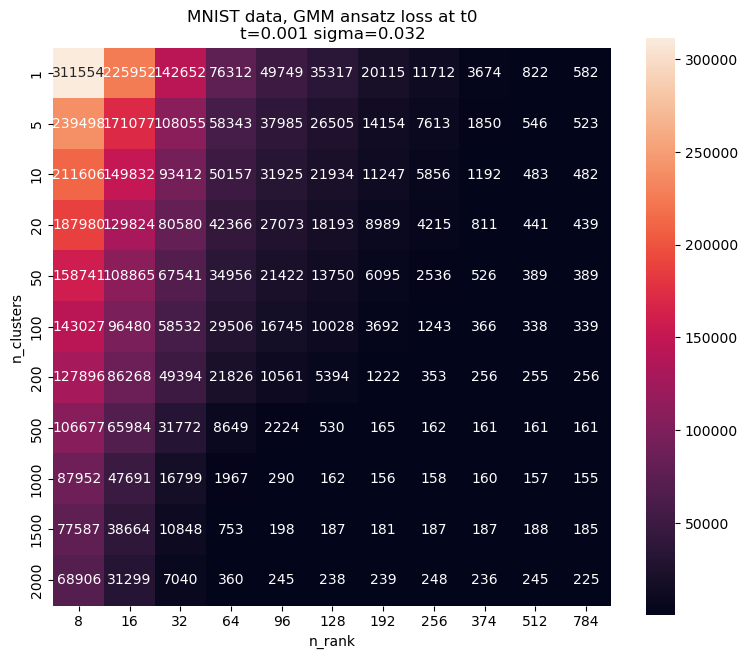

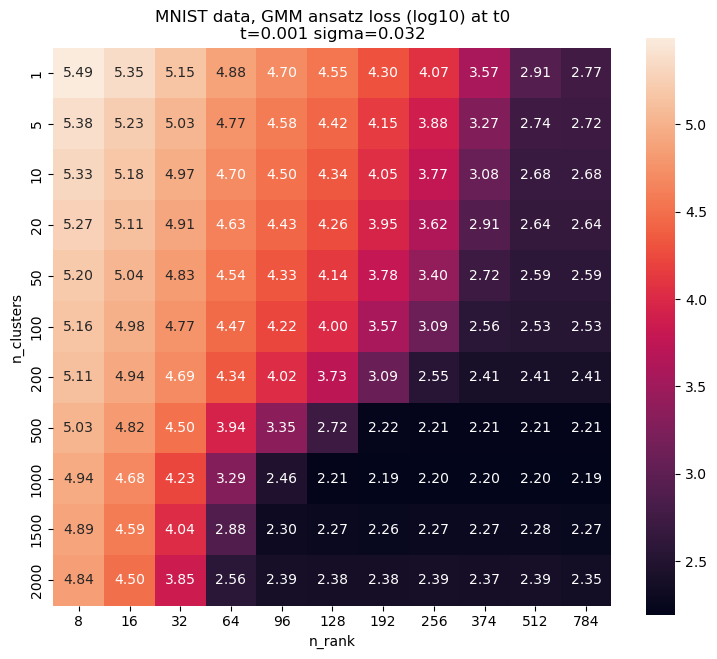

  2%|▏         | 1/51 [00:04<03:44,  4.50s/it]

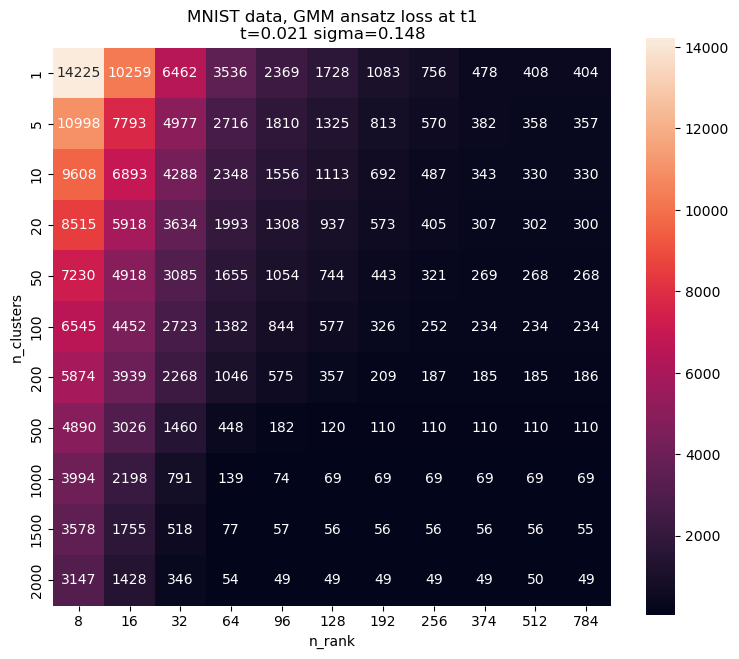

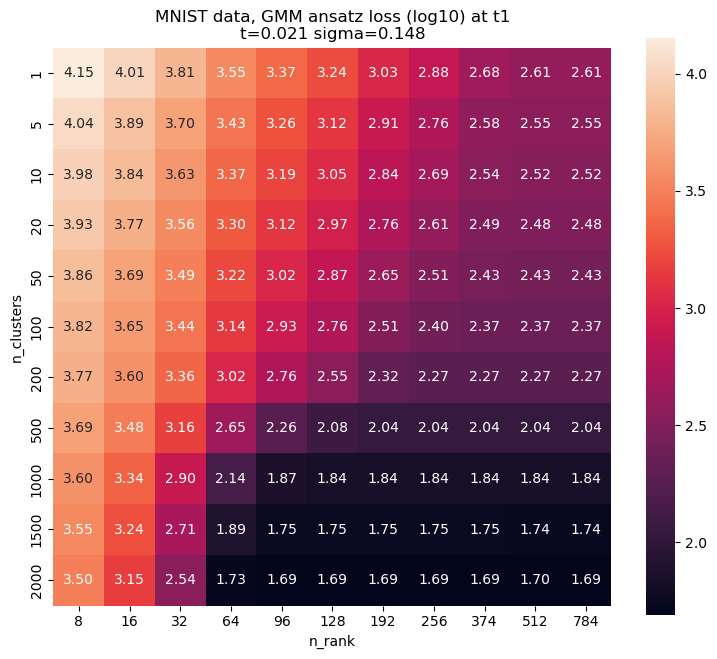

  4%|▍         | 2/51 [00:06<02:35,  3.18s/it]

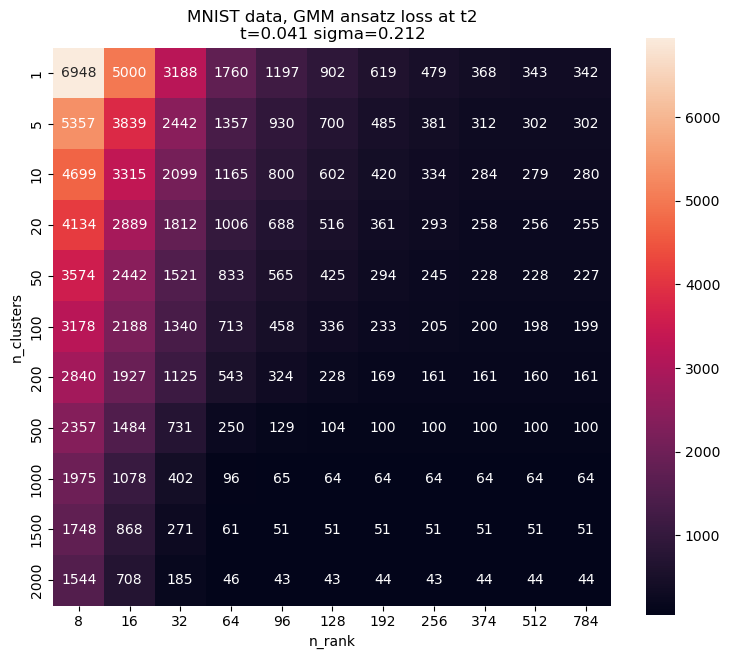

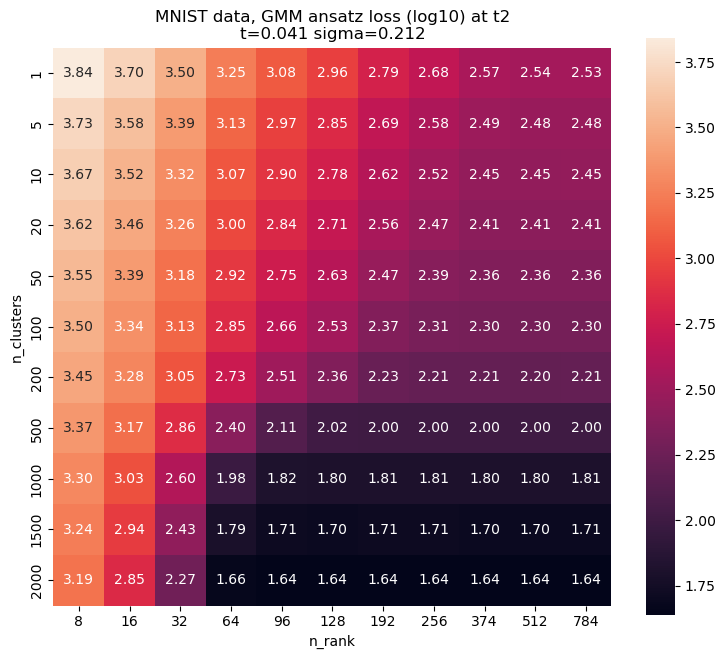

  6%|▌         | 3/51 [00:09<02:17,  2.87s/it]

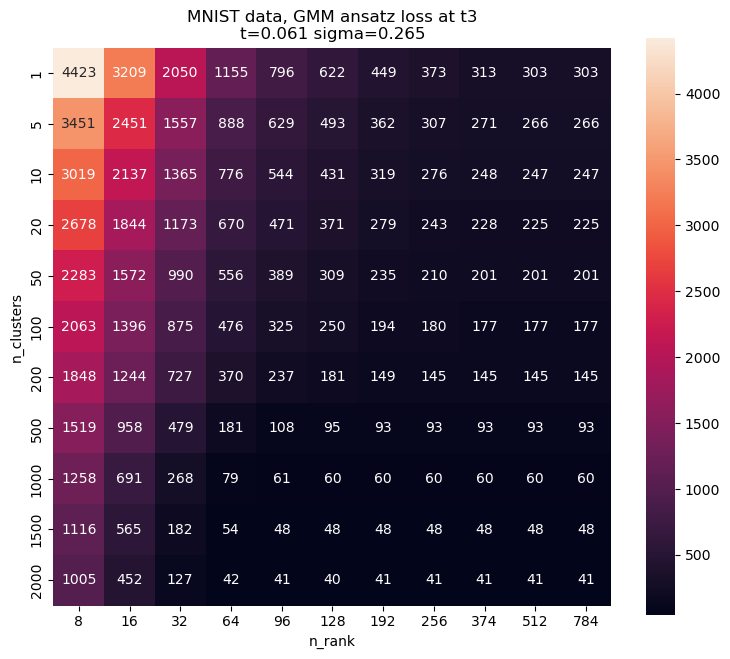

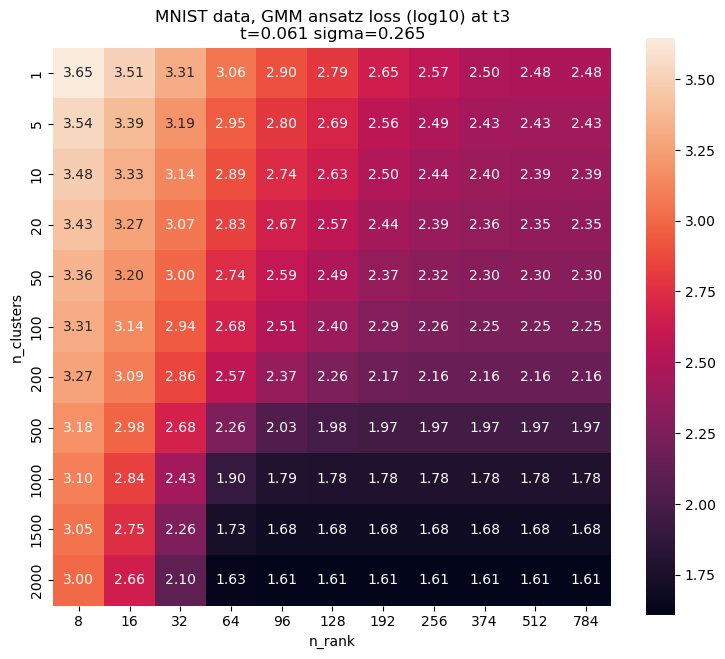

  8%|▊         | 4/51 [00:11<02:03,  2.63s/it]

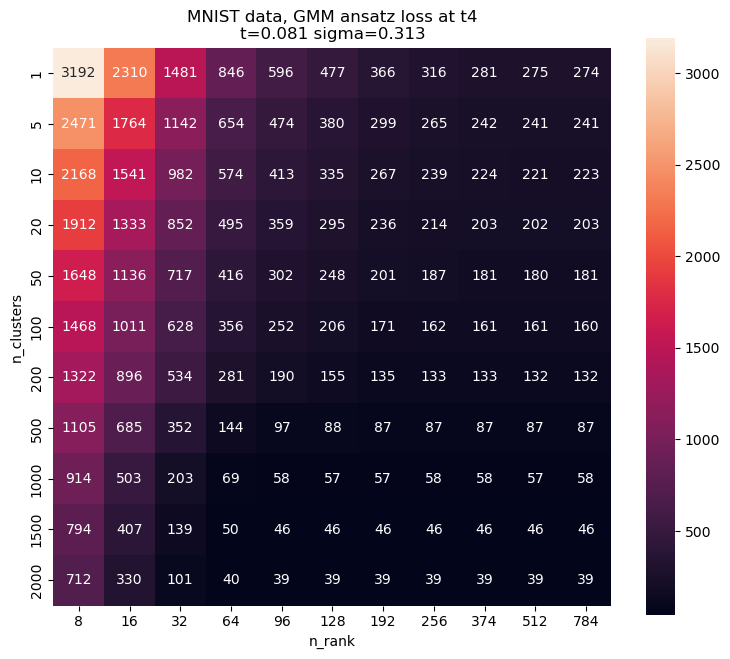

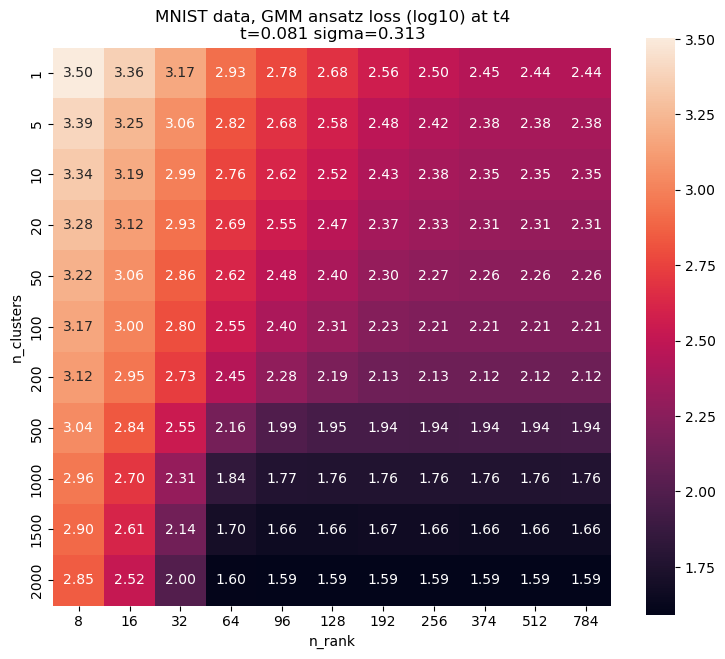

 10%|▉         | 5/51 [00:13<01:53,  2.47s/it]

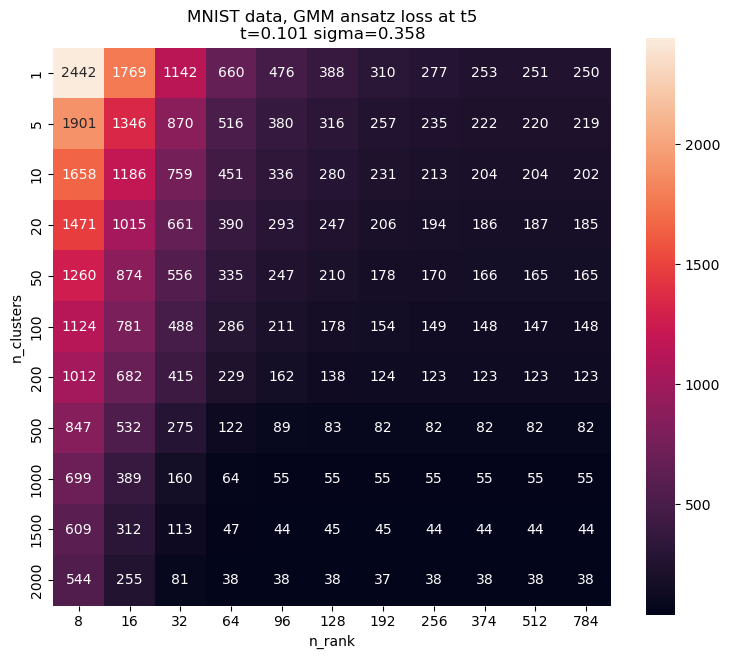

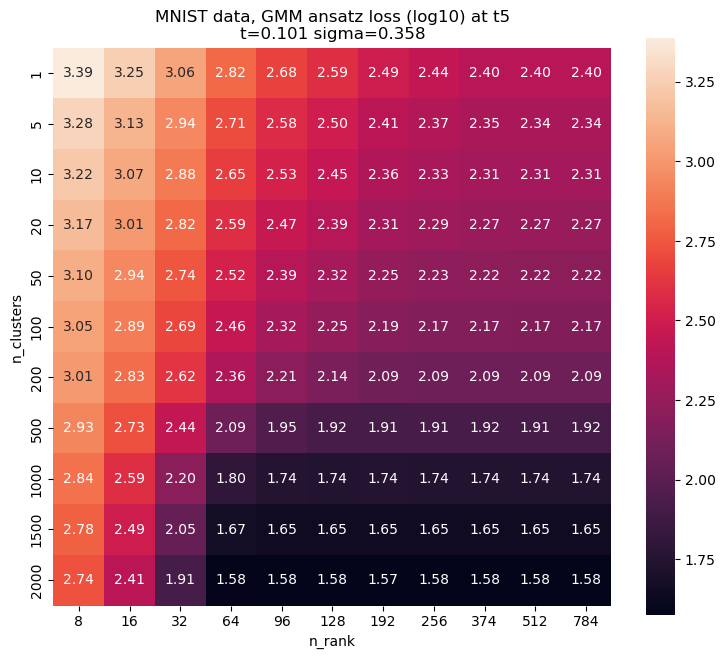

 12%|█▏        | 6/51 [00:16<01:49,  2.44s/it]

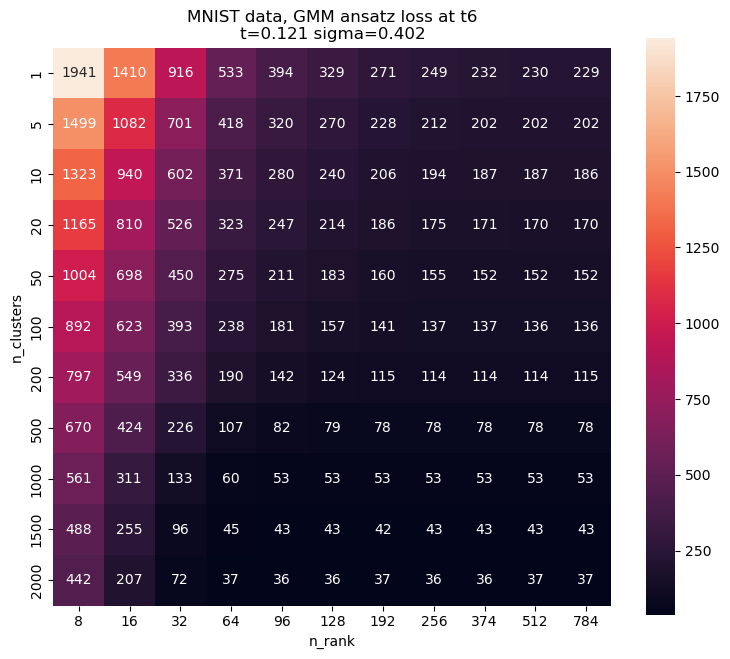

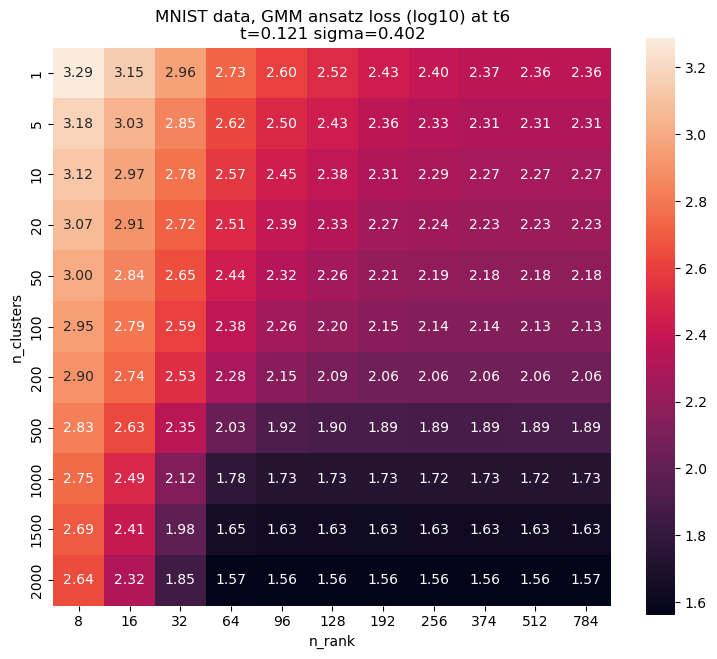

 14%|█▎        | 7/51 [00:18<01:44,  2.37s/it]

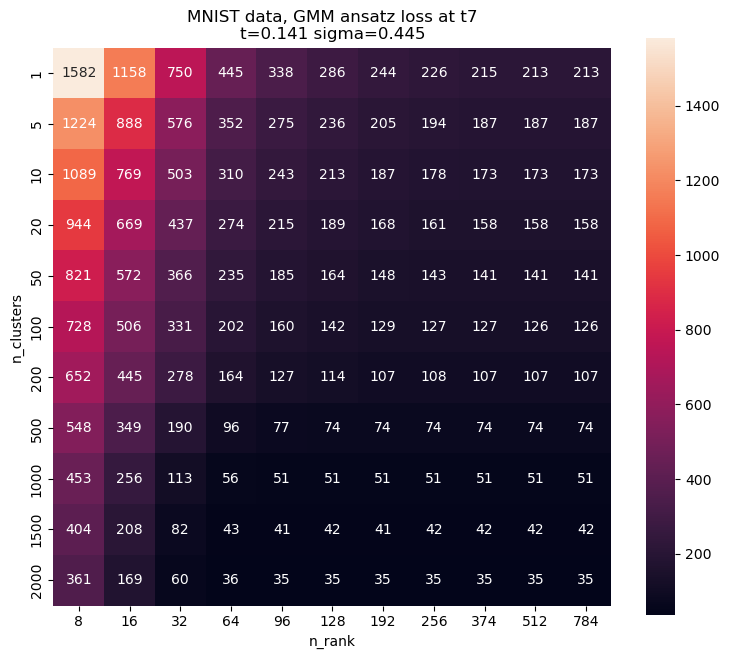

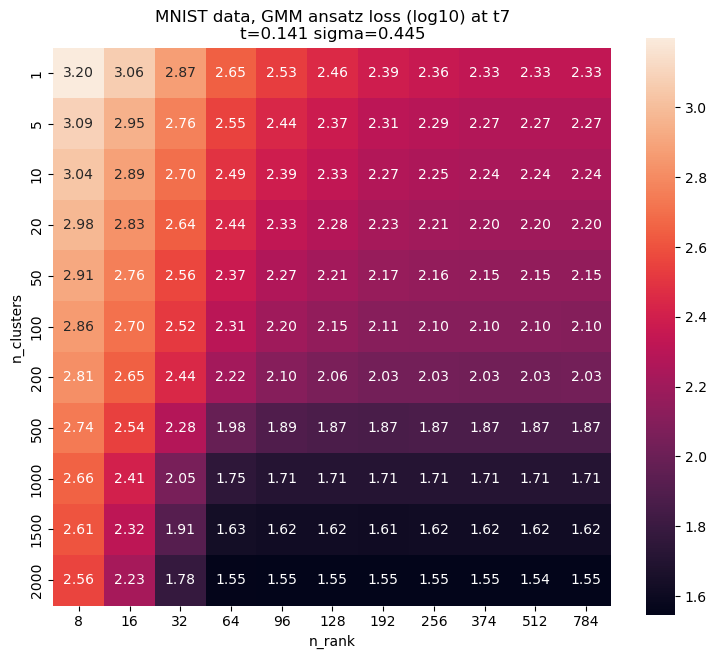

 16%|█▌        | 8/51 [00:20<01:42,  2.38s/it]

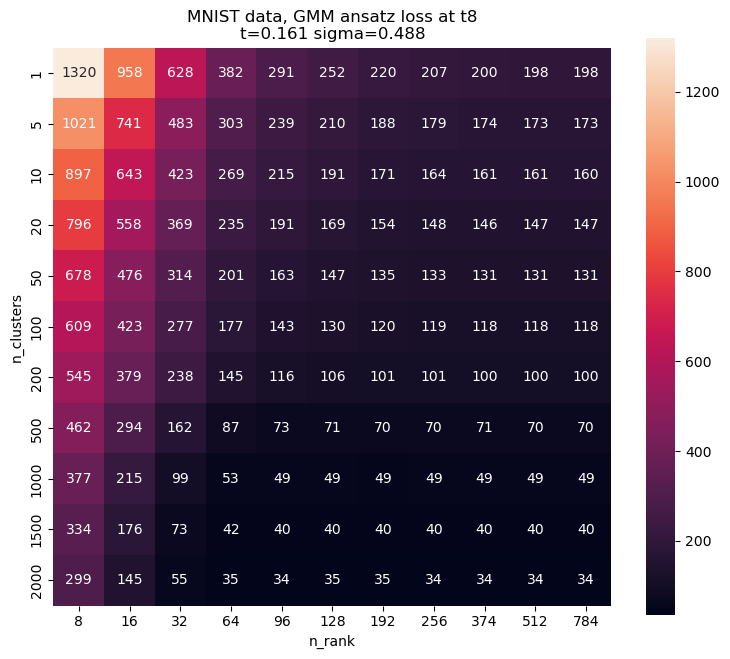

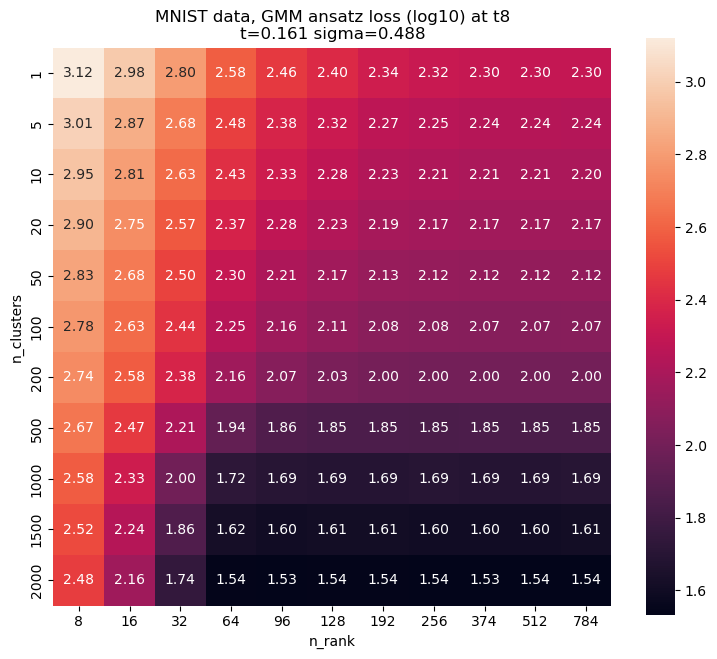

 18%|█▊        | 9/51 [00:22<01:36,  2.31s/it]

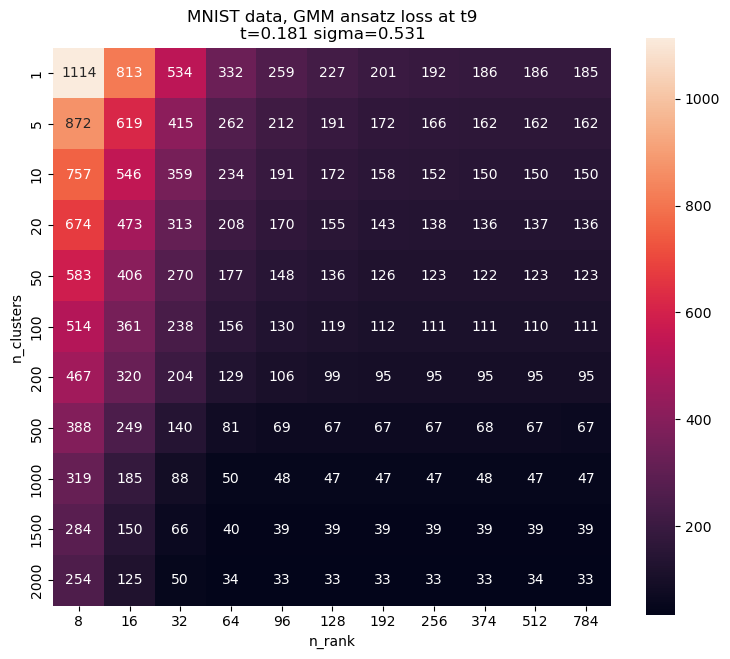

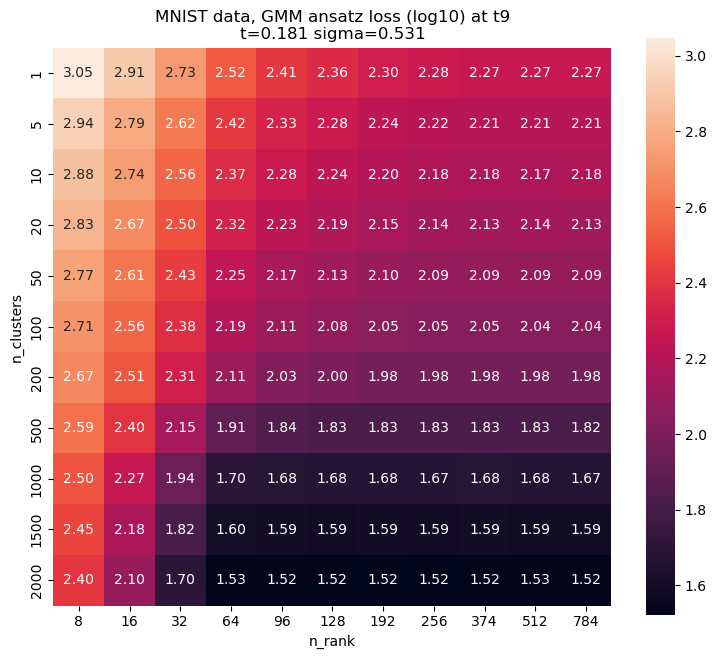

 20%|█▉        | 10/51 [00:25<01:35,  2.32s/it]

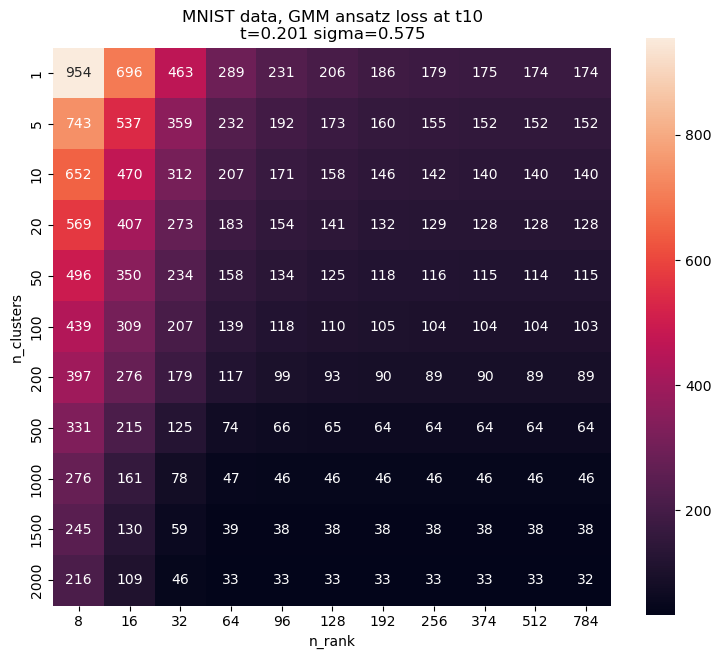

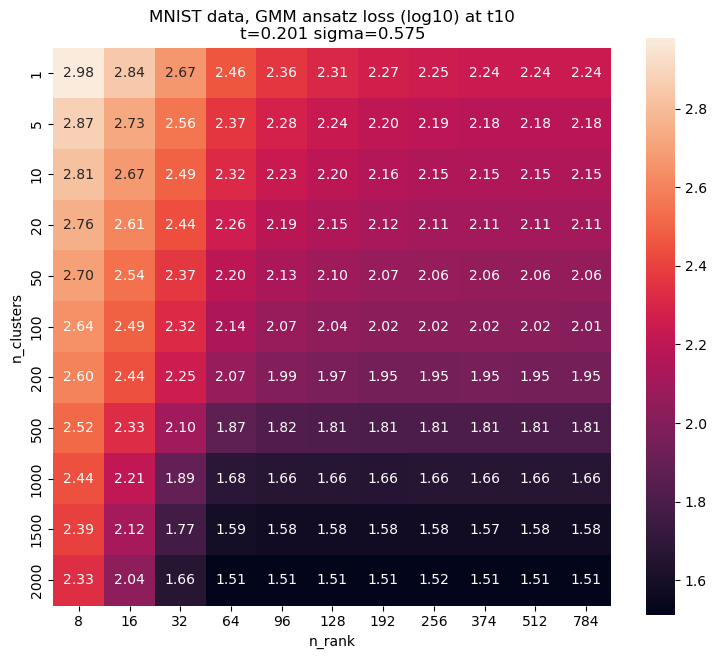

 22%|██▏       | 11/51 [00:27<01:30,  2.27s/it]

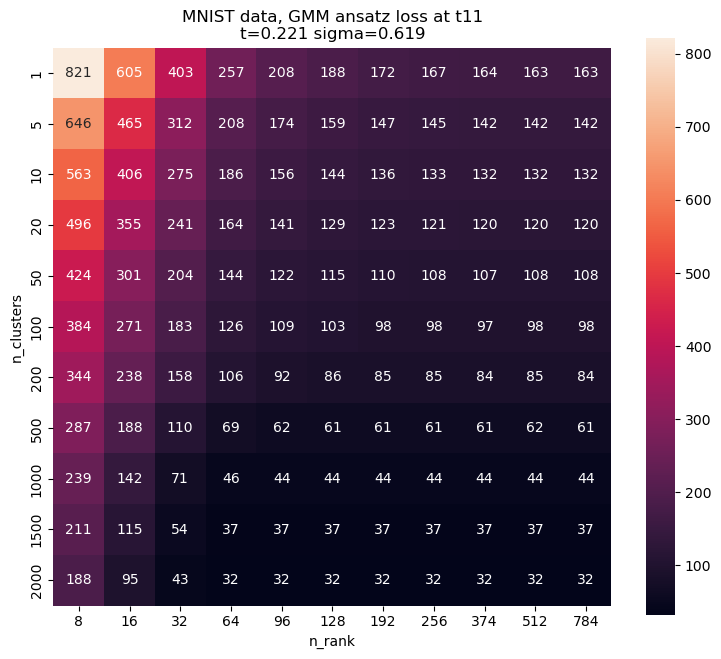

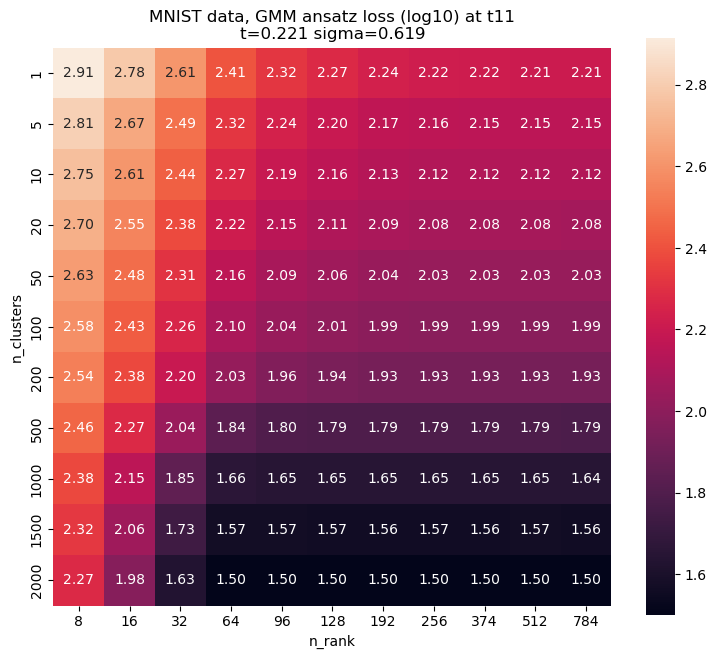

 24%|██▎       | 12/51 [00:29<01:29,  2.29s/it]

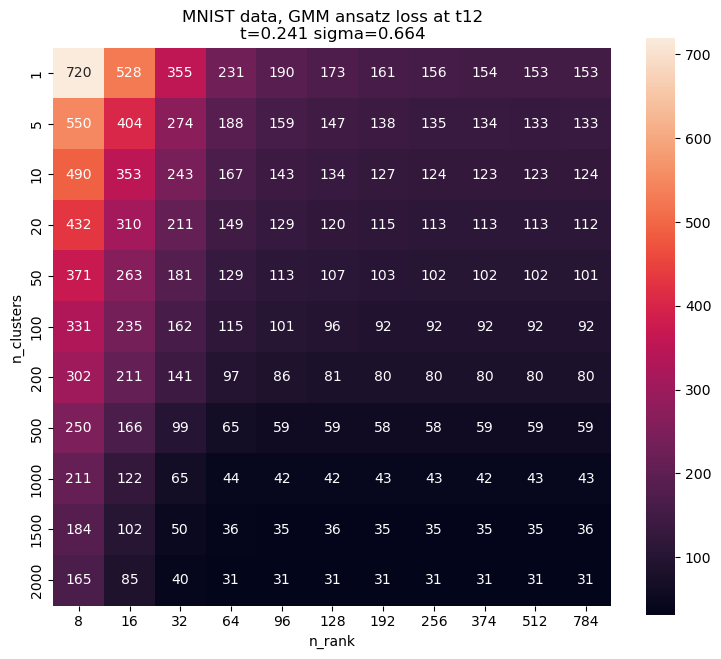

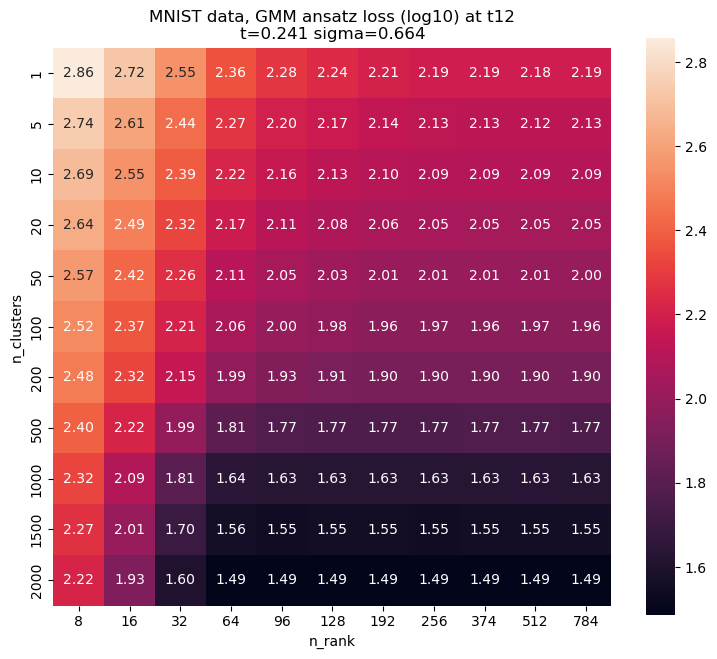

 25%|██▌       | 13/51 [00:31<01:25,  2.25s/it]

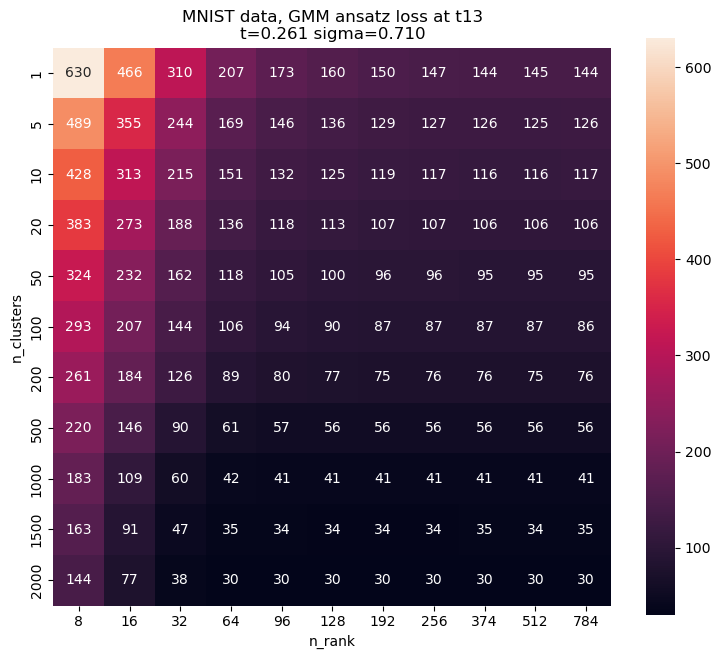

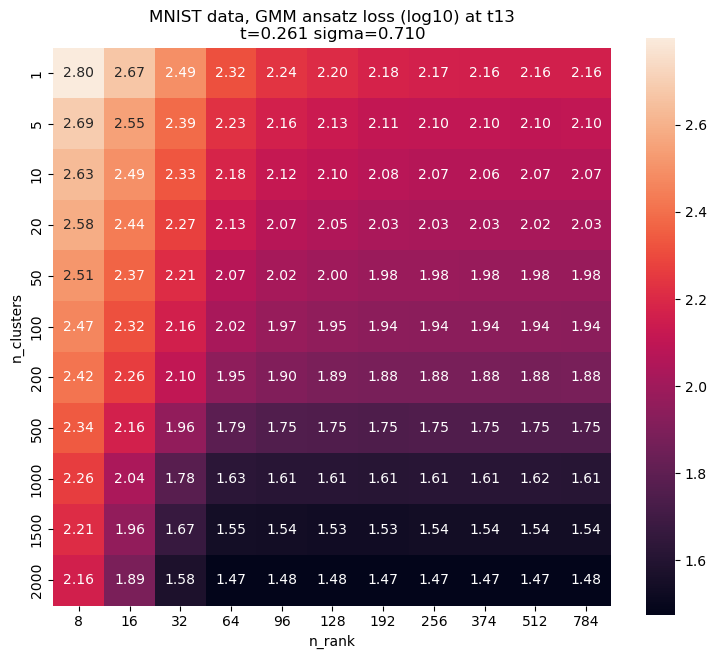

 27%|██▋       | 14/51 [00:34<01:23,  2.26s/it]

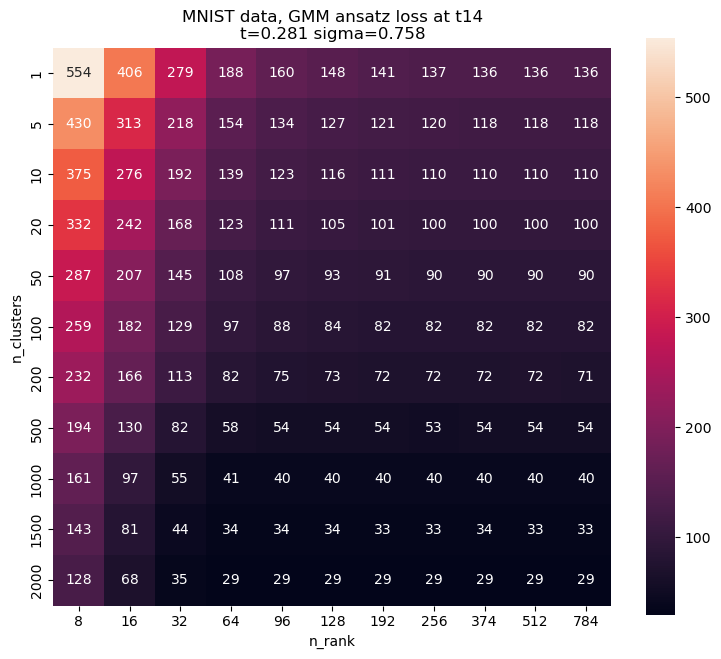

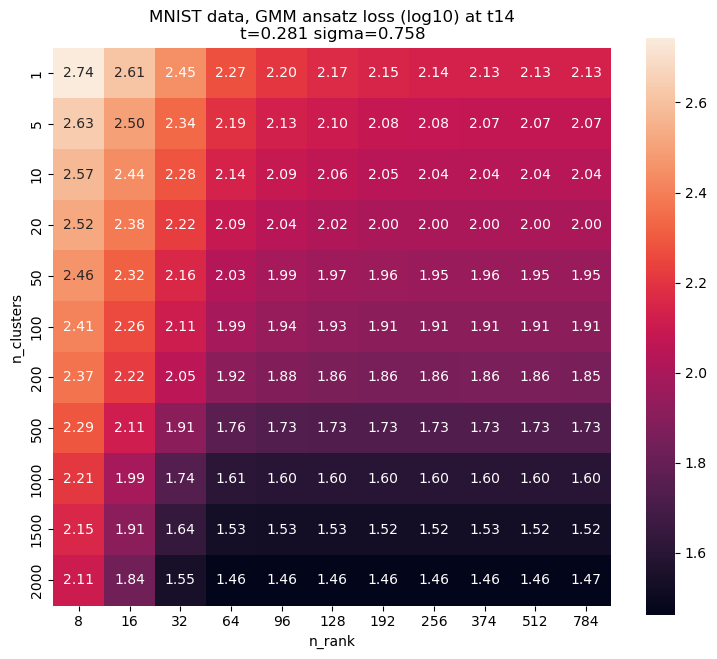

 29%|██▉       | 15/51 [00:36<01:20,  2.23s/it]

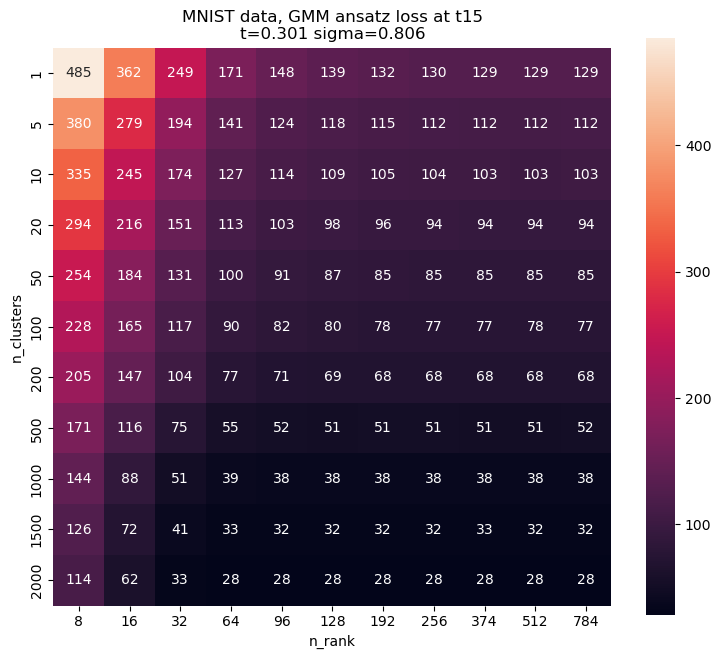

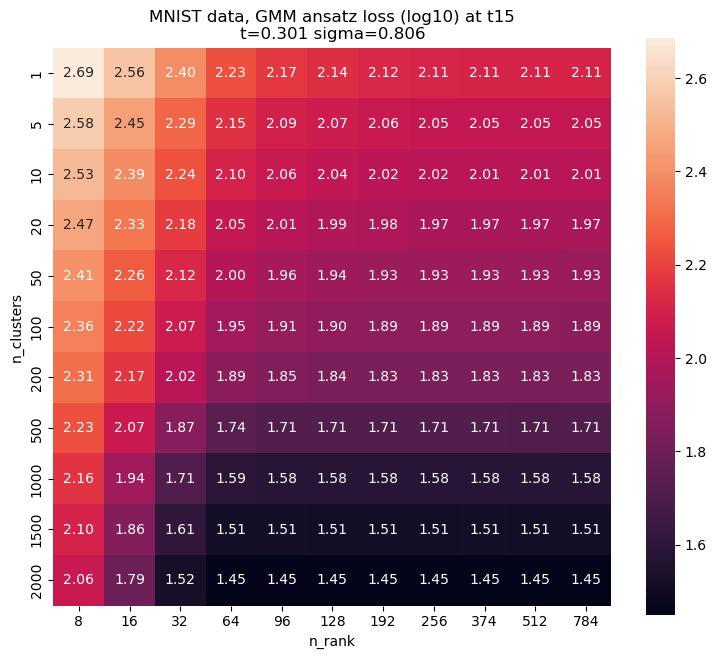

 31%|███▏      | 16/51 [00:38<01:18,  2.24s/it]

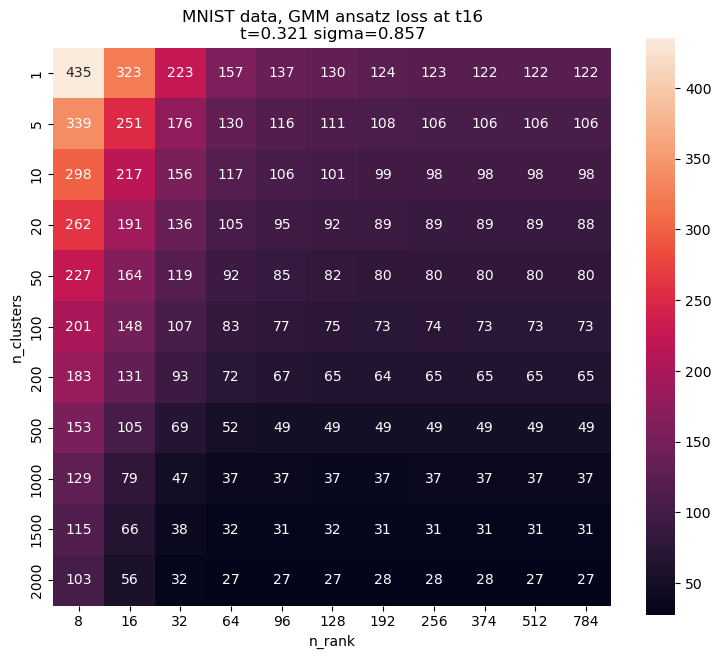

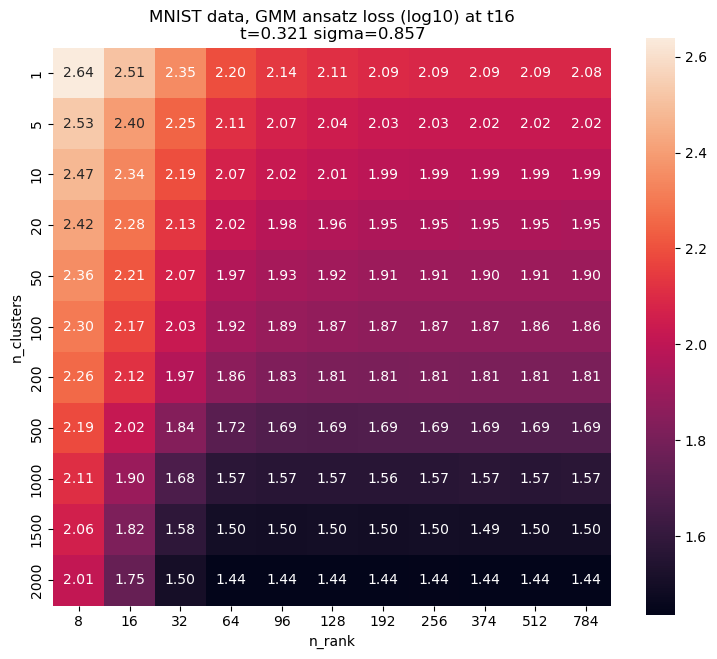

 33%|███▎      | 17/51 [00:40<01:14,  2.19s/it]

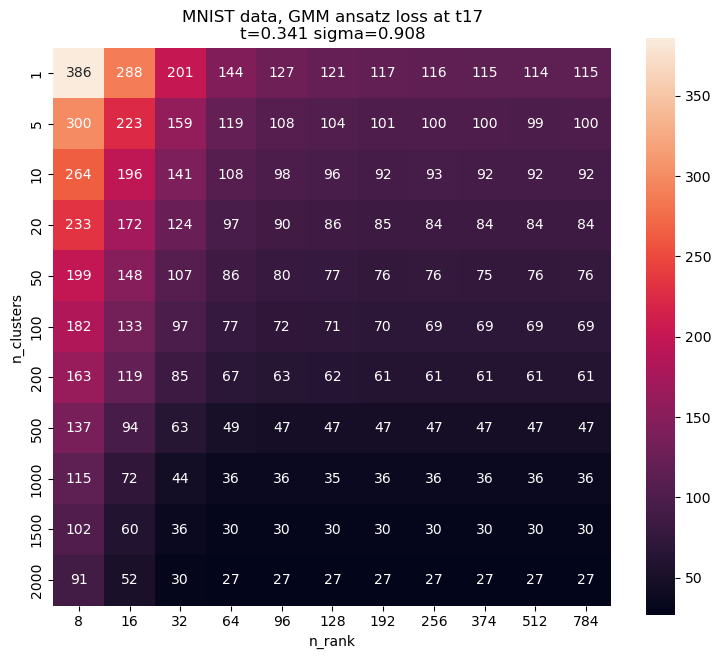

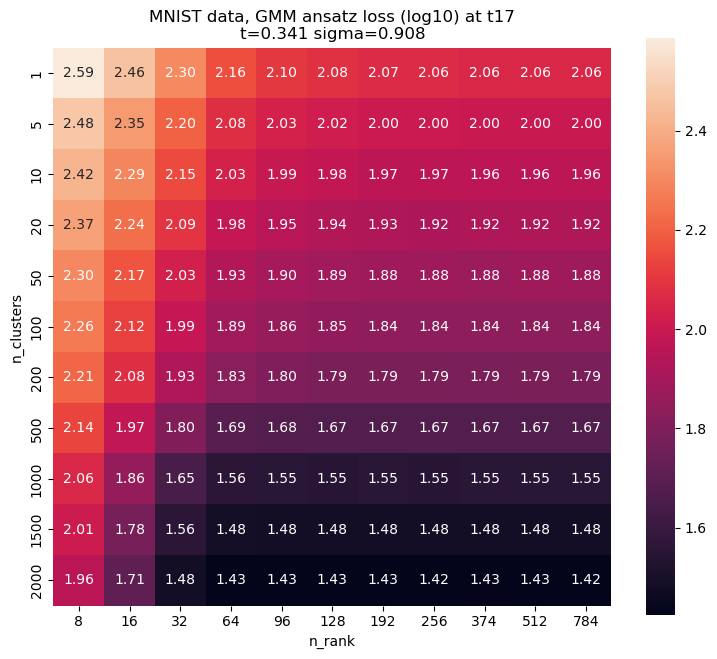

 35%|███▌      | 18/51 [00:42<01:13,  2.22s/it]

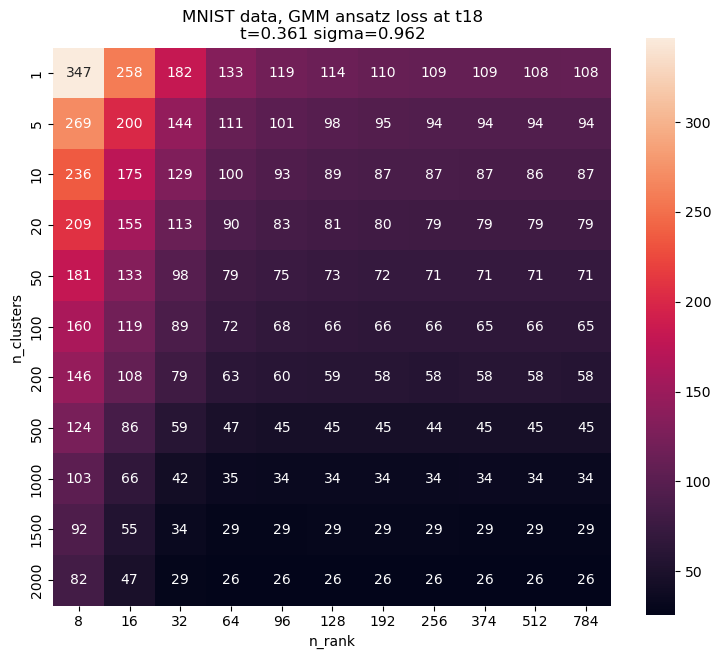

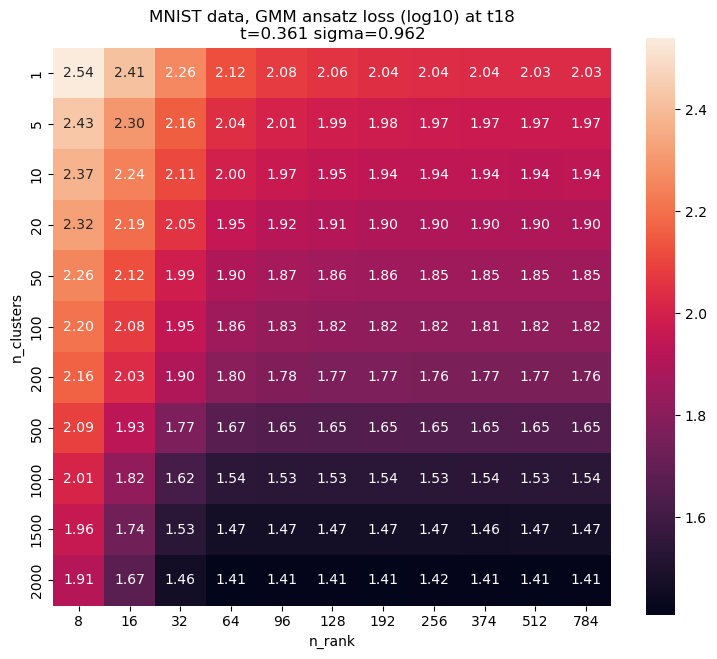

 37%|███▋      | 19/51 [00:45<01:09,  2.18s/it]

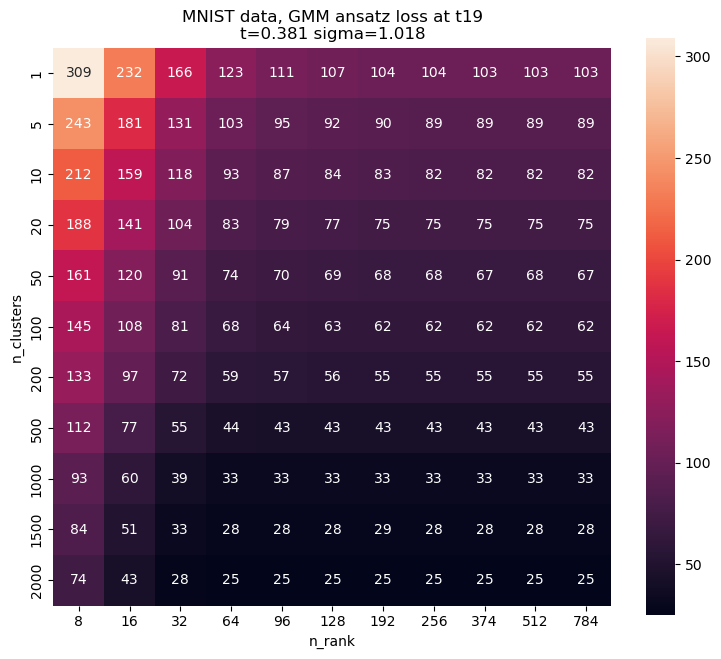

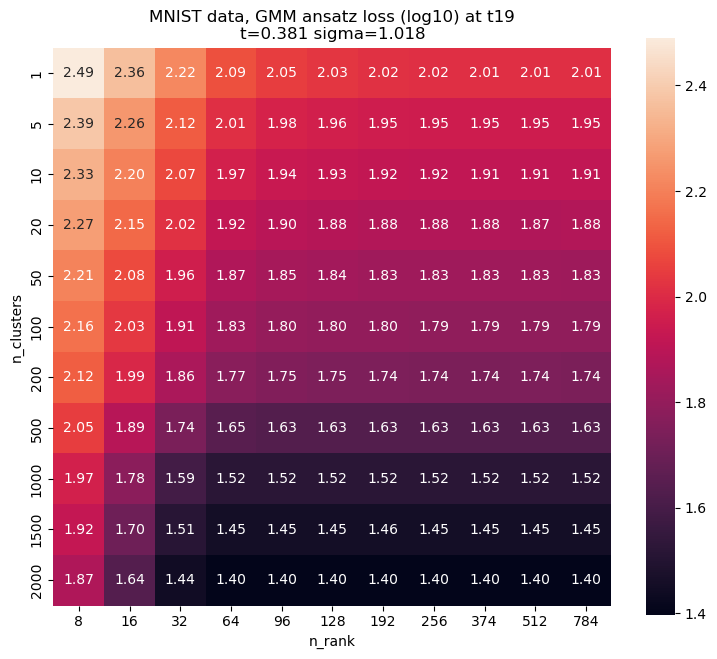

 39%|███▉      | 20/51 [00:47<01:08,  2.21s/it]

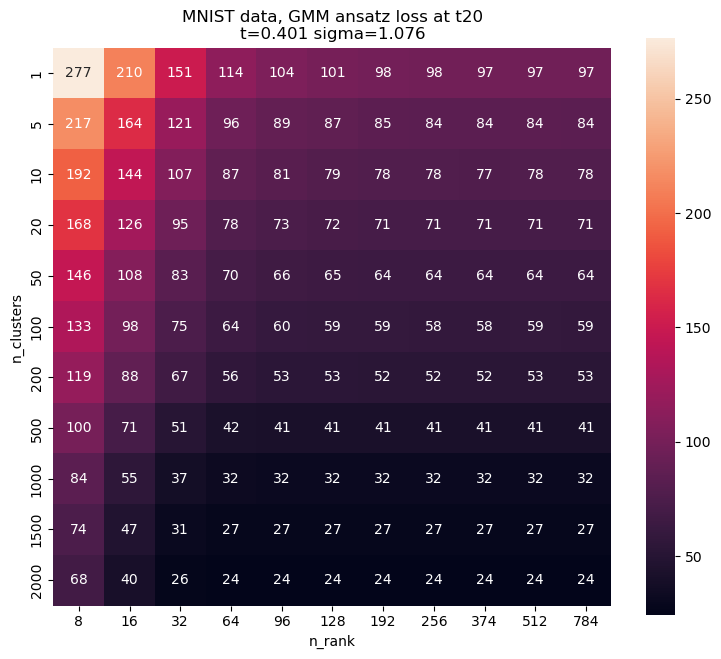

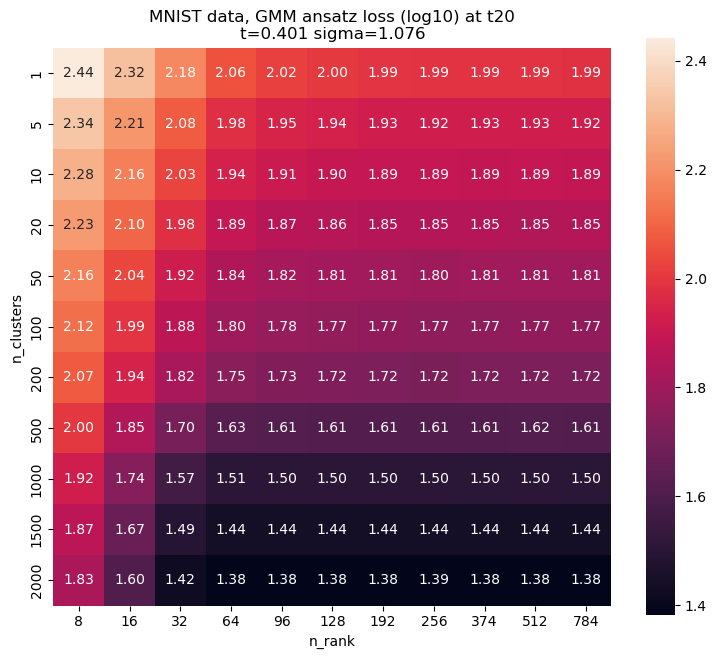

 41%|████      | 21/51 [00:49<01:05,  2.18s/it]

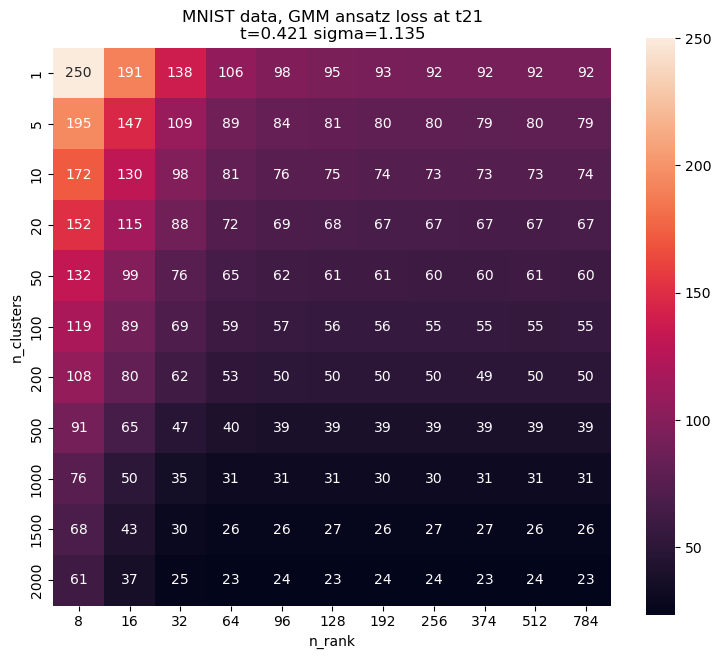

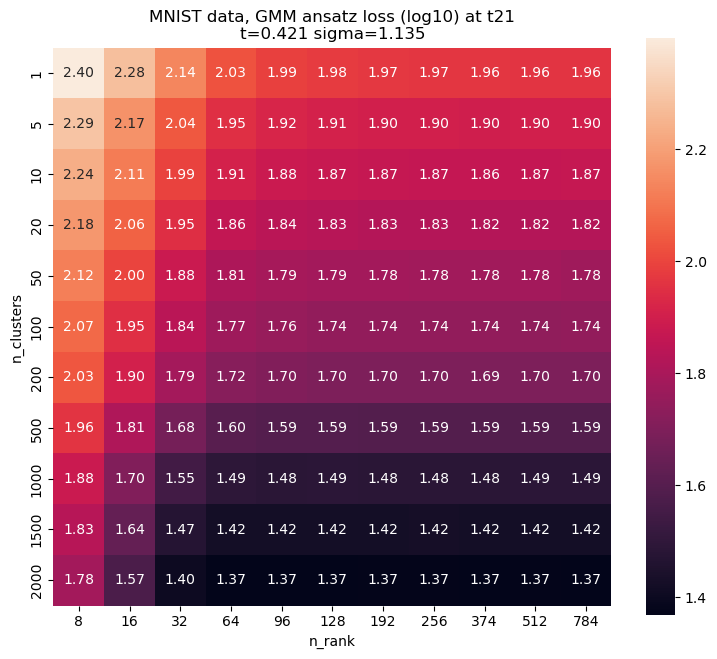

 43%|████▎     | 22/51 [00:51<01:03,  2.20s/it]

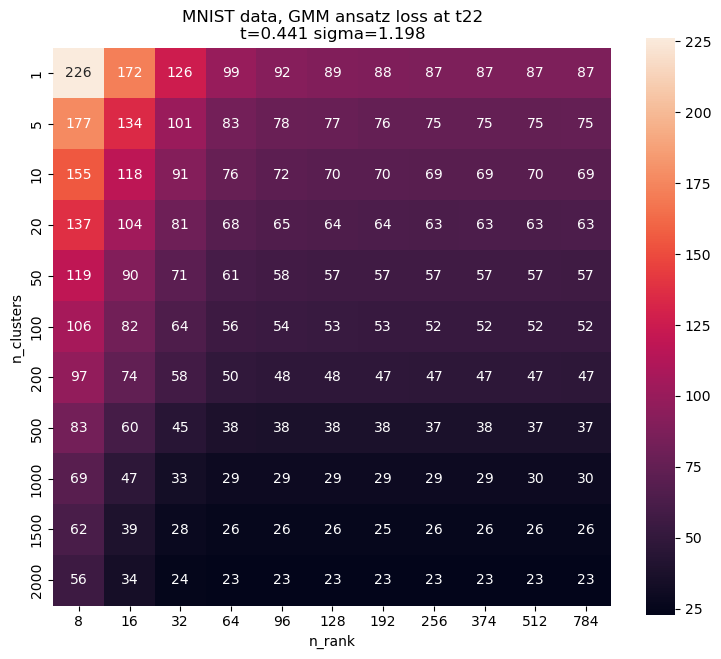

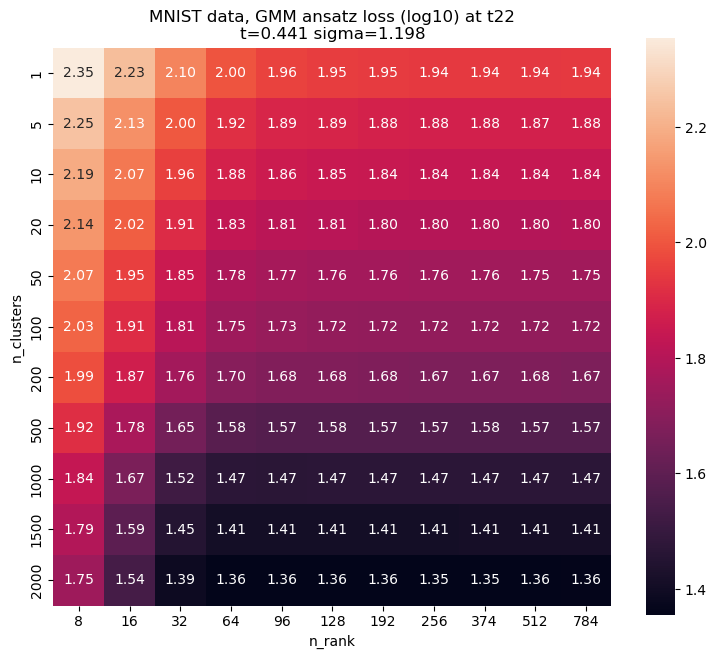

 45%|████▌     | 23/51 [00:53<01:00,  2.16s/it]

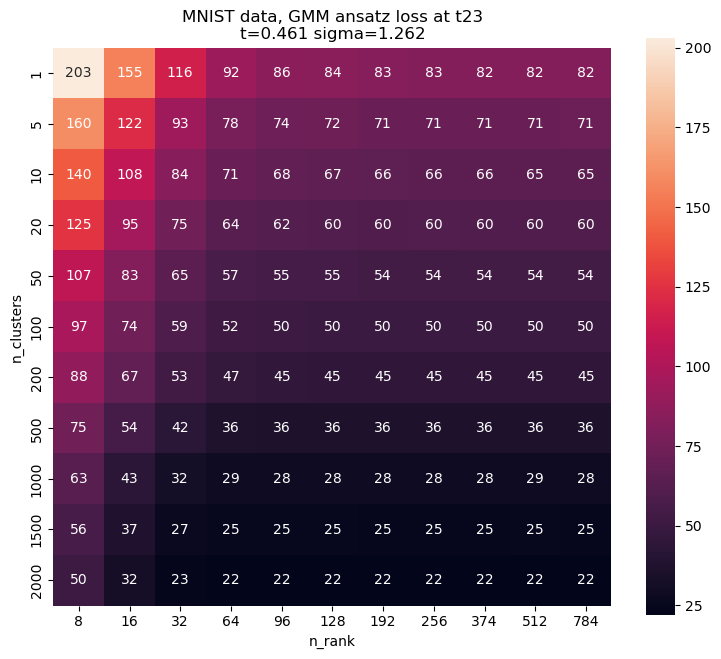

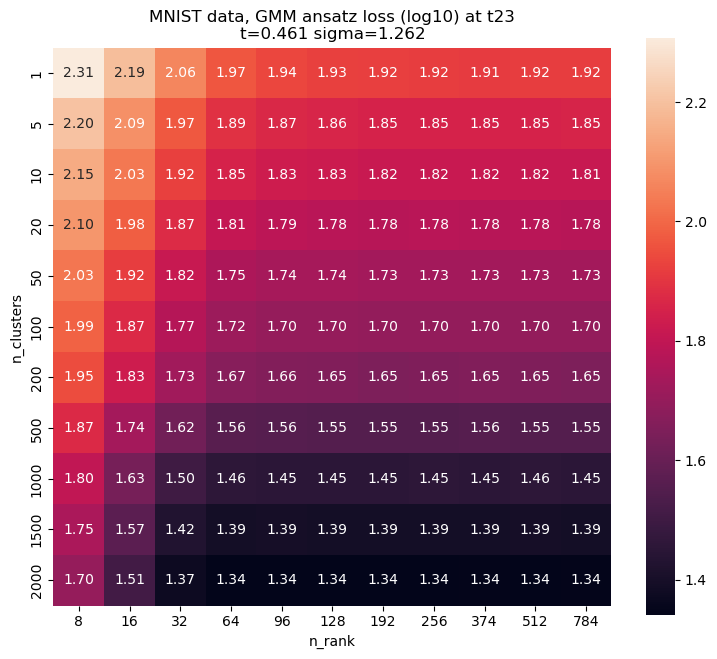

 47%|████▋     | 24/51 [00:55<00:58,  2.18s/it]

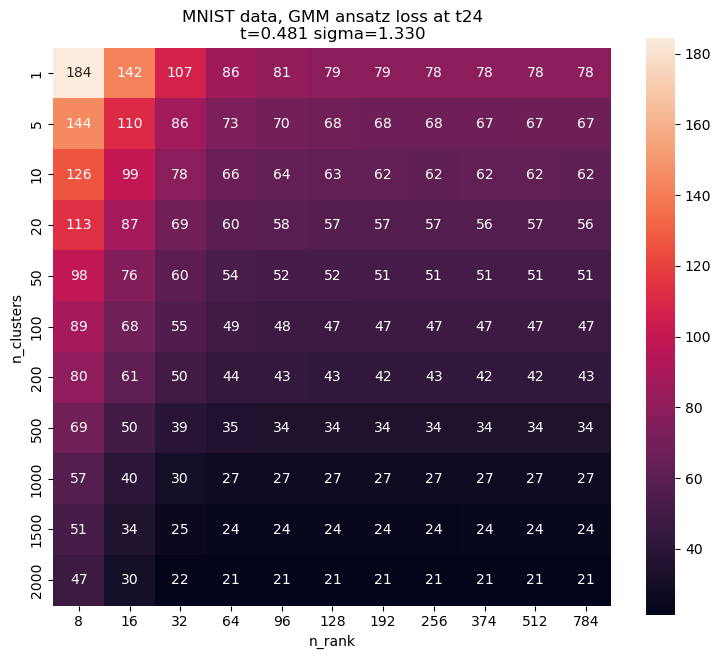

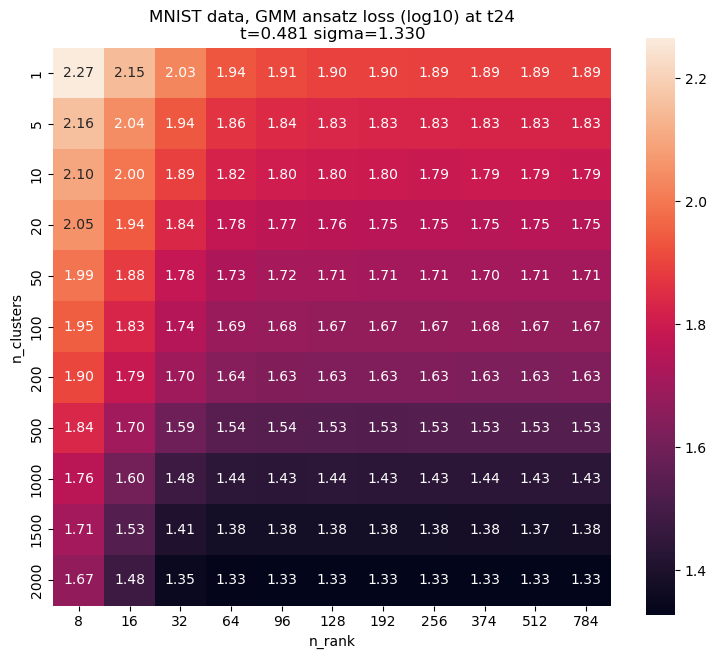

 49%|████▉     | 25/51 [00:57<00:55,  2.14s/it]

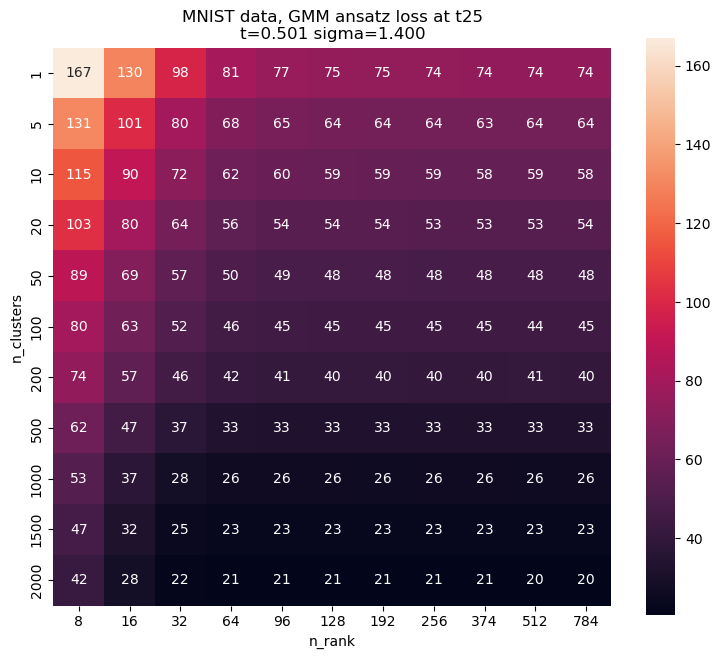

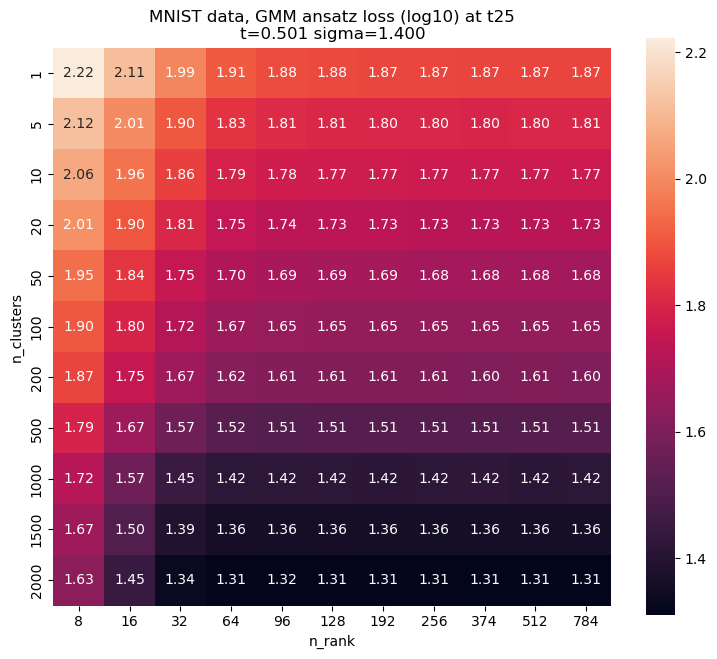

 51%|█████     | 26/51 [01:00<00:52,  2.11s/it]

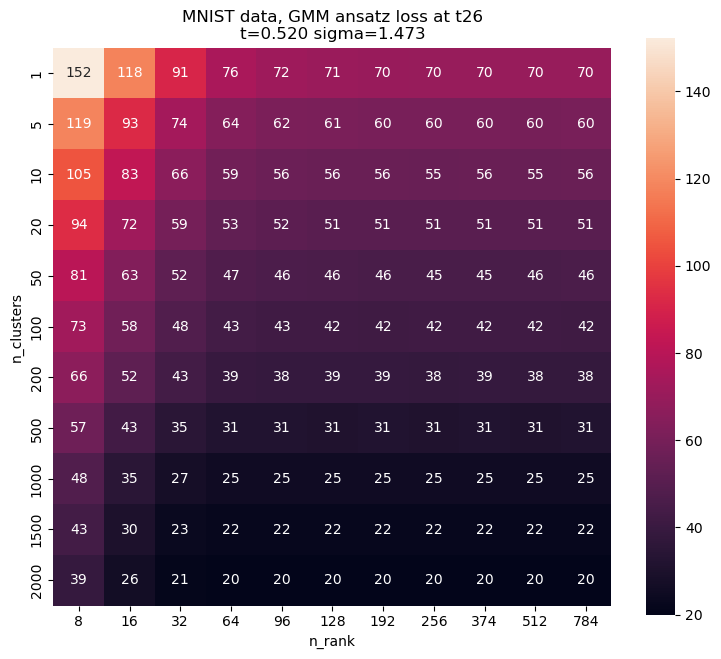

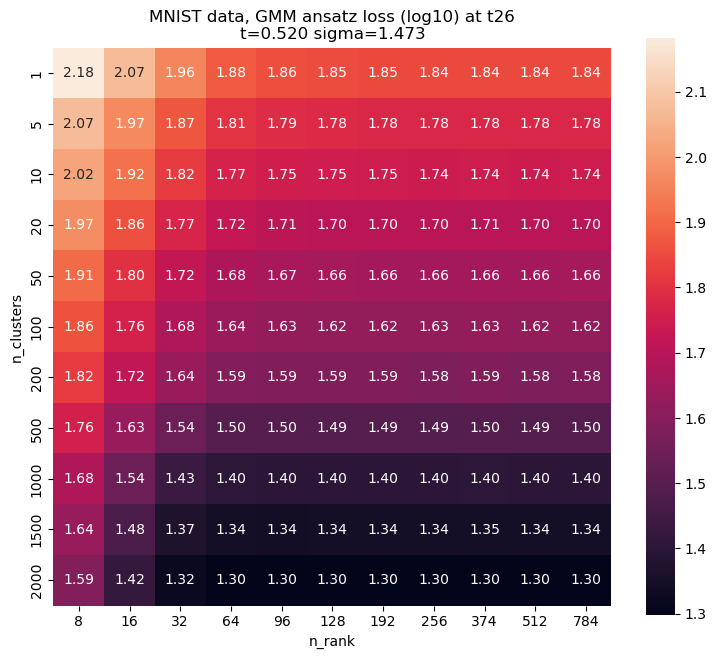

 53%|█████▎    | 27/51 [01:02<00:51,  2.15s/it]

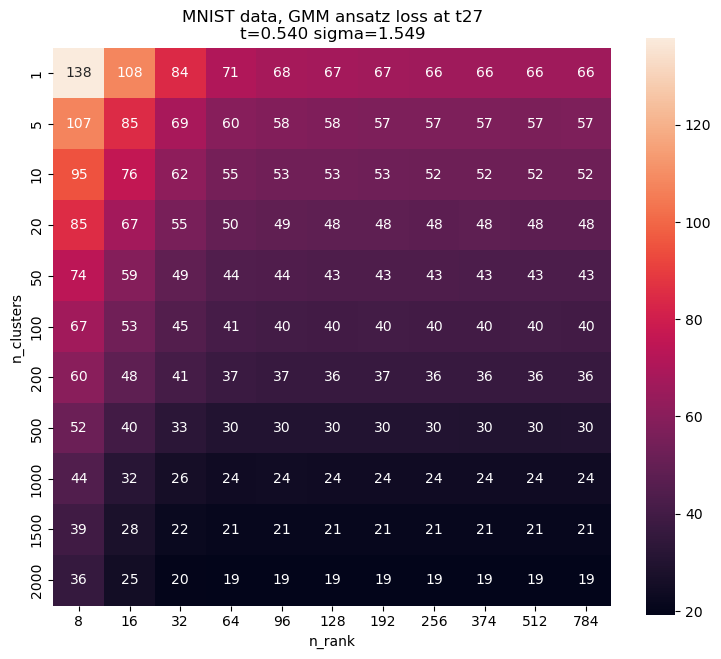

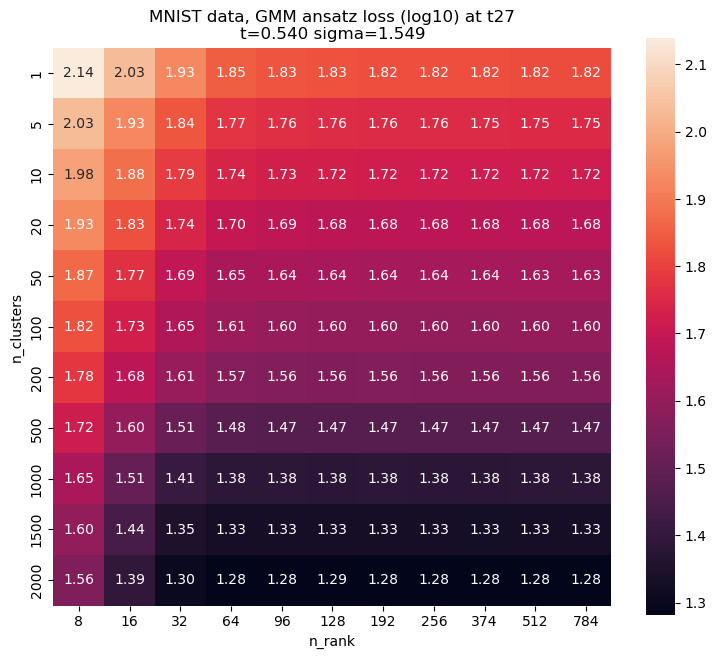

 55%|█████▍    | 28/51 [01:04<00:48,  2.11s/it]

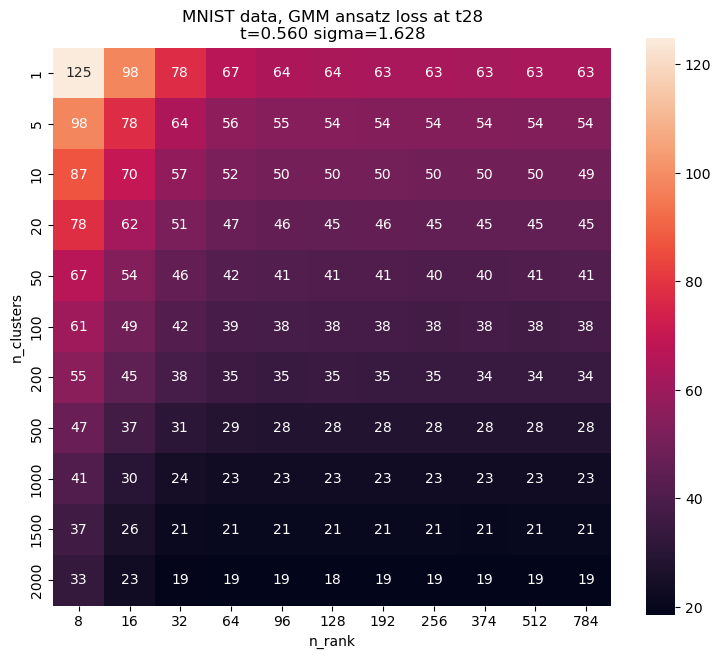

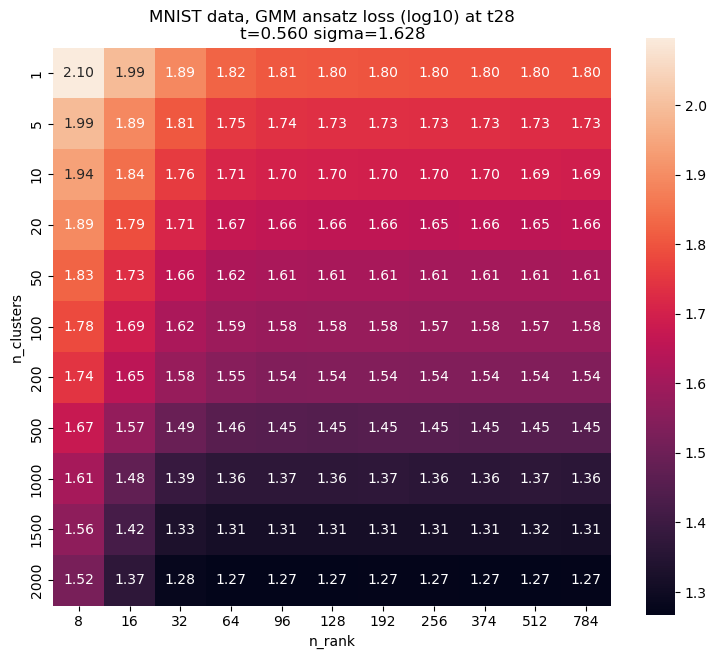

 57%|█████▋    | 29/51 [01:06<00:47,  2.14s/it]

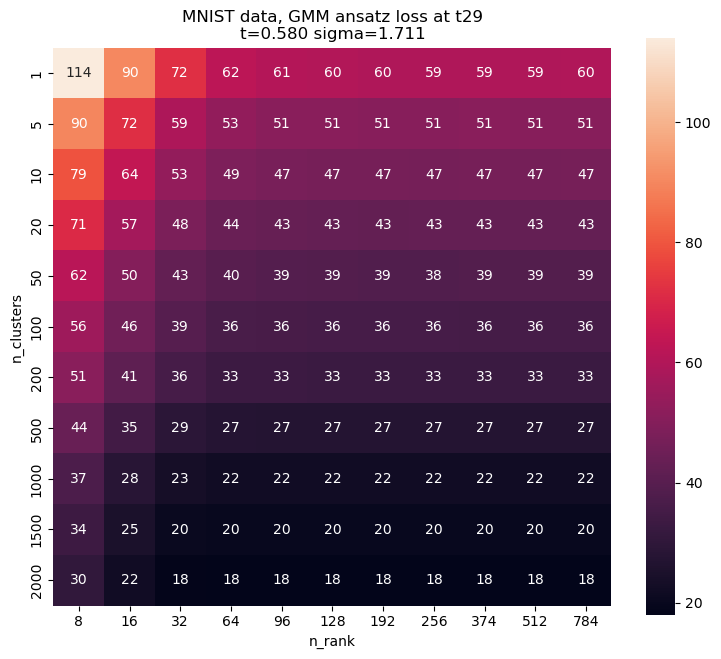

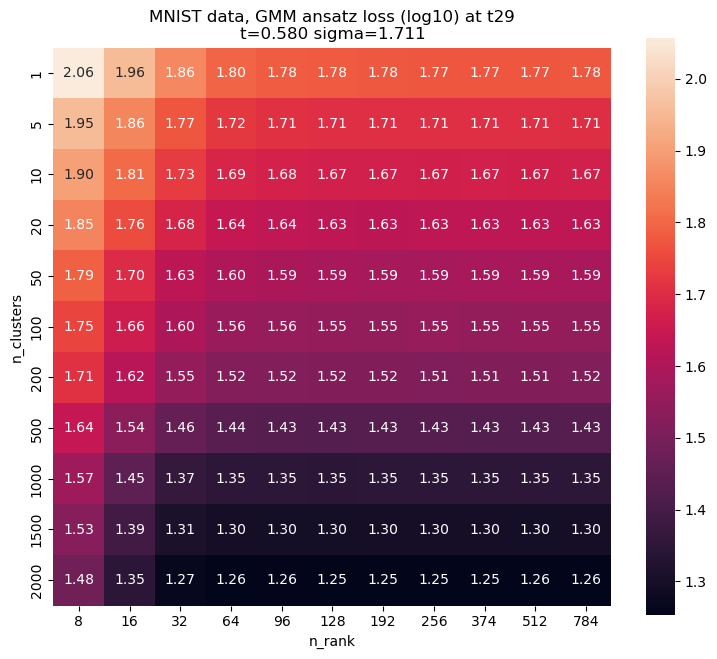

 59%|█████▉    | 30/51 [01:08<00:44,  2.11s/it]

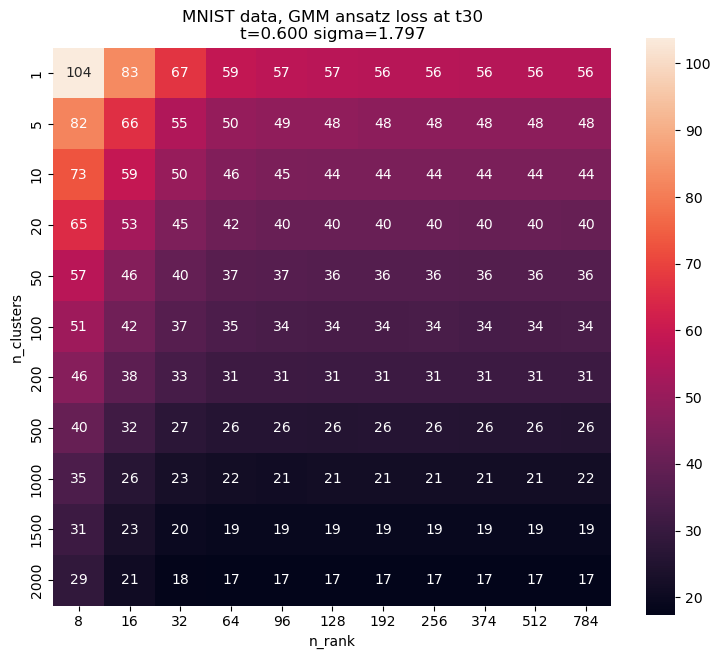

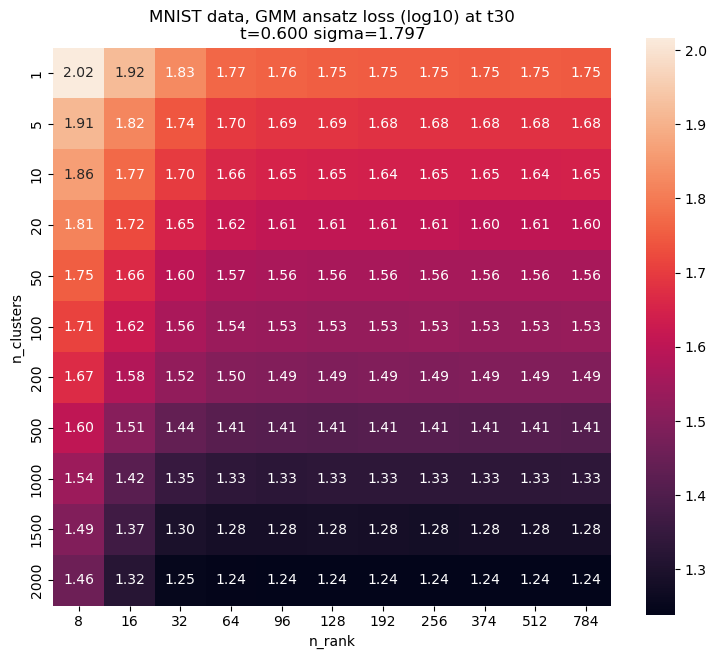

 61%|██████    | 31/51 [01:10<00:42,  2.14s/it]

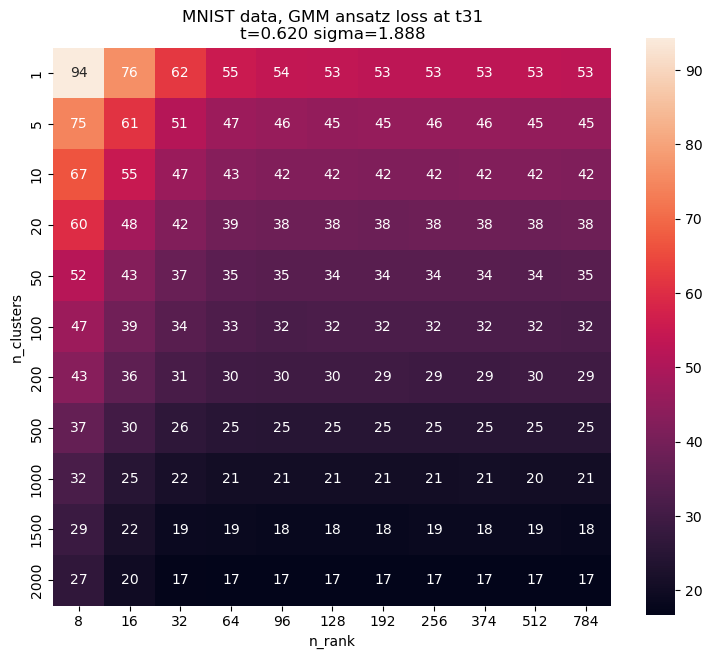

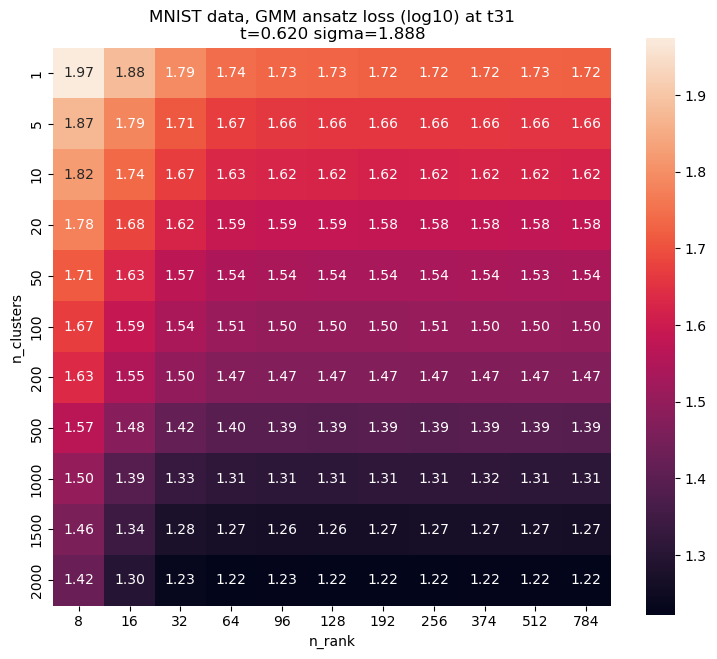

 63%|██████▎   | 32/51 [01:12<00:39,  2.10s/it]

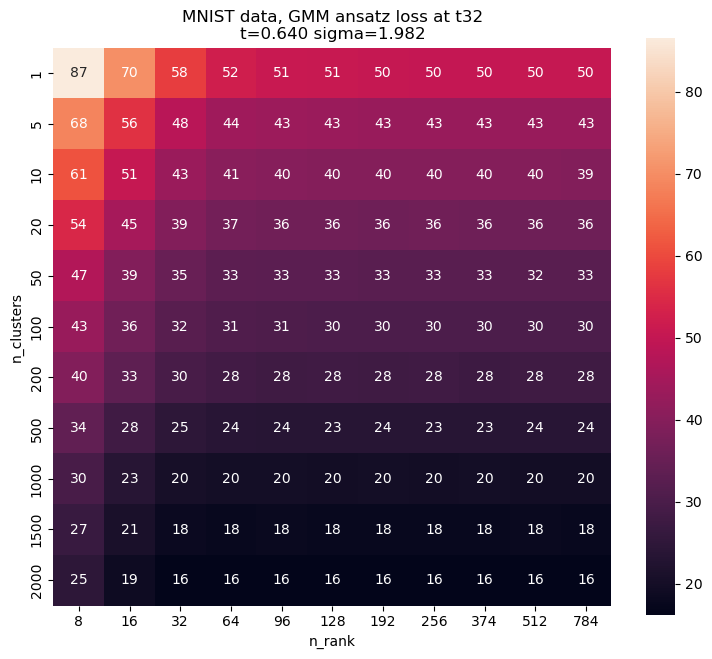

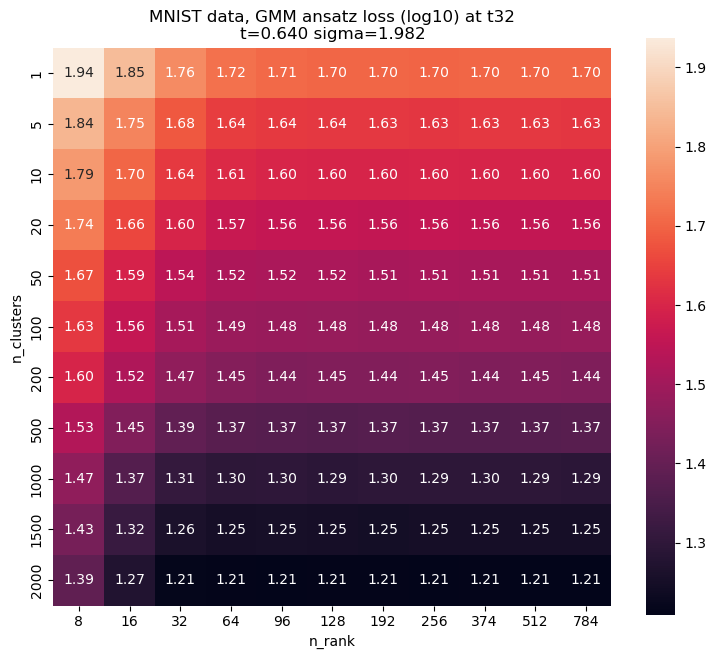

 65%|██████▍   | 33/51 [01:14<00:38,  2.13s/it]

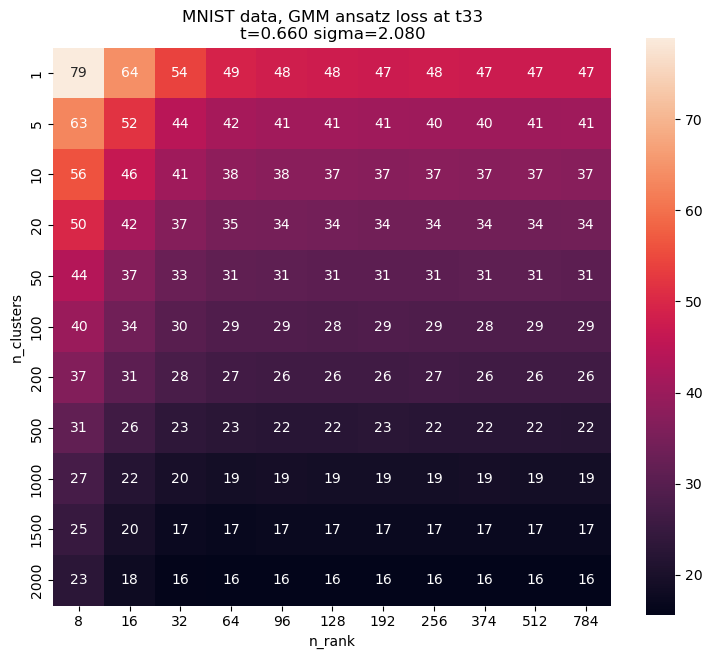

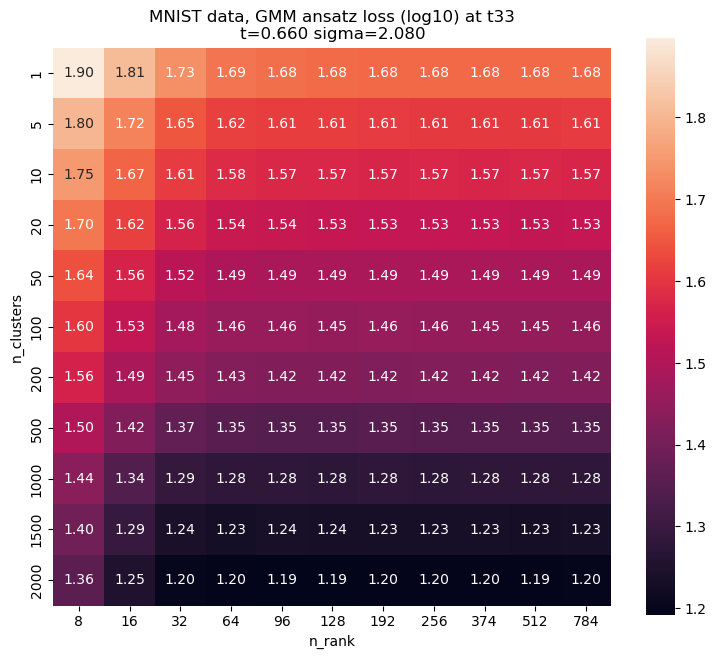

 67%|██████▋   | 34/51 [01:16<00:35,  2.10s/it]

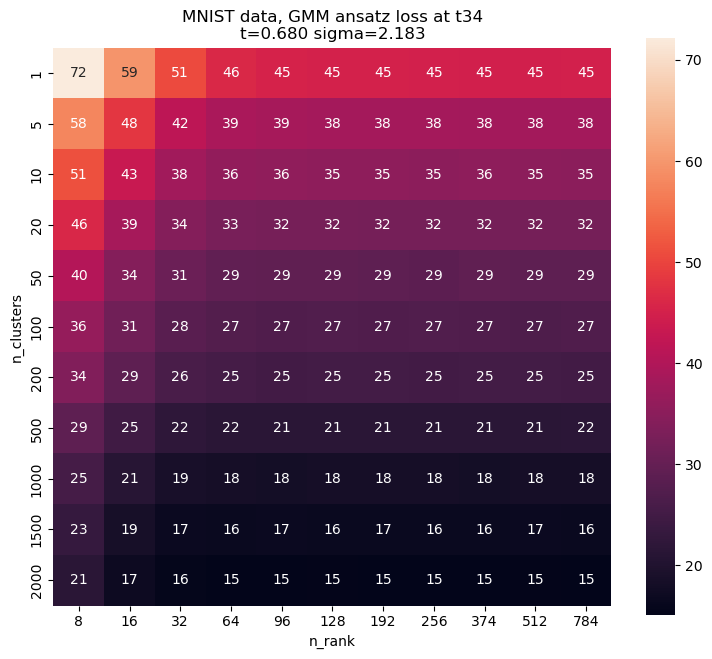

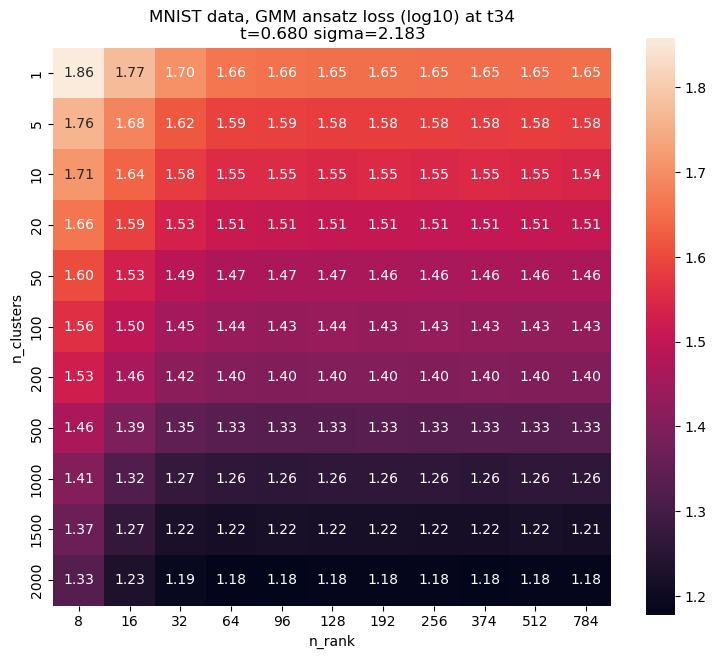

 69%|██████▊   | 35/51 [01:19<00:33,  2.11s/it]

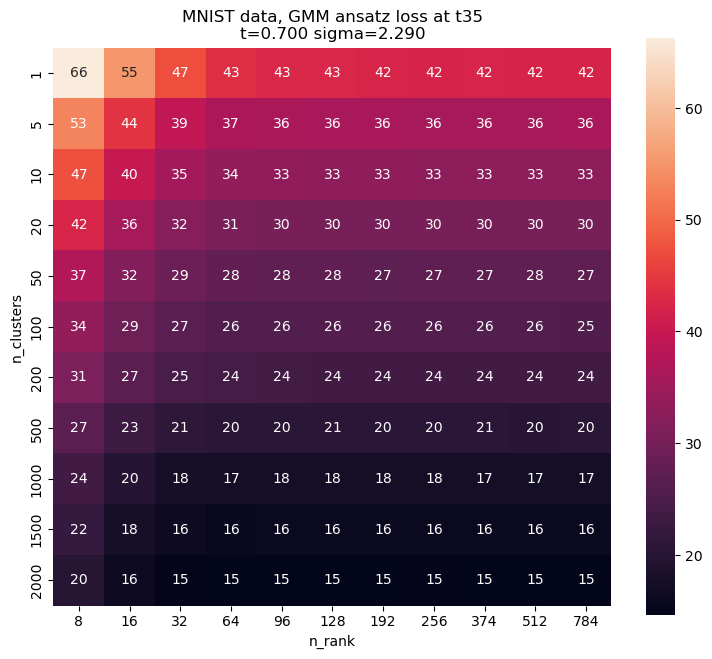

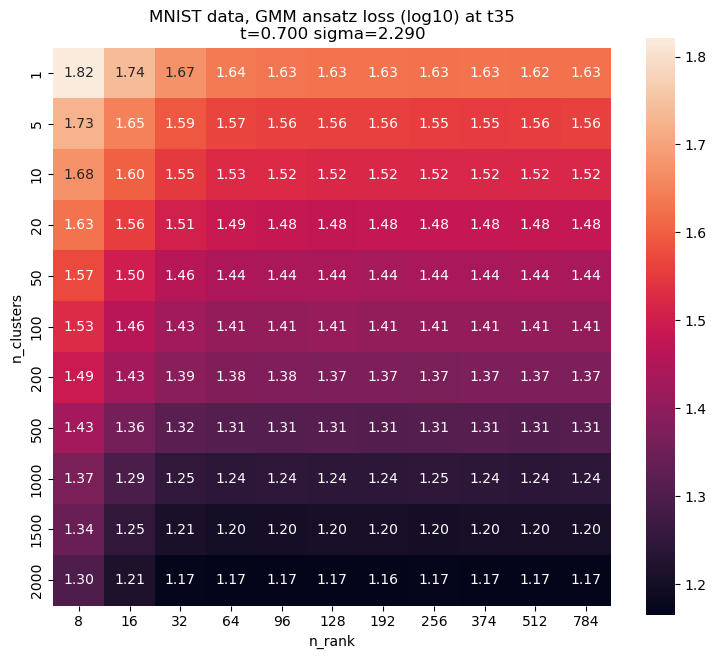

 71%|███████   | 36/51 [01:21<00:31,  2.09s/it]

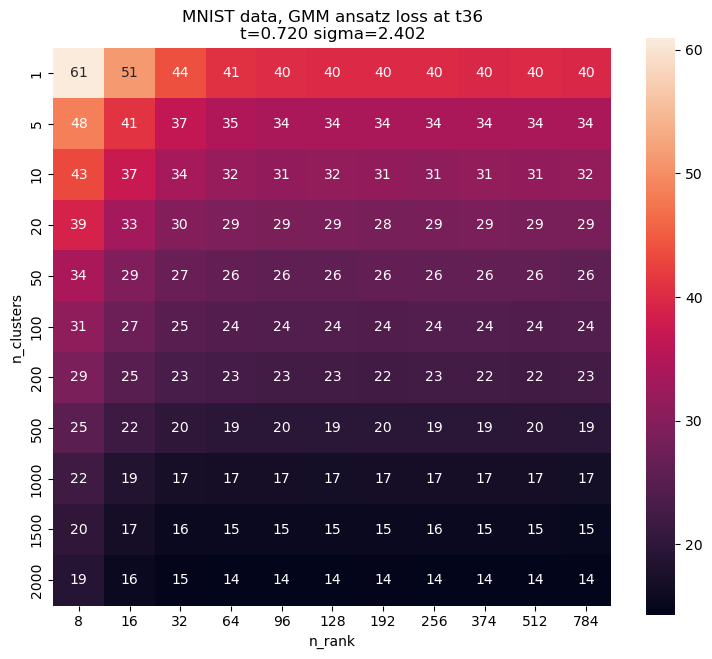

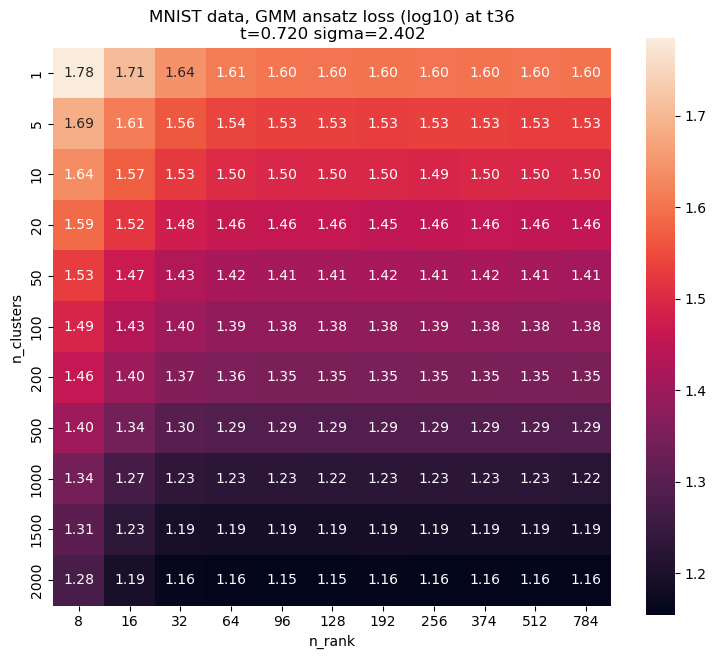

 73%|███████▎  | 37/51 [01:23<00:29,  2.10s/it]

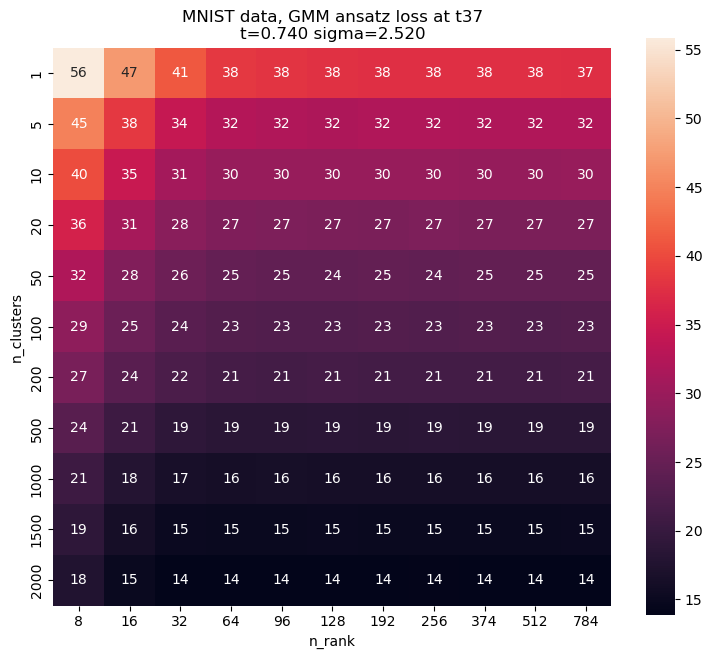

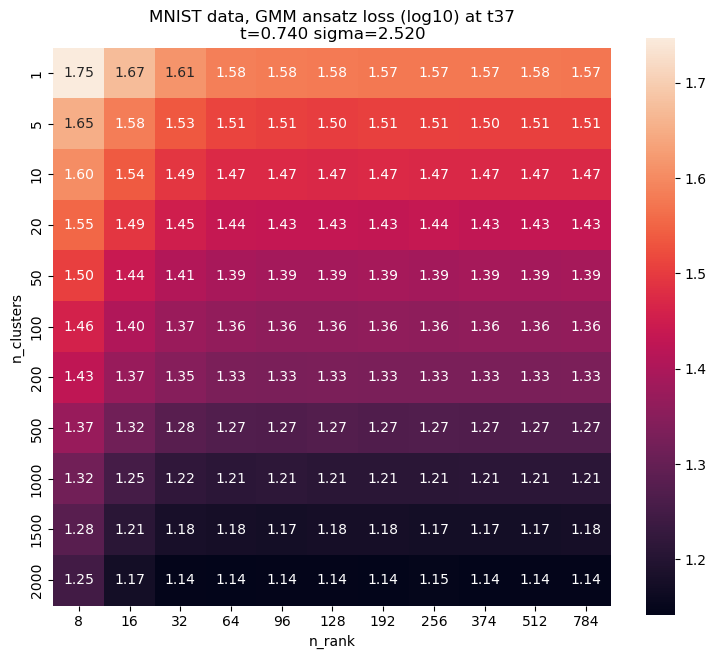

 75%|███████▍  | 38/51 [01:25<00:26,  2.07s/it]

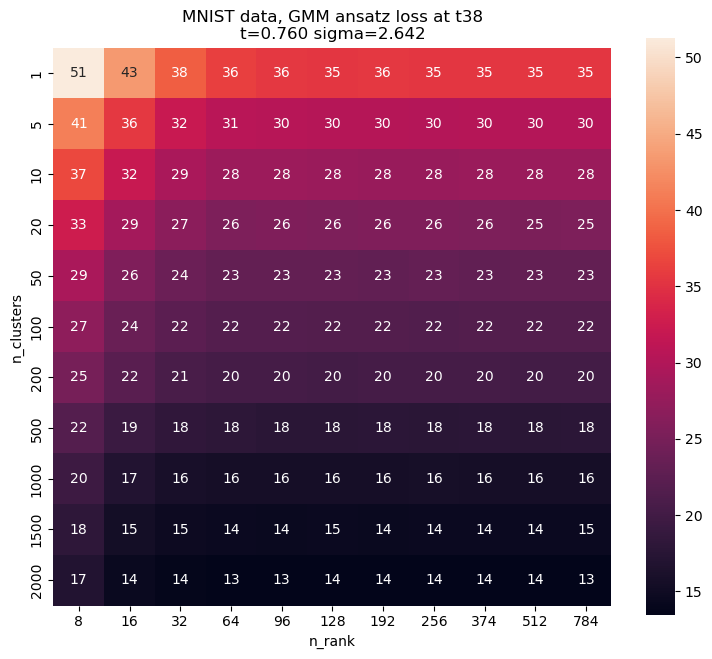

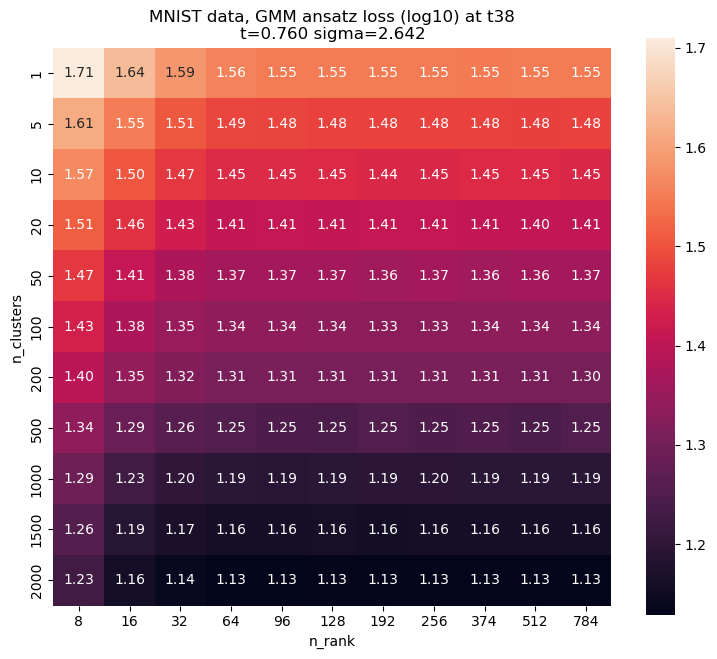

 76%|███████▋  | 39/51 [01:27<00:25,  2.11s/it]

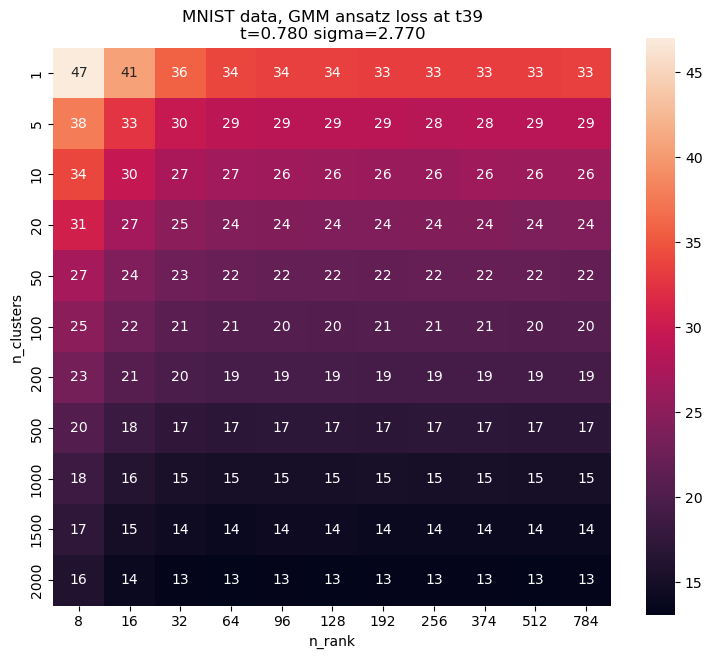

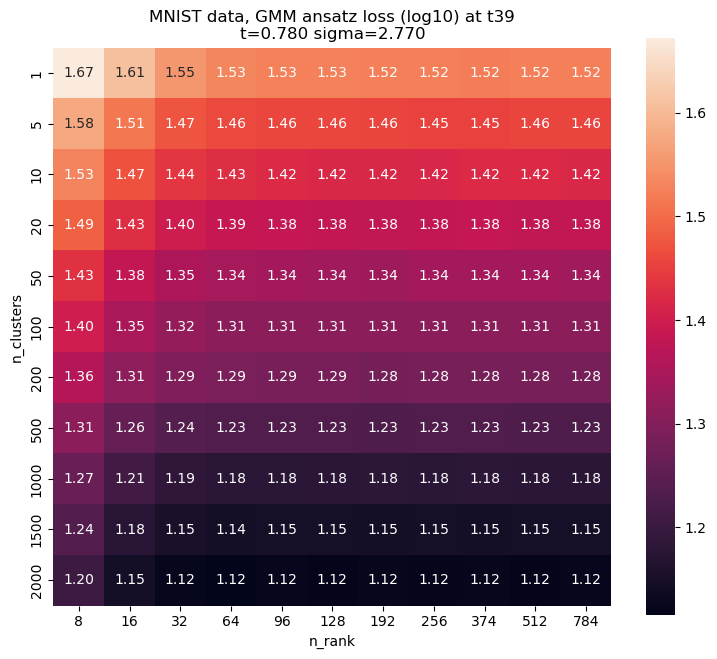

 78%|███████▊  | 40/51 [01:29<00:22,  2.07s/it]

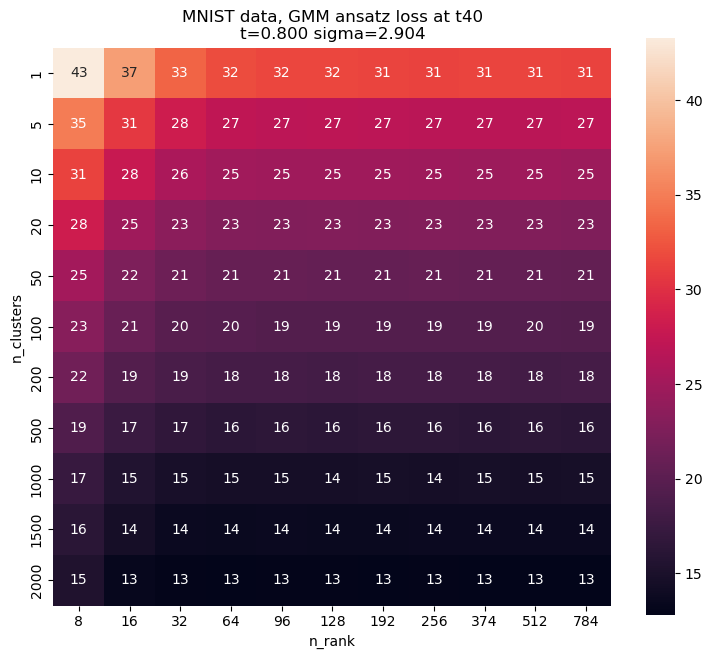

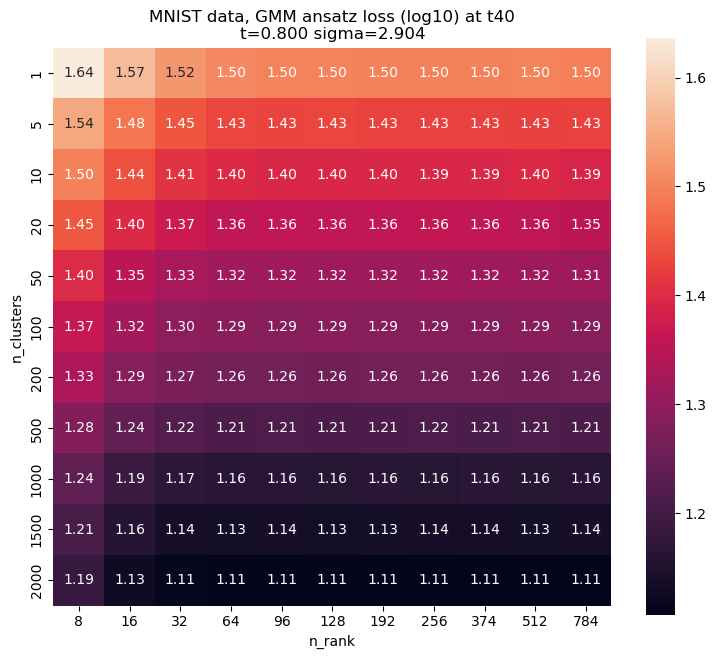

 80%|████████  | 41/51 [01:31<00:20,  2.08s/it]

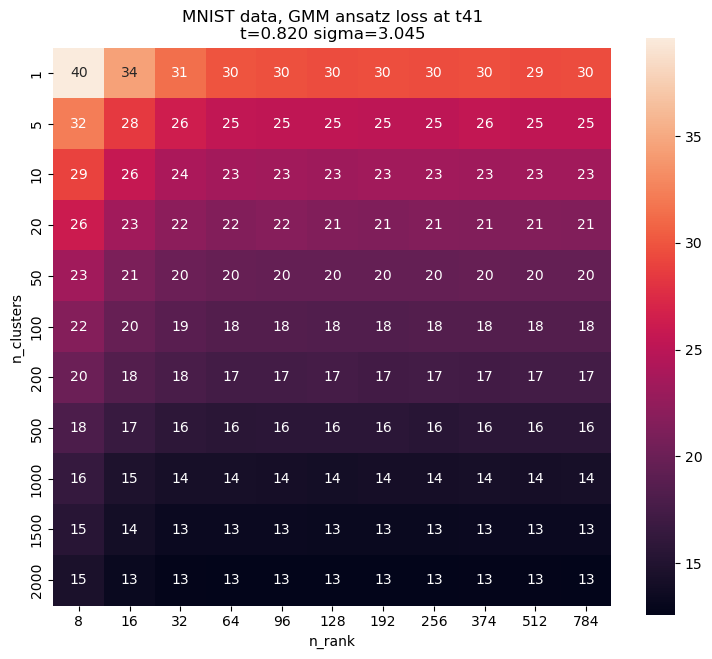

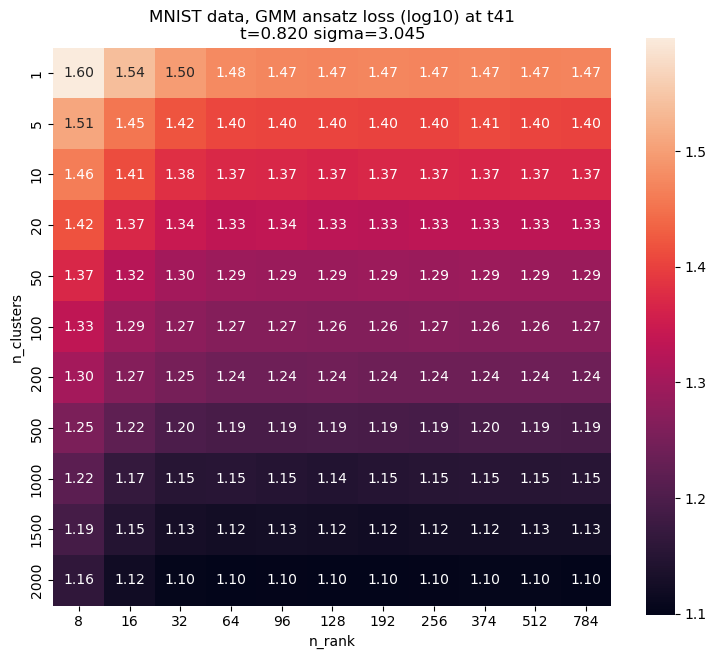

 82%|████████▏ | 42/51 [01:33<00:18,  2.03s/it]

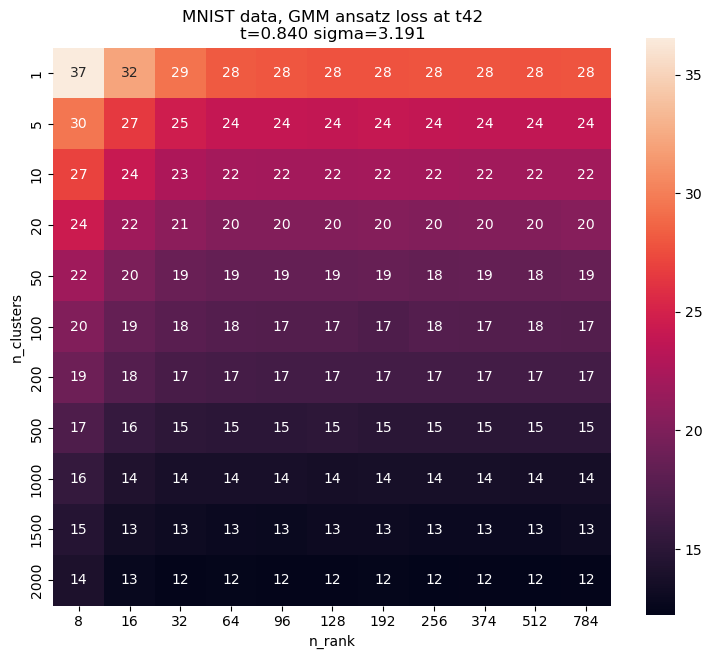

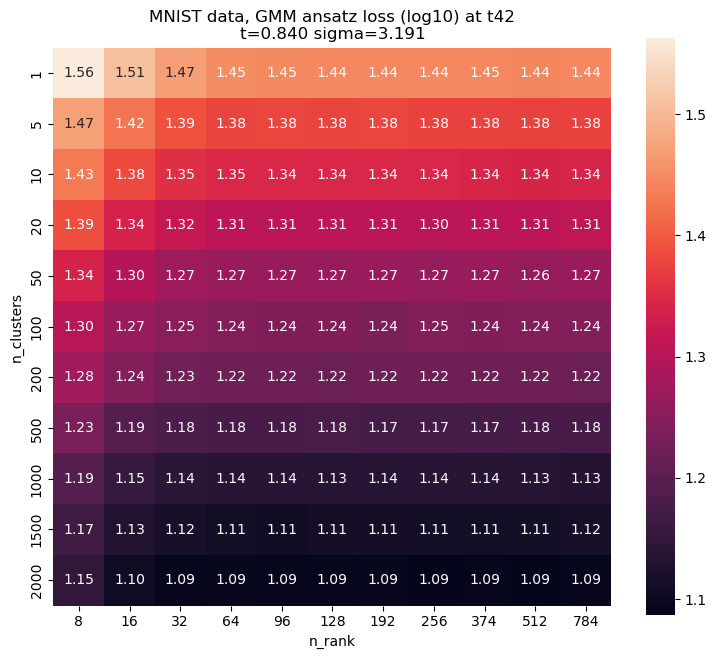

 84%|████████▍ | 43/51 [01:35<00:15,  2.00s/it]

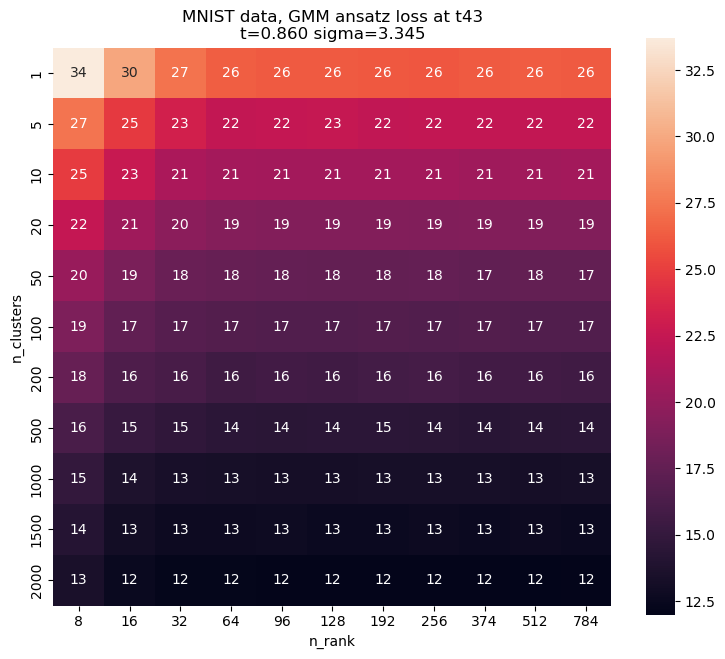

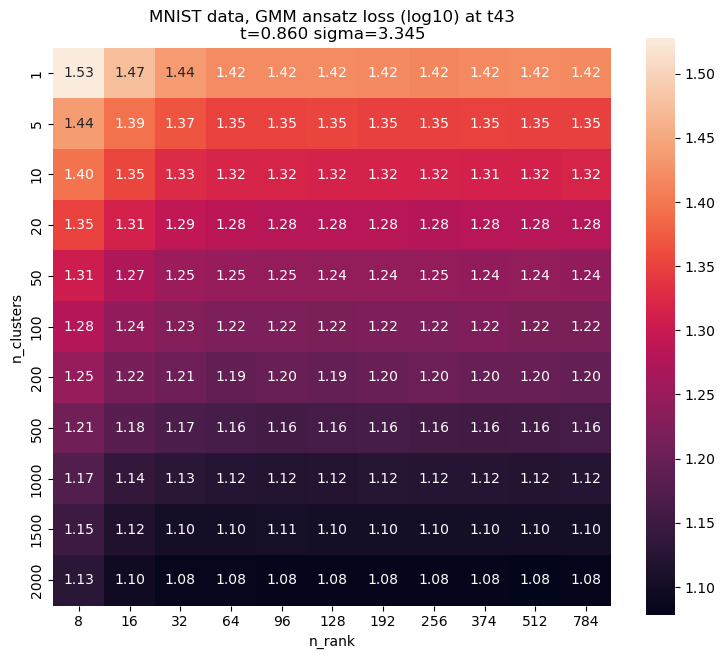

 86%|████████▋ | 44/51 [01:37<00:14,  2.05s/it]

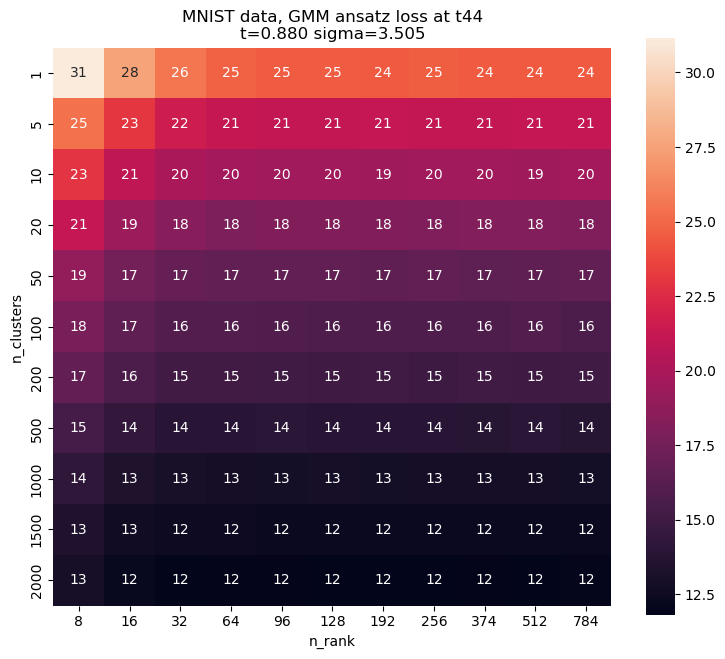

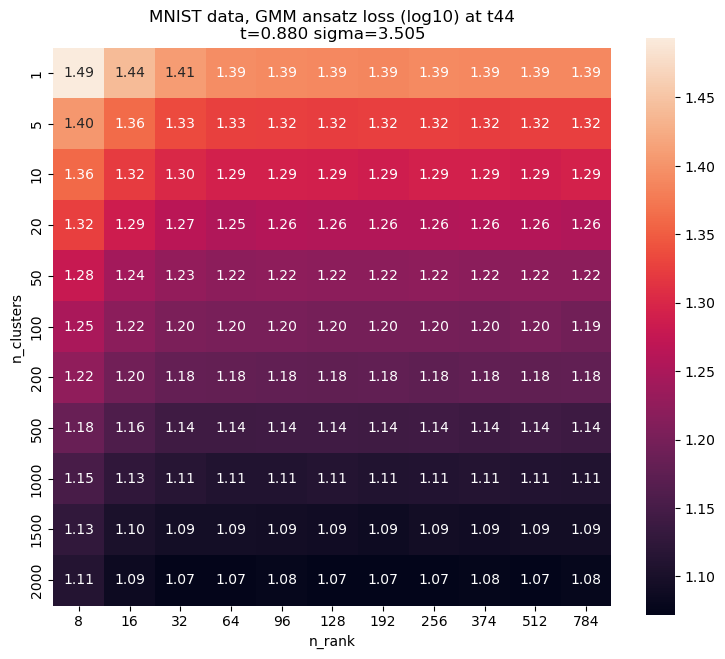

 88%|████████▊ | 45/51 [01:39<00:12,  2.04s/it]

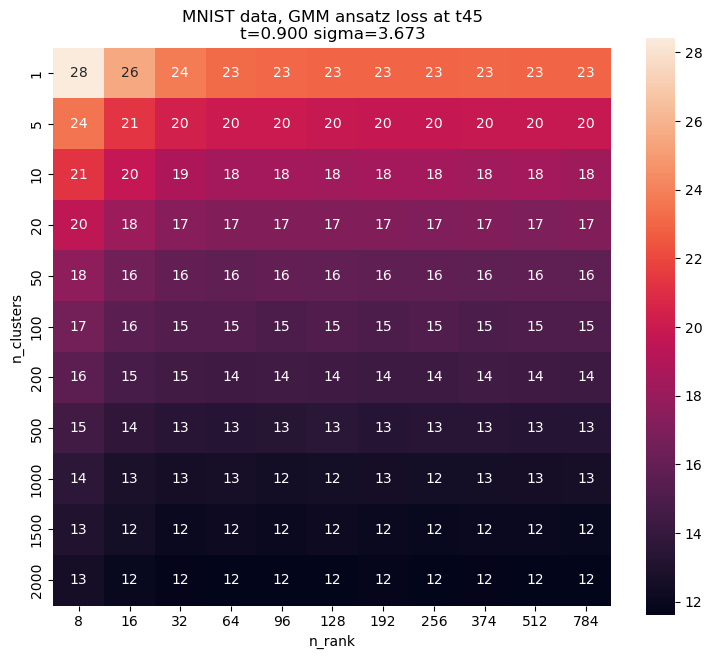

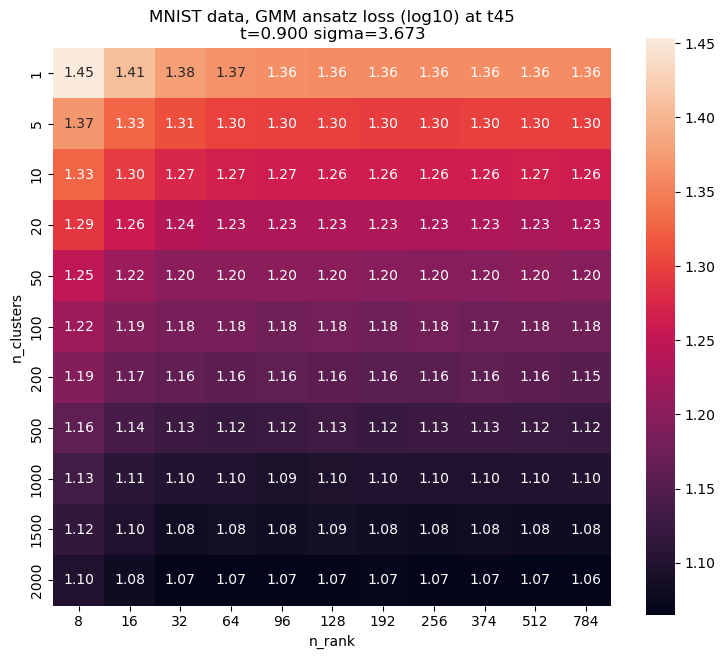

 90%|█████████ | 46/51 [01:41<00:10,  2.06s/it]

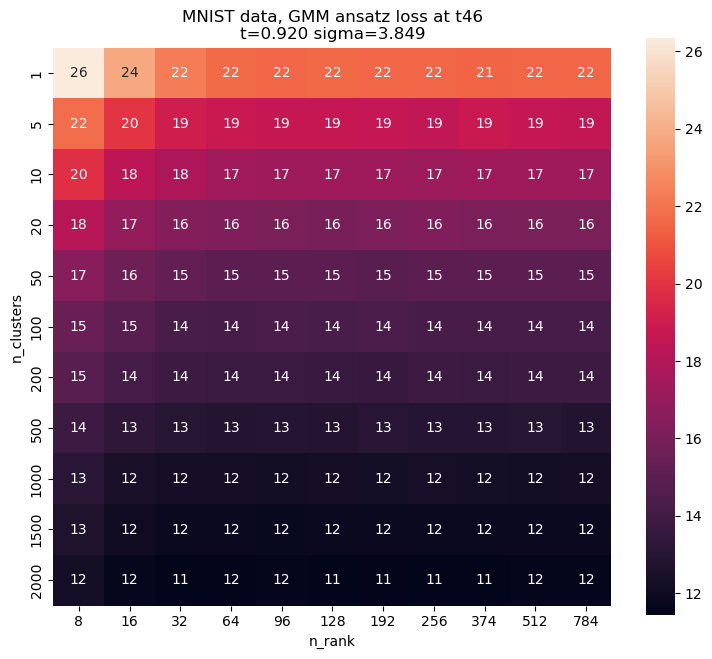

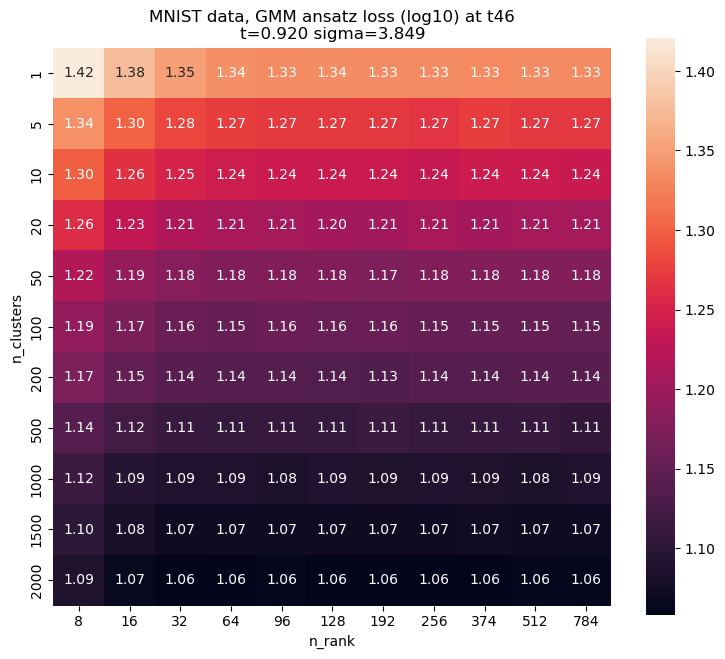

 92%|█████████▏| 47/51 [01:43<00:08,  2.03s/it]

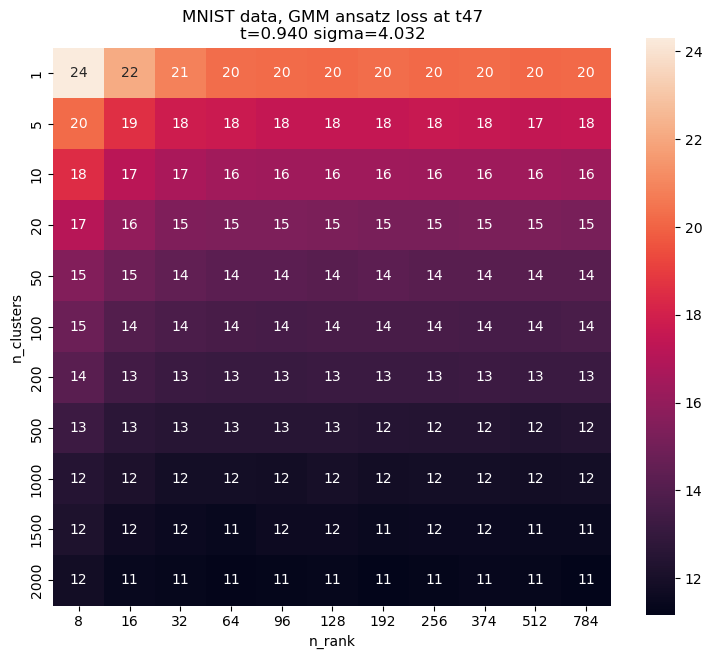

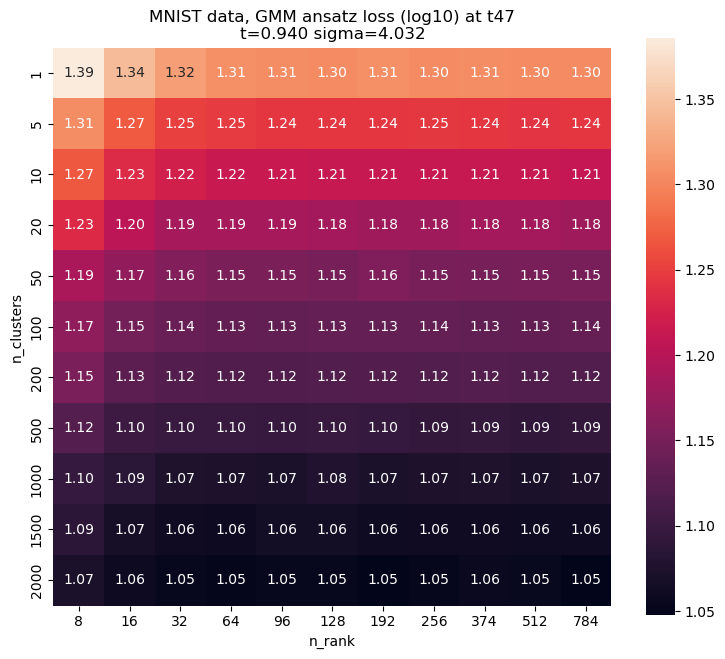

 94%|█████████▍| 48/51 [01:45<00:06,  2.05s/it]

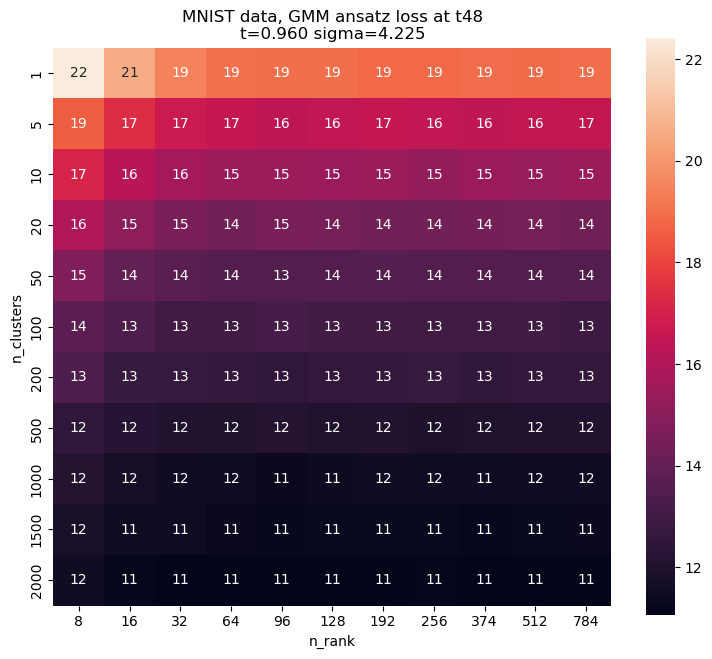

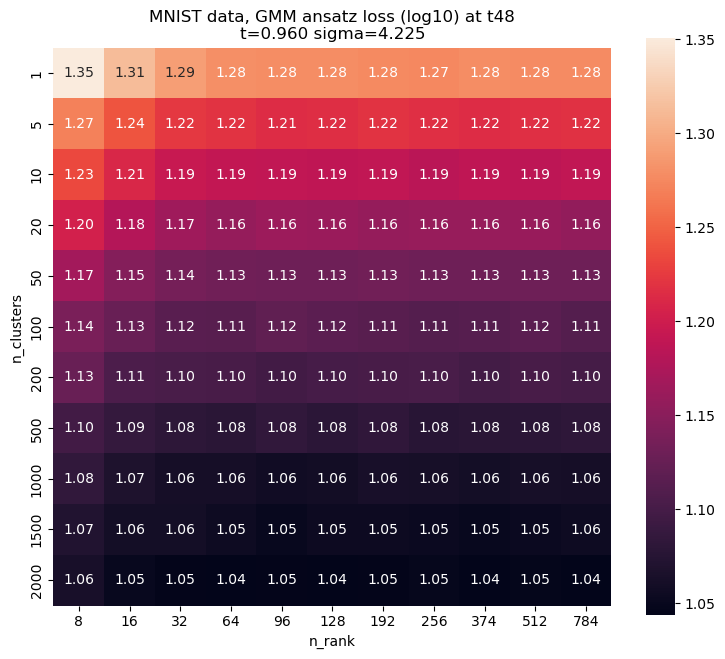

 96%|█████████▌| 49/51 [01:47<00:04,  2.02s/it]

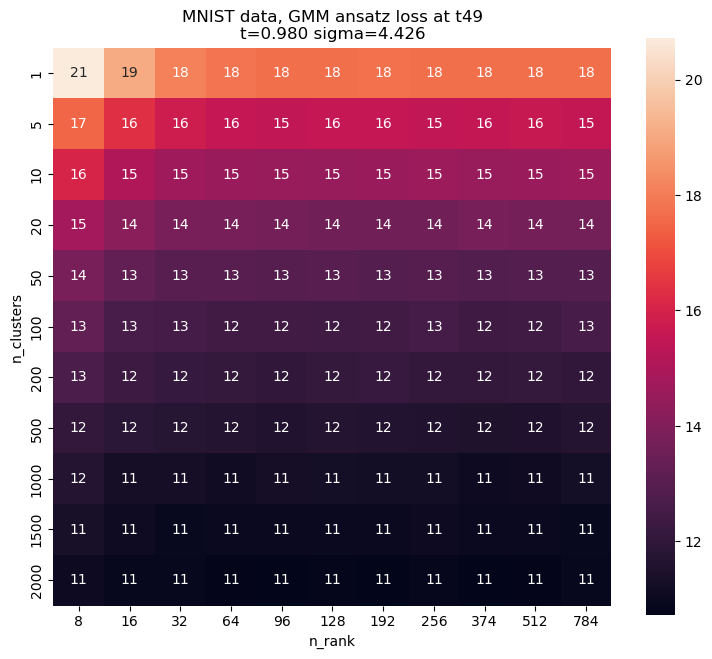

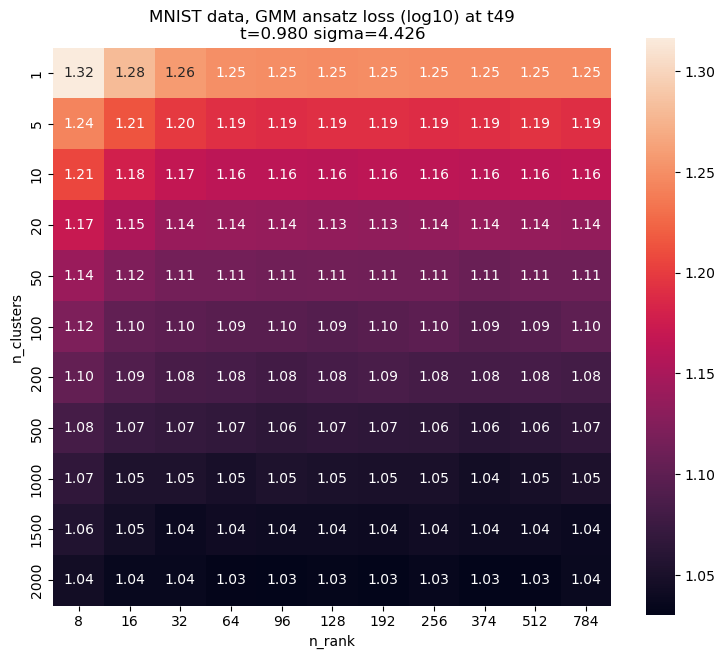

 98%|█████████▊| 50/51 [01:49<00:02,  2.04s/it]

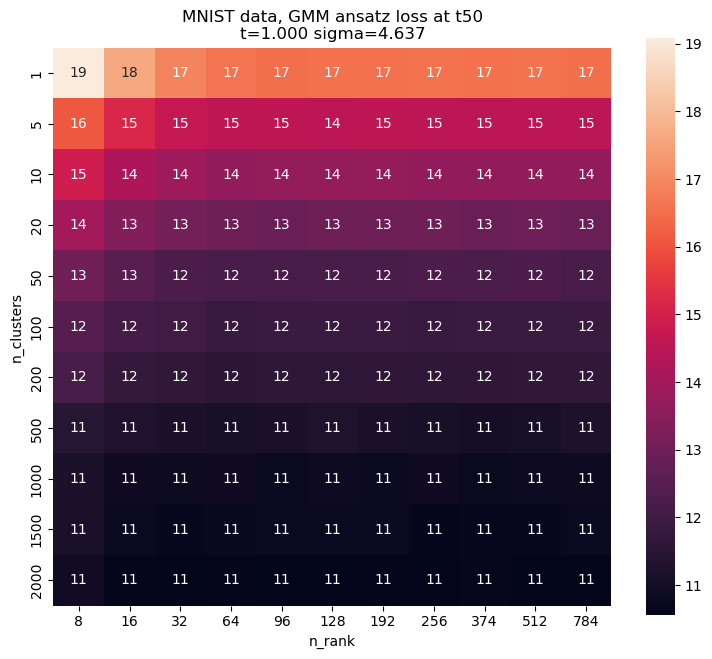

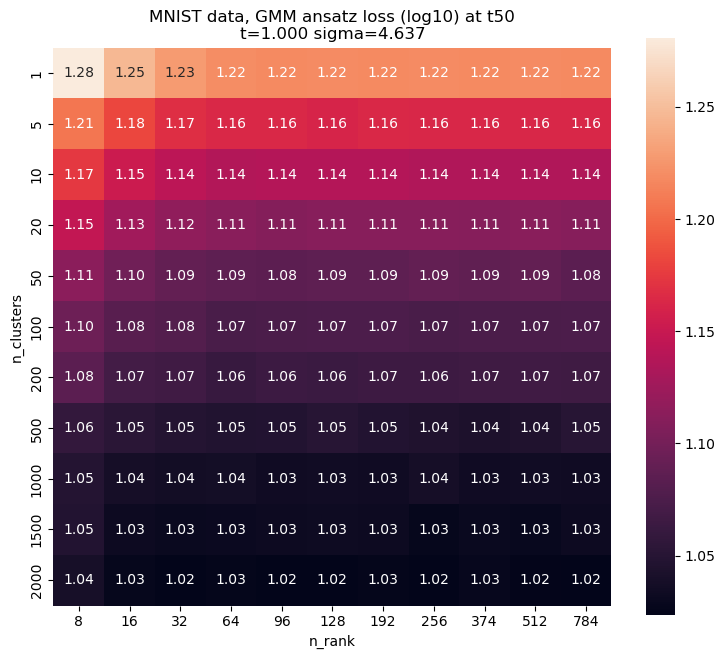

100%|██████████| 51/51 [01:51<00:00,  2.19s/it]


In [49]:
import seaborn as sns
import os
sigma_max = 10
projroot = join("/n/holylabs/LABS/kempner_fellows/Users/binxuwang", 
              "DL_Projects/HaimDiffusionRNNProj")
figdir = join(projroot, "GMM_score_capacity", "Figures")
os.makedirs(figdir, exist_ok=True)
time_pnts = np.linspace(0.001, 1, 51)
for t_idx in trange(len(time_pnts)):
    plt.figure(figsize=[9,7.5])
    sns.heatmap(df_cat.pivot_table(index="n_clusters", columns="n_rank", values=f"loss_t{t_idx}"), 
                annot=True, fmt=".0f")
    plt.axis("image")
    plt.title(f"MNIST data, GMM ansatz loss at t{t_idx}\n"\
        f"t={time_pnts[t_idx]:.3f} sigma={marginal_prob_std(time_pnts[t_idx], sigma_max):.3f}")
    saveallforms(figdir, f"MNIST_gmm_ansatz_kmeans_loss_t{t_idx:02d}")
    plt.show()
    
    plt.figure(figsize=[9,7.5])
    sns.heatmap(df_cat.pivot_table(index="n_clusters", columns="n_rank", values=f"loss_t{t_idx}").map(np.log10), 
                annot=True, fmt=".2f")
    plt.axis("image")
    plt.title(f"MNIST data, GMM ansatz loss (log10) at t{t_idx}\n"\
        f"t={time_pnts[t_idx]:.3f} sigma={marginal_prob_std(time_pnts[t_idx], sigma_max):.3f}")
    saveallforms(figdir, f"MNIST_gmm_ansatz_kmeans_loss_t{t_idx:02d}_log10")
    plt.show()

### Inspect GMM centroids and PCs

In [ ]:
kmeans = MiniBatchKMeans(n_clusters=50, random_state=0, batch_size=2048, verbose=1).fit(Xtrain_norm)

/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Init 1/3 with method k-means++
Inertia for init 1/3: 3131484.747459087
Init 2/3 with method k-means++
Inertia for init 2/3: 3151060.893490196
Init 3/3 with method k-means++
Inertia for init 3/3: 3218909.1866551344
Minibatch step 1/2929: mean batch inertia: 504.90554638370367
Minibatch step 2/2929: mean batch inertia: 348.0095235243042, ewa inertia: 348.0095235243042
Minibatch step 3/2929: mean batch inertia: 338.5212960954484, ewa inertia: 347.36180466047534
Minibatch step 4/2929: mean batch inertia: 337.1054708362559, ewa inertia: 346.6616506073095
Minibatch step 5/2929: mean batch inertia: 331.9809149992216, ewa inertia: 345.6594624262671
Minibatch step 6/2929: mean batch inertia: 334.13124232955556, ewa inertia: 344.87248238399894
Minibatch step 7/2929: mean batch inertia: 329.6379605159852, ewa inertia: 343.8324896910208
Minibatch step 8/2929: mean batch inertia: 330.6879780063477, ewa inertia: 342.9351726486312
Minibatch step 9/2929: mean batch inertia: 332.7818541079047, ewa iner

In [ ]:
kmeans.cluster_centers_.shape

(50, 784)

In [ ]:
# estimate covariance matrix of each cluster
covmats = []
eigval_col = []
eigvec_col = []
for i in range(50):
    print(i, "number of samples", np.sum(kmeans.labels_ == i))
    covmat = torch.tensor(np.cov(Xtrain_norm[kmeans.labels_ == i].T))
    # PCA to reduce dimension
    eigval, eigvec = torch.linalg.eigh(covmat.to(torch.float64))
    eigval = eigval.flip(dims=(0,))  # sort from largest to smallest
    eigvec = eigvec.flip(dims=(1,))  # sort from largest to smallest
    eigval_col.append(eigval)
    eigvec_col.append(eigvec)
    covmats.append(covmat)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


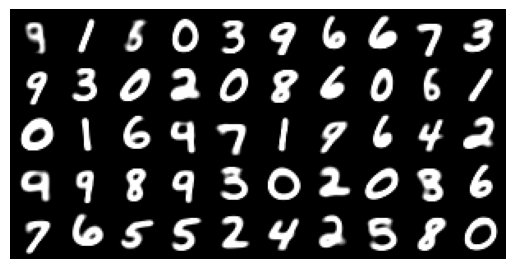

In [ ]:
# visualize the cluster centers
centroids = kmeans.cluster_centers_.reshape(-1, 1, 28, 28)
mtg = make_grid(torch.from_numpy(centroids), nrow=10)
plt.imshow(mtg.permute(1, 2, 0) )
plt.axis("off")
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 151.5, 151.5, -0.5)

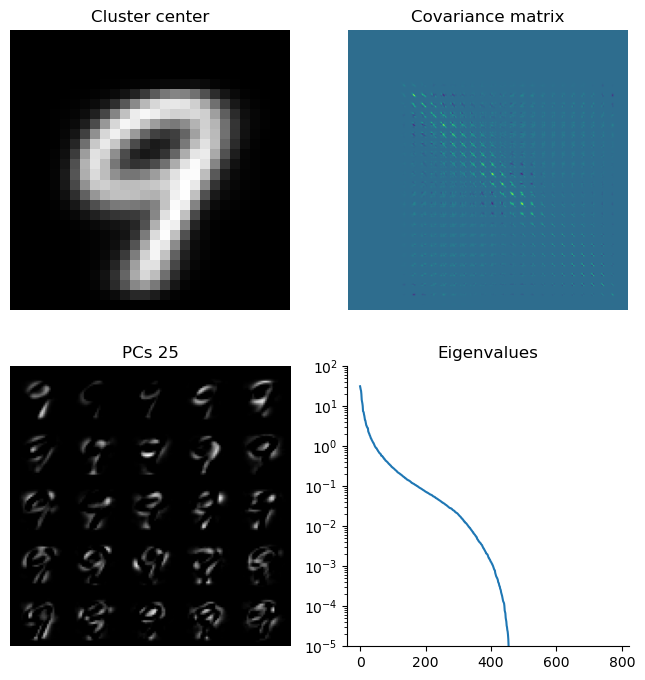

In [ ]:
# visualize the covariance matrix & PC
cid = 5
nPC = 25
fig, axs = plt.subplots(2, 2, figsize=[8, 8])
axs[0,0].imshow(kmeans.cluster_centers_[cid].reshape(28, 28), cmap="gray")
axs[0,0].set_title("Cluster center")
axs[0,0].axis("off")
axs[0,1].imshow(covmats[cid])
axs[0,1].set_title("Covariance matrix")
axs[0,1].axis("off")
axs[1,1].semilogy(eigval_col[cid])
axs[1,1].set_ylim(1E-5, 1E2)
axs[1,1].set_title("Eigenvalues")
nrow = int(np.sqrt(nPC))
mtg = make_grid(eigvec_col[cid].reshape(1, 28, 28, -1).permute(3,0,1,2)[:nPC], nrow=nrow)
axs[1,0].imshow(mtg.permute(1, 2, 0) / mtg.max())
# axs[3].imshow(eigvec_col[cid].reshape(28, 28, -1)[:, :, 0], cmap="gray")
axs[1,0].set_title(f"PCs {nPC}")
axs[1,0].axis("off")

In [ ]:
innerprod = eigvec_col[0] @ eigvec_col[2].T
plt.imshow(innerprod.detach().cpu())
plt.colorbar()
plt.show()

In [ ]:
ndim = Xtrain.shape[1]
gmm_components = 50
sigma_max = 10
batch_size = 2048
torch.manual_seed(42)
score_model_gmm_kmean = GMM_ansatz_net(ndim=ndim,
             n_components=gmm_components, sigma=sigma_max)
# Data PC initialization
score_model_gmm_kmean.logLambdas.data = logLamda_init[None, :].repeat(gmm_components, 1)
score_model_gmm_kmean.Us.data = U_init[None, :, :].repeat(gmm_components, 1, 1)
score_model_gmm_kmean.mus.data = torch.from_numpy(kmeans.cluster_centers_).float()

In [ ]:
score_model_gmm_kmean.Us.shape

torch.Size([50, 784, 784])

In [ ]:
print("U weight norm",score_model_gmm_kmean.Us[0].norm().item())
print("U grad norm", score_model_gmm_kmean.Us.grad[0].norm().item())
print("U grad / weight ratio", score_model_gmm_kmean.Us.grad[0].norm().item() / score_model_gmm_kmean.Us[0].norm().item())
print("Lambda weight norm",score_model_gmm_kmean.logLambdas.norm().item())
print("Lambda grad norm", score_model_gmm_kmean.logLambdas.grad.norm().item())
print ("Lambda grad / weight ratio", score_model_gmm_kmean.logLambdas.grad.norm().item() / score_model_gmm_kmean.logLambdas.norm().item())
print("mu weight norm",score_model_gmm_kmean.mus.norm().item())
print("mu grad norm", score_model_gmm_kmean.mus.grad.norm().item())
print("mu grad / weight ratio", score_model_gmm_kmean.mus.grad.norm().item() / score_model_gmm_kmean.mus.norm().item())
print("pi weight norm",score_model_gmm_kmean.logweights.norm().item())
print("pi grad norm", score_model_gmm_kmean.logweights.grad.norm().item())
print("pi grad / weight ratio", score_model_gmm_kmean.logweights.grad.norm().item() / score_model_gmm_kmean.logweights.norm().item())

U weight norm 29.555498123168945
U grad norm 6.807952672716056e-07
U grad / weight ratio 2.303447109686577e-08
Lambda weight norm 1131.917236328125
Lambda grad norm 0.13710720837116241
Lambda grad / weight ratio 0.00012112829805112818
mu weight norm 155.2152557373047
mu grad norm 1.1955679655075073
mu grad / weight ratio 0.0077026446906156955
pi weight norm 27.922592163085938
pi grad norm 9.486411727266386e-05
pi grad / weight ratio 3.397396513855027e-06


### GMM initialize with correct Kmeans center + covariance

Note that GMM is not a very bad model of images, good parameters of GMM exist (i.e. parameters estimated by Kmeans / EM). 

* 50 full Gaussian GMM with Kmeans mean + cov initialization => 72 loss
* 100 full Gaussian GMM with Kmeans mean + cov initialization => 64 loss
* 200 full Gaussian GMM with Kmeans mean + cov initialization => 56.22 loss 

In [ ]:
from sklearn.cluster import KMeans, MiniBatchKMeans
# kmeans = KMeans(n_clusters=50, random_state=0).fit(Xtrain_norm)
kmeans = MiniBatchKMeans(n_clusters=100, random_state=0, batch_size=2048, verbose=1).fit(Xtrain_norm)

/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Init 1/3 with method k-means++
Inertia for init 1/3: 2813040.8667306923
Init 2/3 with method k-means++
Inertia for init 2/3: 2813712.3577361796
Init 3/3 with method k-means++
Inertia for init 3/3: 2788756.1150021544
Minibatch step 1/2929: mean batch inertia: 459.7645289666375
Minibatch step 2/2929: mean batch inertia: 320.2766292197611, ewa inertia: 320.2766292197611
Minibatch step 3/2929: mean batch inertia: 312.3704697593438, ewa inertia: 319.7369110625659
Minibatch step 4/2929: mean batch inertia: 306.3488045746614, ewa inertia: 318.8229648920945
Minibatch step 5/2929: mean batch inertia: 306.39338884997636, ewa inertia: 317.9744533094789
Minibatch step 6/2929: mean batch inertia: 300.9985250171531, ewa inertia: 316.81558258590155
Minibatch step 7/2929: mean batch inertia: 302.02446171700257, ewa inertia: 315.8058588966462
Minibatch step 8/2929: mean batch inertia: 304.3405165998743, ewa inertia: 315.0231712406475
Minibatch step 9/2929: mean batch inertia: 299.555517826682, ewa iner

In [ ]:
covmats = []
eigval_col = []
eigvec_col = []
freq_col = []
for i in trange(kmeans.n_clusters):
    n_samples = np.sum(kmeans.labels_ == i)
    # print(i, "number of samples", n_samples)
    freq_col.append(n_samples)
    covmat = torch.tensor(np.cov(Xtrain_norm[kmeans.labels_ == i].T))
    # PCA to reduce dimension
    eigval, eigvec = torch.linalg.eigh(covmat.to(torch.float64).cuda())
    eigval = eigval.flip(dims=(0,))  # sort from largest to smallest
    eigvec = eigvec.flip(dims=(1,))  # sort from largest to smallest
    eigval_col.append(eigval)
    eigvec_col.append(eigvec)
    covmats.append(covmat)
eigval_mat = torch.stack(eigval_col, dim=0)
eigvec_mat = torch.stack(eigvec_col, dim=0)
freq_vec = torch.tensor(freq_col)

  0%|          | 0/100 [00:00<?, ?it/s]

In [ ]:
ndim = Xtrain.shape[1]
gmm_components = 100
sigma_max = 10
batch_size = 2048
torch.manual_seed(42)
score_model_gmm_km_cov = GMM_ansatz_net(ndim=ndim,
             n_components=gmm_components, sigma=sigma_max)
# Data PC initialization
# score_model_gmm_km_cov.logLambdas.data = logLamda_init[None, :].repeat(gmm_components, 1)
score_model_gmm_km_cov.logLambdas.data = torch.log(eigval_mat + 1E-5).float()
# score_model_gmm_km_cov.Us.data = U_init[None, :, :].repeat(gmm_components, 1, 1)
score_model_gmm_km_cov.Us.data = eigvec_mat.float()
score_model_gmm_km_cov.mus.data = torch.from_numpy(kmeans.cluster_centers_).float()
score_model_gmm_km_cov.logweights.data = torch.log(freq_vec / freq_vec.sum())

In [ ]:

df = pd.DataFrame(df_col)